In [3]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [4]:
df = pd.read_excel('data_10000_samples_clean.xlsx')
df

,Time,Temp,Weather,Wind,Humidity,Barometer,Visibility,Day,Month,Year
0,12:00 SA,22,Passing clouds.,4,88,1016,100,1,3,2022
1,12:30 SA,22,Passing clouds.,4,88,1015,100,1,3,2022
2,1:00 SA,22,Passing clouds.,4,83,1015,100,1,3,2022
3,1:30 SA,21,Passing clouds.,4,88,1015,8,1,3,2022
4,2:00 SA,21,Passing clouds.,2,88,1015,8,1,3,2022
...,...,...,...,...,...,...,...,...,...,...
9996,6:00 CH,26,Partly cloudy.,22,89,1011,7,24,10,2022
9997,7:00 CH,25,Light rain. Partly cloudy.,2,89,1012,6,24,10,2022
9998,7:30 CH,25,Light rain. Partly cloudy.,2,89,1012,6,24,10,2022
9999,8:30 CH,25,Light rain. Partly cloudy.,9,89,1013,6,24,10,2022


### Feature Engineering: Window Features

In [5]:
class WindowGenerator():
    def __init__(self, input_width, label_width, shift,
                 train_df, val_df, test_df,
                 label_columns=None):
        # Store the raw data.
        self.train_df = train_df
        self.val_df = val_df
        self.test_df = test_df

        # Work out the label column indices.
        self.label_columns = label_columns
        if label_columns is not None:
            self.label_columns_indices = {name: i for i, name in enumerate(label_columns)} 
        
        self.column_indices = {name: i for i, name in enumerate(train_df.columns)} 

        # Work out the window parameters.
        self.input_width = input_width
        self.label_width = label_width
        self.shift = shift

        self.total_window_size = input_width + shift

        self.input_slice = slice(0, input_width)
        self.input_indices = np.arange(self.total_window_size)[self.input_slice]

        self.label_start = self.total_window_size - self.label_width
        self.labels_slice = slice(self.label_start, None)
        self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

    def __repr__(self):
        return '\n'.join([
            f'Total window size: {self.total_window_size}',
            f'Input indices: {self.input_indices}',
            f'Label indices: {self.label_indices}',
            f'Label column name(s): {self.label_columns}'
        ])

    def train(self):
        return self.make_dataset(self.train_df)

    def val(self):
        return self.make_dataset(self.val_df)

    def test(self):
        return self.make_dataset(self.test_df)

In [6]:
def split_window(self, features):
    inputs = features[:, self.input_slice, :]
    labels = features[:, self.labels_slice, :]
    if self.label_columns is not None:
        labels = tf.stack(
            [labels[:, :, self.column_indices[name]] for name in self.label_columns],
            axis=-1)

    inputs.set_shape([None, self.input_width, None])
    labels.set_shape([None, self.label_width, None])

    return inputs, labels

WindowGenerator.split_window = split_window


In [7]:
def make_dataset(self, data):
    data = np.array(data, dtype=np.float32)
    ds = tf.keras.utils.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=32,)
    ds = ds.map(self.split_window)

    return ds

WindowGenerator.make_dataset = make_dataset

In [8]:
@property
def train(self):
    return self.make_dataset(self.train_df)

@property
def val(self):
    return self.make_dataset(self.val_df)

@property
def test(self):
    return self.make_dataset(self.test_df)

@property
def example(self):
    result = getattr(self, '_example', None)
    if result is None:
        # No example batch was found, so get one from the `.train` dataset
        result = next(iter(self.test))
        # And cache it for next time
        self._example = result
    return result

In [9]:
WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

In [10]:
OUT_STEPS = 24
def multi_window_func(train_df,val_df,test_df):
    multi_window = WindowGenerator(input_width=24,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS,
                              train_df = train_df,
                              val_df = val_df,
                              test_df = test_df,
                              label_columns = ['Temp','Wind','Humidity','Barometer'])
    return multi_window

In [11]:
multi_window_list = []
for i in range(0,df.shape[0] - 48*2,48*2):
    train_df = df[['Temp','Wind','Humidity','Barometer']][i:i+48]
    val_df = df[['Temp','Wind','Humidity','Barometer']][i+48:i+48*2]
    test_df = df[['Temp','Wind','Humidity','Barometer']][i+48:i+48*2]
    multi_window_list.append(multi_window_func(train_df,val_df,test_df))

In [12]:
len(multi_window_list)

104

## Training

In [27]:
import tensorflow as tf
from sklearn.metrics import r2_score
MAX_EPOCHS = 100
def r_squared(y_true, y_pred):
    """
    Tính R-squared (R²) score.

    Tham số:
    y_true: Tensor, giá trị thực tế.
    y_pred: Tensor, giá trị dự báo.

    Trả về:
    r2_score: Tensor, giá trị R-squared score.
    """
    mean_true = tf.reduce_mean(y_true)
    total_sum_squares = tf.reduce_sum(tf.square(y_true - mean_true))
    residual_sum_squares = tf.reduce_sum(tf.square(y_true - y_pred))
    r2 = 1 - (residual_sum_squares / total_sum_squares)
    return r2

def compile_and_fit(model, window, patience=2):

    model.compile(loss=tf.losses.MeanSquaredError(),
                  optimizer=tf.optimizers.Adam(),
                  metrics=[r_squared,tf.metrics.MeanAbsoluteError()])
    history = model.fit(window.train, epochs=MAX_EPOCHS,
                        validation_data=window.val)
    return history


#### 1.Model Linear

In [14]:
num_features = train_df.shape[1]
multi_linear_model = tf.keras.Sequential([
    tf.keras.layers.Lambda(lambda x: x[:, -12:, :]),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros()),
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

In [15]:
Table_Linear = []

In [16]:
Total_r_squared = 0
Total_mean_absolute_error = 0
Total_val_r_squared = 0
Total_val_mean_absolute_error = 0


for multi_window in multi_window_list:
    history = compile_and_fit(multi_linear_model, multi_window)
    r_squared_ = round(history.history['r_squared'][-1],4)
    mean_absolute_error_ = round(history.history['mean_absolute_error'][-1],4)
    val_r_squared_ = round(history.history['val_r_squared'][-1],4)
    val_mean_absolute_error_ = round(history.history['val_mean_absolute_error'][-1],4)
    Table_Linear.append([r_squared_,mean_absolute_error_,val_r_squared_,val_mean_absolute_error_])
    Total_r_squared = Total_r_squared + r_squared_
    Total_mean_absolute_error = Total_mean_absolute_error + mean_absolute_error_
    Total_val_r_squared = Total_val_r_squared + val_r_squared_
    Total_val_mean_absolute_error = Total_val_mean_absolute_error + val_mean_absolute_error_
    
Total_r_squared = Total_r_squared/len(multi_window_list)
Total_mean_absolute_error = Total_mean_absolute_error/len(multi_window_list)
Total_val_r_squared = Total_val_r_squared/len(multi_window_list)
Total_val_mean_absolute_error = Total_val_mean_absolute_error/len(multi_window_list)
Table_Linear.append([Total_r_squared,Total_mean_absolute_error,Total_val_r_squared,Total_val_mean_absolute_error])

Epoch 1/200
1/1 [==============================] - 1s 755ms/step - loss: 259096.8906 - r_squared: -0.4414 - mean_absolute_error: 281.6875 - val_loss: 252141.4375 - val_r_squared: -0.4015 - val_mean_absolute_error: 271.8050
Epoch 2/200
1/1 [==============================] - 0s 79ms/step - loss: 251705.2500 - r_squared: -0.4003 - mean_absolute_error: 269.7612 - val_loss: 244990.5000 - val_r_squared: -0.3617 - val_mean_absolute_error: 264.0699
Epoch 3/200
1/1 [==============================] - 0s 83ms/step - loss: 244628.9375 - r_squared: -0.3609 - mean_absolute_error: 261.7872 - val_loss: 238061.2344 - val_r_squared: -0.3232 - val_mean_absolute_error: 259.2858
Epoch 4/200
1/1 [==============================] - 0s 84ms/step - loss: 237781.5469 - r_squared: -0.3229 - mean_absolute_error: 256.8185 - val_loss: 231315.1406 - val_r_squared: -0.2857 - val_mean_absolute_error: 252.9871
Epoch 5/200
1/1 [==============================] - 0s 80ms/step - loss: 231119.0000 - r_squared: -0.2858 - mean

Epoch 76/200
1/1 [==============================] - 0s 84ms/step - loss: 11584.4092 - r_squared: 0.9356 - mean_absolute_error: 54.0686 - val_loss: 10447.7656 - val_r_squared: 0.9419 - val_mean_absolute_error: 53.8637
Epoch 77/200
1/1 [==============================] - 0s 78ms/step - loss: 10924.9580 - r_squared: 0.9392 - mean_absolute_error: 52.5112 - val_loss: 9830.9980 - val_r_squared: 0.9454 - val_mean_absolute_error: 52.3285
Epoch 78/200
1/1 [==============================] - 0s 40ms/step - loss: 10297.5527 - r_squared: 0.9427 - mean_absolute_error: 51.0108 - val_loss: 9245.0850 - val_r_squared: 0.9486 - val_mean_absolute_error: 50.8207
Epoch 79/200
1/1 [==============================] - 0s 38ms/step - loss: 9700.9521 - r_squared: 0.9460 - mean_absolute_error: 49.5471 - val_loss: 8688.7920 - val_r_squared: 0.9517 - val_mean_absolute_error: 49.3361
Epoch 80/200
1/1 [==============================] - 0s 47ms/step - loss: 9133.9316 - r_squared: 0.9492 - mean_absolute_error: 48.0710 - 

1/1 [==============================] - 0s 48ms/step - loss: 823.9879 - r_squared: 0.9954 - mean_absolute_error: 14.4018 - val_loss: 627.8397 - val_r_squared: 0.9965 - val_mean_absolute_error: 15.0993
Epoch 115/200
1/1 [==============================] - 0s 37ms/step - loss: 758.7132 - r_squared: 0.9958 - mean_absolute_error: 13.8135 - val_loss: 573.5005 - val_r_squared: 0.9968 - val_mean_absolute_error: 14.5349
Epoch 116/200
1/1 [==============================] - 0s 39ms/step - loss: 698.0826 - r_squared: 0.9961 - mean_absolute_error: 13.2447 - val_loss: 523.3229 - val_r_squared: 0.9971 - val_mean_absolute_error: 13.9854
Epoch 117/200
1/1 [==============================] - 0s 41ms/step - loss: 641.7968 - r_squared: 0.9964 - mean_absolute_error: 12.6969 - val_loss: 477.0359 - val_r_squared: 0.9973 - val_mean_absolute_error: 13.4512
Epoch 118/200
1/1 [==============================] - 0s 36ms/step - loss: 589.5903 - r_squared: 0.9967 - mean_absolute_error: 12.1686 - val_loss: 434.3892 - v

Epoch 153/200
1/1 [==============================] - 0s 48ms/step - loss: 16.4218 - r_squared: 0.9999 - mean_absolute_error: 2.0318 - val_loss: 22.8932 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1426
Epoch 154/200
1/1 [==============================] - 0s 40ms/step - loss: 14.4907 - r_squared: 0.9999 - mean_absolute_error: 1.9086 - val_loss: 22.6122 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0739
Epoch 155/200
1/1 [==============================] - 0s 42ms/step - loss: 12.7640 - r_squared: 0.9999 - mean_absolute_error: 1.7907 - val_loss: 22.4472 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0198
Epoch 156/200
1/1 [==============================] - 0s 38ms/step - loss: 11.2237 - r_squared: 0.9999 - mean_absolute_error: 1.6786 - val_loss: 22.3834 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0082
Epoch 157/200
1/1 [==============================] - 0s 44ms/step - loss: 9.8502 - r_squared: 0.9999 - mean_absolute_error: 1.5724 - val_loss: 22.4076 - val_r_s

1/1 [==============================] - 0s 43ms/step - loss: 2.2250 - r_squared: 1.0000 - mean_absolute_error: 1.3015 - val_loss: 28.1201 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4812
Epoch 32/200
1/1 [==============================] - 0s 39ms/step - loss: 2.1750 - r_squared: 1.0000 - mean_absolute_error: 1.3390 - val_loss: 26.9274 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3034
Epoch 33/200
1/1 [==============================] - 0s 41ms/step - loss: 1.6916 - r_squared: 1.0000 - mean_absolute_error: 1.1842 - val_loss: 25.8729 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.0550
Epoch 34/200
1/1 [==============================] - 0s 49ms/step - loss: 1.2364 - r_squared: 1.0000 - mean_absolute_error: 0.9133 - val_loss: 25.5476 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.8962
Epoch 35/200
1/1 [==============================] - 0s 38ms/step - loss: 1.1694 - r_squared: 1.0000 - mean_absolute_error: 0.9626 - val_loss: 25.8564 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 37ms/step - loss: 9.1211e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0269 - val_loss: 25.7833 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1441
Epoch 110/200
1/1 [==============================] - 0s 38ms/step - loss: 6.9230e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0240 - val_loss: 25.7227 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1385
Epoch 111/200
1/1 [==============================] - 0s 41ms/step - loss: 4.8359e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0185 - val_loss: 25.6690 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1331
Epoch 112/200
1/1 [==============================] - 0s 39ms/step - loss: 5.7473e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0217 - val_loss: 25.6614 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1312
Epoch 113/200
1/1 [==============================] - 0s 41ms/step - loss: 5.8213e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0218 - val_loss: 25.7038 - val_r

1/1 [==============================] - 0s 42ms/step - loss: 2.9263e-07 - r_squared: 1.0000 - mean_absolute_error: 4.5070e-04 - val_loss: 25.7351 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1386
Epoch 186/200
1/1 [==============================] - 0s 48ms/step - loss: 3.0001e-07 - r_squared: 1.0000 - mean_absolute_error: 4.7859e-04 - val_loss: 25.7346 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1385
Epoch 187/200
1/1 [==============================] - 0s 39ms/step - loss: 2.3860e-07 - r_squared: 1.0000 - mean_absolute_error: 4.4911e-04 - val_loss: 25.7337 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1384
Epoch 188/200
1/1 [==============================] - 0s 45ms/step - loss: 2.1226e-07 - r_squared: 1.0000 - mean_absolute_error: 3.8895e-04 - val_loss: 25.7330 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1384
Epoch 189/200
1/1 [==============================] - 0s 39ms/step - loss: 2.0573e-07 - r_squared: 1.0000 - mean_absolute_error: 4.0620e-04 - val_l

Epoch 24/200
1/1 [==============================] - 0s 49ms/step - loss: 3.3514 - r_squared: 1.0000 - mean_absolute_error: 1.7042 - val_loss: 11.1090 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8213
Epoch 25/200
1/1 [==============================] - 0s 43ms/step - loss: 2.9297 - r_squared: 1.0000 - mean_absolute_error: 1.5405 - val_loss: 10.2294 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6948
Epoch 26/200
1/1 [==============================] - 0s 50ms/step - loss: 2.8080 - r_squared: 1.0000 - mean_absolute_error: 1.4049 - val_loss: 9.3733 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4742
Epoch 27/200
1/1 [==============================] - 0s 38ms/step - loss: 2.9484 - r_squared: 1.0000 - mean_absolute_error: 1.5052 - val_loss: 8.4234 - val_r_squared: 1.0000 - val_mean_absolute_error: 2.2770
Epoch 28/200
1/1 [==============================] - 0s 42ms/step - loss: 2.8280 - r_squared: 1.0000 - mean_absolute_error: 1.5321 - val_loss: 7.4611 - val_r_squared: 1.00

Epoch 103/200
1/1 [==============================] - 0s 43ms/step - loss: 7.9070e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0235 - val_loss: 6.8275 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.7435
Epoch 104/200
1/1 [==============================] - 0s 36ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0291 - val_loss: 6.8118 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.7397
Epoch 105/200
1/1 [==============================] - 0s 38ms/step - loss: 0.0014 - r_squared: 1.0000 - mean_absolute_error: 0.0336 - val_loss: 6.8049 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.7377
Epoch 106/200
1/1 [==============================] - 0s 42ms/step - loss: 9.2223e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0275 - val_loss: 6.8111 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.7384
Epoch 107/200
1/1 [==============================] - 0s 48ms/step - loss: 5.4585e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0188 - val_loss: 6.8275 - val_

Epoch 142/200
1/1 [==============================] - 0s 38ms/step - loss: 3.0137e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0052 - val_loss: 6.8339 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.7411
Epoch 143/200
1/1 [==============================] - 0s 42ms/step - loss: 2.0651e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0041 - val_loss: 6.8291 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.7414
Epoch 144/200
1/1 [==============================] - 0s 39ms/step - loss: 1.2337e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0028 - val_loss: 6.8234 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.7409
Epoch 145/200
1/1 [==============================] - 0s 42ms/step - loss: 2.0862e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0043 - val_loss: 6.8210 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.7401
Epoch 146/200
1/1 [==============================] - 0s 36ms/step - loss: 1.8294e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0039 - val_loss: 6.823

1/1 [==============================] - 0s 42ms/step - loss: 4.4209 - r_squared: 1.0000 - mean_absolute_error: 1.7299 - val_loss: 82.2963 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.6061
Epoch 19/200
1/1 [==============================] - 0s 48ms/step - loss: 4.8073 - r_squared: 1.0000 - mean_absolute_error: 1.9173 - val_loss: 74.0756 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.4352
Epoch 20/200
1/1 [==============================] - 0s 42ms/step - loss: 8.3145 - r_squared: 1.0000 - mean_absolute_error: 2.6884 - val_loss: 69.2346 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.2019
Epoch 21/200
1/1 [==============================] - 0s 42ms/step - loss: 10.3090 - r_squared: 0.9999 - mean_absolute_error: 2.9460 - val_loss: 67.6496 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.9504
Epoch 22/200
1/1 [==============================] - 0s 40ms/step - loss: 8.9899 - r_squared: 0.9999 - mean_absolute_error: 2.6343 - val_loss: 70.5825 - val_r_squared: 0.9996 - val_

1/1 [==============================] - 0s 38ms/step - loss: 0.0044 - r_squared: 1.0000 - mean_absolute_error: 0.0619 - val_loss: 78.6143 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.2739
Epoch 97/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0048 - r_squared: 1.0000 - mean_absolute_error: 0.0638 - val_loss: 78.4501 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.2698
Epoch 98/200
1/1 [==============================] - 0s 36ms/step - loss: 0.0027 - r_squared: 1.0000 - mean_absolute_error: 0.0443 - val_loss: 78.2006 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.2612
Epoch 99/200
1/1 [==============================] - 0s 40ms/step - loss: 0.0020 - r_squared: 1.0000 - mean_absolute_error: 0.0343 - val_loss: 78.0115 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.2535
Epoch 100/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0029 - r_squared: 1.0000 - mean_absolute_error: 0.0503 - val_loss: 77.9779 - val_r_squared: 0.9996 - val_

Epoch 135/200
1/1 [==============================] - 0s 47ms/step - loss: 5.5941e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0066 - val_loss: 78.2554 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.2599
Epoch 136/200
1/1 [==============================] - 0s 38ms/step - loss: 6.0276e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0065 - val_loss: 78.2698 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.2610
Epoch 137/200
1/1 [==============================] - 0s 41ms/step - loss: 7.1596e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0077 - val_loss: 78.2785 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.2616
Epoch 138/200
1/1 [==============================] - 0s 36ms/step - loss: 5.4293e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0065 - val_loss: 78.2797 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.2615
Epoch 139/200
1/1 [==============================] - 0s 43ms/step - loss: 3.1881e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0047 - val_loss: 7

1/1 [==============================] - 0s 43ms/step - loss: 16.7588 - r_squared: 0.9999 - mean_absolute_error: 3.6715 - val_loss: 26.7903 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.0004
Epoch 12/200
1/1 [==============================] - 0s 47ms/step - loss: 10.8089 - r_squared: 0.9999 - mean_absolute_error: 2.5048 - val_loss: 30.6547 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2476
Epoch 13/200
1/1 [==============================] - 0s 40ms/step - loss: 12.4211 - r_squared: 0.9999 - mean_absolute_error: 2.8641 - val_loss: 35.3489 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9646
Epoch 14/200
1/1 [==============================] - 0s 43ms/step - loss: 16.7690 - r_squared: 0.9999 - mean_absolute_error: 3.7324 - val_loss: 34.0153 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0170
Epoch 15/200
1/1 [==============================] - 0s 48ms/step - loss: 16.7489 - r_squared: 0.9999 - mean_absolute_error: 3.7802 - val_loss: 26.7588 - val_r_squared: 0.9999 - 

1/1 [==============================] - 0s 42ms/step - loss: 0.0059 - r_squared: 1.0000 - mean_absolute_error: 0.0683 - val_loss: 14.8605 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9892
Epoch 90/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0053 - r_squared: 1.0000 - mean_absolute_error: 0.0625 - val_loss: 14.8475 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9833
Epoch 91/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0058 - r_squared: 1.0000 - mean_absolute_error: 0.0670 - val_loss: 14.8284 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9800
Epoch 92/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0058 - r_squared: 1.0000 - mean_absolute_error: 0.0660 - val_loss: 14.8149 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9798
Epoch 93/200
1/1 [==============================] - 0s 36ms/step - loss: 0.0048 - r_squared: 1.0000 - mean_absolute_error: 0.0599 - val_loss: 14.8188 - val_r_squared: 0.9999 - val_m

Epoch 128/200
1/1 [==============================] - 0s 49ms/step - loss: 1.2243e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0089 - val_loss: 14.8474 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9842
Epoch 129/200
1/1 [==============================] - 0s 44ms/step - loss: 1.1656e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0096 - val_loss: 14.8330 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9825
Epoch 130/200
1/1 [==============================] - 0s 42ms/step - loss: 1.1043e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0096 - val_loss: 14.8278 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9817
Epoch 131/200
1/1 [==============================] - 0s 38ms/step - loss: 7.4881e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0079 - val_loss: 14.8335 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9821
Epoch 132/200
1/1 [==============================] - 0s 42ms/step - loss: 6.7642e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0065 - val_loss: 1

1/1 [==============================] - 0s 39ms/step - loss: 52.8323 - r_squared: 0.9997 - mean_absolute_error: 6.5747 - val_loss: 79.2710 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.9096
Epoch 5/200
1/1 [==============================] - 0s 43ms/step - loss: 67.3252 - r_squared: 0.9996 - mean_absolute_error: 7.7696 - val_loss: 49.7230 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1453
Epoch 6/200
1/1 [==============================] - 0s 37ms/step - loss: 39.2610 - r_squared: 0.9998 - mean_absolute_error: 5.9984 - val_loss: 21.7650 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4135
Epoch 7/200
1/1 [==============================] - 0s 40ms/step - loss: 10.9094 - r_squared: 0.9999 - mean_absolute_error: 2.8920 - val_loss: 23.6287 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9531
Epoch 8/200
1/1 [==============================] - 0s 42ms/step - loss: 11.3473 - r_squared: 0.9999 - mean_absolute_error: 2.7652 - val_loss: 43.6928 - val_r_squared: 0.9998 - val_

1/1 [==============================] - 0s 42ms/step - loss: 0.0168 - r_squared: 1.0000 - mean_absolute_error: 0.1208 - val_loss: 13.7744 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4009
Epoch 83/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0112 - r_squared: 1.0000 - mean_absolute_error: 0.0873 - val_loss: 13.7557 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3904
Epoch 84/200
1/1 [==============================] - 0s 39ms/step - loss: 0.0097 - r_squared: 1.0000 - mean_absolute_error: 0.0882 - val_loss: 13.7033 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3905
Epoch 85/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0117 - r_squared: 1.0000 - mean_absolute_error: 0.0989 - val_loss: 13.6401 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3903
Epoch 86/200
1/1 [==============================] - 0s 37ms/step - loss: 0.0111 - r_squared: 1.0000 - mean_absolute_error: 0.0943 - val_loss: 13.6043 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 48ms/step - loss: 4.3213e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0018 - val_loss: 13.6897 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3862
Epoch 160/200
1/1 [==============================] - 0s 40ms/step - loss: 3.7484e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0017 - val_loss: 13.6897 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3865
Epoch 161/200
1/1 [==============================] - 0s 49ms/step - loss: 5.2152e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0021 - val_loss: 13.6900 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3870
Epoch 162/200
1/1 [==============================] - 0s 40ms/step - loss: 4.6124e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0018 - val_loss: 13.6900 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3874
Epoch 163/200
1/1 [==============================] - 0s 37ms/step - loss: 2.9902e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0016 - val_loss: 13.6895 - val_r

1/1 [==============================] - 0s 41ms/step - loss: 1.0701 - r_squared: 1.0000 - mean_absolute_error: 0.9256 - val_loss: 22.6870 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6417
Epoch 37/200
1/1 [==============================] - 0s 52ms/step - loss: 1.1349 - r_squared: 1.0000 - mean_absolute_error: 0.9633 - val_loss: 24.2342 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.8123
Epoch 38/200
1/1 [==============================] - 0s 39ms/step - loss: 1.1007 - r_squared: 1.0000 - mean_absolute_error: 0.9620 - val_loss: 25.4558 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9096
Epoch 39/200
1/1 [==============================] - 0s 43ms/step - loss: 0.9537 - r_squared: 1.0000 - mean_absolute_error: 0.8064 - val_loss: 26.0078 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9154
Epoch 40/200
1/1 [==============================] - 0s 38ms/step - loss: 0.8326 - r_squared: 1.0000 - mean_absolute_error: 0.8071 - val_loss: 25.7848 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 38ms/step - loss: 4.6257e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0192 - val_loss: 23.4157 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6613
Epoch 115/200
1/1 [==============================] - 0s 42ms/step - loss: 2.8586e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0147 - val_loss: 23.4313 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6647
Epoch 116/200
1/1 [==============================] - 0s 49ms/step - loss: 3.7089e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0176 - val_loss: 23.4303 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6658
Epoch 117/200
1/1 [==============================] - 0s 38ms/step - loss: 4.4199e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0190 - val_loss: 23.4154 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6646
Epoch 118/200
1/1 [==============================] - 0s 42ms/step - loss: 3.0594e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0153 - val_loss: 23.3975 - val_r

1/1 [==============================] - 0s 40ms/step - loss: 1.6236e-07 - r_squared: 1.0000 - mean_absolute_error: 3.4832e-04 - val_loss: 23.4057 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6616
Epoch 191/200
1/1 [==============================] - 0s 42ms/step - loss: 1.4675e-07 - r_squared: 1.0000 - mean_absolute_error: 3.2998e-04 - val_loss: 23.4062 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6616
Epoch 192/200
1/1 [==============================] - 0s 45ms/step - loss: 1.8528e-07 - r_squared: 1.0000 - mean_absolute_error: 3.9600e-04 - val_loss: 23.4056 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6616
Epoch 193/200
1/1 [==============================] - 0s 41ms/step - loss: 1.4602e-07 - r_squared: 1.0000 - mean_absolute_error: 3.2342e-04 - val_loss: 23.4045 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6615
Epoch 194/200
1/1 [==============================] - 0s 41ms/step - loss: 1.0651e-07 - r_squared: 1.0000 - mean_absolute_error: 2.8866e-04 - val_l

Epoch 29/200
1/1 [==============================] - 0s 49ms/step - loss: 2.0905 - r_squared: 1.0000 - mean_absolute_error: 1.2646 - val_loss: 58.0764 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1346
Epoch 30/200
1/1 [==============================] - 0s 41ms/step - loss: 2.1331 - r_squared: 1.0000 - mean_absolute_error: 1.3038 - val_loss: 62.7127 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.4025
Epoch 31/200
1/1 [==============================] - 0s 49ms/step - loss: 2.2057 - r_squared: 1.0000 - mean_absolute_error: 1.3069 - val_loss: 66.7186 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.6186
Epoch 32/200
1/1 [==============================] - 0s 39ms/step - loss: 2.0180 - r_squared: 1.0000 - mean_absolute_error: 1.2842 - val_loss: 68.6485 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.6871
Epoch 33/200
1/1 [==============================] - 0s 42ms/step - loss: 1.6008 - r_squared: 1.0000 - mean_absolute_error: 1.1502 - val_loss: 68.1490 - val_r_squared: 0

1/1 [==============================] - 0s 39ms/step - loss: 6.4288e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0212 - val_loss: 60.9536 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1747
Epoch 108/200
1/1 [==============================] - 0s 34ms/step - loss: 7.3220e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0234 - val_loss: 60.9243 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1752
Epoch 109/200
1/1 [==============================] - 0s 35ms/step - loss: 0.0010 - r_squared: 1.0000 - mean_absolute_error: 0.0301 - val_loss: 60.9126 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1739
Epoch 110/200
1/1 [==============================] - 0s 52ms/step - loss: 7.6090e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0251 - val_loss: 60.9310 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1718
Epoch 111/200
1/1 [==============================] - 0s 49ms/step - loss: 3.6514e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0157 - val_loss: 60.9712 - val_r_squ

1/1 [==============================] - 0s 64ms/step - loss: 3.5214e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1789e-04 - val_loss: 60.9668 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1727
Epoch 184/200
1/1 [==============================] - 0s 62ms/step - loss: 3.7682e-07 - r_squared: 1.0000 - mean_absolute_error: 5.4050e-04 - val_loss: 60.9654 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1727
Epoch 185/200
1/1 [==============================] - 0s 63ms/step - loss: 2.8110e-07 - r_squared: 1.0000 - mean_absolute_error: 4.8459e-04 - val_loss: 60.9623 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1727
Epoch 186/200
1/1 [==============================] - 0s 63ms/step - loss: 2.4765e-07 - r_squared: 1.0000 - mean_absolute_error: 4.1480e-04 - val_loss: 60.9602 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1726
Epoch 187/200
1/1 [==============================] - 0s 49ms/step - loss: 2.8338e-07 - r_squared: 1.0000 - mean_absolute_error: 4.7624e-04 - val_l

Epoch 22/200
1/1 [==============================] - 0s 49ms/step - loss: 5.6435 - r_squared: 1.0000 - mean_absolute_error: 1.9871 - val_loss: 26.2698 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7831
Epoch 23/200
1/1 [==============================] - 0s 33ms/step - loss: 4.9060 - r_squared: 1.0000 - mean_absolute_error: 2.0042 - val_loss: 25.6296 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7584
Epoch 24/200
1/1 [==============================] - 0s 53ms/step - loss: 3.7562 - r_squared: 1.0000 - mean_absolute_error: 1.8365 - val_loss: 24.8046 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7408
Epoch 25/200
1/1 [==============================] - 0s 48ms/step - loss: 2.7626 - r_squared: 1.0000 - mean_absolute_error: 1.4363 - val_loss: 24.4904 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7034
Epoch 26/200
1/1 [==============================] - 0s 54ms/step - loss: 2.6612 - r_squared: 1.0000 - mean_absolute_error: 1.4060 - val_loss: 24.6221 - val_r_squared: 0

1/1 [==============================] - 0s 52ms/step - loss: 0.0021 - r_squared: 1.0000 - mean_absolute_error: 0.0398 - val_loss: 21.1299 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1908
Epoch 101/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0019 - r_squared: 1.0000 - mean_absolute_error: 0.0397 - val_loss: 21.0872 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1871
Epoch 102/200
1/1 [==============================] - 0s 57ms/step - loss: 0.0014 - r_squared: 1.0000 - mean_absolute_error: 0.0323 - val_loss: 21.0434 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1796
Epoch 103/200
1/1 [==============================] - 0s 54ms/step - loss: 0.0012 - r_squared: 1.0000 - mean_absolute_error: 0.0309 - val_loss: 21.0245 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1739
Epoch 104/200
1/1 [==============================] - 0s 55ms/step - loss: 0.0014 - r_squared: 1.0000 - mean_absolute_error: 0.0332 - val_loss: 21.0324 - val_r_squared: 0.9999 - v

Epoch 139/200
1/1 [==============================] - 0s 57ms/step - loss: 3.0257e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0049 - val_loss: 21.0670 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1782
Epoch 140/200
1/1 [==============================] - 0s 47ms/step - loss: 3.3065e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0050 - val_loss: 21.0683 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1788
Epoch 141/200
1/1 [==============================] - 0s 47ms/step - loss: 3.1354e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0050 - val_loss: 21.0683 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1786
Epoch 142/200
1/1 [==============================] - 0s 50ms/step - loss: 2.4140e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0044 - val_loss: 21.0659 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1778
Epoch 143/200
1/1 [==============================] - 0s 48ms/step - loss: 1.9858e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0039 - val_loss: 2

1/1 [==============================] - 0s 47ms/step - loss: 14.7406 - r_squared: 0.9999 - mean_absolute_error: 3.7260 - val_loss: 22.3231 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1045
Epoch 16/200
1/1 [==============================] - 0s 38ms/step - loss: 11.9809 - r_squared: 0.9999 - mean_absolute_error: 3.1214 - val_loss: 24.2498 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.2603
Epoch 17/200
1/1 [==============================] - 0s 39ms/step - loss: 6.8438 - r_squared: 1.0000 - mean_absolute_error: 2.0385 - val_loss: 28.2426 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4566
Epoch 18/200
1/1 [==============================] - 0s 51ms/step - loss: 4.5287 - r_squared: 1.0000 - mean_absolute_error: 1.8784 - val_loss: 32.2997 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5693
Epoch 19/200
1/1 [==============================] - 0s 64ms/step - loss: 5.3197 - r_squared: 1.0000 - mean_absolute_error: 2.1169 - val_loss: 32.7302 - val_r_squared: 0.9998 - val

1/1 [==============================] - 0s 37ms/step - loss: 0.0049 - r_squared: 1.0000 - mean_absolute_error: 0.0647 - val_loss: 17.2045 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4290
Epoch 94/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0027 - r_squared: 1.0000 - mean_absolute_error: 0.0446 - val_loss: 17.3147 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4381
Epoch 95/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0405 - val_loss: 17.3544 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4419
Epoch 96/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0035 - r_squared: 1.0000 - mean_absolute_error: 0.0556 - val_loss: 17.3000 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4382
Epoch 97/200
1/1 [==============================] - 0s 37ms/step - loss: 0.0030 - r_squared: 1.0000 - mean_absolute_error: 0.0479 - val_loss: 17.2007 - val_r_squared: 0.9999 - val_m

Epoch 132/200
1/1 [==============================] - 0s 41ms/step - loss: 7.9838e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0081 - val_loss: 17.2340 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4336
Epoch 133/200
1/1 [==============================] - 0s 41ms/step - loss: 6.1153e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0069 - val_loss: 17.2293 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4335
Epoch 134/200
1/1 [==============================] - 0s 50ms/step - loss: 4.8269e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0062 - val_loss: 17.2190 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4323
Epoch 135/200
1/1 [==============================] - 0s 44ms/step - loss: 5.4457e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0064 - val_loss: 17.2130 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4312
Epoch 136/200
1/1 [==============================] - 0s 40ms/step - loss: 5.0930e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0065 - val_loss: 1

1/1 [==============================] - 0s 49ms/step - loss: 2.9522 - r_squared: 1.0000 - mean_absolute_error: 1.5035 - val_loss: 44.0280 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.7615
Epoch 9/200
1/1 [==============================] - 0s 42ms/step - loss: 23.5041 - r_squared: 0.9999 - mean_absolute_error: 4.7761 - val_loss: 58.7792 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.8917
Epoch 10/200
1/1 [==============================] - 0s 43ms/step - loss: 37.4385 - r_squared: 0.9998 - mean_absolute_error: 6.0166 - val_loss: 47.2373 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1200
Epoch 11/200
1/1 [==============================] - 0s 42ms/step - loss: 28.2069 - r_squared: 0.9998 - mean_absolute_error: 5.0983 - val_loss: 25.2194 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1727
Epoch 12/200
1/1 [==============================] - 0s 41ms/step - loss: 10.2775 - r_squared: 0.9999 - mean_absolute_error: 2.7285 - val_loss: 13.4187 - val_r_squared: 0.9999 - va

1/1 [==============================] - 0s 43ms/step - loss: 0.0072 - r_squared: 1.0000 - mean_absolute_error: 0.0805 - val_loss: 13.7465 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5863
Epoch 87/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0106 - r_squared: 1.0000 - mean_absolute_error: 0.0918 - val_loss: 13.8255 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5975
Epoch 88/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0095 - r_squared: 1.0000 - mean_absolute_error: 0.0907 - val_loss: 13.8413 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5959
Epoch 89/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0053 - r_squared: 1.0000 - mean_absolute_error: 0.0618 - val_loss: 13.7766 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5759
Epoch 90/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0041 - r_squared: 1.0000 - mean_absolute_error: 0.0583 - val_loss: 13.6665 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 43ms/step - loss: 1.9792e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0125 - val_loss: 13.7046 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5593
Epoch 126/200
1/1 [==============================] - 0s 38ms/step - loss: 1.5294e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0110 - val_loss: 13.7057 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5598
Epoch 127/200
1/1 [==============================] - 0s 38ms/step - loss: 1.1180e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0094 - val_loss: 13.7109 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5603
Epoch 128/200
1/1 [==============================] - 0s 41ms/step - loss: 1.2114e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0094 - val_loss: 13.7144 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5602
Epoch 129/200
1/1 [==============================] - 0s 39ms/step - loss: 1.3551e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0109 - val_loss: 13.7120 - val_r

1/1 [==============================] - 1s 506ms/step - loss: 32.2544 - r_squared: 0.9998 - mean_absolute_error: 4.1742 - val_loss: 146.0716 - val_r_squared: 0.9992 - val_mean_absolute_error: 11.2664
Epoch 2/200
1/1 [==============================] - 0s 37ms/step - loss: 102.2290 - r_squared: 0.9994 - mean_absolute_error: 9.4009 - val_loss: 65.4607 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5143
Epoch 3/200
1/1 [==============================] - 0s 37ms/step - loss: 26.2988 - r_squared: 0.9999 - mean_absolute_error: 4.6855 - val_loss: 50.4529 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8362
Epoch 4/200
1/1 [==============================] - 0s 37ms/step - loss: 29.1119 - r_squared: 0.9998 - mean_absolute_error: 5.0220 - val_loss: 64.2889 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.0461
Epoch 5/200
1/1 [==============================] - 0s 41ms/step - loss: 56.6257 - r_squared: 0.9997 - mean_absolute_error: 6.8889 - val_loss: 46.3840 - val_r_squared: 0.9997 - 

1/1 [==============================] - 0s 43ms/step - loss: 0.0177 - r_squared: 1.0000 - mean_absolute_error: 0.1175 - val_loss: 20.6154 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1050
Epoch 80/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0128 - r_squared: 1.0000 - mean_absolute_error: 0.1014 - val_loss: 20.5527 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1146
Epoch 81/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0123 - r_squared: 1.0000 - mean_absolute_error: 0.0960 - val_loss: 20.5482 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1114
Epoch 82/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0132 - r_squared: 1.0000 - mean_absolute_error: 0.1056 - val_loss: 20.5741 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0980
Epoch 83/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0119 - r_squared: 1.0000 - mean_absolute_error: 0.0920 - val_loss: 20.5962 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 42ms/step - loss: 7.6887e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 20.5969 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0925
Epoch 157/200
1/1 [==============================] - 0s 41ms/step - loss: 3.8290e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0017 - val_loss: 20.6030 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0930
Epoch 158/200
1/1 [==============================] - 0s 42ms/step - loss: 4.6407e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 20.6071 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0930
Epoch 159/200
1/1 [==============================] - 0s 43ms/step - loss: 5.6517e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 20.6059 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0927
Epoch 160/200
1/1 [==============================] - 0s 40ms/step - loss: 3.8402e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0016 - val_loss: 20.6006 - val_r

1/1 [==============================] - 0s 42ms/step - loss: 2.4419 - r_squared: 1.0000 - mean_absolute_error: 1.4596 - val_loss: 48.0197 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4081
Epoch 34/200
1/1 [==============================] - 0s 45ms/step - loss: 1.6942 - r_squared: 1.0000 - mean_absolute_error: 1.1699 - val_loss: 47.8217 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.3686
Epoch 35/200
1/1 [==============================] - 0s 42ms/step - loss: 0.8929 - r_squared: 1.0000 - mean_absolute_error: 0.8185 - val_loss: 48.9775 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.3857
Epoch 36/200
1/1 [==============================] - 0s 45ms/step - loss: 0.8051 - r_squared: 1.0000 - mean_absolute_error: 0.7879 - val_loss: 50.8336 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5208
Epoch 37/200
1/1 [==============================] - 0s 53ms/step - loss: 1.2101 - r_squared: 1.0000 - mean_absolute_error: 1.0123 - val_loss: 52.1236 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 42ms/step - loss: 5.9170e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0215 - val_loss: 48.7728 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2317
Epoch 112/200
1/1 [==============================] - 0s 50ms/step - loss: 4.5394e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0187 - val_loss: 48.7430 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2313
Epoch 113/200
1/1 [==============================] - 0s 42ms/step - loss: 5.6193e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0219 - val_loss: 48.6791 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2305
Epoch 114/200
1/1 [==============================] - 0s 43ms/step - loss: 5.3256e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0204 - val_loss: 48.6278 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2300
Epoch 115/200
1/1 [==============================] - 0s 43ms/step - loss: 3.9064e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0175 - val_loss: 48.6222 - val_r

1/1 [==============================] - 0s 43ms/step - loss: 2.5309e-07 - r_squared: 1.0000 - mean_absolute_error: 4.5233e-04 - val_loss: 48.6853 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2298
Epoch 188/200
1/1 [==============================] - 0s 41ms/step - loss: 2.5898e-07 - r_squared: 1.0000 - mean_absolute_error: 4.4066e-04 - val_loss: 48.6857 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2299
Epoch 189/200
1/1 [==============================] - 0s 42ms/step - loss: 2.0227e-07 - r_squared: 1.0000 - mean_absolute_error: 4.0004e-04 - val_loss: 48.6854 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2299
Epoch 190/200
1/1 [==============================] - 0s 42ms/step - loss: 1.6606e-07 - r_squared: 1.0000 - mean_absolute_error: 3.6286e-04 - val_loss: 48.6847 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2299
Epoch 191/200
1/1 [==============================] - 0s 43ms/step - loss: 1.7868e-07 - r_squared: 1.0000 - mean_absolute_error: 3.5739e-04 - val_l

Epoch 26/200
1/1 [==============================] - 0s 49ms/step - loss: 4.0640 - r_squared: 1.0000 - mean_absolute_error: 1.8291 - val_loss: 19.8403 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2073
Epoch 27/200
1/1 [==============================] - 0s 38ms/step - loss: 3.9777 - r_squared: 1.0000 - mean_absolute_error: 1.7883 - val_loss: 20.0769 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2344
Epoch 28/200
1/1 [==============================] - 0s 42ms/step - loss: 3.3186 - r_squared: 1.0000 - mean_absolute_error: 1.5359 - val_loss: 21.5694 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3656
Epoch 29/200
1/1 [==============================] - 0s 57ms/step - loss: 2.5333 - r_squared: 1.0000 - mean_absolute_error: 1.4809 - val_loss: 23.9246 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5230
Epoch 30/200
1/1 [==============================] - 0s 42ms/step - loss: 2.0542 - r_squared: 1.0000 - mean_absolute_error: 1.2488 - val_loss: 26.2724 - val_r_squared: 0

1/1 [==============================] - 0s 43ms/step - loss: 0.0016 - r_squared: 1.0000 - mean_absolute_error: 0.0365 - val_loss: 21.2773 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1113
Epoch 105/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0014 - r_squared: 1.0000 - mean_absolute_error: 0.0333 - val_loss: 21.3000 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1142
Epoch 106/200
1/1 [==============================] - 0s 42ms/step - loss: 9.8102e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0282 - val_loss: 21.3275 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1146
Epoch 107/200
1/1 [==============================] - 0s 41ms/step - loss: 8.7052e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0244 - val_loss: 21.3416 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1161
Epoch 108/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0309 - val_loss: 21.3375 - val_r_squared: 0.

1/1 [==============================] - 0s 38ms/step - loss: 5.1230e-07 - r_squared: 1.0000 - mean_absolute_error: 6.1422e-04 - val_loss: 21.3174 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1121
Epoch 181/200
1/1 [==============================] - 0s 41ms/step - loss: 5.0409e-07 - r_squared: 1.0000 - mean_absolute_error: 6.1760e-04 - val_loss: 21.3193 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1121
Epoch 182/200
1/1 [==============================] - 0s 37ms/step - loss: 5.1618e-07 - r_squared: 1.0000 - mean_absolute_error: 6.5169e-04 - val_loss: 21.3201 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1122
Epoch 183/200
1/1 [==============================] - 0s 38ms/step - loss: 3.8125e-07 - r_squared: 1.0000 - mean_absolute_error: 5.3531e-04 - val_loss: 21.3193 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1123
Epoch 184/200
1/1 [==============================] - 0s 39ms/step - loss: 3.5391e-07 - r_squared: 1.0000 - mean_absolute_error: 5.3635e-04 - val_l

1/1 [==============================] - 0s 39ms/step - loss: 0.1775 - r_squared: 1.0000 - mean_absolute_error: 0.3437 - val_loss: 30.3945 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7994
Epoch 58/200
1/1 [==============================] - 0s 39ms/step - loss: 0.1867 - r_squared: 1.0000 - mean_absolute_error: 0.4052 - val_loss: 30.2497 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7994
Epoch 59/200
1/1 [==============================] - 0s 39ms/step - loss: 0.1683 - r_squared: 1.0000 - mean_absolute_error: 0.3801 - val_loss: 30.6516 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8816
Epoch 60/200
1/1 [==============================] - 0s 41ms/step - loss: 0.1269 - r_squared: 1.0000 - mean_absolute_error: 0.3001 - val_loss: 31.3802 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9882
Epoch 61/200
1/1 [==============================] - 0s 39ms/step - loss: 0.1096 - r_squared: 1.0000 - mean_absolute_error: 0.2947 - val_loss: 32.0880 - val_r_squared: 0.9998 - val_m

Epoch 135/200
1/1 [==============================] - 0s 41ms/step - loss: 6.7136e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0074 - val_loss: 31.4101 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9090
Epoch 136/200
1/1 [==============================] - 0s 57ms/step - loss: 7.5496e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0077 - val_loss: 31.4012 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9075
Epoch 137/200
1/1 [==============================] - 0s 43ms/step - loss: 5.3057e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0069 - val_loss: 31.4098 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9065
Epoch 138/200
1/1 [==============================] - 0s 41ms/step - loss: 3.4966e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0050 - val_loss: 31.4295 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9068
Epoch 139/200
1/1 [==============================] - 0s 43ms/step - loss: 4.5523e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0059 - val_loss: 3

1/1 [==============================] - 0s 41ms/step - loss: 17.1963 - r_squared: 0.9999 - mean_absolute_error: 3.7315 - val_loss: 41.7885 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5509
Epoch 12/200
1/1 [==============================] - 0s 41ms/step - loss: 8.3201 - r_squared: 1.0000 - mean_absolute_error: 1.8567 - val_loss: 52.3709 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8755
Epoch 13/200
1/1 [==============================] - 0s 41ms/step - loss: 8.1537 - r_squared: 1.0000 - mean_absolute_error: 2.4334 - val_loss: 64.4538 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7554
Epoch 14/200
1/1 [==============================] - 0s 42ms/step - loss: 12.1144 - r_squared: 0.9999 - mean_absolute_error: 3.3474 - val_loss: 67.3613 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7060
Epoch 15/200
1/1 [==============================] - 0s 42ms/step - loss: 11.9883 - r_squared: 0.9999 - mean_absolute_error: 3.3087 - val_loss: 61.3060 - val_r_squared: 0.9997 - va

1/1 [==============================] - 0s 43ms/step - loss: 0.0052 - r_squared: 1.0000 - mean_absolute_error: 0.0674 - val_loss: 44.5263 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5557
Epoch 90/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0040 - r_squared: 1.0000 - mean_absolute_error: 0.0528 - val_loss: 44.6605 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5559
Epoch 91/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0047 - r_squared: 1.0000 - mean_absolute_error: 0.0592 - val_loss: 44.7994 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5637
Epoch 92/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0052 - r_squared: 1.0000 - mean_absolute_error: 0.0652 - val_loss: 44.8465 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5723
Epoch 93/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0036 - r_squared: 1.0000 - mean_absolute_error: 0.0519 - val_loss: 44.7572 - val_r_squared: 0.9998 - val_m

Epoch 128/200
1/1 [==============================] - 0s 42ms/step - loss: 1.1360e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0097 - val_loss: 44.5742 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5595
Epoch 129/200
1/1 [==============================] - 0s 48ms/step - loss: 9.8969e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0085 - val_loss: 44.6061 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5620
Epoch 130/200
1/1 [==============================] - 0s 43ms/step - loss: 7.6161e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0076 - val_loss: 44.6292 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5643
Epoch 131/200
1/1 [==============================] - 0s 42ms/step - loss: 7.8322e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0077 - val_loss: 44.6280 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5647
Epoch 132/200
1/1 [==============================] - 0s 42ms/step - loss: 6.5424e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0073 - val_loss: 4

1/1 [==============================] - 0s 42ms/step - loss: 60.4915 - r_squared: 0.9997 - mean_absolute_error: 7.1768 - val_loss: 258.3606 - val_r_squared: 0.9986 - val_mean_absolute_error: 13.9101
Epoch 5/200
1/1 [==============================] - 0s 49ms/step - loss: 101.0483 - r_squared: 0.9994 - mean_absolute_error: 9.2309 - val_loss: 230.5938 - val_r_squared: 0.9987 - val_mean_absolute_error: 12.6306
Epoch 6/200
1/1 [==============================] - 0s 41ms/step - loss: 87.8817 - r_squared: 0.9995 - mean_absolute_error: 8.2189 - val_loss: 164.5224 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.8369
Epoch 7/200
1/1 [==============================] - 0s 41ms/step - loss: 51.5240 - r_squared: 0.9997 - mean_absolute_error: 5.7908 - val_loss: 107.2123 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.6600
Epoch 8/200
1/1 [==============================] - 0s 41ms/step - loss: 27.4568 - r_squared: 0.9999 - mean_absolute_error: 4.0471 - val_loss: 73.9066 - val_r_squared: 0.9996

1/1 [==============================] - 0s 43ms/step - loss: 0.0210 - r_squared: 1.0000 - mean_absolute_error: 0.1256 - val_loss: 53.8637 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8632
Epoch 83/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0194 - r_squared: 1.0000 - mean_absolute_error: 0.1253 - val_loss: 54.0636 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8813
Epoch 84/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0176 - r_squared: 1.0000 - mean_absolute_error: 0.1051 - val_loss: 54.3703 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9071
Epoch 85/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0183 - r_squared: 1.0000 - mean_absolute_error: 0.1108 - val_loss: 54.6593 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9298
Epoch 86/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0182 - r_squared: 1.0000 - mean_absolute_error: 0.1177 - val_loss: 54.8241 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 41ms/step - loss: 6.9445e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 54.4641 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9094
Epoch 160/200
1/1 [==============================] - 0s 41ms/step - loss: 6.8207e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 54.4581 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9092
Epoch 161/200
1/1 [==============================] - 0s 40ms/step - loss: 7.7721e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 54.4525 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9090
Epoch 162/200
1/1 [==============================] - 0s 40ms/step - loss: 6.2246e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0021 - val_loss: 54.4499 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9089
Epoch 163/200
1/1 [==============================] - 0s 39ms/step - loss: 4.6822e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0017 - val_loss: 54.4518 - val_r

1/1 [==============================] - 0s 54ms/step - loss: 1.2940 - r_squared: 1.0000 - mean_absolute_error: 0.9617 - val_loss: 74.0635 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8450
Epoch 37/200
1/1 [==============================] - 0s 42ms/step - loss: 1.0758 - r_squared: 1.0000 - mean_absolute_error: 0.9165 - val_loss: 73.9609 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9876
Epoch 38/200
1/1 [==============================] - 0s 49ms/step - loss: 1.1294 - r_squared: 1.0000 - mean_absolute_error: 0.9444 - val_loss: 73.3270 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9520
Epoch 39/200
1/1 [==============================] - 0s 40ms/step - loss: 1.2175 - r_squared: 1.0000 - mean_absolute_error: 0.9521 - val_loss: 72.1833 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.7829
Epoch 40/200
1/1 [==============================] - 0s 53ms/step - loss: 1.1389 - r_squared: 1.0000 - mean_absolute_error: 0.9828 - val_loss: 70.9533 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 37ms/step - loss: 5.4423e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0213 - val_loss: 71.6863 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5035
Epoch 115/200
1/1 [==============================] - 0s 48ms/step - loss: 4.2128e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0169 - val_loss: 71.7300 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5054
Epoch 116/200
1/1 [==============================] - 0s 43ms/step - loss: 4.6007e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0194 - val_loss: 71.7760 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5074
Epoch 117/200
1/1 [==============================] - 0s 47ms/step - loss: 4.5254e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0195 - val_loss: 71.8072 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5087
Epoch 118/200
1/1 [==============================] - 0s 52ms/step - loss: 3.2867e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0155 - val_loss: 71.8134 - val_r

1/1 [==============================] - 0s 47ms/step - loss: 2.2509e-07 - r_squared: 1.0000 - mean_absolute_error: 4.0732e-04 - val_loss: 71.7460 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5060
Epoch 191/200
1/1 [==============================] - 0s 47ms/step - loss: 2.1142e-07 - r_squared: 1.0000 - mean_absolute_error: 3.9201e-04 - val_loss: 71.7459 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5060
Epoch 192/200
1/1 [==============================] - 0s 48ms/step - loss: 1.9704e-07 - r_squared: 1.0000 - mean_absolute_error: 3.9577e-04 - val_loss: 71.7459 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5060
Epoch 193/200
1/1 [==============================] - 0s 42ms/step - loss: 1.6328e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3612e-04 - val_loss: 71.7458 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5060
Epoch 194/200
1/1 [==============================] - 0s 41ms/step - loss: 1.5833e-07 - r_squared: 1.0000 - mean_absolute_error: 3.4173e-04 - val_l

Epoch 29/200
1/1 [==============================] - 0s 41ms/step - loss: 3.5188 - r_squared: 1.0000 - mean_absolute_error: 1.6604 - val_loss: 33.5274 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7180
Epoch 30/200
1/1 [==============================] - 0s 42ms/step - loss: 2.1904 - r_squared: 1.0000 - mean_absolute_error: 1.2408 - val_loss: 33.2764 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8939
Epoch 31/200
1/1 [==============================] - 0s 42ms/step - loss: 1.7475 - r_squared: 1.0000 - mean_absolute_error: 1.0738 - val_loss: 34.1806 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2652
Epoch 32/200
1/1 [==============================] - 0s 44ms/step - loss: 2.2173 - r_squared: 1.0000 - mean_absolute_error: 1.2890 - val_loss: 35.1995 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4678
Epoch 33/200
1/1 [==============================] - 0s 42ms/step - loss: 2.7439 - r_squared: 1.0000 - mean_absolute_error: 1.4736 - val_loss: 35.3898 - val_r_squared: 0

1/1 [==============================] - 0s 41ms/step - loss: 0.0010 - r_squared: 1.0000 - mean_absolute_error: 0.0259 - val_loss: 30.9061 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8204
Epoch 108/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0014 - r_squared: 1.0000 - mean_absolute_error: 0.0303 - val_loss: 30.9385 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8228
Epoch 109/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0015 - r_squared: 1.0000 - mean_absolute_error: 0.0328 - val_loss: 30.9767 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8238
Epoch 110/200
1/1 [==============================] - 0s 43ms/step - loss: 9.2487e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0265 - val_loss: 30.9907 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8228
Epoch 111/200
1/1 [==============================] - 0s 47ms/step - loss: 4.5352e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0173 - val_loss: 30.9719 - val_r_squared: 0.

1/1 [==============================] - 0s 41ms/step - loss: 3.8394e-07 - r_squared: 1.0000 - mean_absolute_error: 5.5058e-04 - val_loss: 30.9516 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8203
Epoch 184/200
1/1 [==============================] - 0s 48ms/step - loss: 4.2468e-07 - r_squared: 1.0000 - mean_absolute_error: 5.6597e-04 - val_loss: 30.9508 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8202
Epoch 185/200
1/1 [==============================] - 0s 35ms/step - loss: 4.5792e-07 - r_squared: 1.0000 - mean_absolute_error: 5.6928e-04 - val_loss: 30.9509 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8201
Epoch 186/200
1/1 [==============================] - 0s 43ms/step - loss: 4.1989e-07 - r_squared: 1.0000 - mean_absolute_error: 5.2292e-04 - val_loss: 30.9515 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8201
Epoch 187/200
1/1 [==============================] - 0s 42ms/step - loss: 3.6304e-07 - r_squared: 1.0000 - mean_absolute_error: 4.9052e-04 - val_l

Epoch 22/200
1/1 [==============================] - 0s 42ms/step - loss: 7.8503 - r_squared: 1.0000 - mean_absolute_error: 2.1881 - val_loss: 43.7959 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1775
Epoch 23/200
1/1 [==============================] - 0s 41ms/step - loss: 7.9204 - r_squared: 1.0000 - mean_absolute_error: 2.3209 - val_loss: 40.8762 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9201
Epoch 24/200
1/1 [==============================] - 0s 45ms/step - loss: 7.2949 - r_squared: 1.0000 - mean_absolute_error: 2.3102 - val_loss: 40.7000 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8614
Epoch 25/200
1/1 [==============================] - 0s 43ms/step - loss: 5.8574 - r_squared: 1.0000 - mean_absolute_error: 1.9961 - val_loss: 42.8679 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1290
Epoch 26/200
1/1 [==============================] - 0s 42ms/step - loss: 4.4734 - r_squared: 1.0000 - mean_absolute_error: 1.6617 - val_loss: 45.7253 - val_r_squared: 0

1/1 [==============================] - 0s 45ms/step - loss: 0.0020 - r_squared: 1.0000 - mean_absolute_error: 0.0360 - val_loss: 36.2241 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3037
Epoch 101/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0420 - val_loss: 36.2957 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3030
Epoch 102/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0029 - r_squared: 1.0000 - mean_absolute_error: 0.0442 - val_loss: 36.2700 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2995
Epoch 103/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0026 - r_squared: 1.0000 - mean_absolute_error: 0.0428 - val_loss: 36.1762 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2942
Epoch 104/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0019 - r_squared: 1.0000 - mean_absolute_error: 0.0348 - val_loss: 36.1058 - val_r_squared: 0.9998 - v

Epoch 139/200
1/1 [==============================] - 0s 42ms/step - loss: 5.3337e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0060 - val_loss: 36.2169 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2984
Epoch 140/200
1/1 [==============================] - 0s 39ms/step - loss: 4.6359e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0061 - val_loss: 36.2123 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2990
Epoch 141/200
1/1 [==============================] - 0s 52ms/step - loss: 3.5938e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0049 - val_loss: 36.2127 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2991
Epoch 142/200
1/1 [==============================] - 0s 48ms/step - loss: 3.4935e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0050 - val_loss: 36.2228 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2991
Epoch 143/200
1/1 [==============================] - 0s 47ms/step - loss: 3.7544e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0052 - val_loss: 3

1/1 [==============================] - 0s 41ms/step - loss: 18.1452 - r_squared: 0.9999 - mean_absolute_error: 4.1682 - val_loss: 52.2403 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3534
Epoch 16/200
1/1 [==============================] - 0s 47ms/step - loss: 16.6647 - r_squared: 0.9999 - mean_absolute_error: 3.7798 - val_loss: 48.0873 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8272
Epoch 17/200
1/1 [==============================] - 0s 56ms/step - loss: 9.9689 - r_squared: 0.9999 - mean_absolute_error: 2.6810 - val_loss: 43.8361 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2668
Epoch 18/200
1/1 [==============================] - 0s 42ms/step - loss: 4.6981 - r_squared: 1.0000 - mean_absolute_error: 1.9602 - val_loss: 42.4361 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2410
Epoch 19/200
1/1 [==============================] - 0s 41ms/step - loss: 4.1790 - r_squared: 1.0000 - mean_absolute_error: 1.7045 - val_loss: 42.6431 - val_r_squared: 0.9998 - val

1/1 [==============================] - 0s 41ms/step - loss: 0.0060 - r_squared: 1.0000 - mean_absolute_error: 0.0721 - val_loss: 34.2347 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5684
Epoch 94/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0043 - r_squared: 1.0000 - mean_absolute_error: 0.0592 - val_loss: 34.1197 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5649
Epoch 95/200
1/1 [==============================] - 0s 37ms/step - loss: 0.0027 - r_squared: 1.0000 - mean_absolute_error: 0.0448 - val_loss: 34.0209 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5637
Epoch 96/200
1/1 [==============================] - 0s 37ms/step - loss: 0.0032 - r_squared: 1.0000 - mean_absolute_error: 0.0499 - val_loss: 33.9909 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5624
Epoch 97/200
1/1 [==============================] - 0s 39ms/step - loss: 0.0038 - r_squared: 1.0000 - mean_absolute_error: 0.0573 - val_loss: 34.0352 - val_r_squared: 0.9998 - val_m

Epoch 132/200
1/1 [==============================] - 0s 38ms/step - loss: 9.4255e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0089 - val_loss: 34.1307 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5611
Epoch 133/200
1/1 [==============================] - 0s 38ms/step - loss: 9.6053e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0092 - val_loss: 34.1187 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5611
Epoch 134/200
1/1 [==============================] - 0s 41ms/step - loss: 5.5442e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0064 - val_loss: 34.1020 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5614
Epoch 135/200
1/1 [==============================] - 0s 42ms/step - loss: 4.6927e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0061 - val_loss: 34.0939 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5619
Epoch 136/200
1/1 [==============================] - 0s 42ms/step - loss: 6.9542e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0076 - val_loss: 3

1/1 [==============================] - 0s 41ms/step - loss: 7.1916 - r_squared: 1.0000 - mean_absolute_error: 2.0571 - val_loss: 94.5416 - val_r_squared: 0.9995 - val_mean_absolute_error: 8.4589
Epoch 9/200
1/1 [==============================] - 0s 41ms/step - loss: 23.4665 - r_squared: 0.9999 - mean_absolute_error: 4.7393 - val_loss: 108.1503 - val_r_squared: 0.9994 - val_mean_absolute_error: 9.2419
Epoch 10/200
1/1 [==============================] - 0s 43ms/step - loss: 31.8967 - r_squared: 0.9998 - mean_absolute_error: 5.4059 - val_loss: 92.5858 - val_r_squared: 0.9995 - val_mean_absolute_error: 8.4181
Epoch 11/200
1/1 [==============================] - 0s 37ms/step - loss: 22.5370 - r_squared: 0.9999 - mean_absolute_error: 4.4146 - val_loss: 65.8769 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.6858
Epoch 12/200
1/1 [==============================] - 0s 40ms/step - loss: 9.2522 - r_squared: 0.9999 - mean_absolute_error: 2.2941 - val_loss: 47.0834 - val_r_squared: 0.9997 - va

1/1 [==============================] - 0s 41ms/step - loss: 0.0085 - r_squared: 1.0000 - mean_absolute_error: 0.0867 - val_loss: 46.1578 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2287
Epoch 87/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0060 - r_squared: 1.0000 - mean_absolute_error: 0.0651 - val_loss: 46.3898 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2440
Epoch 88/200
1/1 [==============================] - 0s 39ms/step - loss: 0.0069 - r_squared: 1.0000 - mean_absolute_error: 0.0707 - val_loss: 46.5145 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2554
Epoch 89/200
1/1 [==============================] - 0s 39ms/step - loss: 0.0081 - r_squared: 1.0000 - mean_absolute_error: 0.0850 - val_loss: 46.4688 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2562
Epoch 90/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0055 - r_squared: 1.0000 - mean_absolute_error: 0.0668 - val_loss: 46.3031 - val_r_squared: 0.9997 - val_m

Epoch 125/200
1/1 [==============================] - 0s 42ms/step - loss: 1.8538e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0121 - val_loss: 46.2189 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2401
Epoch 126/200
1/1 [==============================] - 0s 42ms/step - loss: 1.4259e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0107 - val_loss: 46.2501 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2415
Epoch 127/200
1/1 [==============================] - 0s 39ms/step - loss: 1.0233e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0090 - val_loss: 46.2674 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2424
Epoch 128/200
1/1 [==============================] - 0s 39ms/step - loss: 1.1540e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0092 - val_loss: 46.2633 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2424
Epoch 129/200
1/1 [==============================] - 0s 38ms/step - loss: 1.2557e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0101 - val_loss: 4

Epoch 1/200
1/1 [==============================] - 1s 515ms/step - loss: 57.3968 - r_squared: 0.9997 - mean_absolute_error: 6.1733 - val_loss: 172.0636 - val_r_squared: 0.9990 - val_mean_absolute_error: 12.3991
Epoch 2/200
1/1 [==============================] - 0s 45ms/step - loss: 75.0668 - r_squared: 0.9996 - mean_absolute_error: 7.5214 - val_loss: 189.0763 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.3125
Epoch 3/200
1/1 [==============================] - 0s 43ms/step - loss: 42.9523 - r_squared: 0.9998 - mean_absolute_error: 6.0678 - val_loss: 162.1037 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.9739
Epoch 4/200
1/1 [==============================] - 0s 47ms/step - loss: 34.1016 - r_squared: 0.9998 - mean_absolute_error: 5.1430 - val_loss: 127.4838 - val_r_squared: 0.9993 - val_mean_absolute_error: 10.2180
Epoch 5/200
1/1 [==============================] - 0s 39ms/step - loss: 41.8321 - r_squared: 0.9998 - mean_absolute_error: 5.5257 - val_loss: 77.4280 - val_r_s

1/1 [==============================] - 0s 38ms/step - loss: 0.0204 - r_squared: 1.0000 - mean_absolute_error: 0.1342 - val_loss: 68.9195 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8028
Epoch 80/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0107 - r_squared: 1.0000 - mean_absolute_error: 0.0878 - val_loss: 68.6189 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7758
Epoch 81/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0088 - r_squared: 1.0000 - mean_absolute_error: 0.0818 - val_loss: 68.5341 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7667
Epoch 82/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0149 - r_squared: 1.0000 - mean_absolute_error: 0.1103 - val_loss: 68.6740 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7773
Epoch 83/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0145 - r_squared: 1.0000 - mean_absolute_error: 0.1131 - val_loss: 68.9301 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 6.8048e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 68.9041 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8070
Epoch 157/200
1/1 [==============================] - 0s 42ms/step - loss: 4.1328e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0018 - val_loss: 68.9219 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8078
Epoch 158/200
1/1 [==============================] - 0s 41ms/step - loss: 4.4729e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0018 - val_loss: 68.9327 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8080
Epoch 159/200
1/1 [==============================] - 0s 38ms/step - loss: 6.3071e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0024 - val_loss: 68.9276 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8074
Epoch 160/200
1/1 [==============================] - 0s 37ms/step - loss: 3.4232e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0017 - val_loss: 68.9123 - val_r

Epoch 33/200
1/1 [==============================] - 0s 47ms/step - loss: 1.7777 - r_squared: 1.0000 - mean_absolute_error: 1.2500 - val_loss: 216.2543 - val_r_squared: 0.9988 - val_mean_absolute_error: 10.7547
Epoch 34/200
1/1 [==============================] - 0s 37ms/step - loss: 1.2429 - r_squared: 1.0000 - mean_absolute_error: 1.0135 - val_loss: 226.1891 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9835
Epoch 35/200
1/1 [==============================] - 0s 42ms/step - loss: 0.7688 - r_squared: 1.0000 - mean_absolute_error: 0.6953 - val_loss: 236.1425 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.2086
Epoch 36/200
1/1 [==============================] - 0s 42ms/step - loss: 0.8538 - r_squared: 1.0000 - mean_absolute_error: 0.8283 - val_loss: 240.8139 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.2618
Epoch 37/200
1/1 [==============================] - 0s 46ms/step - loss: 1.0832 - r_squared: 1.0000 - mean_absolute_error: 0.9663 - val_loss: 237.9154 - val_r_s

1/1 [==============================] - 0s 42ms/step - loss: 0.0325 - r_squared: 1.0000 - mean_absolute_error: 0.1705 - val_loss: 224.9084 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7684
Epoch 73/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0234 - r_squared: 1.0000 - mean_absolute_error: 0.1315 - val_loss: 226.0504 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7777
Epoch 74/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0176 - r_squared: 1.0000 - mean_absolute_error: 0.1130 - val_loss: 227.2349 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7921
Epoch 75/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0219 - r_squared: 1.0000 - mean_absolute_error: 0.1317 - val_loss: 227.6132 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7995
Epoch 76/200
1/1 [==============================] - 0s 37ms/step - loss: 0.0213 - r_squared: 1.0000 - mean_absolute_error: 0.1366 - val_loss: 227.0181 - val_r_squared: 0.998

Epoch 111/200
1/1 [==============================] - 0s 47ms/step - loss: 5.0588e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0200 - val_loss: 226.1310 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7866
Epoch 112/200
1/1 [==============================] - 0s 48ms/step - loss: 5.3473e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0204 - val_loss: 226.2054 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7865
Epoch 113/200
1/1 [==============================] - 0s 47ms/step - loss: 3.9964e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0173 - val_loss: 226.3742 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7885
Epoch 114/200
1/1 [==============================] - 0s 48ms/step - loss: 3.2464e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0155 - val_loss: 226.4834 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7905
Epoch 115/200
1/1 [==============================] - 0s 42ms/step - loss: 3.5582e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0170 - val

Epoch 187/200
1/1 [==============================] - 0s 43ms/step - loss: 2.0913e-07 - r_squared: 1.0000 - mean_absolute_error: 4.1000e-04 - val_loss: 226.3178 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7890
Epoch 188/200
1/1 [==============================] - 0s 43ms/step - loss: 2.0778e-07 - r_squared: 1.0000 - mean_absolute_error: 3.9878e-04 - val_loss: 226.3193 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7890
Epoch 189/200
1/1 [==============================] - 0s 42ms/step - loss: 1.6953e-07 - r_squared: 1.0000 - mean_absolute_error: 3.6310e-04 - val_loss: 226.3216 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7890
Epoch 190/200
1/1 [==============================] - 0s 42ms/step - loss: 1.3325e-07 - r_squared: 1.0000 - mean_absolute_error: 3.2314e-04 - val_loss: 226.3215 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7890
Epoch 191/200
1/1 [==============================] - 0s 42ms/step - loss: 1.4642e-07 - r_squared: 1.0000 - mean_absolute_err

1/1 [==============================] - 0s 48ms/step - loss: 0.1120 - r_squared: 1.0000 - mean_absolute_error: 0.2943 - val_loss: 26.7274 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9965
Epoch 65/200
1/1 [==============================] - 0s 42ms/step - loss: 0.1123 - r_squared: 1.0000 - mean_absolute_error: 0.3039 - val_loss: 26.5303 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9943
Epoch 66/200
1/1 [==============================] - 0s 40ms/step - loss: 0.0830 - r_squared: 1.0000 - mean_absolute_error: 0.2395 - val_loss: 26.2890 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9853
Epoch 67/200
1/1 [==============================] - 0s 38ms/step - loss: 0.0610 - r_squared: 1.0000 - mean_absolute_error: 0.2113 - val_loss: 26.1914 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9861
Epoch 68/200
1/1 [==============================] - 0s 40ms/step - loss: 0.0605 - r_squared: 1.0000 - mean_absolute_error: 0.2159 - val_loss: 26.3026 - val_r_squared: 0.9999 - val_m

Epoch 142/200
1/1 [==============================] - 0s 42ms/step - loss: 3.5175e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0053 - val_loss: 26.4220 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9888
Epoch 143/200
1/1 [==============================] - 0s 39ms/step - loss: 3.6030e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0053 - val_loss: 26.4176 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9888
Epoch 144/200
1/1 [==============================] - 0s 49ms/step - loss: 2.5537e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0042 - val_loss: 26.4124 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9887
Epoch 145/200
1/1 [==============================] - 0s 42ms/step - loss: 2.2970e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0042 - val_loss: 26.4119 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9887
Epoch 146/200
1/1 [==============================] - 0s 41ms/step - loss: 2.4448e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0045 - val_loss: 2

1/1 [==============================] - 0s 49ms/step - loss: 5.2678 - r_squared: 1.0000 - mean_absolute_error: 1.9973 - val_loss: 24.6294 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7137
Epoch 19/200
1/1 [==============================] - 0s 45ms/step - loss: 4.1213 - r_squared: 1.0000 - mean_absolute_error: 1.7688 - val_loss: 25.4975 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9977
Epoch 20/200
1/1 [==============================] - 0s 47ms/step - loss: 5.9979 - r_squared: 1.0000 - mean_absolute_error: 2.3013 - val_loss: 25.5969 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.0573
Epoch 21/200
1/1 [==============================] - 0s 42ms/step - loss: 7.8116 - r_squared: 1.0000 - mean_absolute_error: 2.5586 - val_loss: 23.4753 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.8311
Epoch 22/200
1/1 [==============================] - 0s 42ms/step - loss: 7.4549 - r_squared: 1.0000 - mean_absolute_error: 2.4513 - val_loss: 20.2022 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 41ms/step - loss: 0.0042 - r_squared: 1.0000 - mean_absolute_error: 0.0613 - val_loss: 17.9970 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9533
Epoch 97/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0041 - r_squared: 1.0000 - mean_absolute_error: 0.0597 - val_loss: 18.0718 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9629
Epoch 98/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0018 - r_squared: 1.0000 - mean_absolute_error: 0.0368 - val_loss: 18.1514 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9771
Epoch 99/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0014 - r_squared: 1.0000 - mean_absolute_error: 0.0331 - val_loss: 18.1836 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9860
Epoch 100/200
1/1 [==============================] - 0s 40ms/step - loss: 0.0026 - r_squared: 1.0000 - mean_absolute_error: 0.0487 - val_loss: 18.1494 - val_r_squared: 0.9999 - val_

Epoch 135/200
1/1 [==============================] - 0s 46ms/step - loss: 3.5341e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0050 - val_loss: 18.0824 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9705
Epoch 136/200
1/1 [==============================] - 0s 39ms/step - loss: 5.8218e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0071 - val_loss: 18.0911 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9714
Epoch 137/200
1/1 [==============================] - 0s 38ms/step - loss: 6.2938e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0073 - val_loss: 18.0944 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9719
Epoch 138/200
1/1 [==============================] - 0s 57ms/step - loss: 3.6218e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0054 - val_loss: 18.0899 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9718
Epoch 139/200
1/1 [==============================] - 0s 48ms/step - loss: 2.7095e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0042 - val_loss: 1

1/1 [==============================] - 0s 41ms/step - loss: 22.8212 - r_squared: 0.9999 - mean_absolute_error: 4.5023 - val_loss: 23.9592 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.8567
Epoch 12/200
1/1 [==============================] - 0s 40ms/step - loss: 9.8874 - r_squared: 0.9999 - mean_absolute_error: 2.5629 - val_loss: 14.2546 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6660
Epoch 13/200
1/1 [==============================] - 0s 40ms/step - loss: 4.9868 - r_squared: 1.0000 - mean_absolute_error: 1.8859 - val_loss: 15.1486 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0605
Epoch 14/200
1/1 [==============================] - 0s 41ms/step - loss: 9.3059 - r_squared: 0.9999 - mean_absolute_error: 2.8560 - val_loss: 19.1691 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6190
Epoch 15/200
1/1 [==============================] - 0s 47ms/step - loss: 14.3650 - r_squared: 0.9999 - mean_absolute_error: 3.5561 - val_loss: 19.9922 - val_r_squared: 0.9999 - val

1/1 [==============================] - 0s 48ms/step - loss: 0.0091 - r_squared: 1.0000 - mean_absolute_error: 0.0919 - val_loss: 12.2404 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4755
Epoch 90/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0041 - r_squared: 1.0000 - mean_absolute_error: 0.0566 - val_loss: 12.2602 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4653
Epoch 91/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0020 - r_squared: 1.0000 - mean_absolute_error: 0.0351 - val_loss: 12.2657 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4576
Epoch 92/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0057 - r_squared: 1.0000 - mean_absolute_error: 0.0705 - val_loss: 12.2485 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4594
Epoch 93/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0066 - r_squared: 1.0000 - mean_absolute_error: 0.0780 - val_loss: 12.2192 - val_r_squared: 0.9999 - val_m

Epoch 128/200
1/1 [==============================] - 0s 50ms/step - loss: 1.1508e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0098 - val_loss: 12.2327 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4609
Epoch 129/200
1/1 [==============================] - 0s 44ms/step - loss: 1.3147e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0105 - val_loss: 12.2347 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4611
Epoch 130/200
1/1 [==============================] - 0s 43ms/step - loss: 8.1194e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0077 - val_loss: 12.2347 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4599
Epoch 131/200
1/1 [==============================] - 0s 39ms/step - loss: 6.3209e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0072 - val_loss: 12.2328 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4584
Epoch 132/200
1/1 [==============================] - 0s 42ms/step - loss: 8.7183e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0085 - val_loss: 1

1/1 [==============================] - 0s 41ms/step - loss: 23.3202 - r_squared: 0.9999 - mean_absolute_error: 4.2712 - val_loss: 92.4762 - val_r_squared: 0.9995 - val_mean_absolute_error: 8.5408
Epoch 5/200
1/1 [==============================] - 0s 37ms/step - loss: 50.6728 - r_squared: 0.9997 - mean_absolute_error: 6.3782 - val_loss: 64.0340 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.2082
Epoch 6/200
1/1 [==============================] - 0s 48ms/step - loss: 41.2847 - r_squared: 0.9998 - mean_absolute_error: 6.2222 - val_loss: 43.9537 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.6099
Epoch 7/200
1/1 [==============================] - 0s 42ms/step - loss: 14.4984 - r_squared: 0.9999 - mean_absolute_error: 3.5848 - val_loss: 56.8039 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8573
Epoch 8/200
1/1 [==============================] - 0s 48ms/step - loss: 5.4152 - r_squared: 1.0000 - mean_absolute_error: 1.8616 - val_loss: 93.5991 - val_r_squared: 0.9995 - val_m

1/1 [==============================] - 0s 41ms/step - loss: 0.0119 - r_squared: 1.0000 - mean_absolute_error: 0.0981 - val_loss: 65.9931 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0955
Epoch 83/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0115 - r_squared: 1.0000 - mean_absolute_error: 0.0925 - val_loss: 65.8127 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0726
Epoch 84/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0093 - r_squared: 1.0000 - mean_absolute_error: 0.0842 - val_loss: 65.6928 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0586
Epoch 85/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0076 - r_squared: 1.0000 - mean_absolute_error: 0.0766 - val_loss: 65.7390 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0606
Epoch 86/200
1/1 [==============================] - 0s 37ms/step - loss: 0.0069 - r_squared: 1.0000 - mean_absolute_error: 0.0738 - val_loss: 65.9374 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 62ms/step - loss: 2.4369e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0142 - val_loss: 65.9839 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0880
Epoch 122/200
1/1 [==============================] - 0s 97ms/step - loss: 1.7925e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0122 - val_loss: 65.9499 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0859
Epoch 123/200
1/1 [==============================] - 0s 90ms/step - loss: 1.3477e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0103 - val_loss: 65.9122 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0844
Epoch 124/200
1/1 [==============================] - 0s 97ms/step - loss: 1.7302e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0114 - val_loss: 65.8989 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0848
Epoch 125/200
1/1 [==============================] - 0s 82ms/step - loss: 1.6549e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0119 - val_loss: 65.9145 - val_r

1/1 [==============================] - 0s 53ms/step - loss: 8.5969e-08 - r_squared: 1.0000 - mean_absolute_error: 2.6519e-04 - val_loss: 65.9366 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0865
Epoch 198/200
1/1 [==============================] - 0s 39ms/step - loss: 1.0304e-07 - r_squared: 1.0000 - mean_absolute_error: 2.7866e-04 - val_loss: 65.9361 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0864
Epoch 199/200
1/1 [==============================] - 0s 53ms/step - loss: 7.4400e-08 - r_squared: 1.0000 - mean_absolute_error: 2.3144e-04 - val_loss: 65.9363 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0864
Epoch 200/200
1/1 [==============================] - 0s 57ms/step - loss: 5.8860e-08 - r_squared: 1.0000 - mean_absolute_error: 2.1034e-04 - val_loss: 65.9374 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0864
Epoch 1/200
1/1 [==============================] - 1s 518ms/step - loss: 25.3951 - r_squared: 0.9999 - mean_absolute_error: 3.3206 - val_loss: 127

1/1 [==============================] - 0s 47ms/step - loss: 0.0306 - r_squared: 1.0000 - mean_absolute_error: 0.1578 - val_loss: 26.3426 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.8223
Epoch 76/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0237 - r_squared: 1.0000 - mean_absolute_error: 0.1407 - val_loss: 26.4532 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.8352
Epoch 77/200
1/1 [==============================] - 0s 39ms/step - loss: 0.0177 - r_squared: 1.0000 - mean_absolute_error: 0.1239 - val_loss: 26.2759 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.8244
Epoch 78/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0186 - r_squared: 1.0000 - mean_absolute_error: 0.1143 - val_loss: 25.9703 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7909
Epoch 79/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0224 - r_squared: 1.0000 - mean_absolute_error: 0.1322 - val_loss: 25.7261 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 51ms/step - loss: 1.1662e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0031 - val_loss: 25.9293 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7728
Epoch 153/200
1/1 [==============================] - 0s 54ms/step - loss: 9.1894e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0026 - val_loss: 25.9291 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7731
Epoch 154/200
1/1 [==============================] - 0s 53ms/step - loss: 7.6975e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 25.9201 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7722
Epoch 155/200
1/1 [==============================] - 0s 58ms/step - loss: 7.5110e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 25.9098 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7709
Epoch 156/200
1/1 [==============================] - 0s 51ms/step - loss: 6.8379e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 25.9060 - val_r

Epoch 29/200
1/1 [==============================] - 0s 70ms/step - loss: 3.4010 - r_squared: 1.0000 - mean_absolute_error: 1.5824 - val_loss: 134.1120 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.2080
Epoch 30/200
1/1 [==============================] - 0s 91ms/step - loss: 2.6104 - r_squared: 1.0000 - mean_absolute_error: 1.3629 - val_loss: 131.0471 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0388
Epoch 31/200
1/1 [==============================] - 0s 95ms/step - loss: 2.2529 - r_squared: 1.0000 - mean_absolute_error: 1.2349 - val_loss: 126.4896 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8828
Epoch 32/200
1/1 [==============================] - 0s 96ms/step - loss: 2.2454 - r_squared: 1.0000 - mean_absolute_error: 1.3529 - val_loss: 121.9175 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8703
Epoch 33/200
1/1 [==============================] - 0s 89ms/step - loss: 2.1216 - r_squared: 1.0000 - mean_absolute_error: 1.3535 - val_loss: 118.8032 - val_r_squar

1/1 [==============================] - 0s 47ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0286 - val_loss: 122.7160 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8180
Epoch 108/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0309 - val_loss: 122.7790 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8182
Epoch 109/200
1/1 [==============================] - 0s 38ms/step - loss: 0.0010 - r_squared: 1.0000 - mean_absolute_error: 0.0284 - val_loss: 122.7651 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8159
Epoch 110/200
1/1 [==============================] - 0s 47ms/step - loss: 7.0033e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0222 - val_loss: 122.7042 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8129
Epoch 111/200
1/1 [==============================] - 0s 38ms/step - loss: 6.2851e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0223 - val_loss: 122.6529 - val_r_square

1/1 [==============================] - 0s 47ms/step - loss: 4.4912e-07 - r_squared: 1.0000 - mean_absolute_error: 6.0156e-04 - val_loss: 122.6926 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8146
Epoch 184/200
1/1 [==============================] - 0s 47ms/step - loss: 3.2969e-07 - r_squared: 1.0000 - mean_absolute_error: 4.8693e-04 - val_loss: 122.6956 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8147
Epoch 185/200
1/1 [==============================] - 0s 53ms/step - loss: 3.7047e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1654e-04 - val_loss: 122.6999 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8150
Epoch 186/200
1/1 [==============================] - 0s 47ms/step - loss: 4.0558e-07 - r_squared: 1.0000 - mean_absolute_error: 5.4743e-04 - val_loss: 122.7020 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8151
Epoch 187/200
1/1 [==============================] - 0s 47ms/step - loss: 3.1956e-07 - r_squared: 1.0000 - mean_absolute_error: 4.8065e-04 - v

1/1 [==============================] - 0s 47ms/step - loss: 0.1243 - r_squared: 1.0000 - mean_absolute_error: 0.3050 - val_loss: 45.0924 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5437
Epoch 61/200
1/1 [==============================] - 0s 47ms/step - loss: 0.1342 - r_squared: 1.0000 - mean_absolute_error: 0.3159 - val_loss: 44.5951 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5153
Epoch 62/200
1/1 [==============================] - 0s 50ms/step - loss: 0.1353 - r_squared: 1.0000 - mean_absolute_error: 0.3344 - val_loss: 44.1774 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4837
Epoch 63/200
1/1 [==============================] - 0s 47ms/step - loss: 0.1108 - r_squared: 1.0000 - mean_absolute_error: 0.2902 - val_loss: 44.0812 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4570
Epoch 64/200
1/1 [==============================] - 0s 63ms/step - loss: 0.0822 - r_squared: 1.0000 - mean_absolute_error: 0.2447 - val_loss: 44.3673 - val_r_squared: 0.9998 - val_m

Epoch 138/200
1/1 [==============================] - 0s 58ms/step - loss: 4.5402e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0057 - val_loss: 44.6592 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4887
Epoch 139/200
1/1 [==============================] - 0s 62ms/step - loss: 4.5658e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0061 - val_loss: 44.6489 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4882
Epoch 140/200
1/1 [==============================] - 0s 54ms/step - loss: 4.1724e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0056 - val_loss: 44.6434 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4878
Epoch 141/200
1/1 [==============================] - 0s 57ms/step - loss: 3.4312e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0050 - val_loss: 44.6459 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4879
Epoch 142/200
1/1 [==============================] - 0s 57ms/step - loss: 3.1873e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0051 - val_loss: 4

1/1 [==============================] - 0s 49ms/step - loss: 13.6229 - r_squared: 0.9999 - mean_absolute_error: 3.0828 - val_loss: 89.5254 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8131
Epoch 15/200
1/1 [==============================] - 0s 53ms/step - loss: 13.5320 - r_squared: 0.9999 - mean_absolute_error: 3.3829 - val_loss: 93.9807 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.5307
Epoch 16/200
1/1 [==============================] - 0s 48ms/step - loss: 12.2651 - r_squared: 0.9999 - mean_absolute_error: 3.1475 - val_loss: 95.6230 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1711
Epoch 17/200
1/1 [==============================] - 0s 50ms/step - loss: 10.1516 - r_squared: 0.9999 - mean_absolute_error: 2.6644 - val_loss: 96.1342 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1052
Epoch 18/200
1/1 [==============================] - 0s 50ms/step - loss: 8.9220 - r_squared: 0.9999 - mean_absolute_error: 2.5363 - val_loss: 96.0685 - val_r_squared: 0.9995 - v

1/1 [==============================] - 0s 49ms/step - loss: 0.0054 - r_squared: 1.0000 - mean_absolute_error: 0.0625 - val_loss: 76.0302 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4353
Epoch 93/200
1/1 [==============================] - 0s 52ms/step - loss: 0.0054 - r_squared: 1.0000 - mean_absolute_error: 0.0658 - val_loss: 75.9822 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4238
Epoch 94/200
1/1 [==============================] - 0s 62ms/step - loss: 0.0049 - r_squared: 1.0000 - mean_absolute_error: 0.0590 - val_loss: 76.0484 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4209
Epoch 95/200
1/1 [==============================] - 0s 59ms/step - loss: 0.0041 - r_squared: 1.0000 - mean_absolute_error: 0.0545 - val_loss: 76.2091 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4244
Epoch 96/200
1/1 [==============================] - 0s 69ms/step - loss: 0.0038 - r_squared: 1.0000 - mean_absolute_error: 0.0532 - val_loss: 76.4147 - val_r_squared: 0.9996 - val_m

Epoch 131/200
1/1 [==============================] - 0s 139ms/step - loss: 9.1110e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0085 - val_loss: 76.3637 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4297
Epoch 132/200
1/1 [==============================] - 0s 131ms/step - loss: 9.6164e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0085 - val_loss: 76.3511 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4288
Epoch 133/200
1/1 [==============================] - 0s 150ms/step - loss: 9.9642e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0084 - val_loss: 76.3338 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4274
Epoch 134/200
1/1 [==============================] - 0s 101ms/step - loss: 8.5893e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0083 - val_loss: 76.3223 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4267
Epoch 135/200
1/1 [==============================] - 0s 100ms/step - loss: 5.9439e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0066 - val_lo

1/1 [==============================] - 0s 57ms/step - loss: 23.7039 - r_squared: 0.9999 - mean_absolute_error: 4.0469 - val_loss: 41.0750 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8533
Epoch 8/200
1/1 [==============================] - 0s 55ms/step - loss: 12.9620 - r_squared: 0.9999 - mean_absolute_error: 2.7865 - val_loss: 51.3036 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1524
Epoch 9/200
1/1 [==============================] - 0s 62ms/step - loss: 22.7802 - r_squared: 0.9999 - mean_absolute_error: 4.5157 - val_loss: 57.6542 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.7049
Epoch 10/200
1/1 [==============================] - 0s 55ms/step - loss: 30.3841 - r_squared: 0.9998 - mean_absolute_error: 5.2197 - val_loss: 50.7261 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.4745
Epoch 11/200
1/1 [==============================] - 0s 52ms/step - loss: 25.9684 - r_squared: 0.9999 - mean_absolute_error: 4.6274 - val_loss: 39.2761 - val_r_squared: 0.9998 - va

1/1 [==============================] - 0s 62ms/step - loss: 0.0113 - r_squared: 1.0000 - mean_absolute_error: 0.0897 - val_loss: 22.0529 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3609
Epoch 86/200
1/1 [==============================] - 0s 58ms/step - loss: 0.0087 - r_squared: 1.0000 - mean_absolute_error: 0.0799 - val_loss: 22.1674 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3758
Epoch 87/200
1/1 [==============================] - 0s 40ms/step - loss: 0.0099 - r_squared: 1.0000 - mean_absolute_error: 0.0838 - val_loss: 22.2639 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3858
Epoch 88/200
1/1 [==============================] - 0s 37ms/step - loss: 0.0107 - r_squared: 1.0000 - mean_absolute_error: 0.0934 - val_loss: 22.2821 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3884
Epoch 89/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0078 - r_squared: 1.0000 - mean_absolute_error: 0.0770 - val_loss: 22.2189 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 54ms/step - loss: 2.1132e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0125 - val_loss: 22.1177 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3711
Epoch 125/200
1/1 [==============================] - 0s 56ms/step - loss: 1.9515e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0128 - val_loss: 22.1309 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3707
Epoch 126/200
1/1 [==============================] - 0s 54ms/step - loss: 1.5941e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0111 - val_loss: 22.1402 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3697
Epoch 127/200
1/1 [==============================] - 0s 54ms/step - loss: 1.4871e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0097 - val_loss: 22.1396 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3689
Epoch 128/200
1/1 [==============================] - 0s 56ms/step - loss: 1.7056e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0114 - val_loss: 22.1326 - val_r

1/1 [==============================] - 0s 88ms/step - loss: 1.0310e-07 - r_squared: 1.0000 - mean_absolute_error: 2.8745e-04 - val_loss: 22.1320 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3704
Epoch 1/200
1/1 [==============================] - 1s 585ms/step - loss: 45.8735 - r_squared: 0.9997 - mean_absolute_error: 4.6352 - val_loss: 195.6961 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.8825
Epoch 2/200
1/1 [==============================] - 0s 57ms/step - loss: 102.5986 - r_squared: 0.9994 - mean_absolute_error: 9.6344 - val_loss: 86.9662 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.6306
Epoch 3/200
1/1 [==============================] - 0s 87ms/step - loss: 21.8091 - r_squared: 0.9999 - mean_absolute_error: 4.3495 - val_loss: 65.8083 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8761
Epoch 4/200
1/1 [==============================] - 0s 61ms/step - loss: 29.4830 - r_squared: 0.9998 - mean_absolute_error: 4.6622 - val_loss: 85.2434 - val_r_squared: 0.

1/1 [==============================] - 0s 67ms/step - loss: 0.0173 - r_squared: 1.0000 - mean_absolute_error: 0.1169 - val_loss: 55.1615 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8448
Epoch 79/200
1/1 [==============================] - 0s 66ms/step - loss: 0.0129 - r_squared: 1.0000 - mean_absolute_error: 0.1018 - val_loss: 55.6205 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8798
Epoch 80/200
1/1 [==============================] - 0s 56ms/step - loss: 0.0143 - r_squared: 1.0000 - mean_absolute_error: 0.1045 - val_loss: 55.9386 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.9071
Epoch 81/200
1/1 [==============================] - 0s 61ms/step - loss: 0.0170 - r_squared: 1.0000 - mean_absolute_error: 0.1122 - val_loss: 55.9224 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.9059
Epoch 82/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0146 - r_squared: 1.0000 - mean_absolute_error: 0.1131 - val_loss: 55.5834 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 62ms/step - loss: 8.0265e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 55.3318 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8507
Epoch 156/200
1/1 [==============================] - 0s 49ms/step - loss: 5.8691e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 55.3339 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8506
Epoch 157/200
1/1 [==============================] - 0s 48ms/step - loss: 5.0389e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 55.3345 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8507
Epoch 158/200
1/1 [==============================] - 0s 38ms/step - loss: 5.4448e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0021 - val_loss: 55.3346 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8508
Epoch 159/200
1/1 [==============================] - 0s 49ms/step - loss: 5.0805e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 55.3358 - val_r

Epoch 32/200
1/1 [==============================] - 0s 48ms/step - loss: 2.7374 - r_squared: 1.0000 - mean_absolute_error: 1.4139 - val_loss: 91.1961 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.0558
Epoch 33/200
1/1 [==============================] - 0s 56ms/step - loss: 2.7492 - r_squared: 1.0000 - mean_absolute_error: 1.4539 - val_loss: 90.1159 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1265
Epoch 34/200
1/1 [==============================] - 0s 55ms/step - loss: 2.1670 - r_squared: 1.0000 - mean_absolute_error: 1.2018 - val_loss: 88.7731 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2679
Epoch 35/200
1/1 [==============================] - 0s 50ms/step - loss: 1.6478 - r_squared: 1.0000 - mean_absolute_error: 0.9228 - val_loss: 87.3203 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.3701
Epoch 36/200
1/1 [==============================] - 0s 53ms/step - loss: 1.6455 - r_squared: 1.0000 - mean_absolute_error: 1.0027 - val_loss: 85.4382 - val_r_squared: 0

1/1 [==============================] - 0s 49ms/step - loss: 8.3302e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0236 - val_loss: 86.2473 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.0687
Epoch 111/200
1/1 [==============================] - 0s 56ms/step - loss: 6.6685e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0204 - val_loss: 86.2096 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.0641
Epoch 112/200
1/1 [==============================] - 0s 48ms/step - loss: 8.1062e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0236 - val_loss: 86.2211 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.0648
Epoch 113/200
1/1 [==============================] - 0s 60ms/step - loss: 8.9341e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0237 - val_loss: 86.2539 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.0679
Epoch 114/200
1/1 [==============================] - 0s 47ms/step - loss: 7.5104e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0215 - val_loss: 86.2644 - val_r

1/1 [==============================] - 0s 58ms/step - loss: 4.4486e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1431e-04 - val_loss: 86.2467 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.0694
Epoch 187/200
1/1 [==============================] - 0s 47ms/step - loss: 3.6471e-07 - r_squared: 1.0000 - mean_absolute_error: 4.7853e-04 - val_loss: 86.2477 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.0694
Epoch 188/200
1/1 [==============================] - 0s 52ms/step - loss: 2.8298e-07 - r_squared: 1.0000 - mean_absolute_error: 4.4379e-04 - val_loss: 86.2468 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.0693
Epoch 189/200
1/1 [==============================] - 0s 49ms/step - loss: 2.3131e-07 - r_squared: 1.0000 - mean_absolute_error: 4.0366e-04 - val_loss: 86.2453 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.0693
Epoch 190/200
1/1 [==============================] - 0s 47ms/step - loss: 2.5339e-07 - r_squared: 1.0000 - mean_absolute_error: 3.9827e-04 - val_l

Epoch 25/200
1/1 [==============================] - 0s 47ms/step - loss: 6.1212 - r_squared: 1.0000 - mean_absolute_error: 2.0321 - val_loss: 143.3759 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.6253
Epoch 26/200
1/1 [==============================] - 0s 57ms/step - loss: 6.1767 - r_squared: 1.0000 - mean_absolute_error: 1.9126 - val_loss: 143.9247 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.4953
Epoch 27/200
1/1 [==============================] - 0s 60ms/step - loss: 5.9350 - r_squared: 1.0000 - mean_absolute_error: 1.9305 - val_loss: 140.1397 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2808
Epoch 28/200
1/1 [==============================] - 0s 56ms/step - loss: 5.2757 - r_squared: 1.0000 - mean_absolute_error: 1.8416 - val_loss: 133.1908 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.9503
Epoch 29/200
1/1 [==============================] - 0s 52ms/step - loss: 4.2098 - r_squared: 1.0000 - mean_absolute_error: 1.6523 - val_loss: 125.1663 - val_r_squar

1/1 [==============================] - 0s 55ms/step - loss: 0.0021 - r_squared: 1.0000 - mean_absolute_error: 0.0359 - val_loss: 117.3504 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.5330
Epoch 104/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0020 - r_squared: 1.0000 - mean_absolute_error: 0.0368 - val_loss: 117.4081 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.5316
Epoch 105/200
1/1 [==============================] - 0s 54ms/step - loss: 0.0020 - r_squared: 1.0000 - mean_absolute_error: 0.0380 - val_loss: 117.3872 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.5300
Epoch 106/200
1/1 [==============================] - 0s 53ms/step - loss: 0.0016 - r_squared: 1.0000 - mean_absolute_error: 0.0336 - val_loss: 117.3195 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.5303
Epoch 107/200
1/1 [==============================] - 0s 58ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0279 - val_loss: 117.2599 - val_r_squared: 0.999

1/1 [==============================] - 0s 51ms/step - loss: 9.3389e-07 - r_squared: 1.0000 - mean_absolute_error: 7.8304e-04 - val_loss: 117.2571 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.5309
Epoch 180/200
1/1 [==============================] - 0s 52ms/step - loss: 9.7694e-07 - r_squared: 1.0000 - mean_absolute_error: 7.7115e-04 - val_loss: 117.2591 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.5309
Epoch 181/200
1/1 [==============================] - 0s 43ms/step - loss: 8.6916e-07 - r_squared: 1.0000 - mean_absolute_error: 7.6106e-04 - val_loss: 117.2610 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.5311
Epoch 182/200
1/1 [==============================] - 0s 57ms/step - loss: 5.7771e-07 - r_squared: 1.0000 - mean_absolute_error: 6.1477e-04 - val_loss: 117.2609 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.5312
Epoch 183/200
1/1 [==============================] - 0s 57ms/step - loss: 4.8394e-07 - r_squared: 1.0000 - mean_absolute_error: 5.8431e-04 - v

1/1 [==============================] - 0s 56ms/step - loss: 0.1636 - r_squared: 1.0000 - mean_absolute_error: 0.3359 - val_loss: 62.8482 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9201
Epoch 57/200
1/1 [==============================] - 0s 49ms/step - loss: 0.1733 - r_squared: 1.0000 - mean_absolute_error: 0.3689 - val_loss: 62.3757 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9077
Epoch 58/200
1/1 [==============================] - 0s 45ms/step - loss: 0.1847 - r_squared: 1.0000 - mean_absolute_error: 0.3910 - val_loss: 62.8516 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9569
Epoch 59/200
1/1 [==============================] - 0s 41ms/step - loss: 0.1623 - r_squared: 1.0000 - mean_absolute_error: 0.3555 - val_loss: 64.0304 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0499
Epoch 60/200
1/1 [==============================] - 0s 63ms/step - loss: 0.1275 - r_squared: 1.0000 - mean_absolute_error: 0.3100 - val_loss: 65.4056 - val_r_squared: 0.9996 - val_m

Epoch 134/200
1/1 [==============================] - 0s 65ms/step - loss: 7.8018e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0081 - val_loss: 64.7538 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0781
Epoch 135/200
1/1 [==============================] - 0s 68ms/step - loss: 6.0188e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0066 - val_loss: 64.7473 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0781
Epoch 136/200
1/1 [==============================] - 0s 55ms/step - loss: 5.1642e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0061 - val_loss: 64.7442 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0783
Epoch 137/200
1/1 [==============================] - 0s 59ms/step - loss: 5.4682e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0067 - val_loss: 64.7469 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0786
Epoch 138/200
1/1 [==============================] - 0s 69ms/step - loss: 4.8432e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0062 - val_loss: 6

1/1 [==============================] - 0s 55ms/step - loss: 27.7089 - r_squared: 0.9998 - mean_absolute_error: 5.0706 - val_loss: 38.3657 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7334
Epoch 11/200
1/1 [==============================] - 0s 64ms/step - loss: 20.5001 - r_squared: 0.9999 - mean_absolute_error: 4.2260 - val_loss: 30.8247 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1497
Epoch 12/200
1/1 [==============================] - 0s 59ms/step - loss: 8.6754 - r_squared: 1.0000 - mean_absolute_error: 2.1225 - val_loss: 34.0366 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6137
Epoch 13/200
1/1 [==============================] - 0s 53ms/step - loss: 5.5175 - r_squared: 1.0000 - mean_absolute_error: 1.8665 - val_loss: 44.8353 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.7127
Epoch 14/200
1/1 [==============================] - 0s 55ms/step - loss: 10.2818 - r_squared: 0.9999 - mean_absolute_error: 3.0164 - val_loss: 51.8730 - val_r_squared: 0.9997 - va

1/1 [==============================] - 0s 55ms/step - loss: 0.0045 - r_squared: 1.0000 - mean_absolute_error: 0.0557 - val_loss: 33.8141 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3669
Epoch 89/200
1/1 [==============================] - 0s 62ms/step - loss: 0.0060 - r_squared: 1.0000 - mean_absolute_error: 0.0699 - val_loss: 33.7107 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3632
Epoch 90/200
1/1 [==============================] - 0s 54ms/step - loss: 0.0059 - r_squared: 1.0000 - mean_absolute_error: 0.0702 - val_loss: 33.6862 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3582
Epoch 91/200
1/1 [==============================] - 0s 69ms/step - loss: 0.0039 - r_squared: 1.0000 - mean_absolute_error: 0.0532 - val_loss: 33.7279 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3617
Epoch 92/200
1/1 [==============================] - 0s 62ms/step - loss: 0.0034 - r_squared: 1.0000 - mean_absolute_error: 0.0499 - val_loss: 33.7923 - val_r_squared: 0.9998 - val_m

Epoch 127/200
1/1 [==============================] - 0s 54ms/step - loss: 1.2448e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0104 - val_loss: 33.8216 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3621
Epoch 128/200
1/1 [==============================] - 0s 38ms/step - loss: 1.0500e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0090 - val_loss: 33.8157 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3625
Epoch 129/200
1/1 [==============================] - 0s 51ms/step - loss: 8.4495e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0075 - val_loss: 33.8235 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3649
Epoch 130/200
1/1 [==============================] - 0s 69ms/step - loss: 8.9719e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0087 - val_loss: 33.8336 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3669
Epoch 131/200
1/1 [==============================] - 0s 46ms/step - loss: 7.3952e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0073 - val_loss: 3

Epoch 3/200
1/1 [==============================] - 0s 48ms/step - loss: 31.4887 - r_squared: 0.9998 - mean_absolute_error: 5.0922 - val_loss: 171.0018 - val_r_squared: 0.9990 - val_mean_absolute_error: 7.8561
Epoch 4/200
1/1 [==============================] - 0s 47ms/step - loss: 45.2708 - r_squared: 0.9997 - mean_absolute_error: 6.0974 - val_loss: 165.0279 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6906
Epoch 5/200
1/1 [==============================] - 0s 47ms/step - loss: 64.0523 - r_squared: 0.9996 - mean_absolute_error: 7.2605 - val_loss: 132.4032 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.8424
Epoch 6/200
1/1 [==============================] - 0s 52ms/step - loss: 43.7105 - r_squared: 0.9998 - mean_absolute_error: 6.1716 - val_loss: 105.8424 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.6394
Epoch 7/200
1/1 [==============================] - 0s 50ms/step - loss: 17.1580 - r_squared: 0.9999 - mean_absolute_error: 3.6479 - val_loss: 109.0878 - val_r_squar

1/1 [==============================] - 0s 54ms/step - loss: 0.0171 - r_squared: 1.0000 - mean_absolute_error: 0.1158 - val_loss: 108.9813 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7873
Epoch 82/200
1/1 [==============================] - 0s 59ms/step - loss: 0.0154 - r_squared: 1.0000 - mean_absolute_error: 0.1163 - val_loss: 108.8292 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7649
Epoch 83/200
1/1 [==============================] - 0s 67ms/step - loss: 0.0104 - r_squared: 1.0000 - mean_absolute_error: 0.0869 - val_loss: 108.7989 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7506
Epoch 84/200
1/1 [==============================] - 0s 55ms/step - loss: 0.0093 - r_squared: 1.0000 - mean_absolute_error: 0.0820 - val_loss: 108.8776 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7431
Epoch 85/200
1/1 [==============================] - 0s 62ms/step - loss: 0.0123 - r_squared: 1.0000 - mean_absolute_error: 0.0959 - val_loss: 109.0061 - val_r_squared: 0.9994 - 

Epoch 120/200
1/1 [==============================] - 0s 49ms/step - loss: 2.7154e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0144 - val_loss: 109.0483 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7543
Epoch 121/200
1/1 [==============================] - 0s 46ms/step - loss: 2.8728e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0153 - val_loss: 109.1057 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7575
Epoch 122/200
1/1 [==============================] - 0s 46ms/step - loss: 2.3495e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0135 - val_loss: 109.1207 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7602
Epoch 123/200
1/1 [==============================] - 0s 48ms/step - loss: 1.8128e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0116 - val_loss: 109.0915 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7609
Epoch 124/200
1/1 [==============================] - 0s 54ms/step - loss: 2.0145e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0124 - val_los

Epoch 196/200
1/1 [==============================] - 0s 52ms/step - loss: 1.3621e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3564e-04 - val_loss: 109.0556 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7569
Epoch 197/200
1/1 [==============================] - 0s 52ms/step - loss: 1.0369e-07 - r_squared: 1.0000 - mean_absolute_error: 2.8850e-04 - val_loss: 109.0544 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7569
Epoch 198/200
1/1 [==============================] - 0s 60ms/step - loss: 7.6957e-08 - r_squared: 1.0000 - mean_absolute_error: 2.3791e-04 - val_loss: 109.0543 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7570
Epoch 199/200
1/1 [==============================] - 0s 61ms/step - loss: 1.0226e-07 - r_squared: 1.0000 - mean_absolute_error: 2.8425e-04 - val_loss: 109.0556 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7570
Epoch 200/200
1/1 [==============================] - 0s 54ms/step - loss: 8.6269e-08 - r_squared: 1.0000 - mean_absolute_error: 

1/1 [==============================] - 0s 55ms/step - loss: 2.1614 - r_squared: 1.0000 - mean_absolute_error: 1.1089 - val_loss: 54.5845 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3861
Epoch 36/200
1/1 [==============================] - 0s 51ms/step - loss: 2.1355 - r_squared: 1.0000 - mean_absolute_error: 1.1961 - val_loss: 56.3663 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4495
Epoch 37/200
1/1 [==============================] - 0s 55ms/step - loss: 2.0030 - r_squared: 1.0000 - mean_absolute_error: 1.1768 - val_loss: 58.1444 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.5770
Epoch 38/200
1/1 [==============================] - 0s 51ms/step - loss: 1.6266 - r_squared: 1.0000 - mean_absolute_error: 1.0848 - val_loss: 59.5168 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.7258
Epoch 39/200
1/1 [==============================] - 0s 51ms/step - loss: 1.2483 - r_squared: 1.0000 - mean_absolute_error: 0.8669 - val_loss: 60.3954 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 52ms/step - loss: 9.4093e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0263 - val_loss: 58.2732 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.6574
Epoch 114/200
1/1 [==============================] - 0s 54ms/step - loss: 6.6965e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0207 - val_loss: 58.2626 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.6586
Epoch 115/200
1/1 [==============================] - 0s 52ms/step - loss: 5.5062e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0183 - val_loss: 58.2753 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.6606
Epoch 116/200
1/1 [==============================] - 0s 59ms/step - loss: 5.7289e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0215 - val_loss: 58.2972 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.6611
Epoch 117/200
1/1 [==============================] - 0s 59ms/step - loss: 4.9791e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0188 - val_loss: 58.3159 - val_r

1/1 [==============================] - 0s 52ms/step - loss: 2.5929e-07 - r_squared: 1.0000 - mean_absolute_error: 4.2265e-04 - val_loss: 58.3051 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.6589
Epoch 190/200
1/1 [==============================] - 0s 54ms/step - loss: 2.7667e-07 - r_squared: 1.0000 - mean_absolute_error: 4.6667e-04 - val_loss: 58.3065 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.6590
Epoch 191/200
1/1 [==============================] - 0s 53ms/step - loss: 2.7724e-07 - r_squared: 1.0000 - mean_absolute_error: 4.0859e-04 - val_loss: 58.3072 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.6591
Epoch 192/200
1/1 [==============================] - 0s 53ms/step - loss: 2.7885e-07 - r_squared: 1.0000 - mean_absolute_error: 4.2215e-04 - val_loss: 58.3069 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.6591
Epoch 193/200
1/1 [==============================] - 0s 55ms/step - loss: 2.4046e-07 - r_squared: 1.0000 - mean_absolute_error: 4.1741e-04 - val_l

Epoch 28/200
1/1 [==============================] - 0s 63ms/step - loss: 3.8746 - r_squared: 1.0000 - mean_absolute_error: 1.6675 - val_loss: 171.4683 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.6207
Epoch 29/200
1/1 [==============================] - 0s 46ms/step - loss: 3.5360 - r_squared: 1.0000 - mean_absolute_error: 1.6095 - val_loss: 164.1075 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.4251
Epoch 30/200
1/1 [==============================] - 0s 47ms/step - loss: 3.0833 - r_squared: 1.0000 - mean_absolute_error: 1.4214 - val_loss: 155.9178 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1669
Epoch 31/200
1/1 [==============================] - 0s 58ms/step - loss: 3.0637 - r_squared: 1.0000 - mean_absolute_error: 1.2527 - val_loss: 150.0289 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.9249
Epoch 32/200
1/1 [==============================] - 0s 57ms/step - loss: 3.3533 - r_squared: 1.0000 - mean_absolute_error: 1.5074 - val_loss: 148.0441 - val_r_sq

1/1 [==============================] - 0s 50ms/step - loss: 0.0654 - r_squared: 1.0000 - mean_absolute_error: 0.2140 - val_loss: 158.9766 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1916
Epoch 68/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0738 - r_squared: 1.0000 - mean_absolute_error: 0.2247 - val_loss: 158.6052 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1777
Epoch 69/200
1/1 [==============================] - 0s 54ms/step - loss: 0.0758 - r_squared: 1.0000 - mean_absolute_error: 0.2246 - val_loss: 158.2015 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1687
Epoch 70/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0683 - r_squared: 1.0000 - mean_absolute_error: 0.2070 - val_loss: 158.0418 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1705
Epoch 71/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0603 - r_squared: 1.0000 - mean_absolute_error: 0.1984 - val_loss: 158.2154 - val_r_squared: 0.999

1/1 [==============================] - 0s 50ms/step - loss: 0.0017 - r_squared: 1.0000 - mean_absolute_error: 0.0361 - val_loss: 158.3269 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1738
Epoch 107/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0017 - r_squared: 1.0000 - mean_absolute_error: 0.0338 - val_loss: 158.4254 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1774
Epoch 108/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0281 - val_loss: 158.4243 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1789
Epoch 109/200
1/1 [==============================] - 0s 54ms/step - loss: 0.0010 - r_squared: 1.0000 - mean_absolute_error: 0.0260 - val_loss: 158.3082 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1769
Epoch 110/200
1/1 [==============================] - 0s 50ms/step - loss: 9.7398e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0260 - val_loss: 158.1428 - val_r_square

1/1 [==============================] - 0s 51ms/step - loss: 6.2796e-07 - r_squared: 1.0000 - mean_absolute_error: 6.7036e-04 - val_loss: 158.2128 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1718
Epoch 183/200
1/1 [==============================] - 0s 51ms/step - loss: 5.5808e-07 - r_squared: 1.0000 - mean_absolute_error: 6.1262e-04 - val_loss: 158.2183 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1720
Epoch 184/200
1/1 [==============================] - 0s 47ms/step - loss: 4.9096e-07 - r_squared: 1.0000 - mean_absolute_error: 5.8571e-04 - val_loss: 158.2185 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1720
Epoch 185/200
1/1 [==============================] - 0s 48ms/step - loss: 4.6348e-07 - r_squared: 1.0000 - mean_absolute_error: 5.4905e-04 - val_loss: 158.2156 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1720
Epoch 186/200
1/1 [==============================] - 0s 57ms/step - loss: 4.6342e-07 - r_squared: 1.0000 - mean_absolute_error: 5.4405e-04

1/1 [==============================] - 0s 56ms/step - loss: 0.1367 - r_squared: 1.0000 - mean_absolute_error: 0.3187 - val_loss: 28.3424 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0381
Epoch 60/200
1/1 [==============================] - 0s 53ms/step - loss: 0.1333 - r_squared: 1.0000 - mean_absolute_error: 0.3209 - val_loss: 28.0815 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0123
Epoch 61/200
1/1 [==============================] - 0s 46ms/step - loss: 0.1241 - r_squared: 1.0000 - mean_absolute_error: 0.3152 - val_loss: 28.0435 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9776
Epoch 62/200
1/1 [==============================] - 0s 57ms/step - loss: 0.1086 - r_squared: 1.0000 - mean_absolute_error: 0.2682 - val_loss: 28.2259 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9557
Epoch 63/200
1/1 [==============================] - 0s 42ms/step - loss: 0.1050 - r_squared: 1.0000 - mean_absolute_error: 0.2756 - val_loss: 28.4917 - val_r_squared: 0.9998 - val_m

Epoch 137/200
1/1 [==============================] - 0s 47ms/step - loss: 4.2621e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0057 - val_loss: 28.4406 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9751
Epoch 138/200
1/1 [==============================] - 0s 50ms/step - loss: 4.1840e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0055 - val_loss: 28.4476 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9757
Epoch 139/200
1/1 [==============================] - 0s 48ms/step - loss: 5.1356e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0062 - val_loss: 28.4450 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9754
Epoch 140/200
1/1 [==============================] - 0s 46ms/step - loss: 4.8120e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0060 - val_loss: 28.4358 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9747
Epoch 141/200
1/1 [==============================] - 0s 48ms/step - loss: 3.1265e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0048 - val_loss: 2

1/1 [==============================] - 0s 52ms/step - loss: 5.7483 - r_squared: 1.0000 - mean_absolute_error: 1.9789 - val_loss: 61.5377 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.3564
Epoch 14/200
1/1 [==============================] - 0s 52ms/step - loss: 10.1112 - r_squared: 0.9999 - mean_absolute_error: 2.9878 - val_loss: 69.1132 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.9538
Epoch 15/200
1/1 [==============================] - 0s 51ms/step - loss: 14.6004 - r_squared: 0.9999 - mean_absolute_error: 3.6910 - val_loss: 73.8601 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.1725
Epoch 16/200
1/1 [==============================] - 0s 53ms/step - loss: 13.4362 - r_squared: 0.9999 - mean_absolute_error: 3.3263 - val_loss: 75.4196 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.0619
Epoch 17/200
1/1 [==============================] - 0s 53ms/step - loss: 8.7273 - r_squared: 1.0000 - mean_absolute_error: 2.4403 - val_loss: 76.4561 - val_r_squared: 0.9996 - va

1/1 [==============================] - 0s 52ms/step - loss: 0.0030 - r_squared: 1.0000 - mean_absolute_error: 0.0424 - val_loss: 62.7559 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0242
Epoch 92/200
1/1 [==============================] - 0s 57ms/step - loss: 0.0046 - r_squared: 1.0000 - mean_absolute_error: 0.0581 - val_loss: 62.8230 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0278
Epoch 93/200
1/1 [==============================] - 0s 58ms/step - loss: 0.0059 - r_squared: 1.0000 - mean_absolute_error: 0.0748 - val_loss: 62.8918 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0371
Epoch 94/200
1/1 [==============================] - 0s 58ms/step - loss: 0.0036 - r_squared: 1.0000 - mean_absolute_error: 0.0526 - val_loss: 62.9251 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0477
Epoch 95/200
1/1 [==============================] - 0s 53ms/step - loss: 0.0021 - r_squared: 1.0000 - mean_absolute_error: 0.0344 - val_loss: 62.9048 - val_r_squared: 0.9996 - val_m

Epoch 130/200
1/1 [==============================] - 0s 47ms/step - loss: 9.1340e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0079 - val_loss: 62.7993 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0355
Epoch 131/200
1/1 [==============================] - 0s 38ms/step - loss: 7.2515e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0076 - val_loss: 62.7986 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0350
Epoch 132/200
1/1 [==============================] - 0s 39ms/step - loss: 7.5969e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0078 - val_loss: 62.8246 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0368
Epoch 133/200
1/1 [==============================] - 0s 45ms/step - loss: 7.3835e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0076 - val_loss: 62.8525 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0392
Epoch 134/200
1/1 [==============================] - 0s 40ms/step - loss: 6.3405e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0069 - val_loss: 6

1/1 [==============================] - 0s 51ms/step - loss: 55.3306 - r_squared: 0.9997 - mean_absolute_error: 6.0066 - val_loss: 268.6404 - val_r_squared: 0.9985 - val_mean_absolute_error: 11.4744
Epoch 7/200
1/1 [==============================] - 0s 54ms/step - loss: 44.7610 - r_squared: 0.9997 - mean_absolute_error: 5.2298 - val_loss: 266.5138 - val_r_squared: 0.9985 - val_mean_absolute_error: 12.2184
Epoch 8/200
1/1 [==============================] - 0s 50ms/step - loss: 36.5633 - r_squared: 0.9998 - mean_absolute_error: 4.5524 - val_loss: 259.5855 - val_r_squared: 0.9985 - val_mean_absolute_error: 12.5440
Epoch 9/200
1/1 [==============================] - 0s 48ms/step - loss: 31.6581 - r_squared: 0.9998 - mean_absolute_error: 4.9504 - val_loss: 240.1580 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.9450
Epoch 10/200
1/1 [==============================] - 0s 49ms/step - loss: 24.3672 - r_squared: 0.9999 - mean_absolute_error: 4.4495 - val_loss: 210.7051 - val_r_squared: 0.9

1/1 [==============================] - 0s 44ms/step - loss: 0.0159 - r_squared: 1.0000 - mean_absolute_error: 0.1038 - val_loss: 176.4750 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.4656
Epoch 85/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0122 - r_squared: 1.0000 - mean_absolute_error: 0.0946 - val_loss: 176.4042 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.4719
Epoch 86/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0097 - r_squared: 1.0000 - mean_absolute_error: 0.0836 - val_loss: 176.3480 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.4798
Epoch 87/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0091 - r_squared: 1.0000 - mean_absolute_error: 0.0776 - val_loss: 176.3007 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.4866
Epoch 88/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0101 - r_squared: 1.0000 - mean_absolute_error: 0.0872 - val_loss: 176.2491 - val_r_squared: 0.9990 - 

Epoch 123/200
1/1 [==============================] - 0s 53ms/step - loss: 1.8860e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0111 - val_loss: 176.3343 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.4745
Epoch 124/200
1/1 [==============================] - 0s 44ms/step - loss: 3.0125e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0155 - val_loss: 176.3201 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.4745
Epoch 125/200
1/1 [==============================] - 0s 52ms/step - loss: 2.7695e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0140 - val_loss: 176.2887 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.4746
Epoch 126/200
1/1 [==============================] - 0s 44ms/step - loss: 1.8197e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0097 - val_loss: 176.2524 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.4744
Epoch 127/200
1/1 [==============================] - 0s 48ms/step - loss: 1.6044e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0109 - val_los

Epoch 199/200
1/1 [==============================] - 0s 45ms/step - loss: 9.3944e-08 - r_squared: 1.0000 - mean_absolute_error: 2.5437e-04 - val_loss: 176.2943 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.4740
Epoch 200/200
1/1 [==============================] - 0s 44ms/step - loss: 1.0289e-07 - r_squared: 1.0000 - mean_absolute_error: 2.7234e-04 - val_loss: 176.2930 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.4739
Epoch 1/200
1/1 [==============================] - 0s 495ms/step - loss: 179.5280 - r_squared: 0.9990 - mean_absolute_error: 8.8335 - val_loss: 197.7656 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1815
Epoch 2/200
1/1 [==============================] - 0s 62ms/step - loss: 122.6687 - r_squared: 0.9993 - mean_absolute_error: 9.6927 - val_loss: 153.6427 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2084
Epoch 3/200
1/1 [==============================] - 0s 46ms/step - loss: 35.2736 - r_squared: 0.9998 - mean_absolute_error: 5.3628 - val_loss:

Epoch 38/200
1/1 [==============================] - 0s 47ms/step - loss: 1.3914 - r_squared: 1.0000 - mean_absolute_error: 1.0077 - val_loss: 150.5370 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.5124
Epoch 39/200
1/1 [==============================] - 0s 44ms/step - loss: 1.2999 - r_squared: 1.0000 - mean_absolute_error: 0.9773 - val_loss: 152.8443 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.5832
Epoch 40/200
1/1 [==============================] - 0s 43ms/step - loss: 1.2817 - r_squared: 1.0000 - mean_absolute_error: 0.9609 - val_loss: 154.0243 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.6137
Epoch 41/200
1/1 [==============================] - 0s 42ms/step - loss: 1.2554 - r_squared: 1.0000 - mean_absolute_error: 0.9250 - val_loss: 154.1084 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.5811
Epoch 42/200
1/1 [==============================] - 0s 50ms/step - loss: 1.2021 - r_squared: 1.0000 - mean_absolute_error: 0.8515 - val_loss: 153.3827 - val_r_squar

1/1 [==============================] - 0s 44ms/step - loss: 5.7208e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0192 - val_loss: 147.1251 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3278
Epoch 117/200
1/1 [==============================] - 0s 44ms/step - loss: 5.9313e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0202 - val_loss: 147.1474 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3279
Epoch 118/200
1/1 [==============================] - 0s 46ms/step - loss: 5.5391e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0197 - val_loss: 147.1386 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3269
Epoch 119/200
1/1 [==============================] - 0s 44ms/step - loss: 4.3674e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0173 - val_loss: 147.1139 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3260
Epoch 120/200
1/1 [==============================] - 0s 44ms/step - loss: 3.5240e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0145 - val_loss: 147.1014 - 

1/1 [==============================] - 0s 48ms/step - loss: 2.4829e-07 - r_squared: 1.0000 - mean_absolute_error: 4.1738e-04 - val_loss: 147.1359 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3273
Epoch 193/200
1/1 [==============================] - 0s 43ms/step - loss: 2.8741e-07 - r_squared: 1.0000 - mean_absolute_error: 4.5513e-04 - val_loss: 147.1340 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3272
Epoch 194/200
1/1 [==============================] - 0s 51ms/step - loss: 1.9062e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3363e-04 - val_loss: 147.1316 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3271
Epoch 195/200
1/1 [==============================] - 0s 50ms/step - loss: 1.4521e-07 - r_squared: 1.0000 - mean_absolute_error: 3.1219e-04 - val_loss: 147.1305 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3271
Epoch 196/200
1/1 [==============================] - 0s 55ms/step - loss: 1.5422e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3626e-04 - v

Epoch 31/200
1/1 [==============================] - 0s 45ms/step - loss: 2.5687 - r_squared: 1.0000 - mean_absolute_error: 1.1350 - val_loss: 119.8688 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1036
Epoch 32/200
1/1 [==============================] - 0s 46ms/step - loss: 2.3947 - r_squared: 1.0000 - mean_absolute_error: 1.2627 - val_loss: 119.7231 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.2109
Epoch 33/200
1/1 [==============================] - 0s 45ms/step - loss: 2.4446 - r_squared: 1.0000 - mean_absolute_error: 1.3642 - val_loss: 118.5583 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.2198
Epoch 34/200
1/1 [==============================] - 0s 45ms/step - loss: 2.1966 - r_squared: 1.0000 - mean_absolute_error: 1.2956 - val_loss: 116.5098 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0600
Epoch 35/200
1/1 [==============================] - 0s 32ms/step - loss: 1.7181 - r_squared: 1.0000 - mean_absolute_error: 1.0601 - val_loss: 114.3157 - val_r_squar

1/1 [==============================] - 0s 46ms/step - loss: 0.0010 - r_squared: 1.0000 - mean_absolute_error: 0.0279 - val_loss: 113.9722 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5939
Epoch 110/200
1/1 [==============================] - 0s 50ms/step - loss: 7.0977e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0217 - val_loss: 113.8375 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5906
Epoch 111/200
1/1 [==============================] - 0s 45ms/step - loss: 7.8098e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0231 - val_loss: 113.7997 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5895
Epoch 112/200
1/1 [==============================] - 0s 45ms/step - loss: 9.6189e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0270 - val_loss: 113.8780 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5911
Epoch 113/200
1/1 [==============================] - 0s 48ms/step - loss: 7.8216e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0236 - val_loss: 114.0220 - val_

1/1 [==============================] - 0s 45ms/step - loss: 3.5498e-07 - r_squared: 1.0000 - mean_absolute_error: 5.0302e-04 - val_loss: 113.9971 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5930
Epoch 186/200
1/1 [==============================] - 0s 46ms/step - loss: 3.8837e-07 - r_squared: 1.0000 - mean_absolute_error: 5.0726e-04 - val_loss: 113.9970 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5930
Epoch 187/200
1/1 [==============================] - 0s 46ms/step - loss: 3.7428e-07 - r_squared: 1.0000 - mean_absolute_error: 5.2673e-04 - val_loss: 113.9963 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5931
Epoch 188/200
1/1 [==============================] - 0s 45ms/step - loss: 2.8932e-07 - r_squared: 1.0000 - mean_absolute_error: 4.3671e-04 - val_loss: 113.9949 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5931
Epoch 189/200
1/1 [==============================] - 0s 45ms/step - loss: 2.5859e-07 - r_squared: 1.0000 - mean_absolute_error: 4.1883e-04 - v

1/1 [==============================] - 0s 51ms/step - loss: 0.1631 - r_squared: 1.0000 - mean_absolute_error: 0.3123 - val_loss: 141.4829 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.1156
Epoch 63/200
1/1 [==============================] - 0s 55ms/step - loss: 0.1522 - r_squared: 1.0000 - mean_absolute_error: 0.2984 - val_loss: 140.4011 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.0985
Epoch 64/200
1/1 [==============================] - 0s 48ms/step - loss: 0.1403 - r_squared: 1.0000 - mean_absolute_error: 0.2855 - val_loss: 139.7004 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.0734
Epoch 65/200
1/1 [==============================] - 0s 48ms/step - loss: 0.1208 - r_squared: 1.0000 - mean_absolute_error: 0.2693 - val_loss: 139.6234 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.0463
Epoch 66/200
1/1 [==============================] - 0s 48ms/step - loss: 0.1001 - r_squared: 1.0000 - mean_absolute_error: 0.2429 - val_loss: 140.0659 - val_r_squared: 0.9992 - 

1/1 [==============================] - 0s 43ms/step - loss: 4.3694e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0052 - val_loss: 140.0359 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.0411
Epoch 140/200
1/1 [==============================] - 0s 44ms/step - loss: 4.5483e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0057 - val_loss: 140.0484 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.0414
Epoch 141/200
1/1 [==============================] - 0s 44ms/step - loss: 4.8898e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0055 - val_loss: 140.0482 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.0410
Epoch 142/200
1/1 [==============================] - 0s 43ms/step - loss: 5.0537e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0051 - val_loss: 140.0382 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.0403
Epoch 143/200
1/1 [==============================] - 0s 47ms/step - loss: 4.9923e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0054 - val_loss: 140.0308 - 

1/1 [==============================] - 0s 45ms/step - loss: 18.9148 - r_squared: 0.9999 - mean_absolute_error: 3.6852 - val_loss: 56.1939 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9067
Epoch 16/200
1/1 [==============================] - 0s 43ms/step - loss: 17.3702 - r_squared: 0.9999 - mean_absolute_error: 3.2618 - val_loss: 42.4038 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0752
Epoch 17/200
1/1 [==============================] - 0s 50ms/step - loss: 15.4836 - r_squared: 0.9999 - mean_absolute_error: 2.6580 - val_loss: 32.1159 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2729
Epoch 18/200
1/1 [==============================] - 0s 45ms/step - loss: 14.7241 - r_squared: 0.9999 - mean_absolute_error: 2.8123 - val_loss: 26.7676 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9005
Epoch 19/200
1/1 [==============================] - 0s 51ms/step - loss: 14.0975 - r_squared: 0.9999 - mean_absolute_error: 2.9426 - val_loss: 25.8873 - val_r_squared: 0.9999 - 

1/1 [==============================] - 0s 45ms/step - loss: 0.0096 - r_squared: 1.0000 - mean_absolute_error: 0.0753 - val_loss: 40.6099 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6811
Epoch 94/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0085 - r_squared: 1.0000 - mean_absolute_error: 0.0673 - val_loss: 40.5650 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6818
Epoch 95/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0063 - r_squared: 1.0000 - mean_absolute_error: 0.0594 - val_loss: 40.5256 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6847
Epoch 96/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0044 - r_squared: 1.0000 - mean_absolute_error: 0.0530 - val_loss: 40.5082 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6876
Epoch 97/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0031 - r_squared: 1.0000 - mean_absolute_error: 0.0479 - val_loss: 40.5001 - val_r_squared: 0.9998 - val_m

Epoch 132/200
1/1 [==============================] - 0s 45ms/step - loss: 1.2464e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0087 - val_loss: 40.4464 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6834
Epoch 133/200
1/1 [==============================] - 0s 45ms/step - loss: 1.2917e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0090 - val_loss: 40.4474 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6826
Epoch 134/200
1/1 [==============================] - 0s 45ms/step - loss: 1.1542e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0082 - val_loss: 40.4458 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6818
Epoch 135/200
1/1 [==============================] - 0s 51ms/step - loss: 9.2102e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0069 - val_loss: 40.4456 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6812
Epoch 136/200
1/1 [==============================] - 0s 51ms/step - loss: 8.9496e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0071 - val_loss: 4

1/1 [==============================] - 0s 49ms/step - loss: 11.3898 - r_squared: 0.9999 - mean_absolute_error: 2.2588 - val_loss: 89.2503 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1210
Epoch 9/200
1/1 [==============================] - 0s 34ms/step - loss: 21.4874 - r_squared: 0.9999 - mean_absolute_error: 4.3576 - val_loss: 109.2285 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.1510
Epoch 10/200
1/1 [==============================] - 0s 47ms/step - loss: 30.3174 - r_squared: 0.9998 - mean_absolute_error: 5.2616 - val_loss: 106.2624 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.7556
Epoch 11/200
1/1 [==============================] - 0s 32ms/step - loss: 24.9899 - r_squared: 0.9999 - mean_absolute_error: 4.6229 - val_loss: 91.3406 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.6462
Epoch 12/200
1/1 [==============================] - 0s 35ms/step - loss: 14.2433 - r_squared: 0.9999 - mean_absolute_error: 2.9033 - val_loss: 79.8242 - val_r_squared: 0.9996 -

1/1 [==============================] - 0s 44ms/step - loss: 0.0106 - r_squared: 1.0000 - mean_absolute_error: 0.0918 - val_loss: 57.2139 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4185
Epoch 87/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0081 - r_squared: 1.0000 - mean_absolute_error: 0.0748 - val_loss: 57.2199 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4154
Epoch 88/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0076 - r_squared: 1.0000 - mean_absolute_error: 0.0728 - val_loss: 57.2177 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4096
Epoch 89/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0080 - r_squared: 1.0000 - mean_absolute_error: 0.0800 - val_loss: 57.1793 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4020
Epoch 90/200
1/1 [==============================] - 0s 52ms/step - loss: 0.0071 - r_squared: 1.0000 - mean_absolute_error: 0.0719 - val_loss: 57.1121 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 45ms/step - loss: 2.3889e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0136 - val_loss: 57.1483 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4044
Epoch 126/200
1/1 [==============================] - 0s 46ms/step - loss: 1.6310e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0113 - val_loss: 57.1236 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4029
Epoch 127/200
1/1 [==============================] - 0s 46ms/step - loss: 1.0386e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0084 - val_loss: 57.1110 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4023
Epoch 128/200
1/1 [==============================] - 0s 44ms/step - loss: 1.3172e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0102 - val_loss: 57.1078 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4020
Epoch 129/200
1/1 [==============================] - 0s 45ms/step - loss: 1.5360e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0109 - val_loss: 57.1131 - val_r

1/1 [==============================] - 0s 472ms/step - loss: 233.7799 - r_squared: 0.9987 - mean_absolute_error: 12.7967 - val_loss: 97.9299 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.3172
Epoch 2/200
1/1 [==============================] - 0s 31ms/step - loss: 70.5685 - r_squared: 0.9996 - mean_absolute_error: 7.5124 - val_loss: 110.6945 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.0361
Epoch 3/200
1/1 [==============================] - 0s 42ms/step - loss: 32.6141 - r_squared: 0.9998 - mean_absolute_error: 5.3527 - val_loss: 174.8644 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.5448
Epoch 4/200
1/1 [==============================] - 0s 47ms/step - loss: 69.8976 - r_squared: 0.9996 - mean_absolute_error: 7.1705 - val_loss: 202.6928 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.7359
Epoch 5/200
1/1 [==============================] - 0s 47ms/step - loss: 93.4694 - r_squared: 0.9995 - mean_absolute_error: 8.7927 - val_loss: 170.6478 - val_r_squared: 0.99

1/1 [==============================] - 0s 54ms/step - loss: 0.0239 - r_squared: 1.0000 - mean_absolute_error: 0.1302 - val_loss: 60.1434 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5362
Epoch 80/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0248 - r_squared: 1.0000 - mean_absolute_error: 0.1381 - val_loss: 60.3031 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5332
Epoch 81/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0244 - r_squared: 1.0000 - mean_absolute_error: 0.1320 - val_loss: 60.3968 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5306
Epoch 82/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0228 - r_squared: 1.0000 - mean_absolute_error: 0.1216 - val_loss: 60.3866 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5241
Epoch 83/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0192 - r_squared: 1.0000 - mean_absolute_error: 0.1253 - val_loss: 60.2673 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 44ms/step - loss: 1.3368e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0031 - val_loss: 60.0171 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5111
Epoch 157/200
1/1 [==============================] - 0s 43ms/step - loss: 9.4478e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0026 - val_loss: 60.0157 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5110
Epoch 158/200
1/1 [==============================] - 0s 44ms/step - loss: 6.1982e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0021 - val_loss: 60.0169 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5110
Epoch 159/200
1/1 [==============================] - 0s 46ms/step - loss: 7.1463e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0023 - val_loss: 60.0199 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5112
Epoch 160/200
1/1 [==============================] - 0s 44ms/step - loss: 7.7275e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 60.0226 - val_r

1/1 [==============================] - 0s 47ms/step - loss: 1.9860 - r_squared: 1.0000 - mean_absolute_error: 1.1517 - val_loss: 75.3252 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.0999
Epoch 34/200
1/1 [==============================] - 0s 46ms/step - loss: 1.8934 - r_squared: 1.0000 - mean_absolute_error: 1.1858 - val_loss: 72.9548 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.9878
Epoch 35/200
1/1 [==============================] - 0s 46ms/step - loss: 1.9693 - r_squared: 1.0000 - mean_absolute_error: 1.1642 - val_loss: 71.1486 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8511
Epoch 36/200
1/1 [==============================] - 0s 45ms/step - loss: 2.0697 - r_squared: 1.0000 - mean_absolute_error: 1.1270 - val_loss: 70.4094 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7347
Epoch 37/200
1/1 [==============================] - 0s 52ms/step - loss: 2.1033 - r_squared: 1.0000 - mean_absolute_error: 1.1349 - val_loss: 70.8513 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 45ms/step - loss: 7.6279e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0226 - val_loss: 72.7259 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8942
Epoch 112/200
1/1 [==============================] - 0s 39ms/step - loss: 7.4250e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0214 - val_loss: 72.7168 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8934
Epoch 113/200
1/1 [==============================] - 0s 48ms/step - loss: 8.7306e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0244 - val_loss: 72.7218 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8946
Epoch 114/200
1/1 [==============================] - 0s 32ms/step - loss: 8.9943e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0227 - val_loss: 72.7293 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8962
Epoch 115/200
1/1 [==============================] - 0s 47ms/step - loss: 8.1362e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0218 - val_loss: 72.7353 - val_r

1/1 [==============================] - 0s 85ms/step - loss: 4.1735e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1645e-04 - val_loss: 72.7538 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8969
Epoch 188/200
1/1 [==============================] - 0s 80ms/step - loss: 2.8190e-07 - r_squared: 1.0000 - mean_absolute_error: 4.1512e-04 - val_loss: 72.7526 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8969
Epoch 189/200
1/1 [==============================] - 0s 81ms/step - loss: 2.8463e-07 - r_squared: 1.0000 - mean_absolute_error: 4.4148e-04 - val_loss: 72.7506 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8968
Epoch 190/200
1/1 [==============================] - 0s 49ms/step - loss: 3.0218e-07 - r_squared: 1.0000 - mean_absolute_error: 4.5903e-04 - val_loss: 72.7498 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8967
Epoch 191/200
1/1 [==============================] - 0s 42ms/step - loss: 2.7540e-07 - r_squared: 1.0000 - mean_absolute_error: 3.9235e-04 - val_l

Epoch 26/200
1/1 [==============================] - 0s 50ms/step - loss: 5.0689 - r_squared: 1.0000 - mean_absolute_error: 1.6074 - val_loss: 38.4953 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9382
Epoch 27/200
1/1 [==============================] - 0s 45ms/step - loss: 4.0865 - r_squared: 1.0000 - mean_absolute_error: 1.5713 - val_loss: 36.7274 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0396
Epoch 28/200
1/1 [==============================] - 0s 44ms/step - loss: 3.4700 - r_squared: 1.0000 - mean_absolute_error: 1.5352 - val_loss: 34.7363 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9439
Epoch 29/200
1/1 [==============================] - 0s 49ms/step - loss: 2.8459 - r_squared: 1.0000 - mean_absolute_error: 1.4908 - val_loss: 32.6859 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6955
Epoch 30/200
1/1 [==============================] - 0s 50ms/step - loss: 2.2571 - r_squared: 1.0000 - mean_absolute_error: 1.2516 - val_loss: 31.1127 - val_r_squared: 0

1/1 [==============================] - 0s 47ms/step - loss: 0.0016 - r_squared: 1.0000 - mean_absolute_error: 0.0299 - val_loss: 30.6185 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3007
Epoch 105/200
1/1 [==============================] - 0s 56ms/step - loss: 0.0012 - r_squared: 1.0000 - mean_absolute_error: 0.0294 - val_loss: 30.5459 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3007
Epoch 106/200
1/1 [==============================] - 0s 57ms/step - loss: 0.0012 - r_squared: 1.0000 - mean_absolute_error: 0.0304 - val_loss: 30.5118 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3007
Epoch 107/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0012 - r_squared: 1.0000 - mean_absolute_error: 0.0267 - val_loss: 30.5275 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2999
Epoch 108/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0012 - r_squared: 1.0000 - mean_absolute_error: 0.0280 - val_loss: 30.5779 - val_r_squared: 0.9998 - v

Epoch 143/200
1/1 [==============================] - 0s 45ms/step - loss: 2.4618e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0040 - val_loss: 30.6106 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3019
Epoch 144/200
1/1 [==============================] - 0s 49ms/step - loss: 2.5670e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0042 - val_loss: 30.6094 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3017
Epoch 145/200
1/1 [==============================] - 0s 45ms/step - loss: 2.9609e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0045 - val_loss: 30.6136 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3015
Epoch 146/200
1/1 [==============================] - 0s 55ms/step - loss: 2.4020e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0039 - val_loss: 30.6205 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3014
Epoch 147/200
1/1 [==============================] - 0s 46ms/step - loss: 1.9049e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0035 - val_loss: 3

1/1 [==============================] - 0s 49ms/step - loss: 6.1338 - r_squared: 1.0000 - mean_absolute_error: 2.3173 - val_loss: 93.0130 - val_r_squared: 0.9995 - val_mean_absolute_error: 8.0612
Epoch 20/200
1/1 [==============================] - 0s 43ms/step - loss: 6.0161 - r_squared: 1.0000 - mean_absolute_error: 2.3490 - val_loss: 100.9259 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.3452
Epoch 21/200
1/1 [==============================] - 0s 47ms/step - loss: 4.2125 - r_squared: 1.0000 - mean_absolute_error: 1.7170 - val_loss: 110.8554 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.6706
Epoch 22/200
1/1 [==============================] - 0s 47ms/step - loss: 3.1297 - r_squared: 1.0000 - mean_absolute_error: 1.4211 - val_loss: 119.1555 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.8912
Epoch 23/200
1/1 [==============================] - 0s 47ms/step - loss: 3.4507 - r_squared: 1.0000 - mean_absolute_error: 1.6995 - val_loss: 121.6700 - val_r_squared: 0.9993 - v

1/1 [==============================] - 0s 47ms/step - loss: 0.0019 - r_squared: 1.0000 - mean_absolute_error: 0.0379 - val_loss: 104.4152 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.1665
Epoch 98/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0017 - r_squared: 1.0000 - mean_absolute_error: 0.0359 - val_loss: 104.4788 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.1707
Epoch 99/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0018 - r_squared: 1.0000 - mean_absolute_error: 0.0393 - val_loss: 104.2868 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.1621
Epoch 100/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0016 - r_squared: 1.0000 - mean_absolute_error: 0.0337 - val_loss: 103.9867 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.1478
Epoch 101/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0320 - val_loss: 103.8015 - val_r_squared: 0.9994 

1/1 [==============================] - 0s 47ms/step - loss: 8.9445e-07 - r_squared: 1.0000 - mean_absolute_error: 8.4283e-04 - val_loss: 104.1271 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.1534
Epoch 174/200
1/1 [==============================] - 0s 49ms/step - loss: 8.1176e-07 - r_squared: 1.0000 - mean_absolute_error: 8.0597e-04 - val_loss: 104.1274 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.1533
Epoch 175/200
1/1 [==============================] - 0s 55ms/step - loss: 6.2370e-07 - r_squared: 1.0000 - mean_absolute_error: 7.0115e-04 - val_loss: 104.1322 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.1535
Epoch 176/200
1/1 [==============================] - 0s 48ms/step - loss: 6.3024e-07 - r_squared: 1.0000 - mean_absolute_error: 6.8797e-04 - val_loss: 104.1369 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.1538
Epoch 177/200
1/1 [==============================] - 0s 40ms/step - loss: 6.2389e-07 - r_squared: 1.0000 - mean_absolute_error: 6.9851e-04 - v

1/1 [==============================] - 0s 47ms/step - loss: 0.4134 - r_squared: 1.0000 - mean_absolute_error: 0.5815 - val_loss: 37.0685 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1490
Epoch 51/200
1/1 [==============================] - 0s 41ms/step - loss: 0.2767 - r_squared: 1.0000 - mean_absolute_error: 0.3972 - val_loss: 38.1003 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.2291
Epoch 52/200
1/1 [==============================] - 0s 44ms/step - loss: 0.2318 - r_squared: 1.0000 - mean_absolute_error: 0.3936 - val_loss: 38.9764 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.2724
Epoch 53/200
1/1 [==============================] - 0s 52ms/step - loss: 0.2829 - r_squared: 1.0000 - mean_absolute_error: 0.4555 - val_loss: 39.2609 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.2612
Epoch 54/200
1/1 [==============================] - 0s 42ms/step - loss: 0.2943 - r_squared: 1.0000 - mean_absolute_error: 0.4775 - val_loss: 38.8994 - val_r_squared: 0.9998 - val_m

Epoch 128/200
1/1 [==============================] - 0s 47ms/step - loss: 1.1601e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0092 - val_loss: 37.2916 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1320
Epoch 129/200
1/1 [==============================] - 0s 45ms/step - loss: 1.4109e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0100 - val_loss: 37.2747 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1301
Epoch 130/200
1/1 [==============================] - 0s 45ms/step - loss: 1.2701e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0095 - val_loss: 37.2646 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1286
Epoch 131/200
1/1 [==============================] - 0s 47ms/step - loss: 8.8302e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0075 - val_loss: 37.2676 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1286
Epoch 132/200
1/1 [==============================] - 0s 45ms/step - loss: 7.4149e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0075 - val_loss: 3

1/1 [==============================] - 0s 44ms/step - loss: 42.9879 - r_squared: 0.9998 - mean_absolute_error: 5.5736 - val_loss: 363.3914 - val_r_squared: 0.9979 - val_mean_absolute_error: 13.6439
Epoch 5/200
1/1 [==============================] - 0s 42ms/step - loss: 49.3226 - r_squared: 0.9997 - mean_absolute_error: 5.9853 - val_loss: 322.0685 - val_r_squared: 0.9982 - val_mean_absolute_error: 12.3622
Epoch 6/200
1/1 [==============================] - 0s 41ms/step - loss: 38.5107 - r_squared: 0.9998 - mean_absolute_error: 5.3331 - val_loss: 284.1472 - val_r_squared: 0.9984 - val_mean_absolute_error: 11.3416
Epoch 7/200
1/1 [==============================] - 0s 47ms/step - loss: 23.1549 - r_squared: 0.9999 - mean_absolute_error: 4.0953 - val_loss: 267.5588 - val_r_squared: 0.9985 - val_mean_absolute_error: 11.1242
Epoch 8/200
1/1 [==============================] - 0s 47ms/step - loss: 17.2388 - r_squared: 0.9999 - mean_absolute_error: 3.3585 - val_loss: 266.7420 - val_r_squared: 0.99

1/1 [==============================] - 0s 45ms/step - loss: 0.6195 - r_squared: 1.0000 - mean_absolute_error: 0.6408 - val_loss: 251.5345 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.9426
Epoch 44/200
1/1 [==============================] - 0s 46ms/step - loss: 0.6126 - r_squared: 1.0000 - mean_absolute_error: 0.6279 - val_loss: 252.5738 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.9445
Epoch 45/200
1/1 [==============================] - 0s 45ms/step - loss: 0.6323 - r_squared: 1.0000 - mean_absolute_error: 0.6943 - val_loss: 252.6991 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.8889
Epoch 46/200
1/1 [==============================] - 0s 50ms/step - loss: 0.5420 - r_squared: 1.0000 - mean_absolute_error: 0.6637 - val_loss: 252.2651 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.8040
Epoch 47/200
1/1 [==============================] - 0s 32ms/step - loss: 0.3920 - r_squared: 1.0000 - mean_absolute_error: 0.5024 - val_loss: 251.8709 - val_r_squared: 0.998

Epoch 121/200
1/1 [==============================] - 0s 46ms/step - loss: 2.8483e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0149 - val_loss: 251.3283 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.7977
Epoch 122/200
1/1 [==============================] - 0s 45ms/step - loss: 2.0523e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0114 - val_loss: 251.2961 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.7966
Epoch 123/200
1/1 [==============================] - 0s 44ms/step - loss: 1.8502e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0119 - val_loss: 251.2738 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.7965
Epoch 124/200
1/1 [==============================] - 0s 32ms/step - loss: 1.8470e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0123 - val_loss: 251.2819 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.7977
Epoch 125/200
1/1 [==============================] - 0s 45ms/step - loss: 1.4055e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0104 - val

Epoch 197/200
1/1 [==============================] - 0s 44ms/step - loss: 1.0154e-07 - r_squared: 1.0000 - mean_absolute_error: 2.7237e-04 - val_loss: 251.2723 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.7976
Epoch 198/200
1/1 [==============================] - 0s 44ms/step - loss: 9.7819e-08 - r_squared: 1.0000 - mean_absolute_error: 2.6310e-04 - val_loss: 251.2738 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.7976
Epoch 199/200
1/1 [==============================] - 0s 45ms/step - loss: 8.1265e-08 - r_squared: 1.0000 - mean_absolute_error: 2.4016e-04 - val_loss: 251.2754 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.7977
Epoch 200/200
1/1 [==============================] - 0s 45ms/step - loss: 6.2368e-08 - r_squared: 1.0000 - mean_absolute_error: 2.2157e-04 - val_loss: 251.2762 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.7977
Epoch 1/200
1/1 [==============================] - 0s 469ms/step - loss: 204.4841 - r_squared: 0.9988 - mean_absolute_error:

Epoch 36/200
1/1 [==============================] - 0s 58ms/step - loss: 1.5367 - r_squared: 1.0000 - mean_absolute_error: 1.0748 - val_loss: 231.7578 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9003
Epoch 37/200
1/1 [==============================] - 0s 47ms/step - loss: 1.5199 - r_squared: 1.0000 - mean_absolute_error: 1.0497 - val_loss: 233.3714 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.0973
Epoch 38/200
1/1 [==============================] - 0s 45ms/step - loss: 1.5800 - r_squared: 1.0000 - mean_absolute_error: 1.0780 - val_loss: 233.2346 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.2630
Epoch 39/200
1/1 [==============================] - 0s 44ms/step - loss: 1.6050 - r_squared: 1.0000 - mean_absolute_error: 1.0302 - val_loss: 231.4680 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.3221
Epoch 40/200
1/1 [==============================] - 0s 49ms/step - loss: 1.5056 - r_squared: 1.0000 - mean_absolute_error: 1.0264 - val_loss: 228.6196 - val_r_s

1/1 [==============================] - 0s 50ms/step - loss: 0.0413 - r_squared: 1.0000 - mean_absolute_error: 0.1730 - val_loss: 222.7464 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9542
Epoch 76/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0370 - r_squared: 1.0000 - mean_absolute_error: 0.1663 - val_loss: 223.1360 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9665
Epoch 77/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0291 - r_squared: 1.0000 - mean_absolute_error: 0.1478 - val_loss: 223.4114 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9773
Epoch 78/200
1/1 [==============================] - 0s 36ms/step - loss: 0.0225 - r_squared: 1.0000 - mean_absolute_error: 0.1288 - val_loss: 223.6332 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9801
Epoch 79/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0219 - r_squared: 1.0000 - mean_absolute_error: 0.1195 - val_loss: 223.8455 - val_r_squared: 0.998

Epoch 114/200
1/1 [==============================] - 0s 47ms/step - loss: 6.2000e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0206 - val_loss: 223.2538 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9597
Epoch 115/200
1/1 [==============================] - 0s 47ms/step - loss: 5.8412e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0209 - val_loss: 223.2676 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9596
Epoch 116/200
1/1 [==============================] - 0s 43ms/step - loss: 5.9131e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0210 - val_loss: 223.2917 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9603
Epoch 117/200
1/1 [==============================] - 0s 53ms/step - loss: 5.2830e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0188 - val_loss: 223.3143 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9617
Epoch 118/200
1/1 [==============================] - 0s 44ms/step - loss: 4.7127e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0180 - val

Epoch 190/200
1/1 [==============================] - 0s 47ms/step - loss: 2.8724e-07 - r_squared: 1.0000 - mean_absolute_error: 4.5725e-04 - val_loss: 223.2785 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9619
Epoch 191/200
1/1 [==============================] - 0s 59ms/step - loss: 2.5140e-07 - r_squared: 1.0000 - mean_absolute_error: 4.1589e-04 - val_loss: 223.2781 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9619
Epoch 192/200
1/1 [==============================] - 0s 46ms/step - loss: 2.3780e-07 - r_squared: 1.0000 - mean_absolute_error: 4.2574e-04 - val_loss: 223.2767 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9619
Epoch 193/200
1/1 [==============================] - 0s 44ms/step - loss: 2.0340e-07 - r_squared: 1.0000 - mean_absolute_error: 3.7755e-04 - val_loss: 223.2751 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9618
Epoch 194/200
1/1 [==============================] - 0s 41ms/step - loss: 1.7019e-07 - r_squared: 1.0000 - mean_absolute_err

Epoch 29/200
1/1 [==============================] - 0s 47ms/step - loss: 3.3727 - r_squared: 1.0000 - mean_absolute_error: 1.6737 - val_loss: 53.8075 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.7215
Epoch 30/200
1/1 [==============================] - 0s 49ms/step - loss: 2.7016 - r_squared: 1.0000 - mean_absolute_error: 1.4000 - val_loss: 51.1435 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4079
Epoch 31/200
1/1 [==============================] - 0s 49ms/step - loss: 2.2348 - r_squared: 1.0000 - mean_absolute_error: 1.1583 - val_loss: 48.4298 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1688
Epoch 32/200
1/1 [==============================] - 0s 43ms/step - loss: 2.2476 - r_squared: 1.0000 - mean_absolute_error: 1.2680 - val_loss: 46.0015 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.9561
Epoch 33/200
1/1 [==============================] - 0s 42ms/step - loss: 2.2811 - r_squared: 1.0000 - mean_absolute_error: 1.3488 - val_loss: 44.1952 - val_r_squared: 0

1/1 [==============================] - 0s 44ms/step - loss: 0.0010 - r_squared: 1.0000 - mean_absolute_error: 0.0271 - val_loss: 47.3195 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0456
Epoch 108/200
1/1 [==============================] - 0s 43ms/step - loss: 9.2281e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0250 - val_loss: 47.2963 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0454
Epoch 109/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0010 - r_squared: 1.0000 - mean_absolute_error: 0.0279 - val_loss: 47.2777 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0443
Epoch 110/200
1/1 [==============================] - 0s 48ms/step - loss: 9.6484e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0264 - val_loss: 47.2698 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0431
Epoch 111/200
1/1 [==============================] - 0s 50ms/step - loss: 7.7200e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0239 - val_loss: 47.2712 - val_r_squared

1/1 [==============================] - 0s 37ms/step - loss: 5.0183e-07 - r_squared: 1.0000 - mean_absolute_error: 6.1826e-04 - val_loss: 47.2837 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0441
Epoch 184/200
1/1 [==============================] - 0s 47ms/step - loss: 4.6847e-07 - r_squared: 1.0000 - mean_absolute_error: 5.8800e-04 - val_loss: 47.2827 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0441
Epoch 185/200
1/1 [==============================] - 0s 48ms/step - loss: 3.4044e-07 - r_squared: 1.0000 - mean_absolute_error: 4.9777e-04 - val_loss: 47.2826 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0440
Epoch 186/200
1/1 [==============================] - 0s 48ms/step - loss: 2.8141e-07 - r_squared: 1.0000 - mean_absolute_error: 4.4680e-04 - val_loss: 47.2836 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0441
Epoch 187/200
1/1 [==============================] - 0s 43ms/step - loss: 3.5187e-07 - r_squared: 1.0000 - mean_absolute_error: 5.0941e-04 - val_l

1/1 [==============================] - 0s 69ms/step - loss: 0.1587 - r_squared: 1.0000 - mean_absolute_error: 0.3426 - val_loss: 119.5791 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.4139
Epoch 61/200
1/1 [==============================] - 0s 77ms/step - loss: 0.1204 - r_squared: 1.0000 - mean_absolute_error: 0.3196 - val_loss: 118.6917 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.4045
Epoch 62/200
1/1 [==============================] - 0s 59ms/step - loss: 0.0826 - r_squared: 1.0000 - mean_absolute_error: 0.2346 - val_loss: 117.6351 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3664
Epoch 63/200
1/1 [==============================] - 0s 87ms/step - loss: 0.0783 - r_squared: 1.0000 - mean_absolute_error: 0.2491 - val_loss: 116.7980 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3227
Epoch 64/200
1/1 [==============================] - 0s 96ms/step - loss: 0.0910 - r_squared: 1.0000 - mean_absolute_error: 0.2780 - val_loss: 116.4493 - val_r_squared: 0.9993 - 

1/1 [==============================] - 0s 72ms/step - loss: 5.7538e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0069 - val_loss: 117.8565 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3390
Epoch 138/200
1/1 [==============================] - 0s 96ms/step - loss: 4.5098e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0062 - val_loss: 117.8321 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3375
Epoch 139/200
1/1 [==============================] - 0s 52ms/step - loss: 2.8347e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0043 - val_loss: 117.7999 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3358
Epoch 140/200
1/1 [==============================] - 0s 59ms/step - loss: 3.7798e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0054 - val_loss: 117.7828 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3351
Epoch 141/200
1/1 [==============================] - 0s 68ms/step - loss: 4.3991e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0062 - val_loss: 117.7947 - 

1/1 [==============================] - 0s 44ms/step - loss: 14.7119 - r_squared: 0.9999 - mean_absolute_error: 2.7565 - val_loss: 74.4775 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8977
Epoch 14/200
1/1 [==============================] - 0s 52ms/step - loss: 12.8914 - r_squared: 0.9999 - mean_absolute_error: 3.1283 - val_loss: 72.4081 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9630
Epoch 15/200
1/1 [==============================] - 0s 44ms/step - loss: 13.9453 - r_squared: 0.9999 - mean_absolute_error: 3.3503 - val_loss: 71.0249 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8633
Epoch 16/200
1/1 [==============================] - 0s 44ms/step - loss: 13.9621 - r_squared: 0.9999 - mean_absolute_error: 3.1411 - val_loss: 70.2775 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5215
Epoch 17/200
1/1 [==============================] - 0s 45ms/step - loss: 13.5148 - r_squared: 0.9999 - mean_absolute_error: 2.7307 - val_loss: 70.9653 - val_r_squared: 0.9996 - 

1/1 [==============================] - 0s 63ms/step - loss: 0.0073 - r_squared: 1.0000 - mean_absolute_error: 0.0605 - val_loss: 61.9646 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1229
Epoch 92/200
1/1 [==============================] - 0s 52ms/step - loss: 0.0071 - r_squared: 1.0000 - mean_absolute_error: 0.0624 - val_loss: 61.9039 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1199
Epoch 93/200
1/1 [==============================] - 0s 54ms/step - loss: 0.0076 - r_squared: 1.0000 - mean_absolute_error: 0.0729 - val_loss: 61.8257 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1088
Epoch 94/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0066 - r_squared: 1.0000 - mean_absolute_error: 0.0621 - val_loss: 61.7403 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.0975
Epoch 95/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0058 - r_squared: 1.0000 - mean_absolute_error: 0.0535 - val_loss: 61.6810 - val_r_squared: 0.9996 - val_m

Epoch 130/200
1/1 [==============================] - 0s 50ms/step - loss: 1.7425e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0098 - val_loss: 61.9456 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1096
Epoch 131/200
1/1 [==============================] - 0s 44ms/step - loss: 1.4524e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0093 - val_loss: 61.9433 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1093
Epoch 132/200
1/1 [==============================] - 0s 46ms/step - loss: 1.2493e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0085 - val_loss: 61.9478 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1092
Epoch 133/200
1/1 [==============================] - 0s 45ms/step - loss: 1.1582e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0085 - val_loss: 61.9582 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1097
Epoch 134/200
1/1 [==============================] - 0s 48ms/step - loss: 1.0225e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0075 - val_loss: 6

1/1 [==============================] - 0s 44ms/step - loss: 42.8878 - r_squared: 0.9998 - mean_absolute_error: 5.5467 - val_loss: 56.8205 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.3119
Epoch 7/200
1/1 [==============================] - 0s 44ms/step - loss: 27.7337 - r_squared: 0.9998 - mean_absolute_error: 4.3245 - val_loss: 57.0887 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.0835
Epoch 8/200
1/1 [==============================] - 0s 44ms/step - loss: 22.6573 - r_squared: 0.9999 - mean_absolute_error: 3.9062 - val_loss: 59.4444 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.5259
Epoch 9/200
1/1 [==============================] - 0s 44ms/step - loss: 24.8465 - r_squared: 0.9999 - mean_absolute_error: 4.5641 - val_loss: 54.4940 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.2189
Epoch 10/200
1/1 [==============================] - 0s 46ms/step - loss: 23.5215 - r_squared: 0.9999 - mean_absolute_error: 4.3407 - val_loss: 42.9949 - val_r_squared: 0.9998 - val

1/1 [==============================] - 0s 55ms/step - loss: 0.0132 - r_squared: 1.0000 - mean_absolute_error: 0.0951 - val_loss: 21.4050 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6143
Epoch 85/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0120 - r_squared: 1.0000 - mean_absolute_error: 0.0937 - val_loss: 21.4657 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6101
Epoch 86/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0098 - r_squared: 1.0000 - mean_absolute_error: 0.0845 - val_loss: 21.5520 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6096
Epoch 87/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0078 - r_squared: 1.0000 - mean_absolute_error: 0.0776 - val_loss: 21.6047 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6100
Epoch 88/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0072 - r_squared: 1.0000 - mean_absolute_error: 0.0697 - val_loss: 21.5775 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 3.8054e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0017 - val_loss: 21.4533 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6057
Epoch 162/200
1/1 [==============================] - 0s 47ms/step - loss: 4.7994e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 21.4520 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6054
Epoch 163/200
1/1 [==============================] - 0s 47ms/step - loss: 4.2418e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0017 - val_loss: 21.4511 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6054
Epoch 164/200
1/1 [==============================] - 0s 47ms/step - loss: 2.6894e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0014 - val_loss: 21.4513 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6055
Epoch 165/200
1/1 [==============================] - 0s 47ms/step - loss: 2.3428e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0013 - val_loss: 21.4527 - val_r

1/1 [==============================] - 0s 46ms/step - loss: 8.0407e-08 - r_squared: 1.0000 - mean_absolute_error: 2.4174e-04 - val_loss: 21.4536 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6057
Epoch 200/200
1/1 [==============================] - 0s 45ms/step - loss: 9.0720e-08 - r_squared: 1.0000 - mean_absolute_error: 2.6217e-04 - val_loss: 21.4536 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6057
Epoch 1/200
1/1 [==============================] - 0s 484ms/step - loss: 82.6555 - r_squared: 0.9995 - mean_absolute_error: 5.9818 - val_loss: 168.5540 - val_r_squared: 0.9990 - val_mean_absolute_error: 11.9227
Epoch 2/200
1/1 [==============================] - 0s 46ms/step - loss: 101.8867 - r_squared: 0.9994 - mean_absolute_error: 9.4639 - val_loss: 67.1756 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.9973
Epoch 3/200
1/1 [==============================] - 0s 45ms/step - loss: 24.3951 - r_squared: 0.9999 - mean_absolute_error: 4.6252 - val_loss: 38.3256 - val_r_sq

1/1 [==============================] - 0s 46ms/step - loss: 0.0164 - r_squared: 1.0000 - mean_absolute_error: 0.1001 - val_loss: 30.5535 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9867
Epoch 78/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0199 - r_squared: 1.0000 - mean_absolute_error: 0.1190 - val_loss: 30.5822 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9978
Epoch 79/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0214 - r_squared: 1.0000 - mean_absolute_error: 0.1307 - val_loss: 30.6132 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0045
Epoch 80/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0159 - r_squared: 1.0000 - mean_absolute_error: 0.1019 - val_loss: 30.6434 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0096
Epoch 81/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0134 - r_squared: 1.0000 - mean_absolute_error: 0.0907 - val_loss: 30.6432 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 50ms/step - loss: 9.0522e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 30.4794 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9887
Epoch 155/200
1/1 [==============================] - 0s 45ms/step - loss: 7.8800e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0023 - val_loss: 30.4787 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9892
Epoch 156/200
1/1 [==============================] - 0s 44ms/step - loss: 7.0045e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 30.4762 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9893
Epoch 157/200
1/1 [==============================] - 0s 51ms/step - loss: 5.5274e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0021 - val_loss: 30.4736 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9888
Epoch 158/200
1/1 [==============================] - 0s 46ms/step - loss: 4.7164e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0018 - val_loss: 30.4734 - val_r

1/1 [==============================] - 0s 45ms/step - loss: 1.8411 - r_squared: 1.0000 - mean_absolute_error: 1.1588 - val_loss: 49.7336 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0905
Epoch 32/200
1/1 [==============================] - 0s 44ms/step - loss: 2.0047 - r_squared: 1.0000 - mean_absolute_error: 1.2878 - val_loss: 49.1236 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.9732
Epoch 33/200
1/1 [==============================] - 0s 46ms/step - loss: 1.8067 - r_squared: 1.0000 - mean_absolute_error: 1.2127 - val_loss: 48.8768 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8437
Epoch 34/200
1/1 [==============================] - 0s 46ms/step - loss: 1.3585 - r_squared: 1.0000 - mean_absolute_error: 1.0066 - val_loss: 49.4151 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.7875
Epoch 35/200
1/1 [==============================] - 0s 45ms/step - loss: 1.1062 - r_squared: 1.0000 - mean_absolute_error: 0.8769 - val_loss: 50.4791 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 46ms/step - loss: 9.1114e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0268 - val_loss: 48.3343 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8013
Epoch 110/200
1/1 [==============================] - 0s 51ms/step - loss: 4.6737e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0184 - val_loss: 48.4188 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8029
Epoch 111/200
1/1 [==============================] - 0s 46ms/step - loss: 5.0502e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0207 - val_loss: 48.4666 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8054
Epoch 112/200
1/1 [==============================] - 0s 47ms/step - loss: 6.4248e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0231 - val_loss: 48.4565 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8069
Epoch 113/200
1/1 [==============================] - 0s 44ms/step - loss: 5.2913e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0193 - val_loss: 48.4051 - val_r

1/1 [==============================] - 0s 49ms/step - loss: 3.1110e-07 - r_squared: 1.0000 - mean_absolute_error: 4.8758e-04 - val_loss: 48.3763 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8026
Epoch 186/200
1/1 [==============================] - 0s 48ms/step - loss: 2.2503e-07 - r_squared: 1.0000 - mean_absolute_error: 4.0080e-04 - val_loss: 48.3753 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8026
Epoch 187/200
1/1 [==============================] - 0s 47ms/step - loss: 2.4219e-07 - r_squared: 1.0000 - mean_absolute_error: 4.4818e-04 - val_loss: 48.3758 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8026
Epoch 188/200
1/1 [==============================] - 0s 47ms/step - loss: 2.2676e-07 - r_squared: 1.0000 - mean_absolute_error: 3.9223e-04 - val_loss: 48.3770 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8027
Epoch 189/200
1/1 [==============================] - 0s 32ms/step - loss: 1.9496e-07 - r_squared: 1.0000 - mean_absolute_error: 3.7776e-04 - val_l

Epoch 24/200
1/1 [==============================] - 0s 47ms/step - loss: 5.0991 - r_squared: 1.0000 - mean_absolute_error: 1.8551 - val_loss: 84.7540 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.6623
Epoch 25/200
1/1 [==============================] - 0s 47ms/step - loss: 4.5610 - r_squared: 1.0000 - mean_absolute_error: 1.8040 - val_loss: 85.4344 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.5559
Epoch 26/200
1/1 [==============================] - 0s 47ms/step - loss: 4.7168 - r_squared: 1.0000 - mean_absolute_error: 1.8192 - val_loss: 82.2569 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.2872
Epoch 27/200
1/1 [==============================] - 0s 53ms/step - loss: 4.8816 - r_squared: 1.0000 - mean_absolute_error: 1.9263 - val_loss: 76.3453 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.0082
Epoch 28/200
1/1 [==============================] - 0s 69ms/step - loss: 4.5219 - r_squared: 1.0000 - mean_absolute_error: 1.8085 - val_loss: 69.8385 - val_r_squared: 0

1/1 [==============================] - 0s 45ms/step - loss: 0.0028 - r_squared: 1.0000 - mean_absolute_error: 0.0447 - val_loss: 68.3965 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7166
Epoch 103/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0024 - r_squared: 1.0000 - mean_absolute_error: 0.0418 - val_loss: 68.3378 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7131
Epoch 104/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0015 - r_squared: 1.0000 - mean_absolute_error: 0.0334 - val_loss: 68.3357 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7120
Epoch 105/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0273 - val_loss: 68.3791 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7128
Epoch 106/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0017 - r_squared: 1.0000 - mean_absolute_error: 0.0381 - val_loss: 68.4340 - val_r_squared: 0.9996 - v

Epoch 141/200
1/1 [==============================] - 0s 49ms/step - loss: 4.1501e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0056 - val_loss: 68.4328 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7153
Epoch 142/200
1/1 [==============================] - 0s 38ms/step - loss: 3.1280e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0047 - val_loss: 68.4366 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7158
Epoch 143/200
1/1 [==============================] - 0s 51ms/step - loss: 3.4609e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0047 - val_loss: 68.4292 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7156
Epoch 144/200
1/1 [==============================] - 0s 46ms/step - loss: 3.7267e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0052 - val_loss: 68.4140 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7147
Epoch 145/200
1/1 [==============================] - 0s 36ms/step - loss: 2.9165e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0046 - val_loss: 6

1/1 [==============================] - 0s 46ms/step - loss: 12.3643 - r_squared: 0.9999 - mean_absolute_error: 2.8820 - val_loss: 83.0995 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.0254
Epoch 18/200
1/1 [==============================] - 0s 50ms/step - loss: 11.6064 - r_squared: 0.9999 - mean_absolute_error: 2.9806 - val_loss: 73.0936 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5928
Epoch 19/200
1/1 [==============================] - 0s 45ms/step - loss: 9.8711 - r_squared: 0.9999 - mean_absolute_error: 2.7096 - val_loss: 60.1965 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9564
Epoch 20/200
1/1 [==============================] - 0s 45ms/step - loss: 7.3576 - r_squared: 1.0000 - mean_absolute_error: 2.4210 - val_loss: 48.3749 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2988
Epoch 21/200
1/1 [==============================] - 0s 50ms/step - loss: 5.3703 - r_squared: 1.0000 - mean_absolute_error: 2.0253 - val_loss: 40.8140 - val_r_squared: 0.9998 - val

1/1 [==============================] - 0s 54ms/step - loss: 0.0052 - r_squared: 1.0000 - mean_absolute_error: 0.0656 - val_loss: 47.0494 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1365
Epoch 96/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0046 - r_squared: 1.0000 - mean_absolute_error: 0.0598 - val_loss: 46.8855 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1306
Epoch 97/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0028 - r_squared: 1.0000 - mean_absolute_error: 0.0434 - val_loss: 46.7112 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1244
Epoch 98/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0399 - val_loss: 46.6214 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1205
Epoch 99/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0029 - r_squared: 1.0000 - mean_absolute_error: 0.0489 - val_loss: 46.6570 - val_r_squared: 0.9997 - val_m

Epoch 134/200
1/1 [==============================] - 0s 46ms/step - loss: 6.9863e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0073 - val_loss: 46.8391 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1280
Epoch 135/200
1/1 [==============================] - 0s 47ms/step - loss: 5.2458e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0062 - val_loss: 46.8339 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1267
Epoch 136/200
1/1 [==============================] - 0s 45ms/step - loss: 6.3261e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0069 - val_loss: 46.8372 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1264
Epoch 137/200
1/1 [==============================] - 0s 44ms/step - loss: 6.7096e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0074 - val_loss: 46.8472 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1278
Epoch 138/200
1/1 [==============================] - 0s 44ms/step - loss: 4.9221e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0060 - val_loss: 4

1/1 [==============================] - 0s 47ms/step - loss: 28.8429 - r_squared: 0.9998 - mean_absolute_error: 4.9805 - val_loss: 101.3391 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.6614
Epoch 11/200
1/1 [==============================] - 0s 47ms/step - loss: 22.4677 - r_squared: 0.9999 - mean_absolute_error: 4.1925 - val_loss: 91.5405 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.5887
Epoch 12/200
1/1 [==============================] - 0s 54ms/step - loss: 16.3638 - r_squared: 0.9999 - mean_absolute_error: 2.9321 - val_loss: 88.4850 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.3454
Epoch 13/200
1/1 [==============================] - 0s 42ms/step - loss: 15.7574 - r_squared: 0.9999 - mean_absolute_error: 3.2925 - val_loss: 89.0369 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2910
Epoch 14/200
1/1 [==============================] - 0s 52ms/step - loss: 17.5044 - r_squared: 0.9999 - mean_absolute_error: 3.8512 - val_loss: 87.2379 - val_r_squared: 0.9995 -

1/1 [==============================] - 0s 43ms/step - loss: 0.0092 - r_squared: 1.0000 - mean_absolute_error: 0.0868 - val_loss: 72.1277 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9325
Epoch 89/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0075 - r_squared: 1.0000 - mean_absolute_error: 0.0699 - val_loss: 71.9742 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9297
Epoch 90/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0070 - r_squared: 1.0000 - mean_absolute_error: 0.0719 - val_loss: 71.9570 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9267
Epoch 91/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0073 - r_squared: 1.0000 - mean_absolute_error: 0.0748 - val_loss: 72.0594 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9266
Epoch 92/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0059 - r_squared: 1.0000 - mean_absolute_error: 0.0721 - val_loss: 72.2225 - val_r_squared: 0.9996 - val_m

Epoch 127/200
1/1 [==============================] - 0s 71ms/step - loss: 1.3151e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0095 - val_loss: 72.2662 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9279
Epoch 128/200
1/1 [==============================] - 0s 74ms/step - loss: 1.6240e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0115 - val_loss: 72.2606 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9285
Epoch 129/200
1/1 [==============================] - 0s 47ms/step - loss: 1.5523e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0111 - val_loss: 72.2487 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9295
Epoch 130/200
1/1 [==============================] - 0s 48ms/step - loss: 1.0793e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0090 - val_loss: 72.2336 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9300
Epoch 131/200
1/1 [==============================] - 0s 163ms/step - loss: 8.4047e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0078 - val_loss: 

1/1 [==============================] - 0s 48ms/step - loss: 31.7067 - r_squared: 0.9998 - mean_absolute_error: 5.1284 - val_loss: 49.1661 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4167
Epoch 4/200
1/1 [==============================] - 0s 61ms/step - loss: 27.8890 - r_squared: 0.9998 - mean_absolute_error: 4.3241 - val_loss: 77.3092 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.5821
Epoch 5/200
1/1 [==============================] - 0s 81ms/step - loss: 62.5935 - r_squared: 0.9996 - mean_absolute_error: 7.1493 - val_loss: 75.9125 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.3450
Epoch 6/200
1/1 [==============================] - 0s 70ms/step - loss: 65.0148 - r_squared: 0.9996 - mean_absolute_error: 7.1165 - val_loss: 55.4862 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1615
Epoch 7/200
1/1 [==============================] - 0s 47ms/step - loss: 45.6096 - r_squared: 0.9997 - mean_absolute_error: 4.7766 - val_loss: 46.1710 - val_r_squared: 0.9997 - val_

1/1 [==============================] - 0s 44ms/step - loss: 0.0199 - r_squared: 1.0000 - mean_absolute_error: 0.1077 - val_loss: 29.2644 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3130
Epoch 82/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0209 - r_squared: 1.0000 - mean_absolute_error: 0.1197 - val_loss: 29.1300 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3049
Epoch 83/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0182 - r_squared: 1.0000 - mean_absolute_error: 0.1115 - val_loss: 29.0849 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3090
Epoch 84/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0138 - r_squared: 1.0000 - mean_absolute_error: 0.0861 - val_loss: 29.1062 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3160
Epoch 85/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0133 - r_squared: 1.0000 - mean_absolute_error: 0.0895 - val_loss: 29.1335 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 34ms/step - loss: 8.0240e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0020 - val_loss: 29.1754 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3109
Epoch 159/200
1/1 [==============================] - 0s 53ms/step - loss: 7.4638e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0023 - val_loss: 29.1777 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3109
Epoch 160/200
1/1 [==============================] - 0s 47ms/step - loss: 5.2834e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0020 - val_loss: 29.1770 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3104
Epoch 161/200
1/1 [==============================] - 0s 47ms/step - loss: 3.3223e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0014 - val_loss: 29.1741 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3099
Epoch 162/200
1/1 [==============================] - 0s 32ms/step - loss: 5.2931e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 29.1712 - val_r

1/1 [==============================] - 0s 72ms/step - loss: 2.1305 - r_squared: 1.0000 - mean_absolute_error: 1.3033 - val_loss: 16.3416 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2274
Epoch 36/200
1/1 [==============================] - 0s 79ms/step - loss: 1.5992 - r_squared: 1.0000 - mean_absolute_error: 1.0724 - val_loss: 15.4951 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0963
Epoch 37/200
1/1 [==============================] - 0s 72ms/step - loss: 1.1183 - r_squared: 1.0000 - mean_absolute_error: 0.9326 - val_loss: 15.0811 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9522
Epoch 38/200
1/1 [==============================] - 0s 58ms/step - loss: 0.9810 - r_squared: 1.0000 - mean_absolute_error: 0.8396 - val_loss: 15.0819 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8896
Epoch 39/200
1/1 [==============================] - 0s 79ms/step - loss: 1.1150 - r_squared: 1.0000 - mean_absolute_error: 0.9220 - val_loss: 15.2208 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 42ms/step - loss: 5.9480e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0217 - val_loss: 14.5974 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8255
Epoch 114/200
1/1 [==============================] - 0s 49ms/step - loss: 5.1844e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0192 - val_loss: 14.6019 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8263
Epoch 115/200
1/1 [==============================] - 0s 48ms/step - loss: 5.2920e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0202 - val_loss: 14.5878 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8240
Epoch 116/200
1/1 [==============================] - 0s 48ms/step - loss: 4.9383e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0199 - val_loss: 14.5691 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8205
Epoch 117/200
1/1 [==============================] - 0s 48ms/step - loss: 4.2750e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0172 - val_loss: 14.5607 - val_r

1/1 [==============================] - 0s 46ms/step - loss: 2.7370e-07 - r_squared: 1.0000 - mean_absolute_error: 4.6577e-04 - val_loss: 14.5763 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8214
Epoch 190/200
1/1 [==============================] - 0s 47ms/step - loss: 2.2835e-07 - r_squared: 1.0000 - mean_absolute_error: 3.9995e-04 - val_loss: 14.5761 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8213
Epoch 191/200
1/1 [==============================] - 0s 41ms/step - loss: 2.1792e-07 - r_squared: 1.0000 - mean_absolute_error: 4.0524e-04 - val_loss: 14.5757 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8212
Epoch 192/200
1/1 [==============================] - 0s 47ms/step - loss: 1.9448e-07 - r_squared: 1.0000 - mean_absolute_error: 3.9790e-04 - val_loss: 14.5754 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8211
Epoch 193/200
1/1 [==============================] - 0s 47ms/step - loss: 1.5210e-07 - r_squared: 1.0000 - mean_absolute_error: 3.2962e-04 - val_l

Epoch 28/200
1/1 [==============================] - 0s 59ms/step - loss: 3.1412 - r_squared: 1.0000 - mean_absolute_error: 1.5930 - val_loss: 54.2428 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.6461
Epoch 29/200
1/1 [==============================] - 0s 42ms/step - loss: 1.9613 - r_squared: 1.0000 - mean_absolute_error: 1.2533 - val_loss: 53.0896 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4925
Epoch 30/200
1/1 [==============================] - 0s 49ms/step - loss: 1.5171 - r_squared: 1.0000 - mean_absolute_error: 1.0327 - val_loss: 51.4013 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3310
Epoch 31/200
1/1 [==============================] - 0s 39ms/step - loss: 1.9406 - r_squared: 1.0000 - mean_absolute_error: 1.2142 - val_loss: 49.4436 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1679
Epoch 32/200
1/1 [==============================] - 0s 31ms/step - loss: 2.3579 - r_squared: 1.0000 - mean_absolute_error: 1.4362 - val_loss: 47.5741 - val_r_squared: 0

1/1 [==============================] - 0s 77ms/step - loss: 8.9908e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0265 - val_loss: 47.6635 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1905
Epoch 107/200
1/1 [==============================] - 0s 68ms/step - loss: 5.9613e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0210 - val_loss: 47.7003 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1929
Epoch 108/200
1/1 [==============================] - 0s 75ms/step - loss: 9.9498e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0284 - val_loss: 47.7501 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1961
Epoch 109/200
1/1 [==============================] - 0s 95ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0308 - val_loss: 47.7744 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1978
Epoch 110/200
1/1 [==============================] - 0s 83ms/step - loss: 5.5634e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0203 - val_loss: 47.7614 - val_r_squ

1/1 [==============================] - 0s 31ms/step - loss: 4.4233e-07 - r_squared: 1.0000 - mean_absolute_error: 5.9485e-04 - val_loss: 47.7283 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1943
Epoch 183/200
1/1 [==============================] - 0s 54ms/step - loss: 3.9039e-07 - r_squared: 1.0000 - mean_absolute_error: 5.5568e-04 - val_loss: 47.7289 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1943
Epoch 184/200
1/1 [==============================] - 0s 44ms/step - loss: 3.3852e-07 - r_squared: 1.0000 - mean_absolute_error: 4.9440e-04 - val_loss: 47.7288 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1942
Epoch 185/200
1/1 [==============================] - 0s 53ms/step - loss: 3.2289e-07 - r_squared: 1.0000 - mean_absolute_error: 4.9861e-04 - val_loss: 47.7283 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1941
Epoch 186/200
1/1 [==============================] - 0s 47ms/step - loss: 2.7387e-07 - r_squared: 1.0000 - mean_absolute_error: 4.7165e-04 - val_l

1/1 [==============================] - 0s 48ms/step - loss: 0.1527 - r_squared: 1.0000 - mean_absolute_error: 0.3418 - val_loss: 164.1647 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.6313
Epoch 60/200
1/1 [==============================] - 0s 41ms/step - loss: 0.1629 - r_squared: 1.0000 - mean_absolute_error: 0.3227 - val_loss: 162.8729 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.6295
Epoch 61/200
1/1 [==============================] - 0s 31ms/step - loss: 0.1627 - r_squared: 1.0000 - mean_absolute_error: 0.3250 - val_loss: 161.2885 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.6248
Epoch 62/200
1/1 [==============================] - 0s 33ms/step - loss: 0.1517 - r_squared: 1.0000 - mean_absolute_error: 0.2931 - val_loss: 160.0591 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.6164
Epoch 63/200
1/1 [==============================] - 0s 54ms/step - loss: 0.1326 - r_squared: 1.0000 - mean_absolute_error: 0.2931 - val_loss: 159.5515 - val_r_squared: 0.9991 - 

1/1 [==============================] - 0s 58ms/step - loss: 5.1725e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0055 - val_loss: 160.9903 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.5830
Epoch 137/200
1/1 [==============================] - 0s 45ms/step - loss: 6.2572e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0070 - val_loss: 160.9589 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.5824
Epoch 138/200
1/1 [==============================] - 0s 42ms/step - loss: 5.7341e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0063 - val_loss: 160.9581 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.5827
Epoch 139/200
1/1 [==============================] - 0s 55ms/step - loss: 4.4839e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0051 - val_loss: 160.9877 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.5838
Epoch 140/200
1/1 [==============================] - 0s 47ms/step - loss: 4.7693e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0058 - val_loss: 161.0264 - 

1/1 [==============================] - 0s 45ms/step - loss: 12.9382 - r_squared: 0.9999 - mean_absolute_error: 2.6612 - val_loss: 235.6112 - val_r_squared: 0.9987 - val_mean_absolute_error: 12.3940
Epoch 13/200
1/1 [==============================] - 0s 46ms/step - loss: 16.6211 - r_squared: 0.9999 - mean_absolute_error: 3.2825 - val_loss: 215.1437 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.8236
Epoch 14/200
1/1 [==============================] - 0s 46ms/step - loss: 22.6058 - r_squared: 0.9999 - mean_absolute_error: 4.2093 - val_loss: 190.9621 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.2123
Epoch 15/200
1/1 [==============================] - 0s 46ms/step - loss: 23.4635 - r_squared: 0.9999 - mean_absolute_error: 4.2554 - val_loss: 167.7651 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.6651
Epoch 16/200
1/1 [==============================] - 0s 46ms/step - loss: 19.0214 - r_squared: 0.9999 - mean_absolute_error: 3.4513 - val_loss: 154.0140 - val_r_squared: 

1/1 [==============================] - 0s 48ms/step - loss: 0.4858 - r_squared: 1.0000 - mean_absolute_error: 0.5387 - val_loss: 208.2589 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.5738
Epoch 52/200
1/1 [==============================] - 0s 49ms/step - loss: 0.4657 - r_squared: 1.0000 - mean_absolute_error: 0.5469 - val_loss: 210.1631 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.6435
Epoch 53/200
1/1 [==============================] - 0s 50ms/step - loss: 0.4401 - r_squared: 1.0000 - mean_absolute_error: 0.5221 - val_loss: 212.4146 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.7040
Epoch 54/200
1/1 [==============================] - 0s 45ms/step - loss: 0.3737 - r_squared: 1.0000 - mean_absolute_error: 0.5034 - val_loss: 214.3284 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.7333
Epoch 55/200
1/1 [==============================] - 0s 45ms/step - loss: 0.3012 - r_squared: 1.0000 - mean_absolute_error: 0.4245 - val_loss: 215.5739 - val_r_squared: 0.998

Epoch 129/200
1/1 [==============================] - 0s 47ms/step - loss: 2.1546e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0118 - val_loss: 214.1010 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.6762
Epoch 130/200
1/1 [==============================] - 0s 47ms/step - loss: 1.6080e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0104 - val_loss: 214.0891 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.6756
Epoch 131/200
1/1 [==============================] - 0s 39ms/step - loss: 9.7481e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0077 - val_loss: 214.0450 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.6739
Epoch 132/200
1/1 [==============================] - 0s 51ms/step - loss: 1.0280e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0084 - val_loss: 213.9917 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.6726
Epoch 133/200
1/1 [==============================] - 0s 31ms/step - loss: 1.2559e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0099 - val

Epoch 5/200
1/1 [==============================] - 0s 68ms/step - loss: 72.5050 - r_squared: 0.9996 - mean_absolute_error: 7.8887 - val_loss: 304.4341 - val_r_squared: 0.9983 - val_mean_absolute_error: 12.9375
Epoch 6/200
1/1 [==============================] - 0s 56ms/step - loss: 71.4574 - r_squared: 0.9996 - mean_absolute_error: 7.0890 - val_loss: 258.2816 - val_r_squared: 0.9985 - val_mean_absolute_error: 11.3648
Epoch 7/200
1/1 [==============================] - 0s 46ms/step - loss: 60.9657 - r_squared: 0.9997 - mean_absolute_error: 5.2838 - val_loss: 217.5352 - val_r_squared: 0.9988 - val_mean_absolute_error: 10.0151
Epoch 8/200
1/1 [==============================] - 0s 51ms/step - loss: 57.3636 - r_squared: 0.9997 - mean_absolute_error: 5.2918 - val_loss: 186.2513 - val_r_squared: 0.9989 - val_mean_absolute_error: 9.5184
Epoch 9/200
1/1 [==============================] - 0s 48ms/step - loss: 56.1213 - r_squared: 0.9997 - mean_absolute_error: 6.3464 - val_loss: 155.9768 - val_r_sq

1/1 [==============================] - 0s 47ms/step - loss: 0.0255 - r_squared: 1.0000 - mean_absolute_error: 0.1301 - val_loss: 149.9145 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2567
Epoch 84/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0194 - r_squared: 1.0000 - mean_absolute_error: 0.1072 - val_loss: 150.0664 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.2659
Epoch 85/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0148 - r_squared: 1.0000 - mean_absolute_error: 0.1031 - val_loss: 150.0676 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.2653
Epoch 86/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0142 - r_squared: 1.0000 - mean_absolute_error: 0.0901 - val_loss: 149.9460 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.2556
Epoch 87/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0156 - r_squared: 1.0000 - mean_absolute_error: 0.1033 - val_loss: 149.7773 - val_r_squared: 0.9992 - 

Epoch 122/200
1/1 [==============================] - 0s 72ms/step - loss: 4.0631e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0151 - val_loss: 149.6761 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2412
Epoch 123/200
1/1 [==============================] - 0s 42ms/step - loss: 4.1397e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0153 - val_loss: 149.6054 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2397
Epoch 124/200
1/1 [==============================] - 0s 42ms/step - loss: 4.2337e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0172 - val_loss: 149.5918 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2398
Epoch 125/200
1/1 [==============================] - 0s 42ms/step - loss: 3.2219e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0146 - val_loss: 149.6411 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2410
Epoch 126/200
1/1 [==============================] - 0s 67ms/step - loss: 2.1173e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0117 - val_los

Epoch 198/200
1/1 [==============================] - 0s 39ms/step - loss: 1.1903e-07 - r_squared: 1.0000 - mean_absolute_error: 2.9295e-04 - val_loss: 149.7327 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2423
Epoch 199/200
1/1 [==============================] - 0s 41ms/step - loss: 1.3507e-07 - r_squared: 1.0000 - mean_absolute_error: 2.9384e-04 - val_loss: 149.7329 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2423
Epoch 200/200
1/1 [==============================] - 0s 48ms/step - loss: 1.5584e-07 - r_squared: 1.0000 - mean_absolute_error: 3.2275e-04 - val_loss: 149.7333 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2424
Epoch 1/200
1/1 [==============================] - 1s 568ms/step - loss: 273.9813 - r_squared: 0.9984 - mean_absolute_error: 12.1034 - val_loss: 174.2777 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.1133
Epoch 2/200
1/1 [==============================] - 0s 42ms/step - loss: 129.3953 - r_squared: 0.9993 - mean_absolute_error: 8.8404 - 

Epoch 37/200
1/1 [==============================] - 0s 45ms/step - loss: 2.4571 - r_squared: 1.0000 - mean_absolute_error: 1.2110 - val_loss: 122.5197 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8217
Epoch 38/200
1/1 [==============================] - 0s 33ms/step - loss: 2.5488 - r_squared: 1.0000 - mean_absolute_error: 1.2962 - val_loss: 124.8030 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.9681
Epoch 39/200
1/1 [==============================] - 0s 47ms/step - loss: 2.2652 - r_squared: 1.0000 - mean_absolute_error: 1.2036 - val_loss: 126.0592 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0521
Epoch 40/200
1/1 [==============================] - 0s 37ms/step - loss: 1.7333 - r_squared: 1.0000 - mean_absolute_error: 1.0729 - val_loss: 126.8337 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0994
Epoch 41/200
1/1 [==============================] - 0s 47ms/step - loss: 1.2402 - r_squared: 1.0000 - mean_absolute_error: 0.8996 - val_loss: 127.8343 - val_r_squar

1/1 [==============================] - 0s 63ms/step - loss: 7.8840e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0233 - val_loss: 126.3408 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0393
Epoch 116/200
1/1 [==============================] - 0s 44ms/step - loss: 6.3970e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0206 - val_loss: 126.4020 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0402
Epoch 117/200
1/1 [==============================] - 0s 63ms/step - loss: 5.9754e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0191 - val_loss: 126.4825 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0411
Epoch 118/200
1/1 [==============================] - 0s 54ms/step - loss: 6.5383e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0207 - val_loss: 126.5429 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0418
Epoch 119/200
1/1 [==============================] - 0s 54ms/step - loss: 6.3996e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0203 - val_loss: 126.5649 - 

1/1 [==============================] - 0s 50ms/step - loss: 2.9561e-07 - r_squared: 1.0000 - mean_absolute_error: 4.1726e-04 - val_loss: 126.5018 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0417
Epoch 192/200
1/1 [==============================] - 0s 47ms/step - loss: 3.0123e-07 - r_squared: 1.0000 - mean_absolute_error: 4.3642e-04 - val_loss: 126.5020 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0417
Epoch 193/200
1/1 [==============================] - 0s 31ms/step - loss: 2.9180e-07 - r_squared: 1.0000 - mean_absolute_error: 4.4069e-04 - val_loss: 126.5022 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0417
Epoch 194/200
1/1 [==============================] - 0s 55ms/step - loss: 2.4690e-07 - r_squared: 1.0000 - mean_absolute_error: 3.8441e-04 - val_loss: 126.5027 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0418
Epoch 195/200
1/1 [==============================] - 0s 56ms/step - loss: 2.0826e-07 - r_squared: 1.0000 - mean_absolute_error: 3.7075e-04 - v

Epoch 30/200
1/1 [==============================] - 0s 62ms/step - loss: 2.6417 - r_squared: 1.0000 - mean_absolute_error: 1.2642 - val_loss: 44.8800 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8073
Epoch 31/200
1/1 [==============================] - 0s 46ms/step - loss: 2.3457 - r_squared: 1.0000 - mean_absolute_error: 1.0791 - val_loss: 40.9526 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7128
Epoch 32/200
1/1 [==============================] - 0s 63ms/step - loss: 2.7801 - r_squared: 1.0000 - mean_absolute_error: 1.3988 - val_loss: 37.6631 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5029
Epoch 33/200
1/1 [==============================] - 0s 69ms/step - loss: 2.9257 - r_squared: 1.0000 - mean_absolute_error: 1.5200 - val_loss: 35.4712 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2620
Epoch 34/200
1/1 [==============================] - 0s 65ms/step - loss: 2.3583 - r_squared: 1.0000 - mean_absolute_error: 1.2386 - val_loss: 35.1242 - val_r_squared: 0

1/1 [==============================] - 0s 45ms/step - loss: 0.0012 - r_squared: 1.0000 - mean_absolute_error: 0.0270 - val_loss: 37.9748 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2142
Epoch 109/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0304 - val_loss: 37.9559 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2125
Epoch 110/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0269 - val_loss: 37.9344 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2106
Epoch 111/200
1/1 [==============================] - 0s 48ms/step - loss: 7.0842e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0196 - val_loss: 37.9263 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2093
Epoch 112/200
1/1 [==============================] - 0s 47ms/step - loss: 7.3696e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0234 - val_loss: 37.9338 - val_r_squared: 0.

1/1 [==============================] - 0s 49ms/step - loss: 5.0774e-07 - r_squared: 1.0000 - mean_absolute_error: 5.7047e-04 - val_loss: 37.9539 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2107
Epoch 185/200
1/1 [==============================] - 0s 50ms/step - loss: 4.2342e-07 - r_squared: 1.0000 - mean_absolute_error: 5.3103e-04 - val_loss: 37.9526 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2106
Epoch 186/200
1/1 [==============================] - 0s 72ms/step - loss: 3.5797e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1766e-04 - val_loss: 37.9508 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2105
Epoch 187/200
1/1 [==============================] - 0s 43ms/step - loss: 3.2337e-07 - r_squared: 1.0000 - mean_absolute_error: 4.4957e-04 - val_loss: 37.9494 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2105
Epoch 188/200
1/1 [==============================] - 0s 40ms/step - loss: 3.6112e-07 - r_squared: 1.0000 - mean_absolute_error: 4.9269e-04 - val_l

1/1 [==============================] - 0s 54ms/step - loss: 0.1026 - r_squared: 1.0000 - mean_absolute_error: 0.2745 - val_loss: 170.6712 - val_r_squared: 0.9990 - val_mean_absolute_error: 7.9338
Epoch 62/200
1/1 [==============================] - 0s 50ms/step - loss: 0.1043 - r_squared: 1.0000 - mean_absolute_error: 0.2916 - val_loss: 168.5977 - val_r_squared: 0.9990 - val_mean_absolute_error: 7.8602
Epoch 63/200
1/1 [==============================] - 0s 46ms/step - loss: 0.1010 - r_squared: 1.0000 - mean_absolute_error: 0.2853 - val_loss: 166.7245 - val_r_squared: 0.9991 - val_mean_absolute_error: 7.8034
Epoch 64/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0849 - r_squared: 1.0000 - mean_absolute_error: 0.2535 - val_loss: 165.8828 - val_r_squared: 0.9991 - val_mean_absolute_error: 7.7926
Epoch 65/200
1/1 [==============================] - 0s 54ms/step - loss: 0.0700 - r_squared: 1.0000 - mean_absolute_error: 0.2320 - val_loss: 166.2760 - val_r_squared: 0.9991 - 

1/1 [==============================] - 0s 45ms/step - loss: 3.3104e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0051 - val_loss: 168.2853 - val_r_squared: 0.9991 - val_mean_absolute_error: 7.8626
Epoch 139/200
1/1 [==============================] - 0s 46ms/step - loss: 4.4117e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0059 - val_loss: 168.2930 - val_r_squared: 0.9991 - val_mean_absolute_error: 7.8631
Epoch 140/200
1/1 [==============================] - 0s 44ms/step - loss: 4.2262e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0060 - val_loss: 168.3102 - val_r_squared: 0.9991 - val_mean_absolute_error: 7.8635
Epoch 141/200
1/1 [==============================] - 0s 46ms/step - loss: 2.7043e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0044 - val_loss: 168.3289 - val_r_squared: 0.9991 - val_mean_absolute_error: 7.8636
Epoch 142/200
1/1 [==============================] - 0s 44ms/step - loss: 2.5045e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0044 - val_loss: 168.3367 - 

1/1 [==============================] - 0s 40ms/step - loss: 15.0865 - r_squared: 0.9999 - mean_absolute_error: 3.2705 - val_loss: 51.7772 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8679
Epoch 15/200
1/1 [==============================] - 0s 40ms/step - loss: 17.1299 - r_squared: 0.9999 - mean_absolute_error: 3.5654 - val_loss: 47.7906 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.6735
Epoch 16/200
1/1 [==============================] - 0s 62ms/step - loss: 16.5004 - r_squared: 0.9999 - mean_absolute_error: 3.3258 - val_loss: 45.0028 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5159
Epoch 17/200
1/1 [==============================] - 0s 47ms/step - loss: 14.4553 - r_squared: 0.9999 - mean_absolute_error: 2.7864 - val_loss: 44.7260 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.5326
Epoch 18/200
1/1 [==============================] - 0s 47ms/step - loss: 13.0572 - r_squared: 0.9999 - mean_absolute_error: 2.6616 - val_loss: 45.7957 - val_r_squared: 0.9997 - 

1/1 [==============================] - 0s 47ms/step - loss: 0.0072 - r_squared: 1.0000 - mean_absolute_error: 0.0693 - val_loss: 38.9947 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6892
Epoch 93/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0058 - r_squared: 1.0000 - mean_absolute_error: 0.0612 - val_loss: 38.9700 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6830
Epoch 94/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0051 - r_squared: 1.0000 - mean_absolute_error: 0.0541 - val_loss: 38.8858 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6728
Epoch 95/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0054 - r_squared: 1.0000 - mean_absolute_error: 0.0592 - val_loss: 38.8030 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6636
Epoch 96/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0053 - r_squared: 1.0000 - mean_absolute_error: 0.0558 - val_loss: 38.7693 - val_r_squared: 0.9998 - val_m

Epoch 131/200
1/1 [==============================] - 0s 34ms/step - loss: 1.5633e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0098 - val_loss: 38.8424 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6673
Epoch 132/200
1/1 [==============================] - 0s 54ms/step - loss: 9.8586e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0074 - val_loss: 38.8321 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6662
Epoch 133/200
1/1 [==============================] - 0s 48ms/step - loss: 8.0154e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0080 - val_loss: 38.8138 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6652
Epoch 134/200
1/1 [==============================] - 0s 49ms/step - loss: 7.3188e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0073 - val_loss: 38.7965 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6643
Epoch 135/200
1/1 [==============================] - 0s 32ms/step - loss: 7.6340e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0068 - val_loss: 3

1/1 [==============================] - 0s 47ms/step - loss: 34.6254 - r_squared: 0.9998 - mean_absolute_error: 4.4473 - val_loss: 199.6642 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.5001
Epoch 8/200
1/1 [==============================] - 0s 31ms/step - loss: 24.8043 - r_squared: 0.9999 - mean_absolute_error: 3.1020 - val_loss: 204.9170 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.4187
Epoch 9/200
1/1 [==============================] - 0s 31ms/step - loss: 31.3409 - r_squared: 0.9998 - mean_absolute_error: 4.8535 - val_loss: 197.3502 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.3720
Epoch 10/200
1/1 [==============================] - 0s 51ms/step - loss: 33.9585 - r_squared: 0.9998 - mean_absolute_error: 5.3433 - val_loss: 172.7557 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.5568
Epoch 11/200
1/1 [==============================] - 0s 45ms/step - loss: 23.9908 - r_squared: 0.9999 - mean_absolute_error: 4.5333 - val_loss: 145.5500 - val_r_squared: 0.

1/1 [==============================] - 0s 32ms/step - loss: 0.0146 - r_squared: 1.0000 - mean_absolute_error: 0.1014 - val_loss: 143.7943 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.9568
Epoch 86/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0106 - r_squared: 1.0000 - mean_absolute_error: 0.0947 - val_loss: 143.9106 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.9643
Epoch 87/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0063 - r_squared: 1.0000 - mean_absolute_error: 0.0649 - val_loss: 143.7436 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.9635
Epoch 88/200
1/1 [==============================] - 0s 52ms/step - loss: 0.0071 - r_squared: 1.0000 - mean_absolute_error: 0.0691 - val_loss: 143.4436 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.9575
Epoch 89/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0100 - r_squared: 1.0000 - mean_absolute_error: 0.0914 - val_loss: 143.2103 - val_r_squared: 0.9992 - 

Epoch 124/200
1/1 [==============================] - 0s 31ms/step - loss: 2.4826e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0127 - val_loss: 143.3418 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.9516
Epoch 125/200
1/1 [==============================] - 0s 55ms/step - loss: 2.8022e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0140 - val_loss: 143.3671 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.9520
Epoch 126/200
1/1 [==============================] - 0s 42ms/step - loss: 2.0411e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0121 - val_loss: 143.4123 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.9529
Epoch 127/200
1/1 [==============================] - 0s 41ms/step - loss: 1.1681e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0091 - val_loss: 143.4503 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.9540
Epoch 128/200
1/1 [==============================] - 0s 47ms/step - loss: 1.1363e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0097 - val_los

Epoch 200/200
1/1 [==============================] - 0s 42ms/step - loss: 7.2924e-08 - r_squared: 1.0000 - mean_absolute_error: 2.3318e-04 - val_loss: 143.4174 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.9537
Epoch 1/200
1/1 [==============================] - 0s 451ms/step - loss: 213.7206 - r_squared: 0.9988 - mean_absolute_error: 12.6094 - val_loss: 186.7520 - val_r_squared: 0.9989 - val_mean_absolute_error: 12.4831
Epoch 2/200
1/1 [==============================] - 0s 49ms/step - loss: 55.1884 - r_squared: 0.9997 - mean_absolute_error: 6.4717 - val_loss: 323.3927 - val_r_squared: 0.9982 - val_mean_absolute_error: 15.0857
Epoch 3/200
1/1 [==============================] - 0s 49ms/step - loss: 36.4784 - r_squared: 0.9998 - mean_absolute_error: 5.6770 - val_loss: 428.0882 - val_r_squared: 0.9976 - val_mean_absolute_error: 16.3156
Epoch 4/200
1/1 [==============================] - 0s 47ms/step - loss: 71.9103 - r_squared: 0.9996 - mean_absolute_error: 7.3927 - val_loss: 432.531

Epoch 39/200
1/1 [==============================] - 0s 45ms/step - loss: 1.3701 - r_squared: 1.0000 - mean_absolute_error: 0.9471 - val_loss: 188.0359 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.0385
Epoch 40/200
1/1 [==============================] - 0s 49ms/step - loss: 1.0534 - r_squared: 1.0000 - mean_absolute_error: 0.8587 - val_loss: 191.1387 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.0926
Epoch 41/200
1/1 [==============================] - 0s 45ms/step - loss: 1.0265 - r_squared: 1.0000 - mean_absolute_error: 0.8682 - val_loss: 193.9998 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1591
Epoch 42/200
1/1 [==============================] - 0s 55ms/step - loss: 1.0533 - r_squared: 1.0000 - mean_absolute_error: 0.9021 - val_loss: 195.9551 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.2298
Epoch 43/200
1/1 [==============================] - 0s 45ms/step - loss: 1.0123 - r_squared: 1.0000 - mean_absolute_error: 0.8451 - val_loss: 196.6713 - val_r_s

1/1 [==============================] - 0s 49ms/step - loss: 0.0296 - r_squared: 1.0000 - mean_absolute_error: 0.1425 - val_loss: 189.9652 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1171
Epoch 79/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0251 - r_squared: 1.0000 - mean_absolute_error: 0.1357 - val_loss: 189.6113 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1088
Epoch 80/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0219 - r_squared: 1.0000 - mean_absolute_error: 0.1223 - val_loss: 189.7179 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1106
Epoch 81/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0188 - r_squared: 1.0000 - mean_absolute_error: 0.1210 - val_loss: 190.1735 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1221
Epoch 82/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0173 - r_squared: 1.0000 - mean_absolute_error: 0.1093 - val_loss: 190.7308 - val_r_squared: 0.998

Epoch 117/200
1/1 [==============================] - 0s 64ms/step - loss: 5.4592e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0191 - val_loss: 190.5044 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1273
Epoch 118/200
1/1 [==============================] - 0s 66ms/step - loss: 5.0421e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0200 - val_loss: 190.4385 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1241
Epoch 119/200
1/1 [==============================] - 0s 73ms/step - loss: 3.9893e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0161 - val_loss: 190.4329 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1236
Epoch 120/200
1/1 [==============================] - 0s 77ms/step - loss: 3.4798e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0161 - val_loss: 190.4891 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1256
Epoch 121/200
1/1 [==============================] - 0s 59ms/step - loss: 3.5416e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0164 - val

Epoch 193/200
1/1 [==============================] - 0s 70ms/step - loss: 2.0194e-07 - r_squared: 1.0000 - mean_absolute_error: 3.9443e-04 - val_loss: 190.5577 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1277
Epoch 194/200
1/1 [==============================] - 0s 54ms/step - loss: 1.7767e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3673e-04 - val_loss: 190.5587 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1277
Epoch 195/200
1/1 [==============================] - 0s 78ms/step - loss: 1.8751e-07 - r_squared: 1.0000 - mean_absolute_error: 3.7982e-04 - val_loss: 190.5591 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1278
Epoch 196/200
1/1 [==============================] - 0s 59ms/step - loss: 1.6592e-07 - r_squared: 1.0000 - mean_absolute_error: 3.4652e-04 - val_loss: 190.5595 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1278
Epoch 197/200
1/1 [==============================] - 0s 81ms/step - loss: 1.2392e-07 - r_squared: 1.0000 - mean_absolute_err

Epoch 32/200
1/1 [==============================] - 0s 65ms/step - loss: 2.9584 - r_squared: 1.0000 - mean_absolute_error: 1.5471 - val_loss: 140.1223 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.5724
Epoch 33/200
1/1 [==============================] - 0s 75ms/step - loss: 2.3306 - r_squared: 1.0000 - mean_absolute_error: 1.3900 - val_loss: 133.4978 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2061
Epoch 34/200
1/1 [==============================] - 0s 76ms/step - loss: 1.5365 - r_squared: 1.0000 - mean_absolute_error: 1.0574 - val_loss: 128.5538 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9503
Epoch 35/200
1/1 [==============================] - 0s 85ms/step - loss: 1.2831 - r_squared: 1.0000 - mean_absolute_error: 0.9509 - val_loss: 126.1971 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.8301
Epoch 36/200
1/1 [==============================] - 0s 71ms/step - loss: 1.5995 - r_squared: 1.0000 - mean_absolute_error: 1.1231 - val_loss: 126.1018 - val_r_squar

1/1 [==============================] - 0s 63ms/step - loss: 8.8851e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0267 - val_loss: 133.3733 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2285
Epoch 111/200
1/1 [==============================] - 0s 64ms/step - loss: 8.9119e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0261 - val_loss: 133.3170 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2272
Epoch 112/200
1/1 [==============================] - 0s 107ms/step - loss: 7.2429e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0245 - val_loss: 133.2412 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2246
Epoch 113/200
1/1 [==============================] - 0s 43ms/step - loss: 6.1047e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0196 - val_loss: 133.1844 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2219
Epoch 114/200
1/1 [==============================] - 0s 53ms/step - loss: 6.2641e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0229 - val_loss: 133.1678 -

1/1 [==============================] - 0s 60ms/step - loss: 3.2036e-07 - r_squared: 1.0000 - mean_absolute_error: 4.9647e-04 - val_loss: 133.2532 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2244
Epoch 187/200
1/1 [==============================] - 0s 62ms/step - loss: 2.3700e-07 - r_squared: 1.0000 - mean_absolute_error: 3.9647e-04 - val_loss: 133.2530 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2245
Epoch 188/200
1/1 [==============================] - 0s 86ms/step - loss: 3.5036e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1640e-04 - val_loss: 133.2511 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2245
Epoch 189/200
1/1 [==============================] - 0s 61ms/step - loss: 3.4573e-07 - r_squared: 1.0000 - mean_absolute_error: 5.4131e-04 - val_loss: 133.2489 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2243
Epoch 190/200
1/1 [==============================] - 0s 57ms/step - loss: 1.7563e-07 - r_squared: 1.0000 - mean_absolute_error: 3.5538e-04 - v

Epoch 25/200
1/1 [==============================] - 0s 57ms/step - loss: 2.7878 - r_squared: 1.0000 - mean_absolute_error: 1.4282 - val_loss: 28.4039 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9270
Epoch 26/200
1/1 [==============================] - 0s 66ms/step - loss: 3.6539 - r_squared: 1.0000 - mean_absolute_error: 1.7169 - val_loss: 28.1560 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9278
Epoch 27/200
1/1 [==============================] - 0s 77ms/step - loss: 4.1308 - r_squared: 1.0000 - mean_absolute_error: 1.8777 - val_loss: 26.6538 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7900
Epoch 28/200
1/1 [==============================] - 0s 59ms/step - loss: 3.4209 - r_squared: 1.0000 - mean_absolute_error: 1.6613 - val_loss: 24.7672 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5035
Epoch 29/200
1/1 [==============================] - 0s 69ms/step - loss: 2.1526 - r_squared: 1.0000 - mean_absolute_error: 1.2654 - val_loss: 23.8910 - val_r_squared: 0

1/1 [==============================] - 0s 63ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0316 - val_loss: 23.7039 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3896
Epoch 104/200
1/1 [==============================] - 0s 64ms/step - loss: 0.0014 - r_squared: 1.0000 - mean_absolute_error: 0.0338 - val_loss: 23.7138 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3882
Epoch 105/200
1/1 [==============================] - 0s 80ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0330 - val_loss: 23.6878 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3842
Epoch 106/200
1/1 [==============================] - 0s 71ms/step - loss: 9.8756e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0279 - val_loss: 23.6461 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3805
Epoch 107/200
1/1 [==============================] - 0s 64ms/step - loss: 8.6249e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0255 - val_loss: 23.6185 - val_r_squared: 0.

1/1 [==============================] - 0s 80ms/step - loss: 5.9850e-07 - r_squared: 1.0000 - mean_absolute_error: 6.8872e-04 - val_loss: 23.6619 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3843
Epoch 180/200
1/1 [==============================] - 0s 80ms/step - loss: 5.5616e-07 - r_squared: 1.0000 - mean_absolute_error: 6.7243e-04 - val_loss: 23.6617 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3843
Epoch 181/200
1/1 [==============================] - 0s 96ms/step - loss: 4.6918e-07 - r_squared: 1.0000 - mean_absolute_error: 5.9082e-04 - val_loss: 23.6622 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3845
Epoch 182/200
1/1 [==============================] - 0s 129ms/step - loss: 4.6004e-07 - r_squared: 1.0000 - mean_absolute_error: 5.9268e-04 - val_loss: 23.6627 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3846
Epoch 183/200
1/1 [==============================] - 0s 80ms/step - loss: 3.8590e-07 - r_squared: 1.0000 - mean_absolute_error: 5.5970e-04 - val_

1/1 [==============================] - 0s 63ms/step - loss: 0.2031 - r_squared: 1.0000 - mean_absolute_error: 0.3748 - val_loss: 200.0492 - val_r_squared: 0.9989 - val_mean_absolute_error: 9.8364
Epoch 57/200
1/1 [==============================] - 0s 63ms/step - loss: 0.1805 - r_squared: 1.0000 - mean_absolute_error: 0.3696 - val_loss: 201.0805 - val_r_squared: 0.9989 - val_mean_absolute_error: 9.9059
Epoch 58/200
1/1 [==============================] - 0s 61ms/step - loss: 0.1595 - r_squared: 1.0000 - mean_absolute_error: 0.3567 - val_loss: 203.0591 - val_r_squared: 0.9989 - val_mean_absolute_error: 9.9864
Epoch 59/200
1/1 [==============================] - 0s 79ms/step - loss: 0.1396 - r_squared: 1.0000 - mean_absolute_error: 0.3082 - val_loss: 205.0994 - val_r_squared: 0.9988 - val_mean_absolute_error: 10.0409
Epoch 60/200
1/1 [==============================] - 0s 79ms/step - loss: 0.1435 - r_squared: 1.0000 - mean_absolute_error: 0.3034 - val_loss: 206.3171 - val_r_squared: 0.9988 -

Epoch 134/200
1/1 [==============================] - 0s 47ms/step - loss: 9.0296e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0074 - val_loss: 202.9976 - val_r_squared: 0.9989 - val_mean_absolute_error: 9.8985
Epoch 135/200
1/1 [==============================] - 0s 31ms/step - loss: 8.8283e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0078 - val_loss: 203.0168 - val_r_squared: 0.9989 - val_mean_absolute_error: 9.8990
Epoch 136/200
1/1 [==============================] - 0s 47ms/step - loss: 5.8463e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0064 - val_loss: 203.0801 - val_r_squared: 0.9989 - val_mean_absolute_error: 9.9005
Epoch 137/200
1/1 [==============================] - 0s 31ms/step - loss: 3.9785e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0054 - val_loss: 203.1381 - val_r_squared: 0.9989 - val_mean_absolute_error: 9.9019
Epoch 138/200
1/1 [==============================] - 0s 43ms/step - loss: 4.6230e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0061 - val_los

1/1 [==============================] - 0s 47ms/step - loss: 33.8125 - r_squared: 0.9998 - mean_absolute_error: 4.8725 - val_loss: 63.4837 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0491
Epoch 11/200
1/1 [==============================] - 0s 47ms/step - loss: 21.3858 - r_squared: 0.9999 - mean_absolute_error: 4.1045 - val_loss: 41.4424 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8625
Epoch 12/200
1/1 [==============================] - 0s 47ms/step - loss: 13.7868 - r_squared: 0.9999 - mean_absolute_error: 2.6149 - val_loss: 31.4020 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3679
Epoch 13/200
1/1 [==============================] - 0s 47ms/step - loss: 15.1556 - r_squared: 0.9999 - mean_absolute_error: 3.0128 - val_loss: 29.5362 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3125
Epoch 14/200
1/1 [==============================] - 0s 47ms/step - loss: 20.6501 - r_squared: 0.9999 - mean_absolute_error: 3.8572 - val_loss: 29.1537 - val_r_squared: 0.9998 - 

1/1 [==============================] - 0s 47ms/step - loss: 0.0127 - r_squared: 1.0000 - mean_absolute_error: 0.0898 - val_loss: 41.4982 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5852
Epoch 89/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0120 - r_squared: 1.0000 - mean_absolute_error: 0.0976 - val_loss: 41.4845 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5794
Epoch 90/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0071 - r_squared: 1.0000 - mean_absolute_error: 0.0696 - val_loss: 41.4200 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5694
Epoch 91/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0054 - r_squared: 1.0000 - mean_absolute_error: 0.0506 - val_loss: 41.3404 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5619
Epoch 92/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0090 - r_squared: 1.0000 - mean_absolute_error: 0.0784 - val_loss: 41.2670 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 2.5044e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0111 - val_loss: 41.1743 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5619
Epoch 128/200
1/1 [==============================] - 0s 47ms/step - loss: 2.7243e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0129 - val_loss: 41.1848 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5630
Epoch 129/200
1/1 [==============================] - 0s 47ms/step - loss: 2.1863e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0123 - val_loss: 41.2093 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5642
Epoch 130/200
1/1 [==============================] - 0s 47ms/step - loss: 1.1649e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0082 - val_loss: 41.2422 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5648
Epoch 131/200
1/1 [==============================] - 0s 34ms/step - loss: 8.6074e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0076 - val_loss: 41.2751 - val_r

1/1 [==============================] - 0s 47ms/step - loss: 26.2594 - r_squared: 0.9999 - mean_absolute_error: 4.7619 - val_loss: 225.0145 - val_r_squared: 0.9987 - val_mean_absolute_error: 9.6275
Epoch 4/200
1/1 [==============================] - 0s 37ms/step - loss: 36.3438 - r_squared: 0.9998 - mean_absolute_error: 5.0580 - val_loss: 223.8934 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.3739
Epoch 5/200
1/1 [==============================] - 0s 48ms/step - loss: 59.7689 - r_squared: 0.9997 - mean_absolute_error: 7.0912 - val_loss: 185.5346 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.6524
Epoch 6/200
1/1 [==============================] - 0s 47ms/step - loss: 42.7257 - r_squared: 0.9998 - mean_absolute_error: 6.0822 - val_loss: 144.7347 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.5107
Epoch 7/200
1/1 [==============================] - 0s 48ms/step - loss: 15.4342 - r_squared: 0.9999 - mean_absolute_error: 3.1679 - val_loss: 135.8232 - val_r_squared: 0.9992 

1/1 [==============================] - 0s 48ms/step - loss: 0.0160 - r_squared: 1.0000 - mean_absolute_error: 0.1043 - val_loss: 156.4881 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6481
Epoch 82/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0144 - r_squared: 1.0000 - mean_absolute_error: 0.1080 - val_loss: 156.3404 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6390
Epoch 83/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0102 - r_squared: 1.0000 - mean_absolute_error: 0.0864 - val_loss: 156.3224 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6392
Epoch 84/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0086 - r_squared: 1.0000 - mean_absolute_error: 0.0801 - val_loss: 156.4219 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6484
Epoch 85/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0099 - r_squared: 1.0000 - mean_absolute_error: 0.0884 - val_loss: 156.5986 - val_r_squared: 0.9991 - 

Epoch 120/200
1/1 [==============================] - 0s 48ms/step - loss: 2.7887e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0150 - val_loss: 156.6831 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6543
Epoch 121/200
1/1 [==============================] - 0s 48ms/step - loss: 2.1827e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0122 - val_loss: 156.6832 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6532
Epoch 122/200
1/1 [==============================] - 0s 47ms/step - loss: 2.2421e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0130 - val_loss: 156.6884 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6540
Epoch 123/200
1/1 [==============================] - 0s 47ms/step - loss: 1.9966e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0129 - val_loss: 156.6881 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6560
Epoch 124/200
1/1 [==============================] - 0s 47ms/step - loss: 1.5245e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0097 - val_los

Epoch 196/200
1/1 [==============================] - 0s 47ms/step - loss: 1.1289e-07 - r_squared: 1.0000 - mean_absolute_error: 2.7438e-04 - val_loss: 156.6711 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6555
Epoch 197/200
1/1 [==============================] - 0s 40ms/step - loss: 9.4948e-08 - r_squared: 1.0000 - mean_absolute_error: 2.5640e-04 - val_loss: 156.6711 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6555
Epoch 198/200
1/1 [==============================] - 0s 48ms/step - loss: 9.5024e-08 - r_squared: 1.0000 - mean_absolute_error: 2.7095e-04 - val_loss: 156.6717 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6556
Epoch 199/200
1/1 [==============================] - 0s 47ms/step - loss: 9.7971e-08 - r_squared: 1.0000 - mean_absolute_error: 2.5833e-04 - val_loss: 156.6721 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.6556
Epoch 200/200
1/1 [==============================] - 0s 48ms/step - loss: 7.2994e-08 - r_squared: 1.0000 - mean_absolute_error: 

Epoch 35/200
1/1 [==============================] - 0s 32ms/step - loss: 1.7168 - r_squared: 1.0000 - mean_absolute_error: 0.9847 - val_loss: 150.0253 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.8949
Epoch 36/200
1/1 [==============================] - 0s 47ms/step - loss: 1.4292 - r_squared: 1.0000 - mean_absolute_error: 1.0094 - val_loss: 151.8067 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.0594
Epoch 37/200
1/1 [==============================] - 0s 31ms/step - loss: 1.3536 - r_squared: 1.0000 - mean_absolute_error: 1.0099 - val_loss: 149.6688 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.0540
Epoch 38/200
1/1 [==============================] - 0s 48ms/step - loss: 1.2231 - r_squared: 1.0000 - mean_absolute_error: 0.9849 - val_loss: 144.7160 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.8564
Epoch 39/200
1/1 [==============================] - 0s 42ms/step - loss: 1.0709 - r_squared: 1.0000 - mean_absolute_error: 0.8249 - val_loss: 139.4073 - val_r_squ

1/1 [==============================] - 0s 41ms/step - loss: 6.4077e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0216 - val_loss: 141.5624 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.6319
Epoch 114/200
1/1 [==============================] - 0s 47ms/step - loss: 6.7242e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0223 - val_loss: 141.6053 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.6340
Epoch 115/200
1/1 [==============================] - 0s 32ms/step - loss: 5.6287e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0181 - val_loss: 141.5808 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.6347
Epoch 116/200
1/1 [==============================] - 0s 48ms/step - loss: 5.1147e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0185 - val_loss: 141.5054 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.6336
Epoch 117/200
1/1 [==============================] - 0s 47ms/step - loss: 4.3177e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0191 - val_loss: 141.4291 - 

1/1 [==============================] - 0s 44ms/step - loss: 2.5714e-07 - r_squared: 1.0000 - mean_absolute_error: 4.1033e-04 - val_loss: 141.4859 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.6317
Epoch 190/200
1/1 [==============================] - 0s 47ms/step - loss: 2.4613e-07 - r_squared: 1.0000 - mean_absolute_error: 4.3651e-04 - val_loss: 141.4849 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.6316
Epoch 191/200
1/1 [==============================] - 0s 34ms/step - loss: 2.2364e-07 - r_squared: 1.0000 - mean_absolute_error: 3.8497e-04 - val_loss: 141.4835 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.6316
Epoch 192/200
1/1 [==============================] - 0s 47ms/step - loss: 1.9497e-07 - r_squared: 1.0000 - mean_absolute_error: 3.6833e-04 - val_loss: 141.4824 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.6316
Epoch 193/200
1/1 [==============================] - 0s 48ms/step - loss: 1.8348e-07 - r_squared: 1.0000 - mean_absolute_error: 3.7051e-04 - v

Epoch 28/200
1/1 [==============================] - 0s 31ms/step - loss: 5.1446 - r_squared: 1.0000 - mean_absolute_error: 1.9328 - val_loss: 126.3828 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.2635
Epoch 29/200
1/1 [==============================] - 0s 49ms/step - loss: 4.3996 - r_squared: 1.0000 - mean_absolute_error: 1.8352 - val_loss: 124.9715 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.0817
Epoch 30/200
1/1 [==============================] - 0s 32ms/step - loss: 3.4527 - r_squared: 1.0000 - mean_absolute_error: 1.5479 - val_loss: 123.9714 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.9483
Epoch 31/200
1/1 [==============================] - 0s 48ms/step - loss: 3.0624 - r_squared: 1.0000 - mean_absolute_error: 1.2344 - val_loss: 123.7977 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.9417
Epoch 32/200
1/1 [==============================] - 0s 48ms/step - loss: 3.3039 - r_squared: 1.0000 - mean_absolute_error: 1.5029 - val_loss: 123.9307 - val_r_squar

1/1 [==============================] - 0s 48ms/step - loss: 0.0019 - r_squared: 1.0000 - mean_absolute_error: 0.0374 - val_loss: 121.7730 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6685
Epoch 107/200
1/1 [==============================] - 0s 48ms/step - loss: 9.2886e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0223 - val_loss: 121.6983 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6672
Epoch 108/200
1/1 [==============================] - 0s 55ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0294 - val_loss: 121.6372 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6668
Epoch 109/200
1/1 [==============================] - 0s 66ms/step - loss: 0.0016 - r_squared: 1.0000 - mean_absolute_error: 0.0351 - val_loss: 121.6075 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6670
Epoch 110/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0014 - r_squared: 1.0000 - mean_absolute_error: 0.0302 - val_loss: 121.6154 - val_r_squared: 0

1/1 [==============================] - 0s 58ms/step - loss: 7.3948e-07 - r_squared: 1.0000 - mean_absolute_error: 7.4237e-04 - val_loss: 121.7252 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6705
Epoch 183/200
1/1 [==============================] - 0s 75ms/step - loss: 7.1103e-07 - r_squared: 1.0000 - mean_absolute_error: 7.0698e-04 - val_loss: 121.7260 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6705
Epoch 184/200
1/1 [==============================] - 0s 70ms/step - loss: 6.0236e-07 - r_squared: 1.0000 - mean_absolute_error: 5.9471e-04 - val_loss: 121.7252 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6706
Epoch 185/200
1/1 [==============================] - 0s 64ms/step - loss: 5.7989e-07 - r_squared: 1.0000 - mean_absolute_error: 6.1545e-04 - val_loss: 121.7231 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6706
Epoch 186/200
1/1 [==============================] - 0s 75ms/step - loss: 4.8874e-07 - r_squared: 1.0000 - mean_absolute_error: 6.0166e-04 - v

1/1 [==============================] - 0s 69ms/step - loss: 0.2514 - r_squared: 1.0000 - mean_absolute_error: 0.3825 - val_loss: 334.4206 - val_r_squared: 0.9981 - val_mean_absolute_error: 13.9726
Epoch 60/200
1/1 [==============================] - 0s 59ms/step - loss: 0.2338 - r_squared: 1.0000 - mean_absolute_error: 0.3911 - val_loss: 333.5226 - val_r_squared: 0.9981 - val_mean_absolute_error: 13.9771
Epoch 61/200
1/1 [==============================] - 0s 93ms/step - loss: 0.2339 - r_squared: 1.0000 - mean_absolute_error: 0.3880 - val_loss: 333.0968 - val_r_squared: 0.9981 - val_mean_absolute_error: 13.9979
Epoch 62/200
1/1 [==============================] - 0s 67ms/step - loss: 0.2193 - r_squared: 1.0000 - mean_absolute_error: 0.4006 - val_loss: 332.9535 - val_r_squared: 0.9981 - val_mean_absolute_error: 14.0237
Epoch 63/200
1/1 [==============================] - 0s 94ms/step - loss: 0.1895 - r_squared: 1.0000 - mean_absolute_error: 0.3499 - val_loss: 332.9085 - val_r_squared: 0.998

1/1 [==============================] - 0s 88ms/step - loss: 1.0121e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0082 - val_loss: 333.4707 - val_r_squared: 0.9981 - val_mean_absolute_error: 14.0137
Epoch 137/200
1/1 [==============================] - 0s 91ms/step - loss: 1.1165e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0086 - val_loss: 333.4774 - val_r_squared: 0.9981 - val_mean_absolute_error: 14.0135
Epoch 138/200
1/1 [==============================] - 0s 59ms/step - loss: 9.5302e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0081 - val_loss: 333.4984 - val_r_squared: 0.9981 - val_mean_absolute_error: 14.0130
Epoch 139/200
1/1 [==============================] - 0s 66ms/step - loss: 6.8533e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0068 - val_loss: 333.5282 - val_r_squared: 0.9981 - val_mean_absolute_error: 14.0127
Epoch 140/200
1/1 [==============================] - 0s 69ms/step - loss: 5.4034e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0060 - val_loss: 333.559

1/1 [==============================] - 0s 39ms/step - loss: 21.3629 - r_squared: 0.9999 - mean_absolute_error: 3.7713 - val_loss: 91.6196 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.6509
Epoch 13/200
1/1 [==============================] - 0s 47ms/step - loss: 25.7258 - r_squared: 0.9999 - mean_absolute_error: 4.1834 - val_loss: 95.4203 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.6072
Epoch 14/200
1/1 [==============================] - 0s 68ms/step - loss: 29.3799 - r_squared: 0.9998 - mean_absolute_error: 4.5151 - val_loss: 95.6271 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3787
Epoch 15/200
1/1 [==============================] - 0s 61ms/step - loss: 28.6520 - r_squared: 0.9998 - mean_absolute_error: 4.4107 - val_loss: 93.2441 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8679
Epoch 16/200
1/1 [==============================] - 0s 56ms/step - loss: 24.2508 - r_squared: 0.9999 - mean_absolute_error: 3.8103 - val_loss: 91.5168 - val_r_squared: 0.9995 - 

1/1 [==============================] - 0s 58ms/step - loss: 0.0123 - r_squared: 1.0000 - mean_absolute_error: 0.0865 - val_loss: 77.0432 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.6438
Epoch 91/200
1/1 [==============================] - 0s 56ms/step - loss: 0.0116 - r_squared: 1.0000 - mean_absolute_error: 0.0831 - val_loss: 76.9671 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.6432
Epoch 92/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0106 - r_squared: 1.0000 - mean_absolute_error: 0.0827 - val_loss: 76.9606 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.6407
Epoch 93/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0083 - r_squared: 1.0000 - mean_absolute_error: 0.0750 - val_loss: 77.0303 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.6387
Epoch 94/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0062 - r_squared: 1.0000 - mean_absolute_error: 0.0622 - val_loss: 77.1399 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 79ms/step - loss: 2.0514e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0119 - val_loss: 77.0915 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.6344
Epoch 130/200
1/1 [==============================] - 0s 86ms/step - loss: 1.6975e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0105 - val_loss: 77.0663 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.6345
Epoch 131/200
1/1 [==============================] - 0s 60ms/step - loss: 1.6317e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0099 - val_loss: 77.0481 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.6333
Epoch 132/200
1/1 [==============================] - 0s 61ms/step - loss: 1.7778e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0105 - val_loss: 77.0437 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.6320
Epoch 133/200
1/1 [==============================] - 0s 57ms/step - loss: 1.6734e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0108 - val_loss: 77.0532 - val_r

1/1 [==============================] - 0s 60ms/step - loss: 68.1660 - r_squared: 0.9996 - mean_absolute_error: 7.0961 - val_loss: 282.6613 - val_r_squared: 0.9984 - val_mean_absolute_error: 12.8201
Epoch 6/200
1/1 [==============================] - 0s 81ms/step - loss: 68.6918 - r_squared: 0.9996 - mean_absolute_error: 7.1914 - val_loss: 222.9334 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.1932
Epoch 7/200
1/1 [==============================] - 0s 61ms/step - loss: 44.7593 - r_squared: 0.9997 - mean_absolute_error: 5.0368 - val_loss: 164.6461 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.7971
Epoch 8/200
1/1 [==============================] - 0s 82ms/step - loss: 26.5569 - r_squared: 0.9999 - mean_absolute_error: 3.3777 - val_loss: 127.5257 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.7365
Epoch 9/200
1/1 [==============================] - 0s 70ms/step - loss: 23.5555 - r_squared: 0.9999 - mean_absolute_error: 4.2163 - val_loss: 106.0820 - val_r_squared: 0.9994

1/1 [==============================] - 0s 92ms/step - loss: 0.0222 - r_squared: 1.0000 - mean_absolute_error: 0.1187 - val_loss: 129.4292 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1471
Epoch 84/200
1/1 [==============================] - 0s 78ms/step - loss: 0.0200 - r_squared: 1.0000 - mean_absolute_error: 0.1083 - val_loss: 129.8457 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1548
Epoch 85/200
1/1 [==============================] - 0s 56ms/step - loss: 0.0142 - r_squared: 1.0000 - mean_absolute_error: 0.1032 - val_loss: 130.2068 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1580
Epoch 86/200
1/1 [==============================] - 0s 56ms/step - loss: 0.0073 - r_squared: 1.0000 - mean_absolute_error: 0.0752 - val_loss: 130.3683 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1534
Epoch 87/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0049 - r_squared: 1.0000 - mean_absolute_error: 0.0556 - val_loss: 130.3030 - val_r_squared: 0.9993 - 

Epoch 122/200
1/1 [==============================] - 0s 55ms/step - loss: 3.2548e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0148 - val_loss: 129.7671 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1424
Epoch 123/200
1/1 [==============================] - 0s 50ms/step - loss: 2.1101e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0118 - val_loss: 129.7735 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1417
Epoch 124/200
1/1 [==============================] - 0s 49ms/step - loss: 1.8638e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0119 - val_loss: 129.8050 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1416
Epoch 125/200
1/1 [==============================] - 0s 40ms/step - loss: 2.0471e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0118 - val_loss: 129.8439 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1414
Epoch 126/200
1/1 [==============================] - 0s 48ms/step - loss: 2.3014e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0118 - val_los

Epoch 198/200
1/1 [==============================] - 0s 72ms/step - loss: 1.6678e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3706e-04 - val_loss: 129.8347 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1425
Epoch 199/200
1/1 [==============================] - 0s 64ms/step - loss: 9.0835e-08 - r_squared: 1.0000 - mean_absolute_error: 2.3147e-04 - val_loss: 129.8331 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1425
Epoch 200/200
1/1 [==============================] - 0s 61ms/step - loss: 5.8852e-08 - r_squared: 1.0000 - mean_absolute_error: 2.1328e-04 - val_loss: 129.8332 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1424
Epoch 1/200
1/1 [==============================] - 1s 626ms/step - loss: 143.9570 - r_squared: 0.9992 - mean_absolute_error: 8.8834 - val_loss: 139.1237 - val_r_squared: 0.9992 - val_mean_absolute_error: 10.7360
Epoch 2/200
1/1 [==============================] - 0s 65ms/step - loss: 85.5219 - r_squared: 0.9995 - mean_absolute_error: 8.1451 - va

1/1 [==============================] - 0s 62ms/step - loss: 1.1886 - r_squared: 1.0000 - mean_absolute_error: 0.9199 - val_loss: 134.6382 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.6280
Epoch 38/200
1/1 [==============================] - 0s 66ms/step - loss: 1.2132 - r_squared: 1.0000 - mean_absolute_error: 0.9459 - val_loss: 136.4064 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.6091
Epoch 39/200
1/1 [==============================] - 0s 57ms/step - loss: 1.2463 - r_squared: 1.0000 - mean_absolute_error: 0.9127 - val_loss: 136.7038 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.5556
Epoch 40/200
1/1 [==============================] - 0s 66ms/step - loss: 1.2070 - r_squared: 1.0000 - mean_absolute_error: 0.8869 - val_loss: 135.6237 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.5069
Epoch 41/200
1/1 [==============================] - 0s 72ms/step - loss: 1.0759 - r_squared: 1.0000 - mean_absolute_error: 0.8660 - val_loss: 133.4220 - val_r_squared: 0.9992 - 

1/1 [==============================] - 0s 99ms/step - loss: 4.5654e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0184 - val_loss: 126.5709 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3942
Epoch 116/200
1/1 [==============================] - 0s 76ms/step - loss: 3.2223e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0151 - val_loss: 126.5396 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3926
Epoch 117/200
1/1 [==============================] - 0s 64ms/step - loss: 3.7537e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0168 - val_loss: 126.5369 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3908
Epoch 118/200
1/1 [==============================] - 0s 110ms/step - loss: 4.6258e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0177 - val_loss: 126.5574 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3902
Epoch 119/200
1/1 [==============================] - 0s 81ms/step - loss: 4.4836e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0170 - val_loss: 126.5792 -

1/1 [==============================] - 0s 62ms/step - loss: 1.9740e-07 - r_squared: 1.0000 - mean_absolute_error: 3.7468e-04 - val_loss: 126.5705 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3924
Epoch 192/200
1/1 [==============================] - 0s 64ms/step - loss: 1.5438e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3636e-04 - val_loss: 126.5727 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3924
Epoch 193/200
1/1 [==============================] - 0s 59ms/step - loss: 1.6296e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3691e-04 - val_loss: 126.5745 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3924
Epoch 194/200
1/1 [==============================] - 0s 67ms/step - loss: 1.7771e-07 - r_squared: 1.0000 - mean_absolute_error: 3.4040e-04 - val_loss: 126.5752 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3924
Epoch 195/200
1/1 [==============================] - 0s 70ms/step - loss: 1.7764e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3510e-04 - v

Epoch 30/200
1/1 [==============================] - 0s 62ms/step - loss: 3.2841 - r_squared: 1.0000 - mean_absolute_error: 1.4547 - val_loss: 109.4814 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.5243
Epoch 31/200
1/1 [==============================] - 0s 70ms/step - loss: 2.4314 - r_squared: 1.0000 - mean_absolute_error: 1.1178 - val_loss: 112.1226 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.6723
Epoch 32/200
1/1 [==============================] - 0s 54ms/step - loss: 2.3521 - r_squared: 1.0000 - mean_absolute_error: 1.3223 - val_loss: 114.6184 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.7913
Epoch 33/200
1/1 [==============================] - 0s 75ms/step - loss: 2.4036 - r_squared: 1.0000 - mean_absolute_error: 1.4035 - val_loss: 115.8565 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.7701
Epoch 34/200
1/1 [==============================] - 0s 114ms/step - loss: 2.0607 - r_squared: 1.0000 - mean_absolute_error: 1.2351 - val_loss: 115.8105 - val_r_squa

1/1 [==============================] - 0s 69ms/step - loss: 0.0010 - r_squared: 1.0000 - mean_absolute_error: 0.0272 - val_loss: 109.4700 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.4166
Epoch 109/200
1/1 [==============================] - 0s 59ms/step - loss: 0.0012 - r_squared: 1.0000 - mean_absolute_error: 0.0297 - val_loss: 109.3575 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.4168
Epoch 110/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0010 - r_squared: 1.0000 - mean_absolute_error: 0.0263 - val_loss: 109.2818 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.4157
Epoch 111/200
1/1 [==============================] - 0s 51ms/step - loss: 8.5259e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0230 - val_loss: 109.2754 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.4145
Epoch 112/200
1/1 [==============================] - 0s 52ms/step - loss: 8.1766e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0251 - val_loss: 109.3390 - val_r_square

1/1 [==============================] - 0s 32ms/step - loss: 3.1306e-07 - r_squared: 1.0000 - mean_absolute_error: 4.7871e-04 - val_loss: 109.4401 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.4156
Epoch 185/200
1/1 [==============================] - 0s 47ms/step - loss: 4.1067e-07 - r_squared: 1.0000 - mean_absolute_error: 5.6978e-04 - val_loss: 109.4423 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.4157
Epoch 186/200
1/1 [==============================] - 0s 32ms/step - loss: 4.0966e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1975e-04 - val_loss: 109.4414 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.4157
Epoch 187/200
1/1 [==============================] - 0s 47ms/step - loss: 3.8750e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1185e-04 - val_loss: 109.4383 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.4156
Epoch 188/200
1/1 [==============================] - 0s 32ms/step - loss: 3.1734e-07 - r_squared: 1.0000 - mean_absolute_error: 4.7703e-04 - v

1/1 [==============================] - 0s 47ms/step - loss: 0.1378 - r_squared: 1.0000 - mean_absolute_error: 0.3170 - val_loss: 128.5248 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6256
Epoch 62/200
1/1 [==============================] - 0s 47ms/step - loss: 0.1054 - r_squared: 1.0000 - mean_absolute_error: 0.2771 - val_loss: 128.7970 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6289
Epoch 63/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0838 - r_squared: 1.0000 - mean_absolute_error: 0.2395 - val_loss: 128.3810 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.5954
Epoch 64/200
1/1 [==============================] - 0s 52ms/step - loss: 0.0881 - r_squared: 1.0000 - mean_absolute_error: 0.2520 - val_loss: 127.7038 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.5511
Epoch 65/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0983 - r_squared: 1.0000 - mean_absolute_error: 0.2637 - val_loss: 127.2606 - val_r_squared: 0.9993 - 

1/1 [==============================] - 0s 54ms/step - loss: 5.0073e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0058 - val_loss: 127.5812 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.5572
Epoch 139/200
1/1 [==============================] - 0s 44ms/step - loss: 4.7320e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0056 - val_loss: 127.5807 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.5568
Epoch 140/200
1/1 [==============================] - 0s 45ms/step - loss: 4.0846e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0054 - val_loss: 127.5815 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.5562
Epoch 141/200
1/1 [==============================] - 0s 46ms/step - loss: 3.2587e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0048 - val_loss: 127.5841 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.5559
Epoch 142/200
1/1 [==============================] - 0s 39ms/step - loss: 3.2097e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0046 - val_loss: 127.5865 - 

1/1 [==============================] - 0s 55ms/step - loss: 13.8539 - r_squared: 0.9999 - mean_absolute_error: 3.1847 - val_loss: 50.3486 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.5332
Epoch 15/200
1/1 [==============================] - 0s 64ms/step - loss: 13.9195 - r_squared: 0.9999 - mean_absolute_error: 3.3625 - val_loss: 54.1953 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9951
Epoch 16/200
1/1 [==============================] - 0s 72ms/step - loss: 13.5862 - r_squared: 0.9999 - mean_absolute_error: 3.3059 - val_loss: 54.0443 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.0086
Epoch 17/200
1/1 [==============================] - 0s 61ms/step - loss: 12.3743 - r_squared: 0.9999 - mean_absolute_error: 3.0253 - val_loss: 51.6182 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8399
Epoch 18/200
1/1 [==============================] - 0s 60ms/step - loss: 11.2767 - r_squared: 0.9999 - mean_absolute_error: 2.8438 - val_loss: 48.1876 - val_r_squared: 0.9997 - 

1/1 [==============================] - 0s 74ms/step - loss: 0.0068 - r_squared: 1.0000 - mean_absolute_error: 0.0724 - val_loss: 30.3967 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9202
Epoch 93/200
1/1 [==============================] - 0s 61ms/step - loss: 0.0055 - r_squared: 1.0000 - mean_absolute_error: 0.0592 - val_loss: 30.4009 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9181
Epoch 94/200
1/1 [==============================] - 0s 61ms/step - loss: 0.0053 - r_squared: 1.0000 - mean_absolute_error: 0.0639 - val_loss: 30.3878 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9183
Epoch 95/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0051 - r_squared: 1.0000 - mean_absolute_error: 0.0639 - val_loss: 30.3660 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9193
Epoch 96/200
1/1 [==============================] - 0s 62ms/step - loss: 0.0039 - r_squared: 1.0000 - mean_absolute_error: 0.0553 - val_loss: 30.3444 - val_r_squared: 0.9998 - val_m

Epoch 131/200
1/1 [==============================] - 0s 75ms/step - loss: 1.0839e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0089 - val_loss: 30.3512 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9203
Epoch 132/200
1/1 [==============================] - 0s 52ms/step - loss: 9.7939e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0085 - val_loss: 30.3430 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9202
Epoch 133/200
1/1 [==============================] - 0s 62ms/step - loss: 1.0166e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0089 - val_loss: 30.3415 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9202
Epoch 134/200
1/1 [==============================] - 0s 58ms/step - loss: 9.2786e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0083 - val_loss: 30.3439 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9198
Epoch 135/200
1/1 [==============================] - 0s 62ms/step - loss: 7.5077e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0074 - val_loss: 3

1/1 [==============================] - 0s 47ms/step - loss: 54.2662 - r_squared: 0.9997 - mean_absolute_error: 5.9974 - val_loss: 60.8364 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.5458
Epoch 8/200
1/1 [==============================] - 0s 47ms/step - loss: 25.3502 - r_squared: 0.9999 - mean_absolute_error: 3.5822 - val_loss: 47.8324 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4305
Epoch 9/200
1/1 [==============================] - 0s 47ms/step - loss: 21.6661 - r_squared: 0.9999 - mean_absolute_error: 4.0342 - val_loss: 45.4859 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8071
Epoch 10/200
1/1 [==============================] - 0s 31ms/step - loss: 29.6051 - r_squared: 0.9998 - mean_absolute_error: 5.0887 - val_loss: 40.3858 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.7381
Epoch 11/200
1/1 [==============================] - 0s 43ms/step - loss: 34.1297 - r_squared: 0.9998 - mean_absolute_error: 5.3392 - val_loss: 31.5408 - val_r_squared: 0.9998 - va

1/1 [==============================] - 0s 47ms/step - loss: 0.0189 - r_squared: 1.0000 - mean_absolute_error: 0.1152 - val_loss: 16.7425 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7218
Epoch 86/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0156 - r_squared: 1.0000 - mean_absolute_error: 0.1066 - val_loss: 16.7521 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7237
Epoch 87/200
1/1 [==============================] - 0s 34ms/step - loss: 0.0128 - r_squared: 1.0000 - mean_absolute_error: 0.0897 - val_loss: 16.8130 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7253
Epoch 88/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0128 - r_squared: 1.0000 - mean_absolute_error: 0.0965 - val_loss: 16.8899 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7239
Epoch 89/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0126 - r_squared: 1.0000 - mean_absolute_error: 0.1015 - val_loss: 16.9598 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 38ms/step - loss: 6.7451e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0023 - val_loss: 16.9383 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7234
Epoch 163/200
1/1 [==============================] - 0s 50ms/step - loss: 6.1384e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 16.9380 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7235
Epoch 164/200
1/1 [==============================] - 0s 32ms/step - loss: 4.8137e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0018 - val_loss: 16.9402 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7238
Epoch 165/200
1/1 [==============================] - 0s 47ms/step - loss: 4.4357e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0018 - val_loss: 16.9442 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7243
Epoch 166/200
1/1 [==============================] - 0s 47ms/step - loss: 4.1464e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0017 - val_loss: 16.9479 - val_r

1/1 [==============================] - 0s 47ms/step - loss: 1.5752 - r_squared: 1.0000 - mean_absolute_error: 0.9898 - val_loss: 91.9406 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.9789
Epoch 40/200
1/1 [==============================] - 0s 47ms/step - loss: 1.2749 - r_squared: 1.0000 - mean_absolute_error: 0.9402 - val_loss: 91.4720 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.9395
Epoch 41/200
1/1 [==============================] - 0s 48ms/step - loss: 1.0045 - r_squared: 1.0000 - mean_absolute_error: 0.8830 - val_loss: 90.8490 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8988
Epoch 42/200
1/1 [==============================] - 0s 31ms/step - loss: 0.7960 - r_squared: 1.0000 - mean_absolute_error: 0.7629 - val_loss: 90.1536 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8941
Epoch 43/200
1/1 [==============================] - 0s 43ms/step - loss: 0.7138 - r_squared: 1.0000 - mean_absolute_error: 0.7309 - val_loss: 89.2775 - val_r_squared: 0.9995 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 5.7574e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0213 - val_loss: 87.2875 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8281
Epoch 118/200
1/1 [==============================] - 0s 31ms/step - loss: 4.6239e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0176 - val_loss: 87.2788 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8257
Epoch 119/200
1/1 [==============================] - 0s 47ms/step - loss: 3.4527e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0155 - val_loss: 87.2446 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8247
Epoch 120/200
1/1 [==============================] - 0s 36ms/step - loss: 3.1972e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0162 - val_loss: 87.1912 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8249
Epoch 121/200
1/1 [==============================] - 0s 46ms/step - loss: 2.9311e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0145 - val_loss: 87.1290 - val_r

1/1 [==============================] - 0s 47ms/step - loss: 2.4854e-07 - r_squared: 1.0000 - mean_absolute_error: 4.2525e-04 - val_loss: 87.1603 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8250
Epoch 194/200
1/1 [==============================] - 0s 48ms/step - loss: 1.7154e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3619e-04 - val_loss: 87.1592 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8249
Epoch 195/200
1/1 [==============================] - 0s 47ms/step - loss: 1.1233e-07 - r_squared: 1.0000 - mean_absolute_error: 2.9189e-04 - val_loss: 87.1585 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8248
Epoch 196/200
1/1 [==============================] - 0s 48ms/step - loss: 1.1851e-07 - r_squared: 1.0000 - mean_absolute_error: 3.0283e-04 - val_loss: 87.1587 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8248
Epoch 197/200
1/1 [==============================] - 0s 45ms/step - loss: 1.3404e-07 - r_squared: 1.0000 - mean_absolute_error: 3.0306e-04 - val_l

Epoch 32/200
1/1 [==============================] - 0s 31ms/step - loss: 6.1346 - r_squared: 1.0000 - mean_absolute_error: 1.8174 - val_loss: 850.4224 - val_r_squared: 0.9951 - val_mean_absolute_error: 20.3399
Epoch 33/200
1/1 [==============================] - 0s 47ms/step - loss: 6.6565 - r_squared: 1.0000 - mean_absolute_error: 1.9836 - val_loss: 836.4328 - val_r_squared: 0.9952 - val_mean_absolute_error: 20.1947
Epoch 34/200
1/1 [==============================] - 0s 47ms/step - loss: 6.6216 - r_squared: 1.0000 - mean_absolute_error: 2.0065 - val_loss: 824.6171 - val_r_squared: 0.9953 - val_mean_absolute_error: 20.1184
Epoch 35/200
1/1 [==============================] - 0s 37ms/step - loss: 5.8891 - r_squared: 1.0000 - mean_absolute_error: 1.8250 - val_loss: 815.9333 - val_r_squared: 0.9953 - val_mean_absolute_error: 20.1254
Epoch 36/200
1/1 [==============================] - 0s 47ms/step - loss: 4.8857 - r_squared: 1.0000 - mean_absolute_error: 1.5955 - val_loss: 810.0701 - val_r_s

1/1 [==============================] - 0s 31ms/step - loss: 0.1389 - r_squared: 1.0000 - mean_absolute_error: 0.2811 - val_loss: 802.3198 - val_r_squared: 0.9954 - val_mean_absolute_error: 20.1796
Epoch 72/200
1/1 [==============================] - 0s 47ms/step - loss: 0.1258 - r_squared: 1.0000 - mean_absolute_error: 0.2805 - val_loss: 803.5668 - val_r_squared: 0.9954 - val_mean_absolute_error: 20.1964
Epoch 73/200
1/1 [==============================] - 0s 31ms/step - loss: 0.1080 - r_squared: 1.0000 - mean_absolute_error: 0.2492 - val_loss: 803.8702 - val_r_squared: 0.9954 - val_mean_absolute_error: 20.1966
Epoch 74/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0908 - r_squared: 1.0000 - mean_absolute_error: 0.2270 - val_loss: 803.2811 - val_r_squared: 0.9954 - val_mean_absolute_error: 20.1806
Epoch 75/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0764 - r_squared: 1.0000 - mean_absolute_error: 0.2197 - val_loss: 802.1076 - val_r_squared: 0.995

1/1 [==============================] - 0s 47ms/step - loss: 0.0026 - r_squared: 1.0000 - mean_absolute_error: 0.0378 - val_loss: 799.1651 - val_r_squared: 0.9954 - val_mean_absolute_error: 20.1436
Epoch 111/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0021 - r_squared: 1.0000 - mean_absolute_error: 0.0339 - val_loss: 799.0851 - val_r_squared: 0.9954 - val_mean_absolute_error: 20.1437
Epoch 112/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0017 - r_squared: 1.0000 - mean_absolute_error: 0.0328 - val_loss: 799.0617 - val_r_squared: 0.9954 - val_mean_absolute_error: 20.1438
Epoch 113/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0015 - r_squared: 1.0000 - mean_absolute_error: 0.0303 - val_loss: 799.0746 - val_r_squared: 0.9954 - val_mean_absolute_error: 20.1432
Epoch 114/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0015 - r_squared: 1.0000 - mean_absolute_error: 0.0299 - val_loss: 799.0760 - val_r_squared: 0

1/1 [==============================] - 0s 43ms/step - loss: 7.3160e-07 - r_squared: 1.0000 - mean_absolute_error: 6.7472e-04 - val_loss: 799.0097 - val_r_squared: 0.9954 - val_mean_absolute_error: 20.1420
Epoch 187/200
1/1 [==============================] - 0s 47ms/step - loss: 8.1047e-07 - r_squared: 1.0000 - mean_absolute_error: 6.9392e-04 - val_loss: 799.0065 - val_r_squared: 0.9954 - val_mean_absolute_error: 20.1419
Epoch 188/200
1/1 [==============================] - 0s 47ms/step - loss: 8.9140e-07 - r_squared: 1.0000 - mean_absolute_error: 7.2739e-04 - val_loss: 799.0012 - val_r_squared: 0.9954 - val_mean_absolute_error: 20.1419
Epoch 189/200
1/1 [==============================] - 0s 47ms/step - loss: 8.2403e-07 - r_squared: 1.0000 - mean_absolute_error: 6.4594e-04 - val_loss: 798.9961 - val_r_squared: 0.9954 - val_mean_absolute_error: 20.1418
Epoch 190/200
1/1 [==============================] - 0s 47ms/step - loss: 7.0806e-07 - r_squared: 1.0000 - mean_absolute_error: 6.0587e-04

1/1 [==============================] - 0s 51ms/step - loss: 0.4243 - r_squared: 1.0000 - mean_absolute_error: 0.4657 - val_loss: 42.8141 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8158
Epoch 64/200
1/1 [==============================] - 0s 34ms/step - loss: 0.3960 - r_squared: 1.0000 - mean_absolute_error: 0.4542 - val_loss: 42.2071 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7652
Epoch 65/200
1/1 [==============================] - 0s 51ms/step - loss: 0.3542 - r_squared: 1.0000 - mean_absolute_error: 0.4358 - val_loss: 42.1661 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7713
Epoch 66/200
1/1 [==============================] - 0s 47ms/step - loss: 0.3030 - r_squared: 1.0000 - mean_absolute_error: 0.4099 - val_loss: 42.5422 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8004
Epoch 67/200
1/1 [==============================] - 0s 47ms/step - loss: 0.2605 - r_squared: 1.0000 - mean_absolute_error: 0.3733 - val_loss: 42.9924 - val_r_squared: 0.9998 - val_m

Epoch 141/200
1/1 [==============================] - 0s 47ms/step - loss: 1.4599e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0093 - val_loss: 42.5546 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7899
Epoch 142/200
1/1 [==============================] - 0s 47ms/step - loss: 1.3185e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0087 - val_loss: 42.5662 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7903
Epoch 143/200
1/1 [==============================] - 0s 47ms/step - loss: 1.0932e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0077 - val_loss: 42.5682 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7900
Epoch 144/200
1/1 [==============================] - 0s 47ms/step - loss: 8.6410e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0072 - val_loss: 42.5620 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7891
Epoch 145/200
1/1 [==============================] - 0s 47ms/step - loss: 7.2511e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0061 - val_loss: 4

1/1 [==============================] - 0s 31ms/step - loss: 6.4485 - r_squared: 1.0000 - mean_absolute_error: 1.9030 - val_loss: 66.4150 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.4581
Epoch 18/200
1/1 [==============================] - 0s 47ms/step - loss: 5.8797 - r_squared: 1.0000 - mean_absolute_error: 2.1136 - val_loss: 71.3787 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7489
Epoch 19/200
1/1 [==============================] - 0s 31ms/step - loss: 7.4407 - r_squared: 1.0000 - mean_absolute_error: 2.4433 - val_loss: 76.1343 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.9959
Epoch 20/200
1/1 [==============================] - 0s 42ms/step - loss: 7.9068 - r_squared: 1.0000 - mean_absolute_error: 2.5731 - val_loss: 79.0370 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.0166
Epoch 21/200
1/1 [==============================] - 0s 42ms/step - loss: 6.8062 - r_squared: 1.0000 - mean_absolute_error: 2.1070 - val_loss: 80.4692 - val_r_squared: 0.9995 - val_m

1/1 [==============================] - 0s 48ms/step - loss: 0.0043 - r_squared: 1.0000 - mean_absolute_error: 0.0576 - val_loss: 66.5395 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1682
Epoch 96/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0039 - r_squared: 1.0000 - mean_absolute_error: 0.0551 - val_loss: 66.5659 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1638
Epoch 97/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0026 - r_squared: 1.0000 - mean_absolute_error: 0.0403 - val_loss: 66.5245 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1546
Epoch 98/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0407 - val_loss: 66.4165 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1460
Epoch 99/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0025 - r_squared: 1.0000 - mean_absolute_error: 0.0456 - val_loss: 66.2916 - val_r_squared: 0.9996 - val_m

Epoch 134/200
1/1 [==============================] - 0s 45ms/step - loss: 5.9248e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0068 - val_loss: 66.4215 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1561
Epoch 135/200
1/1 [==============================] - 0s 33ms/step - loss: 5.2944e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0061 - val_loss: 66.4185 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1554
Epoch 136/200
1/1 [==============================] - 0s 47ms/step - loss: 5.8854e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0065 - val_loss: 66.4143 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1544
Epoch 137/200
1/1 [==============================] - 0s 47ms/step - loss: 5.4847e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0063 - val_loss: 66.4122 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1540
Epoch 138/200
1/1 [==============================] - 0s 47ms/step - loss: 4.3432e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0054 - val_loss: 6

1/1 [==============================] - 0s 47ms/step - loss: 27.0083 - r_squared: 0.9998 - mean_absolute_error: 4.8871 - val_loss: 40.4007 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7382
Epoch 11/200
1/1 [==============================] - 0s 47ms/step - loss: 18.8462 - r_squared: 0.9999 - mean_absolute_error: 3.8950 - val_loss: 30.2341 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8156
Epoch 12/200
1/1 [==============================] - 0s 47ms/step - loss: 9.9914 - r_squared: 0.9999 - mean_absolute_error: 2.1441 - val_loss: 28.0833 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3135
Epoch 13/200
1/1 [==============================] - 0s 47ms/step - loss: 8.8605 - r_squared: 1.0000 - mean_absolute_error: 2.6051 - val_loss: 30.5965 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6283
Epoch 14/200
1/1 [==============================] - 0s 50ms/step - loss: 12.1084 - r_squared: 0.9999 - mean_absolute_error: 3.3093 - val_loss: 30.4473 - val_r_squared: 0.9998 - va

1/1 [==============================] - 0s 47ms/step - loss: 0.0055 - r_squared: 1.0000 - mean_absolute_error: 0.0604 - val_loss: 20.7831 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0086
Epoch 89/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0078 - r_squared: 1.0000 - mean_absolute_error: 0.0801 - val_loss: 20.7680 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0091
Epoch 90/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0064 - r_squared: 1.0000 - mean_absolute_error: 0.0739 - val_loss: 20.6994 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0119
Epoch 91/200
1/1 [==============================] - 0s 53ms/step - loss: 0.0032 - r_squared: 1.0000 - mean_absolute_error: 0.0449 - val_loss: 20.6235 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0192
Epoch 92/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0038 - r_squared: 1.0000 - mean_absolute_error: 0.0547 - val_loss: 20.5765 - val_r_squared: 0.9999 - val_m

Epoch 127/200
1/1 [==============================] - 0s 47ms/step - loss: 9.3541e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0082 - val_loss: 20.6740 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0151
Epoch 128/200
1/1 [==============================] - 0s 47ms/step - loss: 1.2234e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0100 - val_loss: 20.6775 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0137
Epoch 129/200
1/1 [==============================] - 0s 47ms/step - loss: 1.2500e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0096 - val_loss: 20.6619 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0128
Epoch 130/200
1/1 [==============================] - 0s 39ms/step - loss: 8.5060e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0084 - val_loss: 20.6393 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0129
Epoch 131/200
1/1 [==============================] - 0s 47ms/step - loss: 5.5425e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0064 - val_loss: 2

1/1 [==============================] - 0s 46ms/step - loss: 34.5367 - r_squared: 0.9998 - mean_absolute_error: 5.4616 - val_loss: 300.9664 - val_r_squared: 0.9983 - val_mean_absolute_error: 13.8574
Epoch 4/200
1/1 [==============================] - 0s 31ms/step - loss: 44.2354 - r_squared: 0.9998 - mean_absolute_error: 5.7420 - val_loss: 289.7366 - val_r_squared: 0.9984 - val_mean_absolute_error: 12.8920
Epoch 5/200
1/1 [==============================] - 0s 54ms/step - loss: 62.1906 - r_squared: 0.9997 - mean_absolute_error: 6.6936 - val_loss: 236.7920 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7425
Epoch 6/200
1/1 [==============================] - 0s 45ms/step - loss: 48.9531 - r_squared: 0.9997 - mean_absolute_error: 6.5192 - val_loss: 179.4981 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.3545
Epoch 7/200
1/1 [==============================] - 0s 32ms/step - loss: 22.0978 - r_squared: 0.9999 - mean_absolute_error: 4.2184 - val_loss: 148.2122 - val_r_squared: 0.999

1/1 [==============================] - 0s 46ms/step - loss: 0.0150 - r_squared: 1.0000 - mean_absolute_error: 0.1060 - val_loss: 150.5276 - val_r_squared: 0.9992 - val_mean_absolute_error: 10.2630
Epoch 82/200
1/1 [==============================] - 0s 73ms/step - loss: 0.0115 - r_squared: 1.0000 - mean_absolute_error: 0.0904 - val_loss: 150.8023 - val_r_squared: 0.9992 - val_mean_absolute_error: 10.2777
Epoch 83/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0124 - r_squared: 1.0000 - mean_absolute_error: 0.0923 - val_loss: 151.4361 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2973
Epoch 84/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0136 - r_squared: 1.0000 - mean_absolute_error: 0.1049 - val_loss: 152.1353 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.3122
Epoch 85/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0112 - r_squared: 1.0000 - mean_absolute_error: 0.0919 - val_loss: 152.6153 - val_r_squared: 0.999

Epoch 120/200
1/1 [==============================] - 0s 64ms/step - loss: 2.4462e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0132 - val_loss: 151.7522 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2981
Epoch 121/200
1/1 [==============================] - 0s 68ms/step - loss: 2.6516e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0147 - val_loss: 151.7034 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2977
Epoch 122/200
1/1 [==============================] - 0s 67ms/step - loss: 2.3442e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0132 - val_loss: 151.6533 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2967
Epoch 123/200
1/1 [==============================] - 0s 61ms/step - loss: 2.2632e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0120 - val_loss: 151.6357 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2957
Epoch 124/200
1/1 [==============================] - 0s 63ms/step - loss: 2.3152e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0139 - val

Epoch 196/200
1/1 [==============================] - 0s 68ms/step - loss: 1.5020e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3422e-04 - val_loss: 151.7442 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2979
Epoch 197/200
1/1 [==============================] - 0s 66ms/step - loss: 1.1843e-07 - r_squared: 1.0000 - mean_absolute_error: 2.9094e-04 - val_loss: 151.7431 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2979
Epoch 198/200
1/1 [==============================] - 0s 59ms/step - loss: 8.3881e-08 - r_squared: 1.0000 - mean_absolute_error: 2.4877e-04 - val_loss: 151.7425 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2979
Epoch 199/200
1/1 [==============================] - 0s 70ms/step - loss: 9.7099e-08 - r_squared: 1.0000 - mean_absolute_error: 2.6692e-04 - val_loss: 151.7418 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2978
Epoch 200/200
1/1 [==============================] - 0s 82ms/step - loss: 9.3016e-08 - r_squared: 1.0000 - mean_absolute_err

Epoch 35/200
1/1 [==============================] - 0s 92ms/step - loss: 1.2291 - r_squared: 1.0000 - mean_absolute_error: 0.8724 - val_loss: 120.6175 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9733
Epoch 36/200
1/1 [==============================] - 0s 116ms/step - loss: 1.3554 - r_squared: 1.0000 - mean_absolute_error: 1.0074 - val_loss: 120.2309 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9135
Epoch 37/200
1/1 [==============================] - 0s 92ms/step - loss: 1.6037 - r_squared: 1.0000 - mean_absolute_error: 1.1175 - val_loss: 120.8719 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9176
Epoch 38/200
1/1 [==============================] - 0s 53ms/step - loss: 1.4849 - r_squared: 1.0000 - mean_absolute_error: 1.0883 - val_loss: 122.1022 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9307
Epoch 39/200
1/1 [==============================] - 0s 62ms/step - loss: 1.0857 - r_squared: 1.0000 - mean_absolute_error: 0.8476 - val_loss: 123.6601 - val_r_squa

1/1 [==============================] - 0s 71ms/step - loss: 7.9210e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0237 - val_loss: 121.8002 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9911
Epoch 114/200
1/1 [==============================] - 0s 54ms/step - loss: 5.1979e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0204 - val_loss: 121.8463 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9944
Epoch 115/200
1/1 [==============================] - 0s 57ms/step - loss: 3.3996e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0154 - val_loss: 121.8885 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9958
Epoch 116/200
1/1 [==============================] - 0s 60ms/step - loss: 4.1710e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0179 - val_loss: 121.9185 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9953
Epoch 117/200
1/1 [==============================] - 0s 73ms/step - loss: 5.1826e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0201 - val_loss: 121.9302 - 

1/1 [==============================] - 0s 55ms/step - loss: 2.7886e-07 - r_squared: 1.0000 - mean_absolute_error: 4.4482e-04 - val_loss: 121.8523 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9929
Epoch 190/200
1/1 [==============================] - 0s 59ms/step - loss: 2.8197e-07 - r_squared: 1.0000 - mean_absolute_error: 4.7036e-04 - val_loss: 121.8538 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9930
Epoch 191/200
1/1 [==============================] - 0s 63ms/step - loss: 1.6456e-07 - r_squared: 1.0000 - mean_absolute_error: 3.2376e-04 - val_loss: 121.8557 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9930
Epoch 192/200
1/1 [==============================] - 0s 62ms/step - loss: 1.7352e-07 - r_squared: 1.0000 - mean_absolute_error: 3.6234e-04 - val_loss: 121.8567 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.9930
Epoch 193/200
1/1 [==============================] - 0s 69ms/step - loss: 2.0994e-07 - r_squared: 1.0000 - mean_absolute_error: 4.0364e-04 - v

Epoch 28/200
1/1 [==============================] - 0s 69ms/step - loss: 3.7788 - r_squared: 1.0000 - mean_absolute_error: 1.7724 - val_loss: 175.8565 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.9620
Epoch 29/200
1/1 [==============================] - 0s 70ms/step - loss: 3.3982 - r_squared: 1.0000 - mean_absolute_error: 1.6728 - val_loss: 167.0670 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.6897
Epoch 30/200
1/1 [==============================] - 0s 63ms/step - loss: 2.3842 - r_squared: 1.0000 - mean_absolute_error: 1.2529 - val_loss: 153.7528 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.2012
Epoch 31/200
1/1 [==============================] - 0s 73ms/step - loss: 1.9809 - r_squared: 1.0000 - mean_absolute_error: 0.9658 - val_loss: 142.0562 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.7160
Epoch 32/200
1/1 [==============================] - 0s 92ms/step - loss: 2.4556 - r_squared: 1.0000 - mean_absolute_error: 1.3266 - val_loss: 136.0745 - val_r_squar

1/1 [==============================] - 0s 43ms/step - loss: 0.0012 - r_squared: 1.0000 - mean_absolute_error: 0.0299 - val_loss: 150.2619 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8229
Epoch 107/200
1/1 [==============================] - 0s 56ms/step - loss: 9.3392e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0242 - val_loss: 150.2668 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8217
Epoch 108/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0278 - val_loss: 150.3365 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8243
Epoch 109/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0012 - r_squared: 1.0000 - mean_absolute_error: 0.0288 - val_loss: 150.4130 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8284
Epoch 110/200
1/1 [==============================] - 0s 63ms/step - loss: 9.0820e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0253 - val_loss: 150.4396 - val_r_square

1/1 [==============================] - 0s 42ms/step - loss: 6.2515e-07 - r_squared: 1.0000 - mean_absolute_error: 6.9072e-04 - val_loss: 150.3405 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8266
Epoch 183/200
1/1 [==============================] - 0s 45ms/step - loss: 6.1434e-07 - r_squared: 1.0000 - mean_absolute_error: 6.2279e-04 - val_loss: 150.3408 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8266
Epoch 184/200
1/1 [==============================] - 0s 54ms/step - loss: 4.3009e-07 - r_squared: 1.0000 - mean_absolute_error: 5.2962e-04 - val_loss: 150.3424 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8267
Epoch 185/200
1/1 [==============================] - 0s 42ms/step - loss: 3.3519e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1880e-04 - val_loss: 150.3436 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8268
Epoch 186/200
1/1 [==============================] - 0s 45ms/step - loss: 2.8678e-07 - r_squared: 1.0000 - mean_absolute_error: 4.6944e-04 - v

1/1 [==============================] - 0s 37ms/step - loss: 0.1942 - r_squared: 1.0000 - mean_absolute_error: 0.3611 - val_loss: 100.0300 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.7039
Epoch 60/200
1/1 [==============================] - 0s 47ms/step - loss: 0.1970 - r_squared: 1.0000 - mean_absolute_error: 0.3715 - val_loss: 100.5682 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.7707
Epoch 61/200
1/1 [==============================] - 0s 46ms/step - loss: 0.1620 - r_squared: 1.0000 - mean_absolute_error: 0.3536 - val_loss: 100.7877 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.8046
Epoch 62/200
1/1 [==============================] - 0s 45ms/step - loss: 0.1118 - r_squared: 1.0000 - mean_absolute_error: 0.2701 - val_loss: 100.7038 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.7946
Epoch 63/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0914 - r_squared: 1.0000 - mean_absolute_error: 0.2530 - val_loss: 100.5335 - val_r_squared: 0.9994 - 

1/1 [==============================] - 0s 45ms/step - loss: 7.2054e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0076 - val_loss: 100.4246 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.7268
Epoch 137/200
1/1 [==============================] - 0s 45ms/step - loss: 7.8961e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0078 - val_loss: 100.4367 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.7270
Epoch 138/200
1/1 [==============================] - 0s 45ms/step - loss: 4.9490e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0059 - val_loss: 100.4600 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.7276
Epoch 139/200
1/1 [==============================] - 0s 39ms/step - loss: 3.7826e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0051 - val_loss: 100.4793 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.7282
Epoch 140/200
1/1 [==============================] - 0s 34ms/step - loss: 4.5891e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0060 - val_loss: 100.4855 - 

1/1 [==============================] - 0s 32ms/step - loss: 34.3327 - r_squared: 0.9998 - mean_absolute_error: 5.0662 - val_loss: 71.6411 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8527
Epoch 13/200
1/1 [==============================] - 0s 47ms/step - loss: 35.5398 - r_squared: 0.9998 - mean_absolute_error: 4.9192 - val_loss: 78.1486 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.0920
Epoch 14/200
1/1 [==============================] - 0s 32ms/step - loss: 38.2292 - r_squared: 0.9998 - mean_absolute_error: 5.0753 - val_loss: 85.3029 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3762
Epoch 15/200
1/1 [==============================] - 0s 54ms/step - loss: 37.8325 - r_squared: 0.9998 - mean_absolute_error: 5.3919 - val_loss: 89.0646 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.4066
Epoch 16/200
1/1 [==============================] - 0s 43ms/step - loss: 32.4457 - r_squared: 0.9998 - mean_absolute_error: 5.0560 - val_loss: 90.0654 - val_r_squared: 0.9995 - 

1/1 [==============================] - 0s 47ms/step - loss: 0.0180 - r_squared: 1.0000 - mean_absolute_error: 0.1120 - val_loss: 70.4205 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1659
Epoch 91/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0171 - r_squared: 1.0000 - mean_absolute_error: 0.1093 - val_loss: 70.5647 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1816
Epoch 92/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0140 - r_squared: 1.0000 - mean_absolute_error: 0.0933 - val_loss: 70.5879 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1883
Epoch 93/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0116 - r_squared: 1.0000 - mean_absolute_error: 0.0842 - val_loss: 70.5362 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1856
Epoch 94/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0107 - r_squared: 1.0000 - mean_absolute_error: 0.0877 - val_loss: 70.4638 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 34ms/step - loss: 5.0595e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0018 - val_loss: 70.3239 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1569
Epoch 168/200
1/1 [==============================] - 0s 47ms/step - loss: 5.2646e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 70.3256 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1569
Epoch 169/200
1/1 [==============================] - 0s 39ms/step - loss: 4.9629e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 70.3255 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1570
Epoch 170/200
1/1 [==============================] - 0s 47ms/step - loss: 4.3136e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0016 - val_loss: 70.3234 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1570
Epoch 171/200
1/1 [==============================] - 0s 50ms/step - loss: 4.2041e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0017 - val_loss: 70.3206 - val_r

1/1 [==============================] - 0s 43ms/step - loss: 0.7154 - r_squared: 1.0000 - mean_absolute_error: 0.7081 - val_loss: 66.1797 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5827
Epoch 45/200
1/1 [==============================] - 0s 47ms/step - loss: 0.6838 - r_squared: 1.0000 - mean_absolute_error: 0.7071 - val_loss: 64.2850 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5138
Epoch 46/200
1/1 [==============================] - 0s 30ms/step - loss: 0.6517 - r_squared: 1.0000 - mean_absolute_error: 0.7389 - val_loss: 62.5312 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.4527
Epoch 47/200
1/1 [==============================] - 0s 47ms/step - loss: 0.5606 - r_squared: 1.0000 - mean_absolute_error: 0.6386 - val_loss: 61.3289 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.4111
Epoch 48/200
1/1 [==============================] - 0s 50ms/step - loss: 0.4809 - r_squared: 1.0000 - mean_absolute_error: 0.5912 - val_loss: 61.1160 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 34ms/step - loss: 2.9949e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0152 - val_loss: 64.7740 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5169
Epoch 123/200
1/1 [==============================] - 0s 47ms/step - loss: 2.2273e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0128 - val_loss: 64.7760 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5168
Epoch 124/200
1/1 [==============================] - 0s 47ms/step - loss: 1.9867e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0124 - val_loss: 64.7636 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5161
Epoch 125/200
1/1 [==============================] - 0s 42ms/step - loss: 2.0609e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0126 - val_loss: 64.7437 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5153
Epoch 126/200
1/1 [==============================] - 0s 58ms/step - loss: 2.0427e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0120 - val_loss: 64.7281 - val_r

1/1 [==============================] - 0s 31ms/step - loss: 1.1457e-07 - r_squared: 1.0000 - mean_absolute_error: 2.9381e-04 - val_loss: 64.7482 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5151
Epoch 199/200
1/1 [==============================] - 0s 48ms/step - loss: 9.1149e-08 - r_squared: 1.0000 - mean_absolute_error: 2.6224e-04 - val_loss: 64.7485 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5151
Epoch 200/200
1/1 [==============================] - 0s 31ms/step - loss: 9.5592e-08 - r_squared: 1.0000 - mean_absolute_error: 2.6007e-04 - val_loss: 64.7490 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5151
Epoch 1/200
1/1 [==============================] - 0s 440ms/step - loss: 98.6869 - r_squared: 0.9994 - mean_absolute_error: 7.6625 - val_loss: 239.8323 - val_r_squared: 0.9987 - val_mean_absolute_error: 13.7786
Epoch 2/200
1/1 [==============================] - 0s 47ms/step - loss: 76.7623 - r_squared: 0.9996 - mean_absolute_error: 8.1334 - val_loss: 249.8114 -

1/1 [==============================] - 0s 35ms/step - loss: 0.0179 - r_squared: 1.0000 - mean_absolute_error: 0.1153 - val_loss: 135.2457 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.6597
Epoch 77/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0139 - r_squared: 1.0000 - mean_absolute_error: 0.1004 - val_loss: 134.8073 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6512
Epoch 78/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0208 - r_squared: 1.0000 - mean_absolute_error: 0.1277 - val_loss: 134.4218 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6440
Epoch 79/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0231 - r_squared: 1.0000 - mean_absolute_error: 0.1344 - val_loss: 134.3241 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6421
Epoch 80/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0159 - r_squared: 1.0000 - mean_absolute_error: 0.1049 - val_loss: 134.5476 - val_r_squared: 0.9993 - 

1/1 [==============================] - 0s 38ms/step - loss: 3.7568e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0176 - val_loss: 135.0456 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6544
Epoch 116/200
1/1 [==============================] - 0s 31ms/step - loss: 4.3123e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0188 - val_loss: 135.0421 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6534
Epoch 117/200
1/1 [==============================] - 0s 47ms/step - loss: 3.7828e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0155 - val_loss: 134.9755 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6514
Epoch 118/200
1/1 [==============================] - 0s 31ms/step - loss: 3.7210e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0158 - val_loss: 134.8991 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6501
Epoch 119/200
1/1 [==============================] - 0s 47ms/step - loss: 3.1265e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0163 - val_loss: 134.8494 - 

Epoch 191/200
1/1 [==============================] - 0s 47ms/step - loss: 1.8466e-07 - r_squared: 1.0000 - mean_absolute_error: 3.6119e-04 - val_loss: 134.8853 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6509
Epoch 192/200
1/1 [==============================] - 0s 51ms/step - loss: 1.8047e-07 - r_squared: 1.0000 - mean_absolute_error: 3.4713e-04 - val_loss: 134.8852 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6508
Epoch 193/200
1/1 [==============================] - 0s 47ms/step - loss: 1.6063e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3222e-04 - val_loss: 134.8861 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6509
Epoch 194/200
1/1 [==============================] - 0s 41ms/step - loss: 1.6904e-07 - r_squared: 1.0000 - mean_absolute_error: 3.3520e-04 - val_loss: 134.8869 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.6510
Epoch 195/200
1/1 [==============================] - 0s 47ms/step - loss: 1.2158e-07 - r_squared: 1.0000 - mean_absolute_error: 

In [17]:
df_Table_Linear = pd.DataFrame(Table_Linear, columns=['r_squared','mean_absolute_error','val_r_squared','val_mean_absolute_error'])
df_Table_Linear.rename(index={df_Table_Linear.index[-1]: 'Total'}, inplace=True)
df_Table_Linear

,r_squared,mean_absolute_error,val_r_squared,val_mean_absolute_error
0,1.0,0.031600,0.999800,4.376200
1,1.0,0.000200,0.999900,4.138400
2,1.0,0.000200,1.000000,1.740400
3,1.0,0.000300,0.999600,7.260400
4,1.0,0.000300,0.999900,2.983300
...,...,...,...,...
100,1.0,0.000300,0.999400,7.727900
101,1.0,0.000400,0.999600,6.156900
102,1.0,0.000300,0.999600,6.515100
103,1.0,0.000200,0.999300,8.650900


In [18]:
multi_linear_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda (Lambda)             (None, 12, 4)             0         
                                                                 
 flatten (Flatten)           (None, 48)                0         
                                                                 
 dense (Dense)               (None, 96)                4704      
                                                                 
 reshape (Reshape)           (None, 24, 4)             0         
                                                                 
Total params: 4,704
Trainable params: 4,704
Non-trainable params: 0
_________________________________________________________________


#### 2.Model Dense

In [19]:
num_features = train_df.shape[1]
multi_dense_model = tf.keras.Sequential([
    tf.keras.layers.Lambda(lambda x: x[:, -12:, :]),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros()),
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

In [20]:
Table_Dense = []

In [21]:

Total_r_squared = 0
Total_mean_absolute_error = 0
Total_val_r_squared = 0
Total_val_mean_absolute_error = 0


for multi_window in multi_window_list:
    history = compile_and_fit(multi_dense_model, multi_window)
    r_squared_ = round(history.history['r_squared'][-1],4)
    mean_absolute_error_ = round(history.history['mean_absolute_error'][-1],4)
    val_r_squared_ = round(history.history['val_r_squared'][-1],4)
    val_mean_absolute_error_ = round(history.history['val_mean_absolute_error'][-1],4)
    Table_Dense.append([r_squared_,mean_absolute_error_,val_r_squared_,val_mean_absolute_error_])
    Total_r_squared = Total_r_squared + r_squared_
    Total_mean_absolute_error = Total_mean_absolute_error + mean_absolute_error_
    Total_val_r_squared = Total_val_r_squared + val_r_squared_
    Total_val_mean_absolute_error = Total_val_mean_absolute_error + val_mean_absolute_error_
    
Total_r_squared = Total_r_squared/len(multi_window_list)
Total_mean_absolute_error = Total_mean_absolute_error/len(multi_window_list)
Total_val_r_squared = Total_val_r_squared/len(multi_window_list)
Total_val_mean_absolute_error = Total_val_mean_absolute_error/len(multi_window_list)
Table_Dense.append([Total_r_squared,Total_mean_absolute_error,Total_val_r_squared,Total_val_mean_absolute_error])

Epoch 1/200
1/1 [==============================] - 1s 632ms/step - loss: 259096.8906 - r_squared: -0.4414 - mean_absolute_error: 281.6875 - val_loss: 236195.9219 - val_r_squared: -0.3129 - val_mean_absolute_error: 266.2917
Epoch 2/200
1/1 [==============================] - 0s 59ms/step - loss: 235811.5781 - r_squared: -0.3119 - mean_absolute_error: 263.7708 - val_loss: 211996.5000 - val_r_squared: -0.1783 - val_mean_absolute_error: 242.7366
Epoch 3/200
1/1 [==============================] - 0s 47ms/step - loss: 211848.6719 - r_squared: -0.1786 - mean_absolute_error: 242.9739 - val_loss: 187265.3750 - val_r_squared: -0.0409 - val_mean_absolute_error: 232.3986
Epoch 4/200
1/1 [==============================] - 0s 47ms/step - loss: 187332.9219 - r_squared: -0.0422 - mean_absolute_error: 234.1386 - val_loss: 161717.9219 - val_r_squared: 0.1011 - val_mean_absolute_error: 222.2319
Epoch 5/200
1/1 [==============================] - 0s 47ms/step - loss: 161920.7656 - r_squared: 0.0992 - mean_a

Epoch 39/200
1/1 [==============================] - 0s 47ms/step - loss: 2213.9421 - r_squared: 0.9877 - mean_absolute_error: 27.1002 - val_loss: 1218.5604 - val_r_squared: 0.9932 - val_mean_absolute_error: 21.4461
Epoch 40/200
1/1 [==============================] - 0s 47ms/step - loss: 1313.9542 - r_squared: 0.9927 - mean_absolute_error: 21.1060 - val_loss: 552.2043 - val_r_squared: 0.9969 - val_mean_absolute_error: 15.2931
Epoch 41/200
1/1 [==============================] - 0s 47ms/step - loss: 613.2772 - r_squared: 0.9966 - mean_absolute_error: 15.0956 - val_loss: 153.3748 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.1912
Epoch 42/200
1/1 [==============================] - 0s 47ms/step - loss: 175.3045 - r_squared: 0.9990 - mean_absolute_error: 8.8491 - val_loss: 34.4265 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1962
Epoch 43/200
1/1 [==============================] - 0s 31ms/step - loss: 14.5004 - r_squared: 0.9999 - mean_absolute_error: 3.2658 - val_loss: 158.44

Epoch 78/200
1/1 [==============================] - 0s 47ms/step - loss: 57.8788 - r_squared: 0.9997 - mean_absolute_error: 4.2057 - val_loss: 86.5576 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8035
Epoch 79/200
1/1 [==============================] - 0s 47ms/step - loss: 37.2625 - r_squared: 0.9998 - mean_absolute_error: 3.4439 - val_loss: 62.6241 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.0063
Epoch 80/200
1/1 [==============================] - 0s 47ms/step - loss: 19.0842 - r_squared: 0.9999 - mean_absolute_error: 2.6188 - val_loss: 43.3869 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1324
Epoch 81/200
1/1 [==============================] - 0s 47ms/step - loss: 6.3992 - r_squared: 1.0000 - mean_absolute_error: 1.6645 - val_loss: 30.3299 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1851
Epoch 82/200
1/1 [==============================] - 0s 47ms/step - loss: 0.6045 - r_squared: 1.0000 - mean_absolute_error: 0.6519 - val_loss: 23.7901 - val_r_squared

1/1 [==============================] - 0s 49ms/step - loss: 0.0187 - r_squared: 1.0000 - mean_absolute_error: 0.0747 - val_loss: 25.9576 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6587
Epoch 157/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0109 - r_squared: 1.0000 - mean_absolute_error: 0.0591 - val_loss: 26.0839 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6773
Epoch 158/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0044 - r_squared: 1.0000 - mean_absolute_error: 0.0420 - val_loss: 26.2446 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6973
Epoch 159/200
1/1 [==============================] - 0s 46ms/step - loss: 7.3962e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0207 - val_loss: 26.4194 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7178
Epoch 160/200
1/1 [==============================] - 0s 50ms/step - loss: 2.7317e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0133 - val_loss: 26.5718 - val_r_squared: 0.

Epoch 195/200
1/1 [==============================] - 0s 32ms/step - loss: 3.8143e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0106 - val_loss: 26.2934 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7025
Epoch 196/200
1/1 [==============================] - 0s 47ms/step - loss: 2.5970e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0092 - val_loss: 26.3113 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7048
Epoch 197/200
1/1 [==============================] - 0s 31ms/step - loss: 1.2959e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0068 - val_loss: 26.3353 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7073
Epoch 198/200
1/1 [==============================] - 0s 47ms/step - loss: 3.5877e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0038 - val_loss: 26.3598 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7100
Epoch 199/200
1/1 [==============================] - 0s 32ms/step - loss: 1.6431e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0011 - val_loss: 2

Epoch 34/200
1/1 [==============================] - 0s 33ms/step - loss: 80.8005 - r_squared: 0.9996 - mean_absolute_error: 8.2694 - val_loss: 47.5339 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.0892
Epoch 35/200
1/1 [==============================] - 0s 47ms/step - loss: 31.5158 - r_squared: 0.9998 - mean_absolute_error: 5.2530 - val_loss: 20.7503 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6114
Epoch 36/200
1/1 [==============================] - 0s 47ms/step - loss: 11.3197 - r_squared: 0.9999 - mean_absolute_error: 2.6284 - val_loss: 36.7633 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6072
Epoch 37/200
1/1 [==============================] - 0s 47ms/step - loss: 31.0092 - r_squared: 0.9998 - mean_absolute_error: 4.9753 - val_loss: 64.1033 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7524
Epoch 38/200
1/1 [==============================] - 0s 47ms/step - loss: 58.0953 - r_squared: 0.9997 - mean_absolute_error: 7.0902 - val_loss: 67.7892 - val_r_squar

1/1 [==============================] - 0s 47ms/step - loss: 0.0143 - r_squared: 1.0000 - mean_absolute_error: 0.1081 - val_loss: 16.5729 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9962
Epoch 113/200
1/1 [==============================] - 0s 35ms/step - loss: 0.0272 - r_squared: 1.0000 - mean_absolute_error: 0.1442 - val_loss: 16.5313 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9777
Epoch 114/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0234 - r_squared: 1.0000 - mean_absolute_error: 0.1309 - val_loss: 16.5040 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9453
Epoch 115/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0091 - r_squared: 1.0000 - mean_absolute_error: 0.0836 - val_loss: 16.5206 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9177
Epoch 116/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0080 - r_squared: 1.0000 - mean_absolute_error: 0.0804 - val_loss: 16.5708 - val_r_squared: 0.9999 - v

1/1 [==============================] - 0s 95ms/step - loss: 3.6408e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0015 - val_loss: 16.5590 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9477
Epoch 190/200
1/1 [==============================] - 0s 55ms/step - loss: 8.3010e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 16.5579 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9478
Epoch 191/200
1/1 [==============================] - 0s 39ms/step - loss: 8.5300e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 16.5564 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9473
Epoch 192/200
1/1 [==============================] - 0s 47ms/step - loss: 3.3938e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0016 - val_loss: 16.5557 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9467
Epoch 193/200
1/1 [==============================] - 0s 47ms/step - loss: 3.7329e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0018 - val_loss: 16.5561 - val_r

Epoch 28/200
1/1 [==============================] - 0s 40ms/step - loss: 187.2507 - r_squared: 0.9989 - mean_absolute_error: 12.5723 - val_loss: 68.1202 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.4961
Epoch 29/200
1/1 [==============================] - 0s 32ms/step - loss: 63.1820 - r_squared: 0.9996 - mean_absolute_error: 7.3538 - val_loss: 18.8976 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2614
Epoch 30/200
1/1 [==============================] - 0s 47ms/step - loss: 10.3661 - r_squared: 0.9999 - mean_absolute_error: 2.6464 - val_loss: 70.6562 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.2034
Epoch 31/200
1/1 [==============================] - 0s 49ms/step - loss: 59.2810 - r_squared: 0.9997 - mean_absolute_error: 6.7226 - val_loss: 142.0276 - val_r_squared: 0.9992 - val_mean_absolute_error: 10.6314
Epoch 32/200
1/1 [==============================] - 0s 46ms/step - loss: 129.6942 - r_squared: 0.9993 - mean_absolute_error: 10.3603 - val_loss: 146.4045 - val_

Epoch 107/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0419 - r_squared: 1.0000 - mean_absolute_error: 0.1761 - val_loss: 5.5872 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.4578
Epoch 108/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0502 - r_squared: 1.0000 - mean_absolute_error: 0.1540 - val_loss: 5.5982 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.4517
Epoch 109/200
1/1 [==============================] - 0s 55ms/step - loss: 0.0341 - r_squared: 1.0000 - mean_absolute_error: 0.1488 - val_loss: 5.7049 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.4442
Epoch 110/200
1/1 [==============================] - 0s 35ms/step - loss: 0.0195 - r_squared: 1.0000 - mean_absolute_error: 0.1222 - val_loss: 5.8503 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.4610
Epoch 111/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0264 - r_squared: 1.0000 - mean_absolute_error: 0.1372 - val_loss: 5.9324 - val_r_squared: 1

Epoch 185/200
1/1 [==============================] - 0s 47ms/step - loss: 1.4767e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0035 - val_loss: 5.7387 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.4145
Epoch 186/200
1/1 [==============================] - 0s 44ms/step - loss: 1.0279e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0023 - val_loss: 5.7363 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.4137
Epoch 187/200
1/1 [==============================] - 0s 47ms/step - loss: 1.0387e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0027 - val_loss: 5.7331 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.4132
Epoch 188/200
1/1 [==============================] - 0s 37ms/step - loss: 1.1657e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0031 - val_loss: 5.7316 - val_r_squared: 1.0000 - val_mean_absolute_error: 1.4133
Epoch 189/200
1/1 [==============================] - 0s 50ms/step - loss: 8.4132e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0023 - val_loss: 5.732

1/1 [==============================] - 0s 36ms/step - loss: 2.9153 - r_squared: 1.0000 - mean_absolute_error: 1.3144 - val_loss: 47.9191 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.5194
Epoch 63/200
1/1 [==============================] - 0s 47ms/step - loss: 3.0071 - r_squared: 1.0000 - mean_absolute_error: 1.3795 - val_loss: 46.4812 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.5490
Epoch 64/200
1/1 [==============================] - 0s 31ms/step - loss: 2.4027 - r_squared: 1.0000 - mean_absolute_error: 1.2767 - val_loss: 44.2462 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.3516
Epoch 65/200
1/1 [==============================] - 0s 47ms/step - loss: 1.8015 - r_squared: 1.0000 - mean_absolute_error: 0.9665 - val_loss: 42.1196 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9851
Epoch 66/200
1/1 [==============================] - 0s 47ms/step - loss: 1.5980 - r_squared: 1.0000 - mean_absolute_error: 1.1144 - val_loss: 40.5961 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 49ms/step - loss: 8.6152e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0236 - val_loss: 42.0296 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0810
Epoch 141/200
1/1 [==============================] - 0s 45ms/step - loss: 9.0007e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0221 - val_loss: 42.0362 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0806
Epoch 142/200
1/1 [==============================] - 0s 42ms/step - loss: 7.5898e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0200 - val_loss: 42.0354 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0788
Epoch 143/200
1/1 [==============================] - 0s 47ms/step - loss: 7.3382e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0234 - val_loss: 42.0326 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0769
Epoch 144/200
1/1 [==============================] - 0s 47ms/step - loss: 6.5177e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0210 - val_loss: 42.0317 - val_r

1/1 [==============================] - 0s 46ms/step - loss: 671.3932 - r_squared: 0.9963 - mean_absolute_error: 23.8355 - val_loss: 709.3716 - val_r_squared: 0.9961 - val_mean_absolute_error: 23.2454
Epoch 17/200
1/1 [==============================] - 0s 47ms/step - loss: 736.2995 - r_squared: 0.9959 - mean_absolute_error: 23.6709 - val_loss: 474.7767 - val_r_squared: 0.9974 - val_mean_absolute_error: 18.6762
Epoch 18/200
1/1 [==============================] - 0s 45ms/step - loss: 492.3222 - r_squared: 0.9973 - mean_absolute_error: 18.6656 - val_loss: 169.1784 - val_r_squared: 0.9991 - val_mean_absolute_error: 11.1321
Epoch 19/200
1/1 [==============================] - 0s 44ms/step - loss: 172.3360 - r_squared: 0.9990 - mean_absolute_error: 11.2574 - val_loss: 43.7587 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9313
Epoch 20/200
1/1 [==============================] - 0s 31ms/step - loss: 31.0181 - r_squared: 0.9998 - mean_absolute_error: 4.3808 - val_loss: 164.0034 - val_r_squ

1/1 [==============================] - 0s 45ms/step - loss: 7.7270 - r_squared: 1.0000 - mean_absolute_error: 2.3275 - val_loss: 29.5517 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5074
Epoch 56/200
1/1 [==============================] - 0s 51ms/step - loss: 13.5592 - r_squared: 0.9999 - mean_absolute_error: 3.0784 - val_loss: 25.9847 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.2042
Epoch 57/200
1/1 [==============================] - 0s 44ms/step - loss: 11.1623 - r_squared: 0.9999 - mean_absolute_error: 2.7613 - val_loss: 16.0029 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1659
Epoch 58/200
1/1 [==============================] - 0s 41ms/step - loss: 4.0281 - r_squared: 1.0000 - mean_absolute_error: 1.6827 - val_loss: 9.6442 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0798
Epoch 59/200
1/1 [==============================] - 0s 45ms/step - loss: 0.9775 - r_squared: 1.0000 - mean_absolute_error: 0.7609 - val_loss: 10.3815 - val_r_squared: 0.9999 - val_

1/1 [==============================] - 0s 46ms/step - loss: 0.0049 - r_squared: 1.0000 - mean_absolute_error: 0.0552 - val_loss: 9.6168 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0961
Epoch 134/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0018 - r_squared: 1.0000 - mean_absolute_error: 0.0350 - val_loss: 9.6899 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.1210
Epoch 135/200
1/1 [==============================] - 0s 45ms/step - loss: 9.0668e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0237 - val_loss: 9.7365 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.1364
Epoch 136/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0029 - r_squared: 1.0000 - mean_absolute_error: 0.0441 - val_loss: 9.7315 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.1348
Epoch 137/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0032 - r_squared: 1.0000 - mean_absolute_error: 0.0435 - val_loss: 9.6805 - val_r_squared: 0.9999 - va

Epoch 172/200
1/1 [==============================] - 0s 47ms/step - loss: 8.4514e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0073 - val_loss: 9.6450 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.1049
Epoch 173/200
1/1 [==============================] - 0s 38ms/step - loss: 3.6597e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0053 - val_loss: 9.6534 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.1080
Epoch 174/200
1/1 [==============================] - 0s 47ms/step - loss: 2.0688e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0036 - val_loss: 9.6567 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.1099
Epoch 175/200
1/1 [==============================] - 0s 47ms/step - loss: 5.2696e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0058 - val_loss: 9.6541 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.1097
Epoch 176/200
1/1 [==============================] - 0s 47ms/step - loss: 5.2609e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0059 - val_loss: 9.647

1/1 [==============================] - 0s 44ms/step - loss: 13.4968 - r_squared: 0.9999 - mean_absolute_error: 3.4238 - val_loss: 17.8057 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1305
Epoch 50/200
1/1 [==============================] - 0s 47ms/step - loss: 5.1435 - r_squared: 1.0000 - mean_absolute_error: 1.6966 - val_loss: 19.5320 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5902
Epoch 51/200
1/1 [==============================] - 0s 47ms/step - loss: 5.6874 - r_squared: 1.0000 - mean_absolute_error: 1.9559 - val_loss: 26.0573 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1852
Epoch 52/200
1/1 [==============================] - 0s 47ms/step - loss: 11.1964 - r_squared: 0.9999 - mean_absolute_error: 2.5878 - val_loss: 27.7384 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4373
Epoch 53/200
1/1 [==============================] - 0s 44ms/step - loss: 12.4163 - r_squared: 0.9999 - mean_absolute_error: 3.1535 - val_loss: 22.7101 - val_r_squared: 0.9999 - va

1/1 [==============================] - 0s 46ms/step - loss: 0.0054 - r_squared: 1.0000 - mean_absolute_error: 0.0588 - val_loss: 13.6498 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3776
Epoch 128/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0041 - r_squared: 1.0000 - mean_absolute_error: 0.0526 - val_loss: 13.6420 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3680
Epoch 129/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0025 - r_squared: 1.0000 - mean_absolute_error: 0.0370 - val_loss: 13.6241 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3694
Epoch 130/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0031 - r_squared: 1.0000 - mean_absolute_error: 0.0411 - val_loss: 13.6048 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3681
Epoch 131/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0036 - r_squared: 1.0000 - mean_absolute_error: 0.0481 - val_loss: 13.5957 - val_r_squared: 0.9999 - v

Epoch 166/200
1/1 [==============================] - 0s 47ms/step - loss: 7.6399e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0068 - val_loss: 13.6182 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3618
Epoch 167/200
1/1 [==============================] - 0s 50ms/step - loss: 7.2791e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0068 - val_loss: 13.6161 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3617
Epoch 168/200
1/1 [==============================] - 0s 31ms/step - loss: 5.9180e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0056 - val_loss: 13.6175 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3618
Epoch 169/200
1/1 [==============================] - 0s 47ms/step - loss: 5.4559e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0056 - val_loss: 13.6212 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3633
Epoch 170/200
1/1 [==============================] - 0s 47ms/step - loss: 5.3646e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0058 - val_loss: 1

Epoch 43/200
1/1 [==============================] - 0s 47ms/step - loss: 29.7527 - r_squared: 0.9998 - mean_absolute_error: 4.9773 - val_loss: 41.3431 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.3755
Epoch 44/200
1/1 [==============================] - 0s 47ms/step - loss: 20.8204 - r_squared: 0.9999 - mean_absolute_error: 4.2564 - val_loss: 31.6195 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2699
Epoch 45/200
1/1 [==============================] - 0s 47ms/step - loss: 12.2862 - r_squared: 0.9999 - mean_absolute_error: 2.7701 - val_loss: 28.3266 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2113
Epoch 46/200
1/1 [==============================] - 0s 47ms/step - loss: 9.9058 - r_squared: 0.9999 - mean_absolute_error: 2.6326 - val_loss: 28.2605 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1674
Epoch 47/200
1/1 [==============================] - 0s 43ms/step - loss: 10.4836 - r_squared: 0.9999 - mean_absolute_error: 2.5956 - val_loss: 28.4328 - val_r_square

1/1 [==============================] - 0s 48ms/step - loss: 0.0068 - r_squared: 1.0000 - mean_absolute_error: 0.0758 - val_loss: 19.4684 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0053
Epoch 122/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0046 - r_squared: 1.0000 - mean_absolute_error: 0.0598 - val_loss: 19.5123 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9974
Epoch 123/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0053 - r_squared: 1.0000 - mean_absolute_error: 0.0625 - val_loss: 19.4814 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9829
Epoch 124/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0072 - r_squared: 1.0000 - mean_absolute_error: 0.0725 - val_loss: 19.4052 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9777
Epoch 125/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0058 - r_squared: 1.0000 - mean_absolute_error: 0.0678 - val_loss: 19.3331 - val_r_squared: 0.9999 - v

Epoch 160/200
1/1 [==============================] - 0s 45ms/step - loss: 1.3193e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0081 - val_loss: 19.3822 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9812
Epoch 161/200
1/1 [==============================] - 0s 47ms/step - loss: 1.0256e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0084 - val_loss: 19.3723 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9795
Epoch 162/200
1/1 [==============================] - 0s 46ms/step - loss: 1.0654e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0091 - val_loss: 19.3617 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9789
Epoch 163/200
1/1 [==============================] - 0s 36ms/step - loss: 6.8930e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0073 - val_loss: 19.3573 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9795
Epoch 164/200
1/1 [==============================] - 0s 54ms/step - loss: 7.4904e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0070 - val_loss: 1

Epoch 37/200
1/1 [==============================] - 0s 47ms/step - loss: 14.5836 - r_squared: 0.9999 - mean_absolute_error: 3.0801 - val_loss: 23.8937 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6344
Epoch 38/200
1/1 [==============================] - 0s 50ms/step - loss: 17.0558 - r_squared: 0.9999 - mean_absolute_error: 3.4377 - val_loss: 41.4434 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.6912
Epoch 39/200
1/1 [==============================] - 0s 47ms/step - loss: 41.9730 - r_squared: 0.9998 - mean_absolute_error: 5.8116 - val_loss: 56.8995 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.8048
Epoch 40/200
1/1 [==============================] - 0s 47ms/step - loss: 55.6965 - r_squared: 0.9997 - mean_absolute_error: 6.5148 - val_loss: 53.1064 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.4368
Epoch 41/200
1/1 [==============================] - 0s 42ms/step - loss: 42.7156 - r_squared: 0.9998 - mean_absolute_error: 5.7902 - val_loss: 41.7785 - val_r_squar

1/1 [==============================] - 0s 49ms/step - loss: 0.0177 - r_squared: 1.0000 - mean_absolute_error: 0.1138 - val_loss: 26.4383 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9967
Epoch 116/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0212 - r_squared: 1.0000 - mean_absolute_error: 0.1202 - val_loss: 26.6072 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0178
Epoch 117/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0128 - r_squared: 1.0000 - mean_absolute_error: 0.0856 - val_loss: 26.7910 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0435
Epoch 118/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0066 - r_squared: 1.0000 - mean_absolute_error: 0.0584 - val_loss: 26.9030 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0614
Epoch 119/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0104 - r_squared: 1.0000 - mean_absolute_error: 0.0873 - val_loss: 26.8876 - val_r_squared: 0.9998 - v

1/1 [==============================] - 0s 54ms/step - loss: 2.0442e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0089 - val_loss: 26.6479 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0304
Epoch 155/200
1/1 [==============================] - 0s 45ms/step - loss: 2.6860e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0130 - val_loss: 26.6353 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0282
Epoch 156/200
1/1 [==============================] - 0s 47ms/step - loss: 3.0417e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0145 - val_loss: 26.6374 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0283
Epoch 157/200
1/1 [==============================] - 0s 44ms/step - loss: 2.0383e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0105 - val_loss: 26.6527 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0306
Epoch 158/200
1/1 [==============================] - 0s 44ms/step - loss: 1.4306e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0072 - val_loss: 26.6720 - val_r

Epoch 31/200
1/1 [==============================] - 0s 47ms/step - loss: 78.7635 - r_squared: 0.9996 - mean_absolute_error: 7.5446 - val_loss: 95.3623 - val_r_squared: 0.9995 - val_mean_absolute_error: 8.6411
Epoch 32/200
1/1 [==============================] - 0s 35ms/step - loss: 79.6721 - r_squared: 0.9996 - mean_absolute_error: 8.2384 - val_loss: 62.3746 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.0570
Epoch 33/200
1/1 [==============================] - 0s 47ms/step - loss: 49.0026 - r_squared: 0.9997 - mean_absolute_error: 6.6078 - val_loss: 36.7211 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6086
Epoch 34/200
1/1 [==============================] - 0s 44ms/step - loss: 23.3166 - r_squared: 0.9999 - mean_absolute_error: 3.6559 - val_loss: 42.5441 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1365
Epoch 35/200
1/1 [==============================] - 0s 47ms/step - loss: 26.8989 - r_squared: 0.9998 - mean_absolute_error: 4.0573 - val_loss: 64.7653 - val_r_squar

1/1 [==============================] - 0s 47ms/step - loss: 0.0254 - r_squared: 1.0000 - mean_absolute_error: 0.1300 - val_loss: 20.1020 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9434
Epoch 110/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0182 - r_squared: 1.0000 - mean_absolute_error: 0.1020 - val_loss: 20.0539 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9344
Epoch 111/200
1/1 [==============================] - 0s 55ms/step - loss: 0.0161 - r_squared: 1.0000 - mean_absolute_error: 0.0961 - val_loss: 19.9659 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9127
Epoch 112/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0199 - r_squared: 1.0000 - mean_absolute_error: 0.1151 - val_loss: 19.8891 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8915
Epoch 113/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0174 - r_squared: 1.0000 - mean_absolute_error: 0.1017 - val_loss: 19.8706 - val_r_squared: 0.9999 - v

1/1 [==============================] - 0s 83ms/step - loss: 9.5828e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0026 - val_loss: 19.9490 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8966
Epoch 187/200
1/1 [==============================] - 0s 78ms/step - loss: 5.9958e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 19.9465 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8961
Epoch 188/200
1/1 [==============================] - 0s 63ms/step - loss: 6.6027e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0020 - val_loss: 19.9464 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8959
Epoch 189/200
1/1 [==============================] - 0s 65ms/step - loss: 6.5645e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0021 - val_loss: 19.9483 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8959
Epoch 190/200
1/1 [==============================] - 0s 48ms/step - loss: 4.1254e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0016 - val_loss: 19.9504 - val_r

Epoch 25/200
1/1 [==============================] - 0s 46ms/step - loss: 93.3961 - r_squared: 0.9995 - mean_absolute_error: 8.2342 - val_loss: 70.5572 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8793
Epoch 26/200
1/1 [==============================] - 0s 44ms/step - loss: 56.9481 - r_squared: 0.9997 - mean_absolute_error: 6.2354 - val_loss: 54.8713 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.5605
Epoch 27/200
1/1 [==============================] - 0s 45ms/step - loss: 44.0962 - r_squared: 0.9998 - mean_absolute_error: 5.9785 - val_loss: 59.2739 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.3626
Epoch 28/200
1/1 [==============================] - 0s 45ms/step - loss: 50.2200 - r_squared: 0.9997 - mean_absolute_error: 6.2187 - val_loss: 67.9476 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.2473
Epoch 29/200
1/1 [==============================] - 0s 46ms/step - loss: 58.9252 - r_squared: 0.9997 - mean_absolute_error: 7.1876 - val_loss: 70.0196 - val_r_squar

1/1 [==============================] - 0s 46ms/step - loss: 0.0247 - r_squared: 1.0000 - mean_absolute_error: 0.1355 - val_loss: 10.4607 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5147
Epoch 104/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0186 - r_squared: 1.0000 - mean_absolute_error: 0.1200 - val_loss: 10.4240 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5140
Epoch 105/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0239 - r_squared: 1.0000 - mean_absolute_error: 0.1319 - val_loss: 10.3946 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5098
Epoch 106/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0306 - r_squared: 1.0000 - mean_absolute_error: 0.1432 - val_loss: 10.4105 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5122
Epoch 107/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0256 - r_squared: 1.0000 - mean_absolute_error: 0.1392 - val_loss: 10.4516 - val_r_squared: 0.9999 - v

1/1 [==============================] - 0s 47ms/step - loss: 1.1813e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0031 - val_loss: 10.3985 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5022
Epoch 181/200
1/1 [==============================] - 0s 47ms/step - loss: 1.3367e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0033 - val_loss: 10.3960 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5019
Epoch 182/200
1/1 [==============================] - 0s 48ms/step - loss: 8.7826e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0027 - val_loss: 10.3944 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5016
Epoch 183/200
1/1 [==============================] - 0s 46ms/step - loss: 5.0023e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 10.3949 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5017
Epoch 184/200
1/1 [==============================] - 0s 51ms/step - loss: 6.5683e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0024 - val_loss: 10.3955 - val_r

1/1 [==============================] - 0s 45ms/step - loss: 2.7880 - r_squared: 1.0000 - mean_absolute_error: 1.3717 - val_loss: 20.1034 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5812
Epoch 58/200
1/1 [==============================] - 0s 48ms/step - loss: 6.7052 - r_squared: 1.0000 - mean_absolute_error: 2.1919 - val_loss: 19.2911 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5317
Epoch 59/200
1/1 [==============================] - 0s 46ms/step - loss: 6.3218 - r_squared: 1.0000 - mean_absolute_error: 2.1245 - val_loss: 15.3198 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8498
Epoch 60/200
1/1 [==============================] - 0s 42ms/step - loss: 2.3952 - r_squared: 1.0000 - mean_absolute_error: 1.3227 - val_loss: 13.6696 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6013
Epoch 61/200
1/1 [==============================] - 0s 50ms/step - loss: 0.4228 - r_squared: 1.0000 - mean_absolute_error: 0.4109 - val_loss: 16.0580 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 53ms/step - loss: 0.0026 - r_squared: 1.0000 - mean_absolute_error: 0.0417 - val_loss: 13.7178 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5499
Epoch 136/200
1/1 [==============================] - 0s 50ms/step - loss: 7.5101e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0235 - val_loss: 13.7336 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5575
Epoch 137/200
1/1 [==============================] - 0s 48ms/step - loss: 4.8735e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0160 - val_loss: 13.7561 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5632
Epoch 138/200
1/1 [==============================] - 0s 58ms/step - loss: 0.0018 - r_squared: 1.0000 - mean_absolute_error: 0.0327 - val_loss: 13.7675 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5636
Epoch 139/200
1/1 [==============================] - 0s 56ms/step - loss: 0.0016 - r_squared: 1.0000 - mean_absolute_error: 0.0327 - val_loss: 13.7614 - val_r_squared: 0.

1/1 [==============================] - 0s 47ms/step - loss: 276.4323 - r_squared: 0.9984 - mean_absolute_error: 15.4531 - val_loss: 161.7413 - val_r_squared: 0.9991 - val_mean_absolute_error: 11.5536
Epoch 12/200
1/1 [==============================] - 0s 47ms/step - loss: 159.0599 - r_squared: 0.9991 - mean_absolute_error: 10.6493 - val_loss: 116.5887 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.3756
Epoch 13/200
1/1 [==============================] - 0s 31ms/step - loss: 129.8534 - r_squared: 0.9993 - mean_absolute_error: 7.2045 - val_loss: 197.2673 - val_r_squared: 0.9989 - val_mean_absolute_error: 12.2422
Epoch 14/200
1/1 [==============================] - 0s 48ms/step - loss: 211.7080 - r_squared: 0.9988 - mean_absolute_error: 13.0699 - val_loss: 313.6202 - val_r_squared: 0.9982 - val_mean_absolute_error: 16.0070
Epoch 15/200
1/1 [==============================] - 0s 47ms/step - loss: 316.5745 - r_squared: 0.9982 - mean_absolute_error: 16.9182 - val_loss: 335.5992 - val_r_s

1/1 [==============================] - 0s 36ms/step - loss: 0.1289 - r_squared: 1.0000 - mean_absolute_error: 0.3098 - val_loss: 18.1607 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7711
Epoch 90/200
1/1 [==============================] - 0s 43ms/step - loss: 0.1466 - r_squared: 1.0000 - mean_absolute_error: 0.2756 - val_loss: 18.1661 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7394
Epoch 91/200
1/1 [==============================] - 0s 53ms/step - loss: 0.1010 - r_squared: 1.0000 - mean_absolute_error: 0.2428 - val_loss: 18.0779 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6804
Epoch 92/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0601 - r_squared: 1.0000 - mean_absolute_error: 0.2268 - val_loss: 18.0699 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6382
Epoch 93/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0674 - r_squared: 1.0000 - mean_absolute_error: 0.2374 - val_loss: 18.1758 - val_r_squared: 0.9999 - val_m

Epoch 167/200
1/1 [==============================] - 0s 46ms/step - loss: 2.3440e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0043 - val_loss: 18.1041 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6532
Epoch 168/200
1/1 [==============================] - 0s 46ms/step - loss: 2.8220e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0044 - val_loss: 18.1104 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6556
Epoch 169/200
1/1 [==============================] - 0s 47ms/step - loss: 3.3472e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0052 - val_loss: 18.1161 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6572
Epoch 170/200
1/1 [==============================] - 0s 45ms/step - loss: 4.1993e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0054 - val_loss: 18.1150 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6564
Epoch 171/200
1/1 [==============================] - 0s 46ms/step - loss: 2.2116e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0039 - val_loss: 1

Epoch 44/200
1/1 [==============================] - 0s 53ms/step - loss: 17.5128 - r_squared: 0.9999 - mean_absolute_error: 3.2206 - val_loss: 72.0273 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.6792
Epoch 45/200
1/1 [==============================] - 0s 47ms/step - loss: 26.8699 - r_squared: 0.9998 - mean_absolute_error: 4.2410 - val_loss: 67.2526 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.2745
Epoch 46/200
1/1 [==============================] - 0s 45ms/step - loss: 20.9018 - r_squared: 0.9999 - mean_absolute_error: 3.9114 - val_loss: 55.6394 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0565
Epoch 47/200
1/1 [==============================] - 0s 46ms/step - loss: 7.5617 - r_squared: 1.0000 - mean_absolute_error: 2.4467 - val_loss: 51.9007 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.7969
Epoch 48/200
1/1 [==============================] - 0s 46ms/step - loss: 2.0801 - r_squared: 1.0000 - mean_absolute_error: 1.3033 - val_loss: 59.0192 - val_r_squared

1/1 [==============================] - 0s 56ms/step - loss: 0.0064 - r_squared: 1.0000 - mean_absolute_error: 0.0661 - val_loss: 48.3428 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.1175
Epoch 123/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0071 - r_squared: 1.0000 - mean_absolute_error: 0.0680 - val_loss: 48.2507 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.0985
Epoch 124/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0046 - r_squared: 1.0000 - mean_absolute_error: 0.0535 - val_loss: 48.1922 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.0825
Epoch 125/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0031 - r_squared: 1.0000 - mean_absolute_error: 0.0443 - val_loss: 48.1981 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.0785
Epoch 126/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0041 - r_squared: 1.0000 - mean_absolute_error: 0.0532 - val_loss: 48.2584 - val_r_squared: 0.9997 - v

Epoch 161/200
1/1 [==============================] - 0s 47ms/step - loss: 9.9476e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0080 - val_loss: 48.3022 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.1025
Epoch 162/200
1/1 [==============================] - 0s 32ms/step - loss: 1.1472e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0087 - val_loss: 48.2877 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.0994
Epoch 163/200
1/1 [==============================] - 0s 47ms/step - loss: 9.1328e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0072 - val_loss: 48.2790 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.0970
Epoch 164/200
1/1 [==============================] - 0s 47ms/step - loss: 6.3636e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0059 - val_loss: 48.2806 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.0968
Epoch 165/200
1/1 [==============================] - 0s 56ms/step - loss: 7.0878e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0068 - val_loss: 4

Epoch 38/200
1/1 [==============================] - 0s 47ms/step - loss: 46.2677 - r_squared: 0.9997 - mean_absolute_error: 5.7911 - val_loss: 49.5892 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.0559
Epoch 39/200
1/1 [==============================] - 0s 47ms/step - loss: 29.8981 - r_squared: 0.9998 - mean_absolute_error: 4.5793 - val_loss: 31.6934 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5306
Epoch 40/200
1/1 [==============================] - 0s 59ms/step - loss: 8.4465 - r_squared: 1.0000 - mean_absolute_error: 2.4290 - val_loss: 30.9466 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0367
Epoch 41/200
1/1 [==============================] - 0s 35ms/step - loss: 5.3828 - r_squared: 1.0000 - mean_absolute_error: 1.8746 - val_loss: 44.5767 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.6167
Epoch 42/200
1/1 [==============================] - 0s 47ms/step - loss: 18.6353 - r_squared: 0.9999 - mean_absolute_error: 3.7690 - val_loss: 52.0410 - val_r_squared

1/1 [==============================] - 0s 45ms/step - loss: 0.0049 - r_squared: 1.0000 - mean_absolute_error: 0.0480 - val_loss: 21.0438 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9685
Epoch 117/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0074 - r_squared: 1.0000 - mean_absolute_error: 0.0669 - val_loss: 21.1183 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9859
Epoch 118/200
1/1 [==============================] - 0s 40ms/step - loss: 0.0113 - r_squared: 1.0000 - mean_absolute_error: 0.0839 - val_loss: 21.2213 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9864
Epoch 119/200
1/1 [==============================] - 0s 55ms/step - loss: 0.0077 - r_squared: 1.0000 - mean_absolute_error: 0.0720 - val_loss: 21.2853 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9692
Epoch 120/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0032 - r_squared: 1.0000 - mean_absolute_error: 0.0371 - val_loss: 21.2747 - val_r_squared: 0.9999 - v

Epoch 155/200
1/1 [==============================] - 0s 58ms/step - loss: 1.6240e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0099 - val_loss: 21.1716 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9560
Epoch 156/200
1/1 [==============================] - 0s 47ms/step - loss: 2.3988e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0125 - val_loss: 21.1727 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9546
Epoch 157/200
1/1 [==============================] - 0s 44ms/step - loss: 1.1908e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0085 - val_loss: 21.1715 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9515
Epoch 158/200
1/1 [==============================] - 0s 36ms/step - loss: 5.9416e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0055 - val_loss: 21.1699 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9492
Epoch 159/200
1/1 [==============================] - 0s 48ms/step - loss: 1.4728e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0094 - val_loss: 2

Epoch 32/200
1/1 [==============================] - 0s 46ms/step - loss: 37.5086 - r_squared: 0.9998 - mean_absolute_error: 4.2856 - val_loss: 61.4472 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.0839
Epoch 33/200
1/1 [==============================] - 0s 47ms/step - loss: 30.8035 - r_squared: 0.9998 - mean_absolute_error: 4.4528 - val_loss: 56.5618 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1822
Epoch 34/200
1/1 [==============================] - 0s 47ms/step - loss: 25.0033 - r_squared: 0.9999 - mean_absolute_error: 4.4576 - val_loss: 54.5639 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1865
Epoch 35/200
1/1 [==============================] - 0s 47ms/step - loss: 23.9231 - r_squared: 0.9999 - mean_absolute_error: 4.5067 - val_loss: 48.5517 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.7932
Epoch 36/200
1/1 [==============================] - 0s 45ms/step - loss: 19.9515 - r_squared: 0.9999 - mean_absolute_error: 4.0362 - val_loss: 39.5546 - val_r_squar

1/1 [==============================] - 0s 42ms/step - loss: 0.0108 - r_squared: 1.0000 - mean_absolute_error: 0.0913 - val_loss: 27.7224 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2237
Epoch 111/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0104 - r_squared: 1.0000 - mean_absolute_error: 0.0829 - val_loss: 27.7597 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2484
Epoch 112/200
1/1 [==============================] - 0s 53ms/step - loss: 0.0138 - r_squared: 1.0000 - mean_absolute_error: 0.0912 - val_loss: 27.7577 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2400
Epoch 113/200
1/1 [==============================] - 0s 34ms/step - loss: 0.0092 - r_squared: 1.0000 - mean_absolute_error: 0.0781 - val_loss: 27.7349 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2100
Epoch 114/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0049 - r_squared: 1.0000 - mean_absolute_error: 0.0614 - val_loss: 27.7335 - val_r_squared: 0.9998 - v

Epoch 149/200
1/1 [==============================] - 0s 46ms/step - loss: 2.1703e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0134 - val_loss: 27.7669 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2054
Epoch 150/200
1/1 [==============================] - 0s 44ms/step - loss: 1.5484e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0101 - val_loss: 27.7482 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2072
Epoch 151/200
1/1 [==============================] - 0s 45ms/step - loss: 2.3028e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0134 - val_loss: 27.7338 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2069
Epoch 152/200
1/1 [==============================] - 0s 49ms/step - loss: 1.9058e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0128 - val_loss: 27.7336 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2051
Epoch 153/200
1/1 [==============================] - 0s 46ms/step - loss: 9.8959e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0081 - val_loss: 2

Epoch 26/200
1/1 [==============================] - 0s 32ms/step - loss: 50.7668 - r_squared: 0.9997 - mean_absolute_error: 6.3839 - val_loss: 108.6915 - val_r_squared: 0.9994 - val_mean_absolute_error: 9.3474
Epoch 27/200
1/1 [==============================] - 0s 53ms/step - loss: 41.7033 - r_squared: 0.9998 - mean_absolute_error: 5.9218 - val_loss: 84.4648 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.8603
Epoch 28/200
1/1 [==============================] - 0s 46ms/step - loss: 24.7240 - r_squared: 0.9999 - mean_absolute_error: 4.5249 - val_loss: 71.6580 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.6038
Epoch 29/200
1/1 [==============================] - 0s 43ms/step - loss: 24.2866 - r_squared: 0.9999 - mean_absolute_error: 3.8126 - val_loss: 73.8196 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9270
Epoch 30/200
1/1 [==============================] - 0s 41ms/step - loss: 37.9974 - r_squared: 0.9998 - mean_absolute_error: 4.0855 - val_loss: 72.6479 - val_r_squa

1/1 [==============================] - 0s 50ms/step - loss: 0.0228 - r_squared: 1.0000 - mean_absolute_error: 0.1150 - val_loss: 44.1283 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5348
Epoch 105/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0123 - r_squared: 1.0000 - mean_absolute_error: 0.0949 - val_loss: 44.2610 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5233
Epoch 106/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0071 - r_squared: 1.0000 - mean_absolute_error: 0.0700 - val_loss: 44.4785 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5222
Epoch 107/200
1/1 [==============================] - 0s 36ms/step - loss: 0.0155 - r_squared: 1.0000 - mean_absolute_error: 0.0999 - val_loss: 44.6710 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5389
Epoch 108/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0160 - r_squared: 1.0000 - mean_absolute_error: 0.0897 - val_loss: 44.7089 - val_r_squared: 0.9998 - v

1/1 [==============================] - 0s 40ms/step - loss: 2.4913e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0145 - val_loss: 44.3410 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5312
Epoch 144/200
1/1 [==============================] - 0s 47ms/step - loss: 2.0722e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0133 - val_loss: 44.3409 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5298
Epoch 145/200
1/1 [==============================] - 0s 47ms/step - loss: 2.4615e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0140 - val_loss: 44.3677 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5320
Epoch 146/200
1/1 [==============================] - 0s 47ms/step - loss: 2.8693e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0132 - val_loss: 44.3826 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5337
Epoch 147/200
1/1 [==============================] - 0s 47ms/step - loss: 3.3154e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0127 - val_loss: 44.3685 - val_r

1/1 [==============================] - 0s 56ms/step - loss: 52.8583 - r_squared: 0.9997 - mean_absolute_error: 6.6418 - val_loss: 98.0724 - val_r_squared: 0.9995 - val_mean_absolute_error: 8.1340
Epoch 20/200
1/1 [==============================] - 0s 42ms/step - loss: 27.6652 - r_squared: 0.9998 - mean_absolute_error: 4.5852 - val_loss: 212.5055 - val_r_squared: 0.9988 - val_mean_absolute_error: 12.2787
Epoch 21/200
1/1 [==============================] - 0s 30ms/step - loss: 122.3608 - r_squared: 0.9993 - mean_absolute_error: 9.3233 - val_loss: 303.6797 - val_r_squared: 0.9983 - val_mean_absolute_error: 14.4872
Epoch 22/200
1/1 [==============================] - 0s 55ms/step - loss: 213.1635 - r_squared: 0.9988 - mean_absolute_error: 11.6352 - val_loss: 274.1332 - val_r_squared: 0.9985 - val_mean_absolute_error: 13.6033
Epoch 23/200
1/1 [==============================] - 0s 46ms/step - loss: 200.2785 - r_squared: 0.9989 - mean_absolute_error: 11.4828 - val_loss: 151.8244 - val_r_square

1/1 [==============================] - 0s 54ms/step - loss: 0.0874 - r_squared: 1.0000 - mean_absolute_error: 0.2236 - val_loss: 31.8881 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2429
Epoch 98/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0399 - r_squared: 1.0000 - mean_absolute_error: 0.1499 - val_loss: 32.7477 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3641
Epoch 99/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0315 - r_squared: 1.0000 - mean_absolute_error: 0.1448 - val_loss: 33.5097 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4554
Epoch 100/200
1/1 [==============================] - 0s 40ms/step - loss: 0.0588 - r_squared: 1.0000 - mean_absolute_error: 0.1877 - val_loss: 33.7247 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4755
Epoch 101/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0622 - r_squared: 1.0000 - mean_absolute_error: 0.1890 - val_loss: 33.3007 - val_r_squared: 0.9998 - val

1/1 [==============================] - 0s 32ms/step - loss: 2.6214e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0039 - val_loss: 32.5491 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3248
Epoch 175/200
1/1 [==============================] - 0s 47ms/step - loss: 2.4746e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0035 - val_loss: 32.5498 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3250
Epoch 176/200
1/1 [==============================] - 0s 47ms/step - loss: 1.5102e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0024 - val_loss: 32.5548 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3258
Epoch 177/200
1/1 [==============================] - 0s 41ms/step - loss: 1.4945e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0028 - val_loss: 32.5599 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3266
Epoch 178/200
1/1 [==============================] - 0s 30ms/step - loss: 1.8868e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0033 - val_loss: 32.5622 - val_r

1/1 [==============================] - 0s 47ms/step - loss: 4.9143 - r_squared: 1.0000 - mean_absolute_error: 1.7573 - val_loss: 73.6706 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0617
Epoch 52/200
1/1 [==============================] - 0s 39ms/step - loss: 8.8286 - r_squared: 1.0000 - mean_absolute_error: 2.3731 - val_loss: 70.0270 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8308
Epoch 53/200
1/1 [==============================] - 0s 45ms/step - loss: 7.0228 - r_squared: 1.0000 - mean_absolute_error: 2.1728 - val_loss: 65.8076 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1692
Epoch 54/200
1/1 [==============================] - 0s 47ms/step - loss: 2.2998 - r_squared: 1.0000 - mean_absolute_error: 1.2548 - val_loss: 66.9616 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.9746
Epoch 55/200
1/1 [==============================] - 0s 49ms/step - loss: 1.0272 - r_squared: 1.0000 - mean_absolute_error: 0.8599 - val_loss: 73.0841 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 45ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0230 - val_loss: 69.7870 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8320
Epoch 130/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0012 - r_squared: 1.0000 - mean_absolute_error: 0.0280 - val_loss: 69.8505 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8393
Epoch 131/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0024 - r_squared: 1.0000 - mean_absolute_error: 0.0390 - val_loss: 69.9138 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8417
Epoch 132/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0018 - r_squared: 1.0000 - mean_absolute_error: 0.0333 - val_loss: 69.9460 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8374
Epoch 133/200
1/1 [==============================] - 0s 45ms/step - loss: 6.6316e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0161 - val_loss: 69.9371 - val_r_squared: 0.9996

Epoch 168/200
1/1 [==============================] - 0s 46ms/step - loss: 4.0471e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0049 - val_loss: 69.8829 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8326
Epoch 169/200
1/1 [==============================] - 0s 46ms/step - loss: 1.4158e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 69.8767 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8317
Epoch 170/200
1/1 [==============================] - 0s 45ms/step - loss: 3.3308e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0047 - val_loss: 69.8643 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8307
Epoch 171/200
1/1 [==============================] - 0s 44ms/step - loss: 4.0147e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0049 - val_loss: 69.8554 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8302
Epoch 172/200
1/1 [==============================] - 0s 46ms/step - loss: 1.4843e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0027 - val_loss: 6

1/1 [==============================] - 0s 31ms/step - loss: 7.7377 - r_squared: 1.0000 - mean_absolute_error: 2.3831 - val_loss: 31.5016 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1559
Epoch 46/200
1/1 [==============================] - 0s 47ms/step - loss: 5.9949 - r_squared: 1.0000 - mean_absolute_error: 2.0802 - val_loss: 33.6508 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1535
Epoch 47/200
1/1 [==============================] - 0s 32ms/step - loss: 4.7549 - r_squared: 1.0000 - mean_absolute_error: 1.9919 - val_loss: 38.3600 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5765
Epoch 48/200
1/1 [==============================] - 0s 50ms/step - loss: 6.2058 - r_squared: 1.0000 - mean_absolute_error: 2.0033 - val_loss: 41.6439 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9376
Epoch 49/200
1/1 [==============================] - 0s 38ms/step - loss: 7.9999 - r_squared: 1.0000 - mean_absolute_error: 2.0836 - val_loss: 39.7768 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 31ms/step - loss: 0.0031 - r_squared: 1.0000 - mean_absolute_error: 0.0421 - val_loss: 30.2917 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5232
Epoch 124/200
1/1 [==============================] - 0s 54ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0436 - val_loss: 30.3858 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5277
Epoch 125/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0016 - r_squared: 1.0000 - mean_absolute_error: 0.0333 - val_loss: 30.5065 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5361
Epoch 126/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0364 - val_loss: 30.5521 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5394
Epoch 127/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0026 - r_squared: 1.0000 - mean_absolute_error: 0.0367 - val_loss: 30.4913 - val_r_squared: 0.9998 - v

Epoch 162/200
1/1 [==============================] - 0s 47ms/step - loss: 5.2797e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0061 - val_loss: 30.4479 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5334
Epoch 163/200
1/1 [==============================] - 0s 43ms/step - loss: 5.4971e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0057 - val_loss: 30.4428 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5332
Epoch 164/200
1/1 [==============================] - 0s 47ms/step - loss: 3.0590e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0048 - val_loss: 30.4274 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5321
Epoch 165/200
1/1 [==============================] - 0s 47ms/step - loss: 2.8810e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0045 - val_loss: 30.4170 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5316
Epoch 166/200
1/1 [==============================] - 0s 32ms/step - loss: 4.7998e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0050 - val_loss: 3

Epoch 39/200
1/1 [==============================] - 0s 47ms/step - loss: 30.9689 - r_squared: 0.9998 - mean_absolute_error: 4.5116 - val_loss: 35.6979 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0792
Epoch 40/200
1/1 [==============================] - 0s 34ms/step - loss: 30.7601 - r_squared: 0.9998 - mean_absolute_error: 4.4643 - val_loss: 21.5751 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.9052
Epoch 41/200
1/1 [==============================] - 0s 47ms/step - loss: 17.7908 - r_squared: 0.9999 - mean_absolute_error: 3.4719 - val_loss: 11.3503 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4032
Epoch 42/200
1/1 [==============================] - 0s 32ms/step - loss: 6.2913 - r_squared: 1.0000 - mean_absolute_error: 2.0336 - val_loss: 15.1119 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1698
Epoch 43/200
1/1 [==============================] - 0s 47ms/step - loss: 6.7213 - r_squared: 1.0000 - mean_absolute_error: 2.1767 - val_loss: 27.3445 - val_r_squared

1/1 [==============================] - 0s 47ms/step - loss: 0.0054 - r_squared: 1.0000 - mean_absolute_error: 0.0600 - val_loss: 10.1113 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.1294
Epoch 118/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0106 - r_squared: 1.0000 - mean_absolute_error: 0.0758 - val_loss: 10.0766 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.1230
Epoch 119/200
1/1 [==============================] - 0s 52ms/step - loss: 0.0082 - r_squared: 1.0000 - mean_absolute_error: 0.0643 - val_loss: 10.0124 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.1004
Epoch 120/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0026 - r_squared: 1.0000 - mean_absolute_error: 0.0339 - val_loss: 9.9725 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0825
Epoch 121/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0032 - r_squared: 1.0000 - mean_absolute_error: 0.0461 - val_loss: 9.9763 - val_r_squared: 0.9999 - val

Epoch 156/200
1/1 [==============================] - 0s 47ms/step - loss: 5.9798e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0057 - val_loss: 10.0157 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0874
Epoch 157/200
1/1 [==============================] - 0s 47ms/step - loss: 1.5906e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0095 - val_loss: 10.0241 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0888
Epoch 158/200
1/1 [==============================] - 0s 47ms/step - loss: 1.6780e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0093 - val_loss: 10.0281 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0878
Epoch 159/200
1/1 [==============================] - 0s 41ms/step - loss: 6.4324e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0056 - val_loss: 10.0233 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0857
Epoch 160/200
1/1 [==============================] - 0s 47ms/step - loss: 5.2297e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0054 - val_loss: 1

Epoch 33/200
1/1 [==============================] - 0s 48ms/step - loss: 35.0454 - r_squared: 0.9998 - mean_absolute_error: 5.3781 - val_loss: 53.6481 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8494
Epoch 34/200
1/1 [==============================] - 0s 32ms/step - loss: 11.9620 - r_squared: 0.9999 - mean_absolute_error: 2.7918 - val_loss: 45.8289 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8528
Epoch 35/200
1/1 [==============================] - 0s 48ms/step - loss: 11.0264 - r_squared: 0.9999 - mean_absolute_error: 2.8021 - val_loss: 54.3858 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8113
Epoch 36/200
1/1 [==============================] - 0s 36ms/step - loss: 26.3804 - r_squared: 0.9999 - mean_absolute_error: 4.0821 - val_loss: 58.6720 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.4609
Epoch 37/200
1/1 [==============================] - 0s 51ms/step - loss: 34.9855 - r_squared: 0.9998 - mean_absolute_error: 5.1704 - val_loss: 49.5119 - val_r_squar

1/1 [==============================] - 0s 48ms/step - loss: 0.0090 - r_squared: 1.0000 - mean_absolute_error: 0.0835 - val_loss: 34.0741 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5485
Epoch 112/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0106 - r_squared: 1.0000 - mean_absolute_error: 0.0745 - val_loss: 34.0586 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5513
Epoch 113/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0110 - r_squared: 1.0000 - mean_absolute_error: 0.0886 - val_loss: 33.8968 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5467
Epoch 114/200
1/1 [==============================] - 0s 35ms/step - loss: 0.0083 - r_squared: 1.0000 - mean_absolute_error: 0.0765 - val_loss: 33.7036 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5396
Epoch 115/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0069 - r_squared: 1.0000 - mean_absolute_error: 0.0737 - val_loss: 33.5926 - val_r_squared: 0.9998 - v

Epoch 150/200
1/1 [==============================] - 0s 48ms/step - loss: 2.2089e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0126 - val_loss: 33.8198 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5347
Epoch 151/200
1/1 [==============================] - 0s 38ms/step - loss: 2.2985e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0129 - val_loss: 33.8010 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5335
Epoch 152/200
1/1 [==============================] - 0s 47ms/step - loss: 1.5036e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0094 - val_loss: 33.7748 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5321
Epoch 153/200
1/1 [==============================] - 0s 47ms/step - loss: 1.2583e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0086 - val_loss: 33.7601 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5320
Epoch 154/200
1/1 [==============================] - 0s 47ms/step - loss: 1.6363e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0112 - val_loss: 3

Epoch 27/200
1/1 [==============================] - 0s 41ms/step - loss: 67.1494 - r_squared: 0.9996 - mean_absolute_error: 6.5811 - val_loss: 69.6375 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.6102
Epoch 28/200
1/1 [==============================] - 0s 46ms/step - loss: 44.8583 - r_squared: 0.9997 - mean_absolute_error: 5.2581 - val_loss: 44.3875 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2406
Epoch 29/200
1/1 [==============================] - 0s 46ms/step - loss: 20.6490 - r_squared: 0.9999 - mean_absolute_error: 3.9282 - val_loss: 42.2563 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6326
Epoch 30/200
1/1 [==============================] - 0s 44ms/step - loss: 16.9599 - r_squared: 0.9999 - mean_absolute_error: 3.0265 - val_loss: 58.2698 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.3153
Epoch 31/200
1/1 [==============================] - 0s 38ms/step - loss: 29.8748 - r_squared: 0.9998 - mean_absolute_error: 4.6643 - val_loss: 68.6772 - val_r_squar

1/1 [==============================] - 0s 44ms/step - loss: 0.0142 - r_squared: 1.0000 - mean_absolute_error: 0.1045 - val_loss: 29.9703 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4416
Epoch 106/200
1/1 [==============================] - 0s 57ms/step - loss: 0.0112 - r_squared: 1.0000 - mean_absolute_error: 0.0852 - val_loss: 29.8477 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4374
Epoch 107/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0127 - r_squared: 1.0000 - mean_absolute_error: 0.0957 - val_loss: 29.6842 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4204
Epoch 108/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0148 - r_squared: 1.0000 - mean_absolute_error: 0.1133 - val_loss: 29.5946 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4124
Epoch 109/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0149 - r_squared: 1.0000 - mean_absolute_error: 0.1003 - val_loss: 29.6358 - val_r_squared: 0.9998 - v

1/1 [==============================] - 0s 46ms/step - loss: 4.3396e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0183 - val_loss: 29.7781 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4192
Epoch 145/200
1/1 [==============================] - 0s 47ms/step - loss: 3.0524e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0152 - val_loss: 29.7593 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4159
Epoch 146/200
1/1 [==============================] - 0s 40ms/step - loss: 2.0556e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0119 - val_loss: 29.7446 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4149
Epoch 147/200
1/1 [==============================] - 0s 46ms/step - loss: 2.1290e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0122 - val_loss: 29.7454 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4169
Epoch 148/200
1/1 [==============================] - 0s 46ms/step - loss: 1.9230e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0121 - val_loss: 29.7588 - val_r

1/1 [==============================] - 0s 32ms/step - loss: 153.8151 - r_squared: 0.9991 - mean_absolute_error: 10.9215 - val_loss: 272.8646 - val_r_squared: 0.9985 - val_mean_absolute_error: 14.5997
Epoch 21/200
1/1 [==============================] - 0s 47ms/step - loss: 198.1292 - r_squared: 0.9989 - mean_absolute_error: 12.2848 - val_loss: 207.3811 - val_r_squared: 0.9988 - val_mean_absolute_error: 12.7730
Epoch 22/200
1/1 [==============================] - 0s 34ms/step - loss: 143.8303 - r_squared: 0.9992 - mean_absolute_error: 10.0947 - val_loss: 102.4011 - val_r_squared: 0.9994 - val_mean_absolute_error: 9.0862
Epoch 23/200
1/1 [==============================] - 0s 51ms/step - loss: 55.0730 - r_squared: 0.9997 - mean_absolute_error: 6.0134 - val_loss: 50.1921 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2506
Epoch 24/200
1/1 [==============================] - 0s 44ms/step - loss: 18.5826 - r_squared: 0.9999 - mean_absolute_error: 3.1989 - val_loss: 74.5498 - val_r_squared

1/1 [==============================] - 0s 47ms/step - loss: 0.0310 - r_squared: 1.0000 - mean_absolute_error: 0.1405 - val_loss: 42.2146 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5718
Epoch 99/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0593 - r_squared: 1.0000 - mean_absolute_error: 0.1956 - val_loss: 42.3182 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5979
Epoch 100/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0500 - r_squared: 1.0000 - mean_absolute_error: 0.1846 - val_loss: 42.3930 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6462
Epoch 101/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0205 - r_squared: 1.0000 - mean_absolute_error: 0.0958 - val_loss: 42.4532 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6905
Epoch 102/200
1/1 [==============================] - 0s 38ms/step - loss: 0.0217 - r_squared: 1.0000 - mean_absolute_error: 0.1189 - val_loss: 42.4655 - val_r_squared: 0.9998 - va

1/1 [==============================] - 0s 50ms/step - loss: 1.6342e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0029 - val_loss: 42.2908 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6297
Epoch 176/200
1/1 [==============================] - 0s 45ms/step - loss: 2.0790e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0039 - val_loss: 42.2863 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6295
Epoch 177/200
1/1 [==============================] - 0s 45ms/step - loss: 1.1034e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0027 - val_loss: 42.2822 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6289
Epoch 178/200
1/1 [==============================] - 0s 45ms/step - loss: 8.7626e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0017 - val_loss: 42.2819 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6284
Epoch 179/200
1/1 [==============================] - 0s 49ms/step - loss: 1.4458e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0031 - val_loss: 42.2846 - val_r

1/1 [==============================] - 0s 33ms/step - loss: 7.1268 - r_squared: 1.0000 - mean_absolute_error: 2.2696 - val_loss: 59.2530 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8273
Epoch 53/200
1/1 [==============================] - 0s 47ms/step - loss: 4.5086 - r_squared: 1.0000 - mean_absolute_error: 1.8645 - val_loss: 52.6210 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3606
Epoch 54/200
1/1 [==============================] - 0s 32ms/step - loss: 2.0974 - r_squared: 1.0000 - mean_absolute_error: 1.1857 - val_loss: 49.2566 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0208
Epoch 55/200
1/1 [==============================] - 0s 47ms/step - loss: 2.7180 - r_squared: 1.0000 - mean_absolute_error: 1.2156 - val_loss: 49.0548 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0306
Epoch 56/200
1/1 [==============================] - 0s 32ms/step - loss: 4.5251 - r_squared: 1.0000 - mean_absolute_error: 1.7522 - val_loss: 49.6499 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0347 - val_loss: 50.5034 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0795
Epoch 131/200
1/1 [==============================] - 0s 60ms/step - loss: 0.0020 - r_squared: 1.0000 - mean_absolute_error: 0.0318 - val_loss: 50.6297 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0874
Epoch 132/200
1/1 [==============================] - 0s 31ms/step - loss: 9.6266e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0190 - val_loss: 50.7196 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0914
Epoch 133/200
1/1 [==============================] - 0s 55ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0256 - val_loss: 50.7135 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0891
Epoch 134/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0016 - r_squared: 1.0000 - mean_absolute_error: 0.0288 - val_loss: 50.6218 - val_r_squared: 0.9997

Epoch 169/200
1/1 [==============================] - 0s 49ms/step - loss: 3.0195e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0044 - val_loss: 50.5958 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0828
Epoch 170/200
1/1 [==============================] - 0s 30ms/step - loss: 4.0936e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0047 - val_loss: 50.5824 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0818
Epoch 171/200
1/1 [==============================] - 0s 47ms/step - loss: 2.1450e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0029 - val_loss: 50.5748 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0813
Epoch 172/200
1/1 [==============================] - 0s 47ms/step - loss: 1.6296e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0030 - val_loss: 50.5782 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0816
Epoch 173/200
1/1 [==============================] - 0s 56ms/step - loss: 2.8203e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0041 - val_loss: 5

1/1 [==============================] - 0s 64ms/step - loss: 6.8638 - r_squared: 1.0000 - mean_absolute_error: 2.3502 - val_loss: 34.4508 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5469
Epoch 47/200
1/1 [==============================] - 0s 48ms/step - loss: 4.2356 - r_squared: 1.0000 - mean_absolute_error: 1.6887 - val_loss: 32.2504 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6336
Epoch 48/200
1/1 [==============================] - 0s 48ms/step - loss: 4.5867 - r_squared: 1.0000 - mean_absolute_error: 1.7515 - val_loss: 29.1492 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3767
Epoch 49/200
1/1 [==============================] - 0s 48ms/step - loss: 5.3869 - r_squared: 1.0000 - mean_absolute_error: 1.9496 - val_loss: 25.5936 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1631
Epoch 50/200
1/1 [==============================] - 0s 44ms/step - loss: 5.2539 - r_squared: 1.0000 - mean_absolute_error: 2.0567 - val_loss: 23.9230 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 60ms/step - loss: 0.0025 - r_squared: 1.0000 - mean_absolute_error: 0.0438 - val_loss: 24.1465 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5578
Epoch 125/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0017 - r_squared: 1.0000 - mean_absolute_error: 0.0288 - val_loss: 24.1169 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5584
Epoch 126/200
1/1 [==============================] - 0s 40ms/step - loss: 0.0019 - r_squared: 1.0000 - mean_absolute_error: 0.0367 - val_loss: 24.1167 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5588
Epoch 127/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0022 - r_squared: 1.0000 - mean_absolute_error: 0.0398 - val_loss: 24.1472 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5591
Epoch 128/200
1/1 [==============================] - 0s 34ms/step - loss: 0.0021 - r_squared: 1.0000 - mean_absolute_error: 0.0386 - val_loss: 24.1836 - val_r_squared: 0.9999 - v

Epoch 163/200
1/1 [==============================] - 0s 47ms/step - loss: 5.1668e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0054 - val_loss: 24.1454 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5582
Epoch 164/200
1/1 [==============================] - 0s 36ms/step - loss: 4.4394e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0055 - val_loss: 24.1408 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5578
Epoch 165/200
1/1 [==============================] - 0s 48ms/step - loss: 5.2183e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0059 - val_loss: 24.1466 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5582
Epoch 166/200
1/1 [==============================] - 0s 46ms/step - loss: 4.0183e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0054 - val_loss: 24.1585 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5592
Epoch 167/200
1/1 [==============================] - 0s 47ms/step - loss: 1.7662e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0035 - val_loss: 2

1/1 [==============================] - 0s 44ms/step - loss: 9.7153 - r_squared: 0.9999 - mean_absolute_error: 2.5854 - val_loss: 32.4138 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4395
Epoch 41/200
1/1 [==============================] - 0s 47ms/step - loss: 8.9544 - r_squared: 0.9999 - mean_absolute_error: 2.1201 - val_loss: 32.7037 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5758
Epoch 42/200
1/1 [==============================] - 0s 50ms/step - loss: 10.1432 - r_squared: 0.9999 - mean_absolute_error: 2.4965 - val_loss: 27.3692 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3409
Epoch 43/200
1/1 [==============================] - 0s 44ms/step - loss: 7.5012 - r_squared: 1.0000 - mean_absolute_error: 2.4475 - val_loss: 20.4602 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6184
Epoch 44/200
1/1 [==============================] - 0s 47ms/step - loss: 3.8331 - r_squared: 1.0000 - mean_absolute_error: 1.6196 - val_loss: 18.6396 - val_r_squared: 0.9999 - val_

1/1 [==============================] - 0s 41ms/step - loss: 0.0029 - r_squared: 1.0000 - mean_absolute_error: 0.0500 - val_loss: 18.5055 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1406
Epoch 119/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0027 - r_squared: 1.0000 - mean_absolute_error: 0.0431 - val_loss: 18.5271 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1454
Epoch 120/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0022 - r_squared: 1.0000 - mean_absolute_error: 0.0401 - val_loss: 18.5859 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1551
Epoch 121/200
1/1 [==============================] - 0s 54ms/step - loss: 0.0030 - r_squared: 1.0000 - mean_absolute_error: 0.0491 - val_loss: 18.6199 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1598
Epoch 122/200
1/1 [==============================] - 0s 33ms/step - loss: 0.0038 - r_squared: 1.0000 - mean_absolute_error: 0.0499 - val_loss: 18.5920 - val_r_squared: 0.9999 - v

Epoch 157/200
1/1 [==============================] - 0s 47ms/step - loss: 4.0488e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0058 - val_loss: 18.5614 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1507
Epoch 158/200
1/1 [==============================] - 0s 47ms/step - loss: 4.0999e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0055 - val_loss: 18.5532 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1495
Epoch 159/200
1/1 [==============================] - 0s 51ms/step - loss: 8.1024e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0070 - val_loss: 18.5540 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1499
Epoch 160/200
1/1 [==============================] - 0s 45ms/step - loss: 5.4623e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0064 - val_loss: 18.5604 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1512
Epoch 161/200
1/1 [==============================] - 0s 47ms/step - loss: 4.2377e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0053 - val_loss: 1

Epoch 34/200
1/1 [==============================] - 0s 46ms/step - loss: 38.1687 - r_squared: 0.9998 - mean_absolute_error: 5.2746 - val_loss: 27.7322 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3305
Epoch 35/200
1/1 [==============================] - 0s 40ms/step - loss: 19.2155 - r_squared: 0.9999 - mean_absolute_error: 3.8713 - val_loss: 22.0715 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4462
Epoch 36/200
1/1 [==============================] - 0s 44ms/step - loss: 10.0917 - r_squared: 0.9999 - mean_absolute_error: 2.4219 - val_loss: 30.9364 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2313
Epoch 37/200
1/1 [==============================] - 0s 31ms/step - loss: 16.2881 - r_squared: 0.9999 - mean_absolute_error: 3.1918 - val_loss: 41.7969 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1912
Epoch 38/200
1/1 [==============================] - 0s 47ms/step - loss: 26.0252 - r_squared: 0.9999 - mean_absolute_error: 3.9368 - val_loss: 41.6585 - val_r_squar

1/1 [==============================] - 0s 56ms/step - loss: 0.0102 - r_squared: 1.0000 - mean_absolute_error: 0.0647 - val_loss: 10.6276 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0697
Epoch 113/200
1/1 [==============================] - 0s 34ms/step - loss: 0.0093 - r_squared: 1.0000 - mean_absolute_error: 0.0616 - val_loss: 10.6500 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0763
Epoch 114/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0093 - r_squared: 1.0000 - mean_absolute_error: 0.0644 - val_loss: 10.6639 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0765
Epoch 115/200
1/1 [==============================] - 0s 57ms/step - loss: 0.0091 - r_squared: 1.0000 - mean_absolute_error: 0.0709 - val_loss: 10.6632 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0674
Epoch 116/200
1/1 [==============================] - 0s 52ms/step - loss: 0.0073 - r_squared: 1.0000 - mean_absolute_error: 0.0600 - val_loss: 10.6485 - val_r_squared: 0.9999 - v

Epoch 151/200
1/1 [==============================] - 0s 69ms/step - loss: 1.9417e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0109 - val_loss: 10.6295 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0569
Epoch 152/200
1/1 [==============================] - 0s 64ms/step - loss: 9.6339e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0073 - val_loss: 10.6421 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0582
Epoch 153/200
1/1 [==============================] - 0s 48ms/step - loss: 1.6623e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0095 - val_loss: 10.6461 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0576
Epoch 154/200
1/1 [==============================] - 0s 53ms/step - loss: 1.8559e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0105 - val_loss: 10.6388 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0548
Epoch 155/200
1/1 [==============================] - 0s 52ms/step - loss: 9.8208e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0077 - val_loss: 1

Epoch 28/200
1/1 [==============================] - 0s 49ms/step - loss: 33.5456 - r_squared: 0.9998 - mean_absolute_error: 5.0568 - val_loss: 43.4231 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.3537
Epoch 29/200
1/1 [==============================] - 0s 45ms/step - loss: 22.4756 - r_squared: 0.9999 - mean_absolute_error: 3.8642 - val_loss: 52.4586 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1208
Epoch 30/200
1/1 [==============================] - 0s 42ms/step - loss: 25.2929 - r_squared: 0.9999 - mean_absolute_error: 4.4188 - val_loss: 64.8106 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1988
Epoch 31/200
1/1 [==============================] - 0s 46ms/step - loss: 31.1967 - r_squared: 0.9998 - mean_absolute_error: 3.8084 - val_loss: 67.8006 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0627
Epoch 32/200
1/1 [==============================] - 0s 49ms/step - loss: 29.5950 - r_squared: 0.9998 - mean_absolute_error: 3.8185 - val_loss: 64.9388 - val_r_squar

1/1 [==============================] - 0s 46ms/step - loss: 0.0141 - r_squared: 1.0000 - mean_absolute_error: 0.0992 - val_loss: 29.8689 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4646
Epoch 107/200
1/1 [==============================] - 0s 53ms/step - loss: 0.0156 - r_squared: 1.0000 - mean_absolute_error: 0.1030 - val_loss: 29.5578 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4276
Epoch 108/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0149 - r_squared: 1.0000 - mean_absolute_error: 0.1029 - val_loss: 29.1989 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4143
Epoch 109/200
1/1 [==============================] - 0s 58ms/step - loss: 0.0116 - r_squared: 1.0000 - mean_absolute_error: 0.0917 - val_loss: 29.0733 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4306
Epoch 110/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0080 - r_squared: 1.0000 - mean_absolute_error: 0.0750 - val_loss: 29.2738 - val_r_squared: 0.9998 - v

1/1 [==============================] - 0s 38ms/step - loss: 1.5663e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0100 - val_loss: 29.4803 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4511
Epoch 146/200
1/1 [==============================] - 0s 44ms/step - loss: 1.7857e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0110 - val_loss: 29.4321 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4497
Epoch 147/200
1/1 [==============================] - 0s 44ms/step - loss: 3.0118e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0150 - val_loss: 29.4457 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4503
Epoch 148/200
1/1 [==============================] - 0s 30ms/step - loss: 2.4841e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0136 - val_loss: 29.4991 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4516
Epoch 149/200
1/1 [==============================] - 0s 36ms/step - loss: 1.5282e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0107 - val_loss: 29.5361 - val_r

1/1 [==============================] - 0s 45ms/step - loss: 76.0015 - r_squared: 0.9996 - mean_absolute_error: 7.6181 - val_loss: 53.7542 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.1896
Epoch 22/200
1/1 [==============================] - 0s 45ms/step - loss: 32.6007 - r_squared: 0.9998 - mean_absolute_error: 5.0610 - val_loss: 57.4435 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.5402
Epoch 23/200
1/1 [==============================] - 0s 46ms/step - loss: 38.2600 - r_squared: 0.9998 - mean_absolute_error: 5.3938 - val_loss: 84.1983 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.7069
Epoch 24/200
1/1 [==============================] - 0s 46ms/step - loss: 65.6878 - r_squared: 0.9996 - mean_absolute_error: 6.0067 - val_loss: 91.2509 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.0193
Epoch 25/200
1/1 [==============================] - 0s 45ms/step - loss: 71.6508 - r_squared: 0.9996 - mean_absolute_error: 6.1691 - val_loss: 74.2064 - val_r_squared: 0.9996 - 

1/1 [==============================] - 0s 44ms/step - loss: 0.0346 - r_squared: 1.0000 - mean_absolute_error: 0.1452 - val_loss: 22.4688 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2182
Epoch 100/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0279 - r_squared: 1.0000 - mean_absolute_error: 0.1336 - val_loss: 22.3448 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1915
Epoch 101/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0161 - r_squared: 1.0000 - mean_absolute_error: 0.1077 - val_loss: 22.3671 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1745
Epoch 102/200
1/1 [==============================] - 0s 38ms/step - loss: 0.0219 - r_squared: 1.0000 - mean_absolute_error: 0.1089 - val_loss: 22.4986 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1694
Epoch 103/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0302 - r_squared: 1.0000 - mean_absolute_error: 0.1287 - val_loss: 22.6268 - val_r_squared: 0.9999 - v

1/1 [==============================] - 0s 47ms/step - loss: 1.3899e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0029 - val_loss: 22.5095 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1761
Epoch 177/200
1/1 [==============================] - 0s 38ms/step - loss: 1.0319e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 22.5107 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1765
Epoch 178/200
1/1 [==============================] - 0s 47ms/step - loss: 1.0068e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0027 - val_loss: 22.5108 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1765
Epoch 179/200
1/1 [==============================] - 0s 47ms/step - loss: 9.1417e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 22.5100 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1761
Epoch 180/200
1/1 [==============================] - 0s 47ms/step - loss: 4.8556e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 22.5089 - val_r

1/1 [==============================] - 0s 45ms/step - loss: 1.7803 - r_squared: 1.0000 - mean_absolute_error: 0.9626 - val_loss: 26.5404 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5548
Epoch 54/200
1/1 [==============================] - 0s 45ms/step - loss: 3.1162 - r_squared: 1.0000 - mean_absolute_error: 1.3385 - val_loss: 25.0642 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5102
Epoch 55/200
1/1 [==============================] - 0s 33ms/step - loss: 4.0664 - r_squared: 1.0000 - mean_absolute_error: 1.5016 - val_loss: 23.2394 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4260
Epoch 56/200
1/1 [==============================] - 0s 50ms/step - loss: 3.0149 - r_squared: 1.0000 - mean_absolute_error: 1.3338 - val_loss: 22.8142 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5537
Epoch 57/200
1/1 [==============================] - 0s 43ms/step - loss: 1.4325 - r_squared: 1.0000 - mean_absolute_error: 0.8756 - val_loss: 25.1319 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 54ms/step - loss: 0.0016 - r_squared: 1.0000 - mean_absolute_error: 0.0306 - val_loss: 24.7933 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6356
Epoch 132/200
1/1 [==============================] - 0s 45ms/step - loss: 8.3594e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0203 - val_loss: 24.7806 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6327
Epoch 133/200
1/1 [==============================] - 0s 58ms/step - loss: 5.2484e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0187 - val_loss: 24.7740 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6317
Epoch 134/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0267 - val_loss: 24.7785 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6322
Epoch 135/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0244 - val_loss: 24.7932 - val_r_squared: 0.

1/1 [==============================] - 0s 48ms/step - loss: 190.7230 - r_squared: 0.9989 - mean_absolute_error: 12.9691 - val_loss: 242.2429 - val_r_squared: 0.9986 - val_mean_absolute_error: 9.2432
Epoch 8/200
1/1 [==============================] - 0s 61ms/step - loss: 185.2250 - r_squared: 0.9990 - mean_absolute_error: 5.8500 - val_loss: 513.7041 - val_r_squared: 0.9971 - val_mean_absolute_error: 17.4775
Epoch 9/200
1/1 [==============================] - 0s 55ms/step - loss: 423.8632 - r_squared: 0.9977 - mean_absolute_error: 14.9887 - val_loss: 595.8309 - val_r_squared: 0.9966 - val_mean_absolute_error: 21.1326
Epoch 10/200
1/1 [==============================] - 0s 59ms/step - loss: 495.6388 - r_squared: 0.9973 - mean_absolute_error: 18.9696 - val_loss: 398.2975 - val_r_squared: 0.9978 - val_mean_absolute_error: 18.0478
Epoch 11/200
1/1 [==============================] - 0s 50ms/step - loss: 310.0630 - r_squared: 0.9983 - mean_absolute_error: 15.8788 - val_loss: 159.5876 - val_r_squ

1/1 [==============================] - 0s 47ms/step - loss: 0.1363 - r_squared: 1.0000 - mean_absolute_error: 0.3113 - val_loss: 45.2719 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4956
Epoch 86/200
1/1 [==============================] - 0s 46ms/step - loss: 0.1460 - r_squared: 1.0000 - mean_absolute_error: 0.2897 - val_loss: 45.1362 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4707
Epoch 87/200
1/1 [==============================] - 0s 46ms/step - loss: 0.1274 - r_squared: 1.0000 - mean_absolute_error: 0.2946 - val_loss: 44.8425 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4515
Epoch 88/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0681 - r_squared: 1.0000 - mean_absolute_error: 0.2250 - val_loss: 44.6289 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4433
Epoch 89/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0526 - r_squared: 1.0000 - mean_absolute_error: 0.1775 - val_loss: 44.5963 - val_r_squared: 0.9997 - val_m

Epoch 163/200
1/1 [==============================] - 0s 47ms/step - loss: 4.8717e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0050 - val_loss: 44.7126 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4446
Epoch 164/200
1/1 [==============================] - 0s 34ms/step - loss: 4.8519e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0050 - val_loss: 44.7003 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4442
Epoch 165/200
1/1 [==============================] - 0s 47ms/step - loss: 3.9172e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0046 - val_loss: 44.6966 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4443
Epoch 166/200
1/1 [==============================] - 0s 47ms/step - loss: 2.8569e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0044 - val_loss: 44.7043 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4450
Epoch 167/200
1/1 [==============================] - 0s 50ms/step - loss: 2.4641e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0045 - val_loss: 4

Epoch 40/200
1/1 [==============================] - 0s 47ms/step - loss: 10.9276 - r_squared: 0.9999 - mean_absolute_error: 2.9395 - val_loss: 83.0732 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1808
Epoch 41/200
1/1 [==============================] - 0s 47ms/step - loss: 4.8601 - r_squared: 1.0000 - mean_absolute_error: 1.8298 - val_loss: 88.3433 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.4574
Epoch 42/200
1/1 [==============================] - 0s 47ms/step - loss: 6.5764 - r_squared: 1.0000 - mean_absolute_error: 2.2142 - val_loss: 93.8875 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.0888
Epoch 43/200
1/1 [==============================] - 0s 47ms/step - loss: 10.8469 - r_squared: 0.9999 - mean_absolute_error: 2.9192 - val_loss: 91.5790 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.0514
Epoch 44/200
1/1 [==============================] - 0s 47ms/step - loss: 9.8577 - r_squared: 0.9999 - mean_absolute_error: 2.8690 - val_loss: 83.5824 - val_r_squared:

1/1 [==============================] - 0s 46ms/step - loss: 0.0039 - r_squared: 1.0000 - mean_absolute_error: 0.0529 - val_loss: 76.7396 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4473
Epoch 119/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0031 - r_squared: 1.0000 - mean_absolute_error: 0.0449 - val_loss: 76.7488 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4473
Epoch 120/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0033 - r_squared: 1.0000 - mean_absolute_error: 0.0493 - val_loss: 76.7586 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4512
Epoch 121/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0030 - r_squared: 1.0000 - mean_absolute_error: 0.0481 - val_loss: 76.7595 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4556
Epoch 122/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0025 - r_squared: 1.0000 - mean_absolute_error: 0.0366 - val_loss: 76.7551 - val_r_squared: 0.9996 - v

Epoch 157/200
1/1 [==============================] - 0s 46ms/step - loss: 6.3128e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0068 - val_loss: 76.7463 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4505
Epoch 158/200
1/1 [==============================] - 0s 44ms/step - loss: 6.6277e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0059 - val_loss: 76.7558 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4510
Epoch 159/200
1/1 [==============================] - 0s 47ms/step - loss: 6.0418e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0062 - val_loss: 76.7669 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4519
Epoch 160/200
1/1 [==============================] - 0s 45ms/step - loss: 4.6825e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0061 - val_loss: 76.7695 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4523
Epoch 161/200
1/1 [==============================] - 0s 49ms/step - loss: 4.9317e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0052 - val_loss: 7

Epoch 34/200
1/1 [==============================] - 0s 56ms/step - loss: 16.1094 - r_squared: 0.9999 - mean_absolute_error: 3.3308 - val_loss: 28.7593 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4265
Epoch 35/200
1/1 [==============================] - 0s 40ms/step - loss: 12.1402 - r_squared: 0.9999 - mean_absolute_error: 2.8475 - val_loss: 25.3210 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.8411
Epoch 36/200
1/1 [==============================] - 0s 47ms/step - loss: 5.1714 - r_squared: 1.0000 - mean_absolute_error: 1.9695 - val_loss: 28.8505 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1231
Epoch 37/200
1/1 [==============================] - 0s 47ms/step - loss: 3.9136 - r_squared: 1.0000 - mean_absolute_error: 1.6454 - val_loss: 34.9196 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4616
Epoch 38/200
1/1 [==============================] - 0s 63ms/step - loss: 7.2130 - r_squared: 1.0000 - mean_absolute_error: 2.0396 - val_loss: 35.7307 - val_r_squared:

1/1 [==============================] - 0s 49ms/step - loss: 0.0051 - r_squared: 1.0000 - mean_absolute_error: 0.0547 - val_loss: 22.1155 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3810
Epoch 113/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0041 - r_squared: 1.0000 - mean_absolute_error: 0.0539 - val_loss: 22.2319 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3971
Epoch 114/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0037 - r_squared: 1.0000 - mean_absolute_error: 0.0536 - val_loss: 22.2135 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3894
Epoch 115/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0404 - val_loss: 22.1186 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3753
Epoch 116/200
1/1 [==============================] - 0s 57ms/step - loss: 0.0022 - r_squared: 1.0000 - mean_absolute_error: 0.0430 - val_loss: 22.1031 - val_r_squared: 0.9999 - v

Epoch 151/200
1/1 [==============================] - 0s 36ms/step - loss: 1.0458e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0086 - val_loss: 22.1465 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3809
Epoch 152/200
1/1 [==============================] - 0s 50ms/step - loss: 6.0142e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0066 - val_loss: 22.1360 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3785
Epoch 153/200
1/1 [==============================] - 0s 48ms/step - loss: 5.0336e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0059 - val_loss: 22.1501 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3806
Epoch 154/200
1/1 [==============================] - 0s 45ms/step - loss: 4.5394e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0059 - val_loss: 22.1678 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3836
Epoch 155/200
1/1 [==============================] - 0s 52ms/step - loss: 6.8375e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0068 - val_loss: 2

1/1 [==============================] - 0s 48ms/step - loss: 39.4452 - r_squared: 0.9998 - mean_absolute_error: 5.4952 - val_loss: 85.4609 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8495
Epoch 28/200
1/1 [==============================] - 0s 49ms/step - loss: 39.2470 - r_squared: 0.9998 - mean_absolute_error: 5.1360 - val_loss: 96.4908 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.4454
Epoch 29/200
1/1 [==============================] - 0s 48ms/step - loss: 46.7949 - r_squared: 0.9997 - mean_absolute_error: 5.1915 - val_loss: 96.0799 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3961
Epoch 30/200
1/1 [==============================] - 0s 49ms/step - loss: 42.8454 - r_squared: 0.9998 - mean_absolute_error: 5.1512 - val_loss: 80.4252 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2865
Epoch 31/200
1/1 [==============================] - 0s 46ms/step - loss: 24.4688 - r_squared: 0.9999 - mean_absolute_error: 3.9182 - val_loss: 67.0847 - val_r_squared: 0.9996 - 

1/1 [==============================] - 0s 45ms/step - loss: 0.0233 - r_squared: 1.0000 - mean_absolute_error: 0.1087 - val_loss: 55.3323 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8197
Epoch 106/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0182 - r_squared: 1.0000 - mean_absolute_error: 0.1058 - val_loss: 55.1584 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8150
Epoch 107/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0087 - r_squared: 1.0000 - mean_absolute_error: 0.0761 - val_loss: 55.0132 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8183
Epoch 108/200
1/1 [==============================] - 0s 55ms/step - loss: 0.0090 - r_squared: 1.0000 - mean_absolute_error: 0.0812 - val_loss: 54.9895 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8277
Epoch 109/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0120 - r_squared: 1.0000 - mean_absolute_error: 0.0885 - val_loss: 55.0983 - val_r_squared: 0.9997 - v

1/1 [==============================] - 0s 47ms/step - loss: 4.6634e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0169 - val_loss: 55.2010 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8208
Epoch 145/200
1/1 [==============================] - 0s 39ms/step - loss: 2.5380e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0139 - val_loss: 55.2200 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8216
Epoch 146/200
1/1 [==============================] - 0s 47ms/step - loss: 1.3324e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0084 - val_loss: 55.2160 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8223
Epoch 147/200
1/1 [==============================] - 0s 47ms/step - loss: 2.2126e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0124 - val_loss: 55.1926 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8221
Epoch 148/200
1/1 [==============================] - 0s 42ms/step - loss: 2.1103e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0116 - val_loss: 55.1685 - val_r

1/1 [==============================] - 0s 47ms/step - loss: 45.6119 - r_squared: 0.9997 - mean_absolute_error: 6.0469 - val_loss: 132.4228 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.5911
Epoch 21/200
1/1 [==============================] - 0s 47ms/step - loss: 57.2162 - r_squared: 0.9997 - mean_absolute_error: 6.6750 - val_loss: 119.6017 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.0482
Epoch 22/200
1/1 [==============================] - 0s 44ms/step - loss: 44.5743 - r_squared: 0.9997 - mean_absolute_error: 5.3314 - val_loss: 106.7097 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.6058
Epoch 23/200
1/1 [==============================] - 0s 56ms/step - loss: 30.0474 - r_squared: 0.9998 - mean_absolute_error: 4.7605 - val_loss: 117.7817 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8230
Epoch 24/200
1/1 [==============================] - 0s 53ms/step - loss: 38.0019 - r_squared: 0.9998 - mean_absolute_error: 4.7388 - val_loss: 136.5318 - val_r_squared: 0.99

1/1 [==============================] - 0s 49ms/step - loss: 0.0238 - r_squared: 1.0000 - mean_absolute_error: 0.1322 - val_loss: 82.1307 - val_r_squared: 0.9995 - val_mean_absolute_error: 5.3383
Epoch 99/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0202 - r_squared: 1.0000 - mean_absolute_error: 0.1119 - val_loss: 82.1326 - val_r_squared: 0.9995 - val_mean_absolute_error: 5.3325
Epoch 100/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0180 - r_squared: 1.0000 - mean_absolute_error: 0.1145 - val_loss: 82.2553 - val_r_squared: 0.9995 - val_mean_absolute_error: 5.3459
Epoch 101/200
1/1 [==============================] - 0s 38ms/step - loss: 0.0245 - r_squared: 1.0000 - mean_absolute_error: 0.1203 - val_loss: 82.4123 - val_r_squared: 0.9995 - val_mean_absolute_error: 5.3681
Epoch 102/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0158 - r_squared: 1.0000 - mean_absolute_error: 0.1002 - val_loss: 82.5118 - val_r_squared: 0.9995 - va

1/1 [==============================] - 0s 47ms/step - loss: 4.2602e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0018 - val_loss: 82.3118 - val_r_squared: 0.9995 - val_mean_absolute_error: 5.3721
Epoch 176/200
1/1 [==============================] - 0s 47ms/step - loss: 9.2167e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0024 - val_loss: 82.3184 - val_r_squared: 0.9995 - val_mean_absolute_error: 5.3722
Epoch 177/200
1/1 [==============================] - 0s 32ms/step - loss: 7.0046e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 82.3209 - val_r_squared: 0.9995 - val_mean_absolute_error: 5.3725
Epoch 178/200
1/1 [==============================] - 0s 47ms/step - loss: 6.9637e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0020 - val_loss: 82.3178 - val_r_squared: 0.9995 - val_mean_absolute_error: 5.3727
Epoch 179/200
1/1 [==============================] - 0s 48ms/step - loss: 6.4405e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0020 - val_loss: 82.3130 - val_r

1/1 [==============================] - 0s 60ms/step - loss: 3.2185 - r_squared: 1.0000 - mean_absolute_error: 1.3843 - val_loss: 122.4840 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1071
Epoch 53/200
1/1 [==============================] - 0s 63ms/step - loss: 5.6670 - r_squared: 1.0000 - mean_absolute_error: 1.7979 - val_loss: 123.4737 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1109
Epoch 54/200
1/1 [==============================] - 0s 53ms/step - loss: 4.5713 - r_squared: 1.0000 - mean_absolute_error: 1.6273 - val_loss: 119.4374 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.6860
Epoch 55/200
1/1 [==============================] - 0s 56ms/step - loss: 1.5487 - r_squared: 1.0000 - mean_absolute_error: 1.0102 - val_loss: 115.2300 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.0402
Epoch 56/200
1/1 [==============================] - 0s 53ms/step - loss: 0.5602 - r_squared: 1.0000 - mean_absolute_error: 0.5947 - val_loss: 113.3486 - val_r_squared: 0.9994 - 

1/1 [==============================] - 0s 46ms/step - loss: 0.0021 - r_squared: 1.0000 - mean_absolute_error: 0.0334 - val_loss: 112.8126 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.0302
Epoch 131/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0265 - val_loss: 112.7237 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.0162
Epoch 132/200
1/1 [==============================] - 0s 46ms/step - loss: 3.8108e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0118 - val_loss: 112.6356 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.0026
Epoch 133/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0010 - r_squared: 1.0000 - mean_absolute_error: 0.0241 - val_loss: 112.5949 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.9980
Epoch 134/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0014 - r_squared: 1.0000 - mean_absolute_error: 0.0273 - val_loss: 112.6101 - val_r_squared: 0

1/1 [==============================] - 0s 47ms/step - loss: 812.8513 - r_squared: 0.9954 - mean_absolute_error: 24.0773 - val_loss: 271.3329 - val_r_squared: 0.9985 - val_mean_absolute_error: 13.3241
Epoch 7/200
1/1 [==============================] - 0s 48ms/step - loss: 274.5480 - r_squared: 0.9985 - mean_absolute_error: 13.9839 - val_loss: 63.3501 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.2089
Epoch 8/200
1/1 [==============================] - 0s 48ms/step - loss: 7.5088 - r_squared: 1.0000 - mean_absolute_error: 1.9728 - val_loss: 303.8864 - val_r_squared: 0.9983 - val_mean_absolute_error: 15.3445
Epoch 9/200
1/1 [==============================] - 0s 48ms/step - loss: 192.0432 - r_squared: 0.9989 - mean_absolute_error: 11.9004 - val_loss: 613.3940 - val_r_squared: 0.9965 - val_mean_absolute_error: 21.4017
Epoch 10/200
1/1 [==============================] - 0s 40ms/step - loss: 471.2665 - r_squared: 0.9974 - mean_absolute_error: 18.4844 - val_loss: 606.0500 - val_r_squared

1/1 [==============================] - 0s 42ms/step - loss: 0.1889 - r_squared: 1.0000 - mean_absolute_error: 0.3480 - val_loss: 55.0908 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0914
Epoch 85/200
1/1 [==============================] - 0s 33ms/step - loss: 0.0912 - r_squared: 1.0000 - mean_absolute_error: 0.2223 - val_loss: 54.4249 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.9196
Epoch 86/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0803 - r_squared: 1.0000 - mean_absolute_error: 0.2302 - val_loss: 54.2101 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8076
Epoch 87/200
1/1 [==============================] - 0s 31ms/step - loss: 0.1353 - r_squared: 1.0000 - mean_absolute_error: 0.2971 - val_loss: 54.4054 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.7914
Epoch 88/200
1/1 [==============================] - 0s 47ms/step - loss: 0.1425 - r_squared: 1.0000 - mean_absolute_error: 0.3050 - val_loss: 54.8225 - val_r_squared: 0.9997 - val_m

Epoch 162/200
1/1 [==============================] - 0s 53ms/step - loss: 3.5958e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0034 - val_loss: 54.9431 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.9883
Epoch 163/200
1/1 [==============================] - 0s 73ms/step - loss: 4.6037e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0048 - val_loss: 54.9559 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.9898
Epoch 164/200
1/1 [==============================] - 0s 57ms/step - loss: 5.1925e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0052 - val_loss: 54.9523 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.9890
Epoch 165/200
1/1 [==============================] - 0s 65ms/step - loss: 3.3452e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0040 - val_loss: 54.9367 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.9867
Epoch 166/200
1/1 [==============================] - 0s 57ms/step - loss: 2.5434e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0032 - val_loss: 5

1/1 [==============================] - 0s 41ms/step - loss: 7.8607 - r_squared: 1.0000 - mean_absolute_error: 2.0638 - val_loss: 40.4035 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0911
Epoch 40/200
1/1 [==============================] - 0s 54ms/step - loss: 11.1874 - r_squared: 0.9999 - mean_absolute_error: 2.8699 - val_loss: 38.6234 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1700
Epoch 41/200
1/1 [==============================] - 0s 44ms/step - loss: 12.9994 - r_squared: 0.9999 - mean_absolute_error: 3.0314 - val_loss: 33.3141 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5991
Epoch 42/200
1/1 [==============================] - 0s 44ms/step - loss: 9.8233 - r_squared: 0.9999 - mean_absolute_error: 2.7452 - val_loss: 28.8666 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8514
Epoch 43/200
1/1 [==============================] - 0s 44ms/step - loss: 5.4433 - r_squared: 1.0000 - mean_absolute_error: 2.0158 - val_loss: 30.0481 - val_r_squared: 0.9998 - val

1/1 [==============================] - 0s 41ms/step - loss: 0.0038 - r_squared: 1.0000 - mean_absolute_error: 0.0506 - val_loss: 28.9180 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6244
Epoch 118/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0036 - r_squared: 1.0000 - mean_absolute_error: 0.0460 - val_loss: 29.0238 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6349
Epoch 119/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0038 - r_squared: 1.0000 - mean_absolute_error: 0.0512 - val_loss: 29.1110 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6443
Epoch 120/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0032 - r_squared: 1.0000 - mean_absolute_error: 0.0468 - val_loss: 29.1246 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6437
Epoch 121/200
1/1 [==============================] - 0s 62ms/step - loss: 0.0026 - r_squared: 1.0000 - mean_absolute_error: 0.0380 - val_loss: 29.0610 - val_r_squared: 0.9998 - v

Epoch 156/200
1/1 [==============================] - 0s 83ms/step - loss: 7.3068e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0061 - val_loss: 29.0084 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6308
Epoch 157/200
1/1 [==============================] - 0s 50ms/step - loss: 8.4828e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0073 - val_loss: 28.9994 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6295
Epoch 158/200
1/1 [==============================] - 0s 48ms/step - loss: 6.0992e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0067 - val_loss: 28.9931 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6288
Epoch 159/200
1/1 [==============================] - 0s 49ms/step - loss: 4.2662e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0047 - val_loss: 28.9932 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6291
Epoch 160/200
1/1 [==============================] - 0s 45ms/step - loss: 5.4694e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0058 - val_loss: 2

Epoch 33/200
1/1 [==============================] - 0s 46ms/step - loss: 13.6693 - r_squared: 0.9999 - mean_absolute_error: 3.2637 - val_loss: 103.7592 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.7206
Epoch 34/200
1/1 [==============================] - 0s 46ms/step - loss: 11.5435 - r_squared: 0.9999 - mean_absolute_error: 2.7580 - val_loss: 116.2841 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8603
Epoch 35/200
1/1 [==============================] - 0s 45ms/step - loss: 16.4477 - r_squared: 0.9999 - mean_absolute_error: 3.6186 - val_loss: 130.4492 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.2482
Epoch 36/200
1/1 [==============================] - 0s 44ms/step - loss: 20.1057 - r_squared: 0.9999 - mean_absolute_error: 3.8827 - val_loss: 136.7459 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.7215
Epoch 37/200
1/1 [==============================] - 0s 47ms/step - loss: 17.0158 - r_squared: 0.9999 - mean_absolute_error: 3.3582 - val_loss: 135.2251 - val_r_

1/1 [==============================] - 0s 49ms/step - loss: 0.0096 - r_squared: 1.0000 - mean_absolute_error: 0.0785 - val_loss: 107.6719 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.6039
Epoch 112/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0078 - r_squared: 1.0000 - mean_absolute_error: 0.0717 - val_loss: 108.0182 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.6043
Epoch 113/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0050 - r_squared: 1.0000 - mean_absolute_error: 0.0583 - val_loss: 108.4433 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.6055
Epoch 114/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0047 - r_squared: 1.0000 - mean_absolute_error: 0.0491 - val_loss: 108.6810 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.6077
Epoch 115/200
1/1 [==============================] - 0s 61ms/step - loss: 0.0053 - r_squared: 1.0000 - mean_absolute_error: 0.0558 - val_loss: 108.6130 - val_r_squared: 0.999

Epoch 150/200
1/1 [==============================] - 0s 39ms/step - loss: 1.5350e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0091 - val_loss: 108.2432 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.6054
Epoch 151/200
1/1 [==============================] - 0s 71ms/step - loss: 1.2595e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0081 - val_loss: 108.2556 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.6068
Epoch 152/200
1/1 [==============================] - 0s 84ms/step - loss: 1.0941e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0079 - val_loss: 108.2364 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.6071
Epoch 153/200
1/1 [==============================] - 0s 58ms/step - loss: 1.1653e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0089 - val_loss: 108.2032 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.6060
Epoch 154/200
1/1 [==============================] - 0s 48ms/step - loss: 9.0914e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0077 - val_los

1/1 [==============================] - 0s 41ms/step - loss: 20.6206 - r_squared: 0.9999 - mean_absolute_error: 4.1688 - val_loss: 78.7531 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8935
Epoch 27/200
1/1 [==============================] - 0s 35ms/step - loss: 15.9525 - r_squared: 0.9999 - mean_absolute_error: 3.3417 - val_loss: 98.4977 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.7286
Epoch 28/200
1/1 [==============================] - 0s 52ms/step - loss: 18.2636 - r_squared: 0.9999 - mean_absolute_error: 3.7482 - val_loss: 101.0787 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.7364
Epoch 29/200
1/1 [==============================] - 0s 43ms/step - loss: 16.3555 - r_squared: 0.9999 - mean_absolute_error: 3.3608 - val_loss: 92.2520 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.7831
Epoch 30/200
1/1 [==============================] - 0s 50ms/step - loss: 14.7041 - r_squared: 0.9999 - mean_absolute_error: 3.5114 - val_loss: 84.2309 - val_r_squared: 0.9995 -

1/1 [==============================] - 0s 47ms/step - loss: 0.0093 - r_squared: 1.0000 - mean_absolute_error: 0.0853 - val_loss: 54.6189 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2948
Epoch 105/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0089 - r_squared: 1.0000 - mean_absolute_error: 0.0785 - val_loss: 54.5856 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2879
Epoch 106/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0069 - r_squared: 1.0000 - mean_absolute_error: 0.0747 - val_loss: 54.8802 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3151
Epoch 107/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0043 - r_squared: 1.0000 - mean_absolute_error: 0.0569 - val_loss: 55.1998 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3465
Epoch 108/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0086 - r_squared: 1.0000 - mean_absolute_error: 0.0743 - val_loss: 55.2210 - val_r_squared: 0.9997 - v

Epoch 143/200
1/1 [==============================] - 0s 31ms/step - loss: 1.2290e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0097 - val_loss: 54.8354 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3207
Epoch 144/200
1/1 [==============================] - 0s 55ms/step - loss: 1.2594e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0100 - val_loss: 54.8337 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3214
Epoch 145/200
1/1 [==============================] - 0s 42ms/step - loss: 1.5667e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0105 - val_loss: 54.8732 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3256
Epoch 146/200
1/1 [==============================] - 0s 41ms/step - loss: 1.3249e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0099 - val_loss: 54.9007 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3282
Epoch 147/200
1/1 [==============================] - 0s 47ms/step - loss: 1.6559e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0090 - val_loss: 5

1/1 [==============================] - 0s 47ms/step - loss: 93.8542 - r_squared: 0.9995 - mean_absolute_error: 7.4205 - val_loss: 240.3172 - val_r_squared: 0.9986 - val_mean_absolute_error: 12.5485
Epoch 20/200
1/1 [==============================] - 0s 47ms/step - loss: 108.0333 - r_squared: 0.9994 - mean_absolute_error: 8.1997 - val_loss: 187.1976 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.0700
Epoch 21/200
1/1 [==============================] - 0s 47ms/step - loss: 69.9995 - r_squared: 0.9996 - mean_absolute_error: 6.9893 - val_loss: 124.2425 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.8739
Epoch 22/200
1/1 [==============================] - 0s 49ms/step - loss: 24.4712 - r_squared: 0.9999 - mean_absolute_error: 4.3448 - val_loss: 102.2639 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.2097
Epoch 23/200
1/1 [==============================] - 0s 47ms/step - loss: 16.6218 - r_squared: 0.9999 - mean_absolute_error: 3.3802 - val_loss: 120.7363 - val_r_squared: 0

1/1 [==============================] - 0s 46ms/step - loss: 0.0264 - r_squared: 1.0000 - mean_absolute_error: 0.1344 - val_loss: 105.9478 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5491
Epoch 98/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0281 - r_squared: 1.0000 - mean_absolute_error: 0.1380 - val_loss: 105.7629 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5282
Epoch 99/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0195 - r_squared: 1.0000 - mean_absolute_error: 0.1150 - val_loss: 105.7015 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.4995
Epoch 100/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0178 - r_squared: 1.0000 - mean_absolute_error: 0.0882 - val_loss: 105.8022 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.4819
Epoch 101/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0221 - r_squared: 1.0000 - mean_absolute_error: 0.1160 - val_loss: 105.9519 - val_r_squared: 0.9994 

Epoch 136/200
1/1 [==============================] - 0s 49ms/step - loss: 5.2315e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0172 - val_loss: 105.7376 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5042
Epoch 137/200
1/1 [==============================] - 0s 41ms/step - loss: 4.3295e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0177 - val_loss: 105.8275 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5079
Epoch 138/200
1/1 [==============================] - 0s 54ms/step - loss: 2.9847e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0125 - val_loss: 105.8759 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5119
Epoch 139/200
1/1 [==============================] - 0s 35ms/step - loss: 3.6858e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0138 - val_loss: 105.8518 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5129
Epoch 140/200
1/1 [==============================] - 0s 47ms/step - loss: 4.0255e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0167 - val_los

1/1 [==============================] - 0s 42ms/step - loss: 148.6714 - r_squared: 0.9992 - mean_absolute_error: 8.9987 - val_loss: 30.4668 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3772
Epoch 13/200
1/1 [==============================] - 0s 49ms/step - loss: 16.3174 - r_squared: 0.9999 - mean_absolute_error: 3.4102 - val_loss: 68.1695 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.1677
Epoch 14/200
1/1 [==============================] - 0s 49ms/step - loss: 48.2967 - r_squared: 0.9997 - mean_absolute_error: 6.2100 - val_loss: 181.5444 - val_r_squared: 0.9990 - val_mean_absolute_error: 11.1287
Epoch 15/200
1/1 [==============================] - 0s 49ms/step - loss: 159.4021 - r_squared: 0.9991 - mean_absolute_error: 10.4356 - val_loss: 232.1771 - val_r_squared: 0.9987 - val_mean_absolute_error: 12.0183
Epoch 16/200
1/1 [==============================] - 0s 71ms/step - loss: 210.7178 - r_squared: 0.9988 - mean_absolute_error: 11.1167 - val_loss: 175.5948 - val_r_squared:

1/1 [==============================] - 0s 47ms/step - loss: 0.0939 - r_squared: 1.0000 - mean_absolute_error: 0.2337 - val_loss: 12.7317 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.2337
Epoch 91/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0793 - r_squared: 1.0000 - mean_absolute_error: 0.2141 - val_loss: 12.9122 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.2274
Epoch 92/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0330 - r_squared: 1.0000 - mean_absolute_error: 0.1266 - val_loss: 13.1185 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.2773
Epoch 93/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0281 - r_squared: 1.0000 - mean_absolute_error: 0.1269 - val_loss: 13.2429 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.3220
Epoch 94/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0559 - r_squared: 1.0000 - mean_absolute_error: 0.1809 - val_loss: 13.1844 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 50ms/step - loss: 1.2188e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0027 - val_loss: 12.8647 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.2333
Epoch 168/200
1/1 [==============================] - 0s 37ms/step - loss: 2.5043e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0038 - val_loss: 12.8631 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.2332
Epoch 169/200
1/1 [==============================] - 0s 51ms/step - loss: 2.6871e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0032 - val_loss: 12.8662 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.2340
Epoch 170/200
1/1 [==============================] - 0s 47ms/step - loss: 1.1501e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0020 - val_loss: 12.8720 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.2351
Epoch 171/200
1/1 [==============================] - 0s 47ms/step - loss: 1.0926e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0026 - val_loss: 12.8762 - val_r

1/1 [==============================] - 0s 48ms/step - loss: 8.9715 - r_squared: 0.9999 - mean_absolute_error: 2.4995 - val_loss: 39.1101 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2008
Epoch 45/200
1/1 [==============================] - 0s 55ms/step - loss: 7.7473 - r_squared: 1.0000 - mean_absolute_error: 2.4258 - val_loss: 39.2412 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0454
Epoch 46/200
1/1 [==============================] - 0s 49ms/step - loss: 4.5724 - r_squared: 1.0000 - mean_absolute_error: 1.8883 - val_loss: 42.9974 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6050
Epoch 47/200
1/1 [==============================] - 0s 47ms/step - loss: 3.5662 - r_squared: 1.0000 - mean_absolute_error: 1.3121 - val_loss: 47.9519 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2462
Epoch 48/200
1/1 [==============================] - 0s 48ms/step - loss: 4.4694 - r_squared: 1.0000 - mean_absolute_error: 1.7159 - val_loss: 49.3673 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 49ms/step - loss: 0.0021 - r_squared: 1.0000 - mean_absolute_error: 0.0391 - val_loss: 38.5626 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1565
Epoch 123/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0017 - r_squared: 1.0000 - mean_absolute_error: 0.0345 - val_loss: 38.6012 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1638
Epoch 124/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0015 - r_squared: 1.0000 - mean_absolute_error: 0.0330 - val_loss: 38.6592 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1700
Epoch 125/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0019 - r_squared: 1.0000 - mean_absolute_error: 0.0354 - val_loss: 38.6890 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1701
Epoch 126/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0018 - r_squared: 1.0000 - mean_absolute_error: 0.0349 - val_loss: 38.6696 - val_r_squared: 0.9998 - v

Epoch 161/200
1/1 [==============================] - 0s 47ms/step - loss: 3.2084e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0046 - val_loss: 38.6240 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1625
Epoch 162/200
1/1 [==============================] - 0s 32ms/step - loss: 3.6470e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0047 - val_loss: 38.6267 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1627
Epoch 163/200
1/1 [==============================] - 0s 48ms/step - loss: 3.4499e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0041 - val_loss: 38.6311 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1634
Epoch 164/200
1/1 [==============================] - 0s 47ms/step - loss: 3.3100e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0049 - val_loss: 38.6328 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1639
Epoch 165/200
1/1 [==============================] - 0s 59ms/step - loss: 2.9922e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0046 - val_loss: 3

Epoch 38/200
1/1 [==============================] - 0s 47ms/step - loss: 15.6411 - r_squared: 0.9999 - mean_absolute_error: 2.9738 - val_loss: 182.0030 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.6606
Epoch 39/200
1/1 [==============================] - 0s 42ms/step - loss: 5.9075 - r_squared: 1.0000 - mean_absolute_error: 2.0324 - val_loss: 178.8890 - val_r_squared: 0.9990 - val_mean_absolute_error: 8.8589
Epoch 40/200
1/1 [==============================] - 0s 41ms/step - loss: 3.3459 - r_squared: 1.0000 - mean_absolute_error: 1.3964 - val_loss: 183.3148 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.3853
Epoch 41/200
1/1 [==============================] - 0s 49ms/step - loss: 8.5822 - r_squared: 1.0000 - mean_absolute_error: 2.2834 - val_loss: 186.5556 - val_r_squared: 0.9989 - val_mean_absolute_error: 9.9211
Epoch 42/200
1/1 [==============================] - 0s 44ms/step - loss: 12.6022 - r_squared: 0.9999 - mean_absolute_error: 2.6343 - val_loss: 182.8124 - val_r_squ

1/1 [==============================] - 0s 41ms/step - loss: 0.0053 - r_squared: 1.0000 - mean_absolute_error: 0.0570 - val_loss: 172.7757 - val_r_squared: 0.9990 - val_mean_absolute_error: 8.9797
Epoch 117/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0015 - r_squared: 1.0000 - mean_absolute_error: 0.0291 - val_loss: 172.7053 - val_r_squared: 0.9990 - val_mean_absolute_error: 8.9615
Epoch 118/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0028 - r_squared: 1.0000 - mean_absolute_error: 0.0432 - val_loss: 172.6772 - val_r_squared: 0.9990 - val_mean_absolute_error: 8.9525
Epoch 119/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0051 - r_squared: 1.0000 - mean_absolute_error: 0.0568 - val_loss: 172.7128 - val_r_squared: 0.9990 - val_mean_absolute_error: 8.9578
Epoch 120/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0030 - r_squared: 1.0000 - mean_absolute_error: 0.0433 - val_loss: 172.7963 - val_r_squared: 0.999

1/1 [==============================] - 0s 47ms/step - loss: 1.0691e-06 - r_squared: 1.0000 - mean_absolute_error: 7.4827e-04 - val_loss: 172.7812 - val_r_squared: 0.9990 - val_mean_absolute_error: 8.9747
Epoch 193/200
1/1 [==============================] - 0s 31ms/step - loss: 2.2396e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0011 - val_loss: 172.7836 - val_r_squared: 0.9990 - val_mean_absolute_error: 8.9746
Epoch 194/200
1/1 [==============================] - 0s 47ms/step - loss: 1.5774e-06 - r_squared: 1.0000 - mean_absolute_error: 9.0697e-04 - val_loss: 172.7824 - val_r_squared: 0.9990 - val_mean_absolute_error: 8.9742
Epoch 195/200
1/1 [==============================] - 0s 34ms/step - loss: 6.6911e-07 - r_squared: 1.0000 - mean_absolute_error: 5.2148e-04 - val_loss: 172.7792 - val_r_squared: 0.9990 - val_mean_absolute_error: 8.9739
Epoch 196/200
1/1 [==============================] - 0s 47ms/step - loss: 1.4243e-06 - r_squared: 1.0000 - mean_absolute_error: 9.1434e-04 - val_l

Epoch 31/200
1/1 [==============================] - 0s 47ms/step - loss: 17.7842 - r_squared: 0.9999 - mean_absolute_error: 3.4318 - val_loss: 67.4683 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.3940
Epoch 32/200
1/1 [==============================] - 0s 47ms/step - loss: 13.4467 - r_squared: 0.9999 - mean_absolute_error: 2.8245 - val_loss: 70.0142 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1829
Epoch 33/200
1/1 [==============================] - 0s 47ms/step - loss: 13.4536 - r_squared: 0.9999 - mean_absolute_error: 3.2834 - val_loss: 74.2518 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.4082
Epoch 34/200
1/1 [==============================] - 0s 47ms/step - loss: 16.8422 - r_squared: 0.9999 - mean_absolute_error: 3.3225 - val_loss: 69.9894 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.4078
Epoch 35/200
1/1 [==============================] - 0s 41ms/step - loss: 14.9562 - r_squared: 0.9999 - mean_absolute_error: 2.9373 - val_loss: 57.1974 - val_r_squar

1/1 [==============================] - 0s 47ms/step - loss: 0.0070 - r_squared: 1.0000 - mean_absolute_error: 0.0682 - val_loss: 49.9750 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3981
Epoch 110/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0049 - r_squared: 1.0000 - mean_absolute_error: 0.0594 - val_loss: 50.3152 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4256
Epoch 111/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0416 - val_loss: 50.6763 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4538
Epoch 112/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0055 - r_squared: 1.0000 - mean_absolute_error: 0.0566 - val_loss: 50.7771 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4583
Epoch 113/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0062 - r_squared: 1.0000 - mean_absolute_error: 0.0567 - val_loss: 50.5750 - val_r_squared: 0.9997 - v

Epoch 148/200
1/1 [==============================] - 0s 47ms/step - loss: 1.4867e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0092 - val_loss: 50.4251 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4335
Epoch 149/200
1/1 [==============================] - 0s 32ms/step - loss: 1.0588e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0086 - val_loss: 50.3666 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4284
Epoch 150/200
1/1 [==============================] - 0s 47ms/step - loss: 3.8923e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0053 - val_loss: 50.3138 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4241
Epoch 151/200
1/1 [==============================] - 0s 47ms/step - loss: 8.8906e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0072 - val_loss: 50.3107 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4245
Epoch 152/200
1/1 [==============================] - 0s 49ms/step - loss: 9.1806e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0076 - val_loss: 5

1/1 [==============================] - 0s 47ms/step - loss: 27.9376 - r_squared: 0.9998 - mean_absolute_error: 4.3650 - val_loss: 88.0516 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.5076
Epoch 25/200
1/1 [==============================] - 0s 47ms/step - loss: 5.7087 - r_squared: 1.0000 - mean_absolute_error: 1.9103 - val_loss: 95.5165 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.6119
Epoch 26/200
1/1 [==============================] - 0s 48ms/step - loss: 23.7896 - r_squared: 0.9999 - mean_absolute_error: 3.5152 - val_loss: 123.3618 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8343
Epoch 27/200
1/1 [==============================] - 0s 40ms/step - loss: 53.3872 - r_squared: 0.9997 - mean_absolute_error: 5.2075 - val_loss: 134.2563 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.0386
Epoch 28/200
1/1 [==============================] - 0s 48ms/step - loss: 58.9851 - r_squared: 0.9997 - mean_absolute_error: 5.5758 - val_loss: 120.1198 - val_r_squared: 0.9993 

1/1 [==============================] - 0s 37ms/step - loss: 0.0113 - r_squared: 1.0000 - mean_absolute_error: 0.0803 - val_loss: 95.5349 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2172
Epoch 103/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0254 - r_squared: 1.0000 - mean_absolute_error: 0.1176 - val_loss: 95.4412 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2146
Epoch 104/200
1/1 [==============================] - 0s 53ms/step - loss: 0.0211 - r_squared: 1.0000 - mean_absolute_error: 0.1082 - val_loss: 95.6922 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2511
Epoch 105/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0067 - r_squared: 1.0000 - mean_absolute_error: 0.0623 - val_loss: 96.1663 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.3057
Epoch 106/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0063 - r_squared: 1.0000 - mean_absolute_error: 0.0597 - val_loss: 96.6004 - val_r_squared: 0.9995 - v

1/1 [==============================] - 0s 49ms/step - loss: 9.1552e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 96.0830 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2891
Epoch 180/200
1/1 [==============================] - 0s 49ms/step - loss: 9.3947e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0021 - val_loss: 96.0923 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2902
Epoch 181/200
1/1 [==============================] - 0s 42ms/step - loss: 2.1587e-06 - r_squared: 1.0000 - mean_absolute_error: 8.8945e-04 - val_loss: 96.1018 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2914
Epoch 182/200
1/1 [==============================] - 0s 66ms/step - loss: 3.2669e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0014 - val_loss: 96.1050 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2918
Epoch 183/200
1/1 [==============================] - 0s 48ms/step - loss: 7.3378e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 96.1011 - v

1/1 [==============================] - 0s 47ms/step - loss: 2.7569 - r_squared: 1.0000 - mean_absolute_error: 1.2874 - val_loss: 145.7122 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.9668
Epoch 57/200
1/1 [==============================] - 0s 49ms/step - loss: 2.7164 - r_squared: 1.0000 - mean_absolute_error: 1.3144 - val_loss: 141.6631 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.7215
Epoch 58/200
1/1 [==============================] - 0s 49ms/step - loss: 1.1590 - r_squared: 1.0000 - mean_absolute_error: 0.9047 - val_loss: 136.8389 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.5333
Epoch 59/200
1/1 [==============================] - 0s 41ms/step - loss: 0.3602 - r_squared: 1.0000 - mean_absolute_error: 0.4232 - val_loss: 133.7811 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.5683
Epoch 60/200
1/1 [==============================] - 0s 47ms/step - loss: 1.1314 - r_squared: 1.0000 - mean_absolute_error: 0.8309 - val_loss: 132.3088 - val_r_squared: 0.9993 - 

Epoch 134/200
1/1 [==============================] - 0s 48ms/step - loss: 9.3186e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0238 - val_loss: 135.0954 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.4365
Epoch 135/200
1/1 [==============================] - 0s 47ms/step - loss: 5.9886e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0171 - val_loss: 135.1272 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.4395
Epoch 136/200
1/1 [==============================] - 0s 52ms/step - loss: 2.7537e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0127 - val_loss: 135.1781 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.4431
Epoch 137/200
1/1 [==============================] - 0s 49ms/step - loss: 5.2162e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0183 - val_loss: 135.2143 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.4451
Epoch 138/200
1/1 [==============================] - 0s 41ms/step - loss: 6.2220e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0189 - val_los

1/1 [==============================] - 0s 47ms/step - loss: 368.9172 - r_squared: 0.9979 - mean_absolute_error: 15.7112 - val_loss: 341.2562 - val_r_squared: 0.9981 - val_mean_absolute_error: 14.3254
Epoch 11/200
1/1 [==============================] - 0s 34ms/step - loss: 346.8100 - r_squared: 0.9980 - mean_absolute_error: 14.4759 - val_loss: 169.1676 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.6912
Epoch 12/200
1/1 [==============================] - 0s 38ms/step - loss: 171.7052 - r_squared: 0.9990 - mean_absolute_error: 9.6652 - val_loss: 48.9954 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8854
Epoch 13/200
1/1 [==============================] - 0s 47ms/step - loss: 40.0969 - r_squared: 0.9998 - mean_absolute_error: 5.2191 - val_loss: 73.1318 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.5717
Epoch 14/200
1/1 [==============================] - 0s 49ms/step - loss: 49.7905 - r_squared: 0.9997 - mean_absolute_error: 6.4205 - val_loss: 178.1505 - val_r_squared: 

1/1 [==============================] - 0s 42ms/step - loss: 0.0929 - r_squared: 1.0000 - mean_absolute_error: 0.2477 - val_loss: 35.5190 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9556
Epoch 89/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0353 - r_squared: 1.0000 - mean_absolute_error: 0.1308 - val_loss: 35.6738 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9553
Epoch 90/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0472 - r_squared: 1.0000 - mean_absolute_error: 0.1748 - val_loss: 35.8687 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9747
Epoch 91/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0857 - r_squared: 1.0000 - mean_absolute_error: 0.2347 - val_loss: 35.9587 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9729
Epoch 92/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0740 - r_squared: 1.0000 - mean_absolute_error: 0.2172 - val_loss: 35.9621 - val_r_squared: 0.9998 - val_m

Epoch 166/200
1/1 [==============================] - 0s 49ms/step - loss: 3.3940e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0046 - val_loss: 35.8708 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9595
Epoch 167/200
1/1 [==============================] - 0s 47ms/step - loss: 2.8698e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0042 - val_loss: 35.8732 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9595
Epoch 168/200
1/1 [==============================] - 0s 47ms/step - loss: 1.4357e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 35.8751 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9592
Epoch 169/200
1/1 [==============================] - 0s 49ms/step - loss: 1.6709e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0032 - val_loss: 35.8741 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9588
Epoch 170/200
1/1 [==============================] - 0s 47ms/step - loss: 2.3402e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0038 - val_loss: 3

1/1 [==============================] - 0s 48ms/step - loss: 6.2799 - r_squared: 1.0000 - mean_absolute_error: 1.9373 - val_loss: 56.2353 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3078
Epoch 44/200
1/1 [==============================] - 0s 53ms/step - loss: 7.1183 - r_squared: 1.0000 - mean_absolute_error: 2.1771 - val_loss: 56.5117 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1933
Epoch 45/200
1/1 [==============================] - 0s 47ms/step - loss: 5.7380 - r_squared: 1.0000 - mean_absolute_error: 2.1060 - val_loss: 56.2927 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.9922
Epoch 46/200
1/1 [==============================] - 0s 47ms/step - loss: 4.2608 - r_squared: 1.0000 - mean_absolute_error: 1.8202 - val_loss: 56.2857 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1088
Epoch 47/200
1/1 [==============================] - 0s 32ms/step - loss: 3.8341 - r_squared: 1.0000 - mean_absolute_error: 1.5788 - val_loss: 55.2688 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 49ms/step - loss: 0.0016 - r_squared: 1.0000 - mean_absolute_error: 0.0330 - val_loss: 50.0985 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4445
Epoch 122/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0015 - r_squared: 1.0000 - mean_absolute_error: 0.0332 - val_loss: 50.0202 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4432
Epoch 123/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0402 - val_loss: 49.9509 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4392
Epoch 124/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0020 - r_squared: 1.0000 - mean_absolute_error: 0.0388 - val_loss: 49.9317 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4352
Epoch 125/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0277 - val_loss: 49.9695 - val_r_squared: 0.9997 - v

Epoch 160/200
1/1 [==============================] - 0s 47ms/step - loss: 4.6529e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0050 - val_loss: 50.0286 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4350
Epoch 161/200
1/1 [==============================] - 0s 32ms/step - loss: 3.2126e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0047 - val_loss: 50.0274 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4344
Epoch 162/200
1/1 [==============================] - 0s 47ms/step - loss: 3.3733e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0051 - val_loss: 50.0156 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4331
Epoch 163/200
1/1 [==============================] - 0s 31ms/step - loss: 2.8193e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0044 - val_loss: 50.0017 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4318
Epoch 164/200
1/1 [==============================] - 0s 52ms/step - loss: 1.4860e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0029 - val_loss: 4

Epoch 37/200
1/1 [==============================] - 0s 47ms/step - loss: 15.7515 - r_squared: 0.9999 - mean_absolute_error: 2.8962 - val_loss: 76.0024 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8534
Epoch 38/200
1/1 [==============================] - 0s 53ms/step - loss: 7.4474 - r_squared: 1.0000 - mean_absolute_error: 2.2474 - val_loss: 71.3662 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.0964
Epoch 39/200
1/1 [==============================] - 0s 47ms/step - loss: 3.1711 - r_squared: 1.0000 - mean_absolute_error: 1.2634 - val_loss: 72.2655 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.6913
Epoch 40/200
1/1 [==============================] - 0s 47ms/step - loss: 6.4854 - r_squared: 1.0000 - mean_absolute_error: 2.0352 - val_loss: 72.8877 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0696
Epoch 41/200
1/1 [==============================] - 0s 47ms/step - loss: 10.6600 - r_squared: 0.9999 - mean_absolute_error: 2.3200 - val_loss: 67.8333 - val_r_squared:

1/1 [==============================] - 0s 47ms/step - loss: 0.0015 - r_squared: 1.0000 - mean_absolute_error: 0.0276 - val_loss: 60.6057 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4950
Epoch 116/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0037 - r_squared: 1.0000 - mean_absolute_error: 0.0460 - val_loss: 60.6108 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4925
Epoch 117/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0050 - r_squared: 1.0000 - mean_absolute_error: 0.0565 - val_loss: 60.5967 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4883
Epoch 118/200
1/1 [==============================] - 0s 40ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0383 - val_loss: 60.5736 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4838
Epoch 119/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0263 - val_loss: 60.5554 - val_r_squared: 0.9997 - v

Epoch 154/200
1/1 [==============================] - 0s 47ms/step - loss: 3.4174e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0043 - val_loss: 60.5818 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4880
Epoch 155/200
1/1 [==============================] - 0s 47ms/step - loss: 3.9436e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0052 - val_loss: 60.5748 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4878
Epoch 156/200
1/1 [==============================] - 0s 57ms/step - loss: 9.5277e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0075 - val_loss: 60.5706 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4877
Epoch 157/200
1/1 [==============================] - 0s 48ms/step - loss: 5.2681e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0055 - val_loss: 60.5714 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4878
Epoch 158/200
1/1 [==============================] - 0s 35ms/step - loss: 1.5323e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0031 - val_loss: 6

Epoch 31/200
1/1 [==============================] - 0s 47ms/step - loss: 22.0095 - r_squared: 0.9999 - mean_absolute_error: 3.4150 - val_loss: 48.4573 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9434
Epoch 32/200
1/1 [==============================] - 0s 47ms/step - loss: 30.9991 - r_squared: 0.9998 - mean_absolute_error: 4.3810 - val_loss: 46.8813 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8640
Epoch 33/200
1/1 [==============================] - 0s 55ms/step - loss: 25.4370 - r_squared: 0.9999 - mean_absolute_error: 4.2979 - val_loss: 41.4333 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8146
Epoch 34/200
1/1 [==============================] - 0s 49ms/step - loss: 11.4476 - r_squared: 0.9999 - mean_absolute_error: 3.1112 - val_loss: 44.4437 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0677
Epoch 35/200
1/1 [==============================] - 0s 46ms/step - loss: 4.6858 - r_squared: 1.0000 - mean_absolute_error: 1.6173 - val_loss: 57.6528 - val_r_square

1/1 [==============================] - 0s 47ms/step - loss: 0.0099 - r_squared: 1.0000 - mean_absolute_error: 0.0829 - val_loss: 35.7724 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5634
Epoch 110/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0047 - r_squared: 1.0000 - mean_absolute_error: 0.0555 - val_loss: 35.5349 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5346
Epoch 111/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0055 - r_squared: 1.0000 - mean_absolute_error: 0.0537 - val_loss: 35.4575 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5190
Epoch 112/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0091 - r_squared: 1.0000 - mean_absolute_error: 0.0769 - val_loss: 35.5622 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5237
Epoch 113/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0072 - r_squared: 1.0000 - mean_absolute_error: 0.0666 - val_loss: 35.7664 - val_r_squared: 0.9998 - v

Epoch 148/200
1/1 [==============================] - 0s 48ms/step - loss: 8.9286e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0074 - val_loss: 35.7256 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5472
Epoch 149/200
1/1 [==============================] - 0s 49ms/step - loss: 1.3823e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0095 - val_loss: 35.7296 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5470
Epoch 150/200
1/1 [==============================] - 0s 44ms/step - loss: 1.7330e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0102 - val_loss: 35.7533 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5496
Epoch 151/200
1/1 [==============================] - 0s 47ms/step - loss: 8.2552e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0071 - val_loss: 35.7787 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5528
Epoch 152/200
1/1 [==============================] - 0s 47ms/step - loss: 5.5173e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0061 - val_loss: 3

1/1 [==============================] - 0s 47ms/step - loss: 21.5560 - r_squared: 0.9999 - mean_absolute_error: 4.0290 - val_loss: 32.3461 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0851
Epoch 25/200
1/1 [==============================] - 0s 49ms/step - loss: 9.3210 - r_squared: 0.9999 - mean_absolute_error: 2.4809 - val_loss: 56.5991 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9982
Epoch 26/200
1/1 [==============================] - 0s 49ms/step - loss: 29.0610 - r_squared: 0.9998 - mean_absolute_error: 4.0340 - val_loss: 83.5424 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1635
Epoch 27/200
1/1 [==============================] - 0s 46ms/step - loss: 51.3385 - r_squared: 0.9997 - mean_absolute_error: 5.2229 - val_loss: 84.9072 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3511
Epoch 28/200
1/1 [==============================] - 0s 47ms/step - loss: 49.1491 - r_squared: 0.9997 - mean_absolute_error: 5.3056 - val_loss: 63.0819 - val_r_squared: 0.9996 - v

1/1 [==============================] - 0s 47ms/step - loss: 0.0230 - r_squared: 1.0000 - mean_absolute_error: 0.1187 - val_loss: 30.4645 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2894
Epoch 103/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0175 - r_squared: 1.0000 - mean_absolute_error: 0.1079 - val_loss: 30.3760 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2662
Epoch 104/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0082 - r_squared: 1.0000 - mean_absolute_error: 0.0602 - val_loss: 30.3252 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2737
Epoch 105/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0094 - r_squared: 1.0000 - mean_absolute_error: 0.0693 - val_loss: 30.3399 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2768
Epoch 106/200
1/1 [==============================] - 0s 37ms/step - loss: 0.0150 - r_squared: 1.0000 - mean_absolute_error: 0.1000 - val_loss: 30.4117 - val_r_squared: 0.9998 - v

1/1 [==============================] - 0s 36ms/step - loss: 3.9814e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0154 - val_loss: 30.4542 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2681
Epoch 142/200
1/1 [==============================] - 0s 47ms/step - loss: 2.3674e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0122 - val_loss: 30.4387 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2681
Epoch 143/200
1/1 [==============================] - 0s 47ms/step - loss: 1.6365e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0071 - val_loss: 30.4283 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2680
Epoch 144/200
1/1 [==============================] - 0s 47ms/step - loss: 2.7113e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0115 - val_loss: 30.4282 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.2682
Epoch 145/200
1/1 [==============================] - 0s 31ms/step - loss: 2.5779e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0125 - val_loss: 30.4362 - val_r

1/1 [==============================] - 0s 49ms/step - loss: 84.5096 - r_squared: 0.9995 - mean_absolute_error: 6.6014 - val_loss: 105.4847 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.4650
Epoch 18/200
1/1 [==============================] - 0s 34ms/step - loss: 23.1286 - r_squared: 0.9999 - mean_absolute_error: 4.0061 - val_loss: 93.1150 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.0339
Epoch 19/200
1/1 [==============================] - 0s 47ms/step - loss: 27.5036 - r_squared: 0.9998 - mean_absolute_error: 4.7809 - val_loss: 124.6185 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.5069
Epoch 20/200
1/1 [==============================] - 0s 35ms/step - loss: 71.2580 - r_squared: 0.9996 - mean_absolute_error: 7.4859 - val_loss: 143.9018 - val_r_squared: 0.9992 - val_mean_absolute_error: 10.2857
Epoch 21/200
1/1 [==============================] - 0s 50ms/step - loss: 95.4979 - r_squared: 0.9995 - mean_absolute_error: 7.6670 - val_loss: 126.1646 - val_r_squared: 0.99

1/1 [==============================] - 0s 42ms/step - loss: 0.0301 - r_squared: 1.0000 - mean_absolute_error: 0.1375 - val_loss: 76.9473 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.4851
Epoch 96/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0373 - r_squared: 1.0000 - mean_absolute_error: 0.1565 - val_loss: 77.0895 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.4892
Epoch 97/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0284 - r_squared: 1.0000 - mean_absolute_error: 0.1302 - val_loss: 77.4979 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5243
Epoch 98/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0176 - r_squared: 1.0000 - mean_absolute_error: 0.0978 - val_loss: 77.9261 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5677
Epoch 99/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0201 - r_squared: 1.0000 - mean_absolute_error: 0.1073 - val_loss: 78.1198 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 45ms/step - loss: 1.1148e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 77.5334 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5454
Epoch 173/200
1/1 [==============================] - 0s 55ms/step - loss: 1.0417e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0021 - val_loss: 77.5419 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5459
Epoch 174/200
1/1 [==============================] - 0s 49ms/step - loss: 1.0209e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0024 - val_loss: 77.5507 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5462
Epoch 175/200
1/1 [==============================] - 0s 49ms/step - loss: 8.5634e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0020 - val_loss: 77.5534 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5462
Epoch 176/200
1/1 [==============================] - 0s 44ms/step - loss: 7.3872e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0016 - val_loss: 77.5481 - val_r

1/1 [==============================] - 0s 47ms/step - loss: 4.3493 - r_squared: 1.0000 - mean_absolute_error: 1.6576 - val_loss: 31.1106 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1363
Epoch 50/200
1/1 [==============================] - 0s 58ms/step - loss: 1.5667 - r_squared: 1.0000 - mean_absolute_error: 1.0309 - val_loss: 34.6566 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7093
Epoch 51/200
1/1 [==============================] - 0s 48ms/step - loss: 1.3466 - r_squared: 1.0000 - mean_absolute_error: 0.8854 - val_loss: 38.4565 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0942
Epoch 52/200
1/1 [==============================] - 0s 49ms/step - loss: 3.1342 - r_squared: 1.0000 - mean_absolute_error: 1.4119 - val_loss: 38.7629 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1373
Epoch 53/200
1/1 [==============================] - 0s 44ms/step - loss: 3.8203 - r_squared: 1.0000 - mean_absolute_error: 1.5470 - val_loss: 34.8693 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 35ms/step - loss: 4.4385e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0135 - val_loss: 29.6752 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2698
Epoch 128/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0274 - val_loss: 29.6972 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2726
Epoch 129/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0017 - r_squared: 1.0000 - mean_absolute_error: 0.0315 - val_loss: 29.6897 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2679
Epoch 130/200
1/1 [==============================] - 0s 54ms/step - loss: 7.2856e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0216 - val_loss: 29.6570 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2592
Epoch 131/200
1/1 [==============================] - 0s 49ms/step - loss: 3.1575e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0124 - val_loss: 29.6212 - val_r_squared

1/1 [==============================] - 0s 47ms/step - loss: 118.2476 - r_squared: 0.9993 - mean_absolute_error: 9.8078 - val_loss: 438.2953 - val_r_squared: 0.9975 - val_mean_absolute_error: 16.3350
Epoch 4/200
1/1 [==============================] - 0s 47ms/step - loss: 269.9289 - r_squared: 0.9985 - mean_absolute_error: 13.4161 - val_loss: 769.2654 - val_r_squared: 0.9956 - val_mean_absolute_error: 22.5615
Epoch 5/200
1/1 [==============================] - 0s 47ms/step - loss: 695.9101 - r_squared: 0.9961 - mean_absolute_error: 20.8988 - val_loss: 624.8192 - val_r_squared: 0.9965 - val_mean_absolute_error: 20.5489
Epoch 6/200
1/1 [==============================] - 0s 47ms/step - loss: 553.9012 - r_squared: 0.9969 - mean_absolute_error: 18.6861 - val_loss: 311.1071 - val_r_squared: 0.9982 - val_mean_absolute_error: 14.4058
Epoch 7/200
1/1 [==============================] - 0s 49ms/step - loss: 182.8990 - r_squared: 0.9990 - mean_absolute_error: 10.7975 - val_loss: 229.6311 - val_r_squa

Epoch 42/200
1/1 [==============================] - 0s 49ms/step - loss: 2.2677 - r_squared: 1.0000 - mean_absolute_error: 1.1649 - val_loss: 228.6980 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.8094
Epoch 43/200
1/1 [==============================] - 0s 49ms/step - loss: 5.7636 - r_squared: 1.0000 - mean_absolute_error: 1.8343 - val_loss: 233.9008 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.3380
Epoch 44/200
1/1 [==============================] - 0s 42ms/step - loss: 9.7244 - r_squared: 0.9999 - mean_absolute_error: 2.2920 - val_loss: 232.9498 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.3778
Epoch 45/200
1/1 [==============================] - 0s 47ms/step - loss: 8.7026 - r_squared: 1.0000 - mean_absolute_error: 2.2346 - val_loss: 226.6375 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9242
Epoch 46/200
1/1 [==============================] - 0s 52ms/step - loss: 4.0670 - r_squared: 1.0000 - mean_absolute_error: 1.6403 - val_loss: 220.8405 - val_r_s

1/1 [==============================] - 0s 59ms/step - loss: 0.0037 - r_squared: 1.0000 - mean_absolute_error: 0.0462 - val_loss: 219.8621 - val_r_squared: 0.9988 - val_mean_absolute_error: 9.9017
Epoch 121/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0032 - r_squared: 1.0000 - mean_absolute_error: 0.0434 - val_loss: 219.9966 - val_r_squared: 0.9988 - val_mean_absolute_error: 9.9156
Epoch 122/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0014 - r_squared: 1.0000 - mean_absolute_error: 0.0262 - val_loss: 220.1509 - val_r_squared: 0.9988 - val_mean_absolute_error: 9.9334
Epoch 123/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0015 - r_squared: 1.0000 - mean_absolute_error: 0.0256 - val_loss: 220.2184 - val_r_squared: 0.9988 - val_mean_absolute_error: 9.9443
Epoch 124/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0025 - r_squared: 1.0000 - mean_absolute_error: 0.0385 - val_loss: 220.1624 - val_r_squared: 0.998

1/1 [==============================] - 0s 47ms/step - loss: 5.8721e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1752e-04 - val_loss: 220.0446 - val_r_squared: 0.9988 - val_mean_absolute_error: 9.9249
Epoch 197/200
1/1 [==============================] - 0s 47ms/step - loss: 6.2258e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1702e-04 - val_loss: 220.0455 - val_r_squared: 0.9988 - val_mean_absolute_error: 9.9250
Epoch 198/200
1/1 [==============================] - 0s 31ms/step - loss: 1.3613e-06 - r_squared: 1.0000 - mean_absolute_error: 7.9082e-04 - val_loss: 220.0432 - val_r_squared: 0.9988 - val_mean_absolute_error: 9.9249
Epoch 199/200
1/1 [==============================] - 0s 51ms/step - loss: 8.0132e-07 - r_squared: 1.0000 - mean_absolute_error: 6.2564e-04 - val_loss: 220.0393 - val_r_squared: 0.9988 - val_mean_absolute_error: 9.9246
Epoch 200/200
1/1 [==============================] - 0s 49ms/step - loss: 2.5210e-07 - r_squared: 1.0000 - mean_absolute_error: 3.4056e-04 - v

Epoch 35/200
1/1 [==============================] - 0s 47ms/step - loss: 5.7775 - r_squared: 1.0000 - mean_absolute_error: 2.0098 - val_loss: 224.7247 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.8695
Epoch 36/200
1/1 [==============================] - 0s 47ms/step - loss: 13.4612 - r_squared: 0.9999 - mean_absolute_error: 2.9903 - val_loss: 241.1371 - val_r_squared: 0.9986 - val_mean_absolute_error: 12.4337
Epoch 37/200
1/1 [==============================] - 0s 47ms/step - loss: 17.5165 - r_squared: 0.9999 - mean_absolute_error: 3.2118 - val_loss: 246.5852 - val_r_squared: 0.9986 - val_mean_absolute_error: 12.2457
Epoch 38/200
1/1 [==============================] - 0s 43ms/step - loss: 12.2518 - r_squared: 0.9999 - mean_absolute_error: 2.6903 - val_loss: 244.6767 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.4796
Epoch 39/200
1/1 [==============================] - 0s 58ms/step - loss: 4.7355 - r_squared: 1.0000 - mean_absolute_error: 1.7579 - val_loss: 242.7506 - val_

Epoch 74/200
1/1 [==============================] - 0s 47ms/step - loss: 0.3739 - r_squared: 1.0000 - mean_absolute_error: 0.5020 - val_loss: 221.1170 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7670
Epoch 75/200
1/1 [==============================] - 0s 45ms/step - loss: 0.2878 - r_squared: 1.0000 - mean_absolute_error: 0.4285 - val_loss: 221.9390 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7360
Epoch 76/200
1/1 [==============================] - 0s 49ms/step - loss: 0.1314 - r_squared: 1.0000 - mean_absolute_error: 0.2873 - val_loss: 222.8073 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7182
Epoch 77/200
1/1 [==============================] - 0s 42ms/step - loss: 0.1356 - r_squared: 1.0000 - mean_absolute_error: 0.2891 - val_loss: 223.3373 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7128
Epoch 78/200
1/1 [==============================] - 0s 47ms/step - loss: 0.2309 - r_squared: 1.0000 - mean_absolute_error: 0.3977 - val_loss: 223.2184 - val_r_s

Epoch 113/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0033 - r_squared: 1.0000 - mean_absolute_error: 0.0373 - val_loss: 221.9636 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7062
Epoch 114/200
1/1 [==============================] - 0s 55ms/step - loss: 0.0057 - r_squared: 1.0000 - mean_absolute_error: 0.0595 - val_loss: 221.9535 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.7059
Epoch 115/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0051 - r_squared: 1.0000 - mean_absolute_error: 0.0585 - val_loss: 221.8981 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.6971
Epoch 116/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0024 - r_squared: 1.0000 - mean_absolute_error: 0.0388 - val_loss: 221.8261 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.6903
Epoch 117/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0025 - r_squared: 1.0000 - mean_absolute_error: 0.0355 - val_loss: 221.7890 - va

1/1 [==============================] - 0s 48ms/step - loss: 2.3081e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0012 - val_loss: 221.8881 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.6935
Epoch 190/200
1/1 [==============================] - 0s 43ms/step - loss: 1.5940e-06 - r_squared: 1.0000 - mean_absolute_error: 7.4993e-04 - val_loss: 221.8877 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.6936
Epoch 191/200
1/1 [==============================] - 0s 47ms/step - loss: 1.2978e-06 - r_squared: 1.0000 - mean_absolute_error: 8.4167e-04 - val_loss: 221.8931 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.6937
Epoch 192/200
1/1 [==============================] - 0s 47ms/step - loss: 1.6196e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0010 - val_loss: 221.8997 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.6937
Epoch 193/200
1/1 [==============================] - 0s 32ms/step - loss: 1.3292e-06 - r_squared: 1.0000 - mean_absolute_error: 7.8816e-04 - val_l

1/1 [==============================] - 0s 43ms/step - loss: 0.7169 - r_squared: 1.0000 - mean_absolute_error: 0.6423 - val_loss: 36.9728 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7529
Epoch 67/200
1/1 [==============================] - 0s 55ms/step - loss: 0.8409 - r_squared: 1.0000 - mean_absolute_error: 0.6937 - val_loss: 37.0768 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7065
Epoch 68/200
1/1 [==============================] - 0s 32ms/step - loss: 0.4760 - r_squared: 1.0000 - mean_absolute_error: 0.5577 - val_loss: 37.3654 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7307
Epoch 69/200
1/1 [==============================] - 0s 47ms/step - loss: 0.1827 - r_squared: 1.0000 - mean_absolute_error: 0.2709 - val_loss: 37.9149 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8746
Epoch 70/200
1/1 [==============================] - 0s 32ms/step - loss: 0.3184 - r_squared: 1.0000 - mean_absolute_error: 0.4283 - val_loss: 38.2200 - val_r_squared: 0.9998 - val_m

Epoch 144/200
1/1 [==============================] - 0s 48ms/step - loss: 1.8777e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0099 - val_loss: 37.0442 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7311
Epoch 145/200
1/1 [==============================] - 0s 48ms/step - loss: 1.3993e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0066 - val_loss: 37.0217 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7289
Epoch 146/200
1/1 [==============================] - 0s 47ms/step - loss: 1.8263e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0093 - val_loss: 37.0341 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7294
Epoch 147/200
1/1 [==============================] - 0s 47ms/step - loss: 1.7535e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0101 - val_loss: 37.0700 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7321
Epoch 148/200
1/1 [==============================] - 0s 37ms/step - loss: 1.1105e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0069 - val_loss: 3

1/1 [==============================] - 0s 48ms/step - loss: 30.3474 - r_squared: 0.9998 - mean_absolute_error: 4.7777 - val_loss: 169.1227 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.9735
Epoch 21/200
1/1 [==============================] - 0s 48ms/step - loss: 36.1033 - r_squared: 0.9998 - mean_absolute_error: 5.2079 - val_loss: 157.8054 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.9278
Epoch 22/200
1/1 [==============================] - 0s 51ms/step - loss: 27.6607 - r_squared: 0.9998 - mean_absolute_error: 4.1183 - val_loss: 135.1759 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.3747
Epoch 23/200
1/1 [==============================] - 0s 31ms/step - loss: 20.7724 - r_squared: 0.9999 - mean_absolute_error: 3.9214 - val_loss: 122.0714 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3505
Epoch 24/200
1/1 [==============================] - 0s 53ms/step - loss: 27.6638 - r_squared: 0.9998 - mean_absolute_error: 4.1915 - val_loss: 114.2936 - val_r_squared: 0.9

1/1 [==============================] - 0s 47ms/step - loss: 0.0162 - r_squared: 1.0000 - mean_absolute_error: 0.0999 - val_loss: 95.9663 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8307
Epoch 99/200
1/1 [==============================] - 0s 54ms/step - loss: 0.0147 - r_squared: 1.0000 - mean_absolute_error: 0.1042 - val_loss: 96.3004 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8633
Epoch 100/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0149 - r_squared: 1.0000 - mean_absolute_error: 0.1023 - val_loss: 96.5810 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8755
Epoch 101/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0133 - r_squared: 1.0000 - mean_absolute_error: 0.0907 - val_loss: 96.5519 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8581
Epoch 102/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0064 - r_squared: 1.0000 - mean_absolute_error: 0.0684 - val_loss: 96.2642 - val_r_squared: 0.9995 - va

1/1 [==============================] - 0s 41ms/step - loss: 2.2181e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0132 - val_loss: 96.2628 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8438
Epoch 138/200
1/1 [==============================] - 0s 47ms/step - loss: 2.0339e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0124 - val_loss: 96.2376 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8406
Epoch 139/200
1/1 [==============================] - 0s 47ms/step - loss: 2.8325e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0143 - val_loss: 96.2252 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8400
Epoch 140/200
1/1 [==============================] - 0s 42ms/step - loss: 2.5825e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0135 - val_loss: 96.2377 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8422
Epoch 141/200
1/1 [==============================] - 0s 42ms/step - loss: 1.4667e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0109 - val_loss: 96.2547 - val_r

1/1 [==============================] - 0s 49ms/step - loss: 32.7569 - r_squared: 0.9998 - mean_absolute_error: 4.1329 - val_loss: 116.4969 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.1090
Epoch 14/200
1/1 [==============================] - 0s 42ms/step - loss: 84.6271 - r_squared: 0.9995 - mean_absolute_error: 8.4013 - val_loss: 195.2448 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.5191
Epoch 15/200
1/1 [==============================] - 0s 47ms/step - loss: 167.9226 - r_squared: 0.9990 - mean_absolute_error: 10.7979 - val_loss: 209.6449 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.2400
Epoch 16/200
1/1 [==============================] - 0s 47ms/step - loss: 175.8540 - r_squared: 0.9990 - mean_absolute_error: 10.0322 - val_loss: 154.1871 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.5763
Epoch 17/200
1/1 [==============================] - 0s 47ms/step - loss: 105.8489 - r_squared: 0.9994 - mean_absolute_error: 7.5061 - val_loss: 99.3946 - val_r_squared

1/1 [==============================] - 0s 42ms/step - loss: 0.0386 - r_squared: 1.0000 - mean_absolute_error: 0.1635 - val_loss: 63.3906 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1513
Epoch 92/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0231 - r_squared: 1.0000 - mean_absolute_error: 0.1101 - val_loss: 63.4861 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1331
Epoch 93/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0515 - r_squared: 1.0000 - mean_absolute_error: 0.1861 - val_loss: 63.4331 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1351
Epoch 94/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0602 - r_squared: 1.0000 - mean_absolute_error: 0.1931 - val_loss: 63.2645 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1451
Epoch 95/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0305 - r_squared: 1.0000 - mean_absolute_error: 0.1408 - val_loss: 63.0855 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 1.4030e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0029 - val_loss: 63.0873 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1358
Epoch 169/200
1/1 [==============================] - 0s 54ms/step - loss: 1.2001e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 63.0893 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1356
Epoch 170/200
1/1 [==============================] - 0s 48ms/step - loss: 2.1280e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0037 - val_loss: 63.0972 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1361
Epoch 171/200
1/1 [==============================] - 0s 48ms/step - loss: 1.5937e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0031 - val_loss: 63.1040 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.1369
Epoch 172/200
1/1 [==============================] - 0s 40ms/step - loss: 6.7786e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0017 - val_loss: 63.1039 - val_r

1/1 [==============================] - 0s 47ms/step - loss: 2.9997 - r_squared: 1.0000 - mean_absolute_error: 1.3585 - val_loss: 23.5618 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.8753
Epoch 46/200
1/1 [==============================] - 0s 41ms/step - loss: 2.1506 - r_squared: 1.0000 - mean_absolute_error: 1.2604 - val_loss: 20.0224 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4486
Epoch 47/200
1/1 [==============================] - 0s 52ms/step - loss: 1.5676 - r_squared: 1.0000 - mean_absolute_error: 1.1116 - val_loss: 18.5881 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2214
Epoch 48/200
1/1 [==============================] - 0s 34ms/step - loss: 1.5839 - r_squared: 1.0000 - mean_absolute_error: 1.0833 - val_loss: 19.3414 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3831
Epoch 49/200
1/1 [==============================] - 0s 35ms/step - loss: 1.2054 - r_squared: 1.0000 - mean_absolute_error: 0.9080 - val_loss: 21.8483 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 41ms/step - loss: 8.8719e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0251 - val_loss: 19.9257 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3980
Epoch 124/200
1/1 [==============================] - 0s 59ms/step - loss: 5.9343e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0190 - val_loss: 19.9688 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4051
Epoch 125/200
1/1 [==============================] - 0s 48ms/step - loss: 6.6502e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0230 - val_loss: 19.9567 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4027
Epoch 126/200
1/1 [==============================] - 0s 51ms/step - loss: 7.1479e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0229 - val_loss: 19.8998 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3938
Epoch 127/200
1/1 [==============================] - 0s 31ms/step - loss: 5.2456e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0208 - val_loss: 19.8928 - val_r

1/1 [==============================] - 0s 47ms/step - loss: 3.4780e-07 - r_squared: 1.0000 - mean_absolute_error: 4.6857e-04 - val_loss: 19.9388 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4006
Epoch 200/200
1/1 [==============================] - 0s 47ms/step - loss: 2.9676e-07 - r_squared: 1.0000 - mean_absolute_error: 4.6567e-04 - val_loss: 19.9387 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4005
Epoch 1/200
1/1 [==============================] - 2s 2s/step - loss: 74.9260 - r_squared: 0.9996 - mean_absolute_error: 4.7283 - val_loss: 542.6277 - val_r_squared: 0.9969 - val_mean_absolute_error: 20.2284
Epoch 2/200
1/1 [==============================] - 0s 47ms/step - loss: 558.1906 - r_squared: 0.9968 - mean_absolute_error: 20.2347 - val_loss: 234.5933 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.8280
Epoch 3/200
1/1 [==============================] - 0s 48ms/step - loss: 206.6292 - r_squared: 0.9988 - mean_absolute_error: 11.5998 - val_loss: 285.4163 - val_r

1/1 [==============================] - 0s 49ms/step - loss: 0.0929 - r_squared: 1.0000 - mean_absolute_error: 0.2656 - val_loss: 23.9170 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1683
Epoch 78/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0807 - r_squared: 1.0000 - mean_absolute_error: 0.2362 - val_loss: 23.4831 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1190
Epoch 79/200
1/1 [==============================] - 0s 35ms/step - loss: 0.1005 - r_squared: 1.0000 - mean_absolute_error: 0.2835 - val_loss: 23.7700 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1835
Epoch 80/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0537 - r_squared: 1.0000 - mean_absolute_error: 0.2136 - val_loss: 24.5377 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2914
Epoch 81/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0590 - r_squared: 1.0000 - mean_absolute_error: 0.1786 - val_loss: 25.1180 - val_r_squared: 0.9999 - val_m

Epoch 155/200
1/1 [==============================] - 0s 47ms/step - loss: 2.0202e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0041 - val_loss: 24.3854 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2230
Epoch 156/200
1/1 [==============================] - 0s 42ms/step - loss: 4.2861e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0057 - val_loss: 24.3909 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2239
Epoch 157/200
1/1 [==============================] - 0s 50ms/step - loss: 2.3864e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0036 - val_loss: 24.4004 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2257
Epoch 158/200
1/1 [==============================] - 0s 46ms/step - loss: 3.3613e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0047 - val_loss: 24.3988 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2255
Epoch 159/200
1/1 [==============================] - 0s 32ms/step - loss: 3.0610e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0049 - val_loss: 2

Epoch 32/200
1/1 [==============================] - 0s 55ms/step - loss: 29.8006 - r_squared: 0.9998 - mean_absolute_error: 4.2444 - val_loss: 84.4373 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3695
Epoch 33/200
1/1 [==============================] - 0s 50ms/step - loss: 27.6472 - r_squared: 0.9998 - mean_absolute_error: 4.0319 - val_loss: 71.6468 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.3999
Epoch 34/200
1/1 [==============================] - 0s 53ms/step - loss: 13.3914 - r_squared: 0.9999 - mean_absolute_error: 2.7750 - val_loss: 58.7548 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.9273
Epoch 35/200
1/1 [==============================] - 0s 47ms/step - loss: 3.2917 - r_squared: 1.0000 - mean_absolute_error: 1.4153 - val_loss: 55.8952 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2422
Epoch 36/200
1/1 [==============================] - 0s 47ms/step - loss: 6.3246 - r_squared: 1.0000 - mean_absolute_error: 2.1267 - val_loss: 58.1449 - val_r_squared

1/1 [==============================] - 0s 58ms/step - loss: 0.0082 - r_squared: 1.0000 - mean_absolute_error: 0.0684 - val_loss: 46.9423 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2270
Epoch 111/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0026 - r_squared: 1.0000 - mean_absolute_error: 0.0319 - val_loss: 46.8518 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2192
Epoch 112/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0045 - r_squared: 1.0000 - mean_absolute_error: 0.0522 - val_loss: 46.7462 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2103
Epoch 113/200
1/1 [==============================] - 0s 38ms/step - loss: 0.0077 - r_squared: 1.0000 - mean_absolute_error: 0.0681 - val_loss: 46.6701 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2024
Epoch 114/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0052 - r_squared: 1.0000 - mean_absolute_error: 0.0545 - val_loss: 46.6558 - val_r_squared: 0.9997 - v

Epoch 149/200
1/1 [==============================] - 0s 53ms/step - loss: 6.4933e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0048 - val_loss: 46.8025 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2140
Epoch 150/200
1/1 [==============================] - 0s 47ms/step - loss: 1.1646e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0086 - val_loss: 46.7912 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2125
Epoch 151/200
1/1 [==============================] - 0s 47ms/step - loss: 1.4466e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0092 - val_loss: 46.7780 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2111
Epoch 152/200
1/1 [==============================] - 0s 47ms/step - loss: 7.3154e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0064 - val_loss: 46.7692 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.2106
Epoch 153/200
1/1 [==============================] - 0s 39ms/step - loss: 4.9098e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0053 - val_loss: 4

Epoch 26/200
1/1 [==============================] - 0s 54ms/step - loss: 28.2077 - r_squared: 0.9998 - mean_absolute_error: 4.2495 - val_loss: 44.8277 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2237
Epoch 27/200
1/1 [==============================] - 0s 47ms/step - loss: 15.8011 - r_squared: 0.9999 - mean_absolute_error: 3.4241 - val_loss: 36.2387 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6055
Epoch 28/200
1/1 [==============================] - 0s 48ms/step - loss: 13.1535 - r_squared: 0.9999 - mean_absolute_error: 2.8342 - val_loss: 37.5631 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9897
Epoch 29/200
1/1 [==============================] - 0s 48ms/step - loss: 16.4176 - r_squared: 0.9999 - mean_absolute_error: 3.5067 - val_loss: 37.7487 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8693
Epoch 30/200
1/1 [==============================] - 0s 48ms/step - loss: 13.4024 - r_squared: 0.9999 - mean_absolute_error: 3.2525 - val_loss: 38.1863 - val_r_squar

1/1 [==============================] - 0s 47ms/step - loss: 0.0084 - r_squared: 1.0000 - mean_absolute_error: 0.0718 - val_loss: 34.6921 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1783
Epoch 105/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0045 - r_squared: 1.0000 - mean_absolute_error: 0.0560 - val_loss: 34.7687 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1699
Epoch 106/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0052 - r_squared: 1.0000 - mean_absolute_error: 0.0622 - val_loss: 34.9188 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1708
Epoch 107/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0062 - r_squared: 1.0000 - mean_absolute_error: 0.0627 - val_loss: 34.9964 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1820
Epoch 108/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0058 - r_squared: 1.0000 - mean_absolute_error: 0.0667 - val_loss: 34.9302 - val_r_squared: 0.9998 - v

Epoch 143/200
1/1 [==============================] - 0s 47ms/step - loss: 1.6648e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0108 - val_loss: 34.8585 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1788
Epoch 144/200
1/1 [==============================] - 0s 47ms/step - loss: 1.5278e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0103 - val_loss: 34.8450 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1787
Epoch 145/200
1/1 [==============================] - 0s 49ms/step - loss: 1.0433e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0088 - val_loss: 34.8422 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1788
Epoch 146/200
1/1 [==============================] - 0s 49ms/step - loss: 8.3999e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0068 - val_loss: 34.8543 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1798
Epoch 147/200
1/1 [==============================] - 0s 44ms/step - loss: 8.5507e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0078 - val_loss: 3

1/1 [==============================] - 0s 32ms/step - loss: 11.9909 - r_squared: 0.9999 - mean_absolute_error: 3.0439 - val_loss: 60.3710 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.2892
Epoch 20/200
1/1 [==============================] - 0s 35ms/step - loss: 28.7319 - r_squared: 0.9998 - mean_absolute_error: 4.6236 - val_loss: 110.8722 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.1063
Epoch 21/200
1/1 [==============================] - 0s 48ms/step - loss: 71.3498 - r_squared: 0.9996 - mean_absolute_error: 6.5185 - val_loss: 133.7753 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.5992
Epoch 22/200
1/1 [==============================] - 0s 49ms/step - loss: 88.0524 - r_squared: 0.9995 - mean_absolute_error: 6.7441 - val_loss: 111.2444 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.0067
Epoch 23/200
1/1 [==============================] - 0s 49ms/step - loss: 62.8262 - r_squared: 0.9996 - mean_absolute_error: 5.8357 - val_loss: 71.1407 - val_r_squared: 0.9996

1/1 [==============================] - 0s 47ms/step - loss: 0.0175 - r_squared: 1.0000 - mean_absolute_error: 0.0752 - val_loss: 35.3773 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5415
Epoch 98/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0154 - r_squared: 1.0000 - mean_absolute_error: 0.0922 - val_loss: 35.7899 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5556
Epoch 99/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0260 - r_squared: 1.0000 - mean_absolute_error: 0.1238 - val_loss: 35.8725 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5504
Epoch 100/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0259 - r_squared: 1.0000 - mean_absolute_error: 0.1162 - val_loss: 35.6101 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5261
Epoch 101/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0137 - r_squared: 1.0000 - mean_absolute_error: 0.0706 - val_loss: 35.1885 - val_r_squared: 0.9998 - val

1/1 [==============================] - 0s 31ms/step - loss: 9.6768e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0020 - val_loss: 35.2558 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5159
Epoch 175/200
1/1 [==============================] - 0s 47ms/step - loss: 4.6403e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0012 - val_loss: 35.2516 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5157
Epoch 176/200
1/1 [==============================] - 0s 47ms/step - loss: 8.1029e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 35.2399 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5154
Epoch 177/200
1/1 [==============================] - 0s 48ms/step - loss: 9.3072e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0020 - val_loss: 35.2298 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5152
Epoch 178/200
1/1 [==============================] - 0s 52ms/step - loss: 4.5748e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0014 - val_loss: 35.2280 - val_r

1/1 [==============================] - 0s 48ms/step - loss: 1.8231 - r_squared: 1.0000 - mean_absolute_error: 1.1350 - val_loss: 72.8802 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9210
Epoch 52/200
1/1 [==============================] - 0s 48ms/step - loss: 2.7894 - r_squared: 1.0000 - mean_absolute_error: 1.3047 - val_loss: 69.0499 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.7493
Epoch 53/200
1/1 [==============================] - 0s 47ms/step - loss: 2.0923 - r_squared: 1.0000 - mean_absolute_error: 1.1457 - val_loss: 64.1232 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.3462
Epoch 54/200
1/1 [==============================] - 0s 40ms/step - loss: 1.0824 - r_squared: 1.0000 - mean_absolute_error: 0.7821 - val_loss: 61.5469 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.9508
Epoch 55/200
1/1 [==============================] - 0s 48ms/step - loss: 1.3134 - r_squared: 1.0000 - mean_absolute_error: 0.9307 - val_loss: 61.7654 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 6.0356e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0171 - val_loss: 64.7426 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.2117
Epoch 130/200
1/1 [==============================] - 0s 47ms/step - loss: 8.4643e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0240 - val_loss: 64.8389 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.2165
Epoch 131/200
1/1 [==============================] - 0s 32ms/step - loss: 5.6519e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0186 - val_loss: 64.9729 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.2236
Epoch 132/200
1/1 [==============================] - 0s 47ms/step - loss: 4.6307e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0163 - val_loss: 65.0390 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.2275
Epoch 133/200
1/1 [==============================] - 0s 31ms/step - loss: 7.0910e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0207 - val_loss: 64.9951 - val_r

1/1 [==============================] - 0s 49ms/step - loss: 626.9636 - r_squared: 0.9965 - mean_absolute_error: 19.9938 - val_loss: 441.4976 - val_r_squared: 0.9975 - val_mean_absolute_error: 17.1019
Epoch 6/200
1/1 [==============================] - 0s 47ms/step - loss: 408.9570 - r_squared: 0.9977 - mean_absolute_error: 16.3883 - val_loss: 113.4055 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.7881
Epoch 7/200
1/1 [==============================] - 0s 32ms/step - loss: 87.0177 - r_squared: 0.9995 - mean_absolute_error: 7.4782 - val_loss: 58.9993 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8143
Epoch 8/200
1/1 [==============================] - 0s 47ms/step - loss: 40.3616 - r_squared: 0.9998 - mean_absolute_error: 5.5337 - val_loss: 223.4782 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.9978
Epoch 9/200
1/1 [==============================] - 0s 47ms/step - loss: 208.8447 - r_squared: 0.9988 - mean_absolute_error: 11.6611 - val_loss: 326.2975 - val_r_squared: 0

1/1 [==============================] - 0s 34ms/step - loss: 0.1272 - r_squared: 1.0000 - mean_absolute_error: 0.2822 - val_loss: 28.5784 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.1999
Epoch 84/200
1/1 [==============================] - 0s 47ms/step - loss: 0.1469 - r_squared: 1.0000 - mean_absolute_error: 0.2988 - val_loss: 28.1675 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.1351
Epoch 85/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0708 - r_squared: 1.0000 - mean_absolute_error: 0.2162 - val_loss: 27.9194 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.0832
Epoch 86/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0309 - r_squared: 1.0000 - mean_absolute_error: 0.1140 - val_loss: 27.9718 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.0489
Epoch 87/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0750 - r_squared: 1.0000 - mean_absolute_error: 0.2238 - val_loss: 28.1843 - val_r_squared: 0.9998 - val_m

Epoch 161/200
1/1 [==============================] - 0s 49ms/step - loss: 3.3840e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0046 - val_loss: 28.2621 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.1043
Epoch 162/200
1/1 [==============================] - 0s 35ms/step - loss: 1.4210e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0023 - val_loss: 28.2623 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.1035
Epoch 163/200
1/1 [==============================] - 0s 47ms/step - loss: 3.4764e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0045 - val_loss: 28.2611 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.1032
Epoch 164/200
1/1 [==============================] - 0s 47ms/step - loss: 3.5752e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0046 - val_loss: 28.2594 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.1036
Epoch 165/200
1/1 [==============================] - 0s 32ms/step - loss: 1.1958e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0027 - val_loss: 2

1/1 [==============================] - 0s 42ms/step - loss: 15.3936 - r_squared: 0.9999 - mean_absolute_error: 3.0337 - val_loss: 32.5193 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7811
Epoch 39/200
1/1 [==============================] - 0s 41ms/step - loss: 13.2382 - r_squared: 0.9999 - mean_absolute_error: 2.8612 - val_loss: 21.6215 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7844
Epoch 40/200
1/1 [==============================] - 0s 47ms/step - loss: 6.0511 - r_squared: 1.0000 - mean_absolute_error: 1.9514 - val_loss: 13.7367 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6544
Epoch 41/200
1/1 [==============================] - 0s 47ms/step - loss: 2.1204 - r_squared: 1.0000 - mean_absolute_error: 0.9646 - val_loss: 13.4105 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7345
Epoch 42/200
1/1 [==============================] - 0s 32ms/step - loss: 4.5380 - r_squared: 1.0000 - mean_absolute_error: 1.7353 - val_loss: 16.7215 - val_r_squared: 0.9999 - val

1/1 [==============================] - 0s 49ms/step - loss: 0.0021 - r_squared: 1.0000 - mean_absolute_error: 0.0278 - val_loss: 13.5151 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5735
Epoch 117/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0029 - r_squared: 1.0000 - mean_absolute_error: 0.0347 - val_loss: 13.5900 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5884
Epoch 118/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0040 - r_squared: 1.0000 - mean_absolute_error: 0.0468 - val_loss: 13.5606 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5877
Epoch 119/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0027 - r_squared: 1.0000 - mean_absolute_error: 0.0400 - val_loss: 13.4541 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5732
Epoch 120/200
1/1 [==============================] - 0s 38ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0215 - val_loss: 13.3451 - val_r_squared: 0.9999 - v

Epoch 155/200
1/1 [==============================] - 0s 47ms/step - loss: 4.9635e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0047 - val_loss: 13.4513 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5677
Epoch 156/200
1/1 [==============================] - 0s 47ms/step - loss: 7.0577e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0057 - val_loss: 13.4402 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5661
Epoch 157/200
1/1 [==============================] - 0s 59ms/step - loss: 5.7048e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0045 - val_loss: 13.4253 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5637
Epoch 158/200
1/1 [==============================] - 0s 31ms/step - loss: 3.0433e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0028 - val_loss: 13.4177 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5622
Epoch 159/200
1/1 [==============================] - 0s 51ms/step - loss: 3.6925e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0043 - val_loss: 1

Epoch 32/200
1/1 [==============================] - 0s 37ms/step - loss: 17.2368 - r_squared: 0.9999 - mean_absolute_error: 3.5065 - val_loss: 43.3449 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0374
Epoch 33/200
1/1 [==============================] - 0s 48ms/step - loss: 10.9052 - r_squared: 0.9999 - mean_absolute_error: 2.7777 - val_loss: 38.2785 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2713
Epoch 34/200
1/1 [==============================] - 0s 47ms/step - loss: 8.6329 - r_squared: 1.0000 - mean_absolute_error: 2.5406 - val_loss: 37.9963 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4863
Epoch 35/200
1/1 [==============================] - 0s 47ms/step - loss: 10.3144 - r_squared: 0.9999 - mean_absolute_error: 2.6983 - val_loss: 38.8289 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5212
Epoch 36/200
1/1 [==============================] - 0s 47ms/step - loss: 11.6764 - r_squared: 0.9999 - mean_absolute_error: 2.5839 - val_loss: 38.7912 - val_r_square

1/1 [==============================] - 0s 47ms/step - loss: 0.0087 - r_squared: 1.0000 - mean_absolute_error: 0.0818 - val_loss: 31.2868 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3501
Epoch 111/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0056 - r_squared: 1.0000 - mean_absolute_error: 0.0638 - val_loss: 31.2776 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3596
Epoch 112/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0026 - r_squared: 1.0000 - mean_absolute_error: 0.0385 - val_loss: 31.2534 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3692
Epoch 113/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0037 - r_squared: 1.0000 - mean_absolute_error: 0.0509 - val_loss: 31.2286 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3699
Epoch 114/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0049 - r_squared: 1.0000 - mean_absolute_error: 0.0596 - val_loss: 31.2169 - val_r_squared: 0.9998 - v

Epoch 149/200
1/1 [==============================] - 0s 47ms/step - loss: 1.3411e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0088 - val_loss: 31.2437 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3559
Epoch 150/200
1/1 [==============================] - 0s 47ms/step - loss: 1.0001e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0079 - val_loss: 31.2489 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3553
Epoch 151/200
1/1 [==============================] - 0s 47ms/step - loss: 8.3642e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0069 - val_loss: 31.2480 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3554
Epoch 152/200
1/1 [==============================] - 0s 49ms/step - loss: 7.8115e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0073 - val_loss: 31.2424 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3561
Epoch 153/200
1/1 [==============================] - 0s 51ms/step - loss: 6.3289e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0062 - val_loss: 3

1/1 [==============================] - 0s 47ms/step - loss: 22.0697 - r_squared: 0.9999 - mean_absolute_error: 4.0662 - val_loss: 173.4136 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.9839
Epoch 26/200
1/1 [==============================] - 0s 47ms/step - loss: 42.7919 - r_squared: 0.9998 - mean_absolute_error: 5.4813 - val_loss: 167.5980 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.0158
Epoch 27/200
1/1 [==============================] - 0s 49ms/step - loss: 45.2086 - r_squared: 0.9997 - mean_absolute_error: 5.7693 - val_loss: 142.2103 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.1396
Epoch 28/200
1/1 [==============================] - 0s 49ms/step - loss: 27.5597 - r_squared: 0.9998 - mean_absolute_error: 4.4812 - val_loss: 120.7220 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.7375
Epoch 29/200
1/1 [==============================] - 0s 41ms/step - loss: 10.3828 - r_squared: 0.9999 - mean_absolute_error: 2.6489 - val_loss: 120.6494 - val_r_squared: 0.9

1/1 [==============================] - 0s 47ms/step - loss: 0.0145 - r_squared: 1.0000 - mean_absolute_error: 0.0992 - val_loss: 126.2219 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.1930
Epoch 104/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0106 - r_squared: 1.0000 - mean_absolute_error: 0.0777 - val_loss: 126.6408 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.2197
Epoch 105/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0092 - r_squared: 1.0000 - mean_absolute_error: 0.0700 - val_loss: 126.7613 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.2247
Epoch 106/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0101 - r_squared: 1.0000 - mean_absolute_error: 0.0811 - val_loss: 126.5346 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.2076
Epoch 107/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0090 - r_squared: 1.0000 - mean_absolute_error: 0.0791 - val_loss: 126.1117 - val_r_squared: 0.999

Epoch 142/200
1/1 [==============================] - 0s 49ms/step - loss: 2.0029e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0108 - val_loss: 126.1055 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.1900
Epoch 143/200
1/1 [==============================] - 0s 37ms/step - loss: 2.7836e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0137 - val_loss: 126.1461 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.1889
Epoch 144/200
1/1 [==============================] - 0s 50ms/step - loss: 1.8599e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0107 - val_loss: 126.1599 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.1852
Epoch 145/200
1/1 [==============================] - 0s 32ms/step - loss: 1.0873e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0070 - val_loss: 126.1482 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.1818
Epoch 146/200
1/1 [==============================] - 0s 47ms/step - loss: 1.7540e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0106 - val_los

1/1 [==============================] - 0s 48ms/step - loss: 33.5471 - r_squared: 0.9998 - mean_absolute_error: 5.1103 - val_loss: 340.1578 - val_r_squared: 0.9981 - val_mean_absolute_error: 14.2453
Epoch 19/200
1/1 [==============================] - 0s 49ms/step - loss: 70.0278 - r_squared: 0.9996 - mean_absolute_error: 6.9777 - val_loss: 360.4662 - val_r_squared: 0.9980 - val_mean_absolute_error: 15.0199
Epoch 20/200
1/1 [==============================] - 0s 49ms/step - loss: 86.3280 - r_squared: 0.9995 - mean_absolute_error: 7.4159 - val_loss: 312.9306 - val_r_squared: 0.9982 - val_mean_absolute_error: 14.1118
Epoch 21/200
1/1 [==============================] - 0s 35ms/step - loss: 62.6064 - r_squared: 0.9996 - mean_absolute_error: 6.1661 - val_loss: 233.5777 - val_r_squared: 0.9987 - val_mean_absolute_error: 12.1040
Epoch 22/200
1/1 [==============================] - 0s 49ms/step - loss: 26.6929 - r_squared: 0.9998 - mean_absolute_error: 4.3359 - val_loss: 170.9723 - val_r_squared: 

1/1 [==============================] - 0s 51ms/step - loss: 0.0258 - r_squared: 1.0000 - mean_absolute_error: 0.1309 - val_loss: 165.4641 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.2452
Epoch 97/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0202 - r_squared: 1.0000 - mean_absolute_error: 0.0993 - val_loss: 165.5654 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.2659
Epoch 98/200
1/1 [==============================] - 0s 42ms/step - loss: 0.0189 - r_squared: 1.0000 - mean_absolute_error: 0.1059 - val_loss: 165.5508 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.2830
Epoch 99/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0192 - r_squared: 1.0000 - mean_absolute_error: 0.1203 - val_loss: 165.3852 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.2829
Epoch 100/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0161 - r_squared: 1.0000 - mean_absolute_error: 0.0990 - val_loss: 165.1633 - val_r_squared: 0.9991 -

Epoch 135/200
1/1 [==============================] - 0s 40ms/step - loss: 3.7605e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0148 - val_loss: 165.4946 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.2660
Epoch 136/200
1/1 [==============================] - 0s 31ms/step - loss: 3.8124e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0138 - val_loss: 165.4576 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.2641
Epoch 137/200
1/1 [==============================] - 0s 47ms/step - loss: 3.9431e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0144 - val_loss: 165.4008 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.2610
Epoch 138/200
1/1 [==============================] - 0s 31ms/step - loss: 3.0896e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0133 - val_loss: 165.3602 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.2591
Epoch 139/200
1/1 [==============================] - 0s 55ms/step - loss: 2.7418e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0130 - val_los

1/1 [==============================] - 0s 49ms/step - loss: 234.6953 - r_squared: 0.9987 - mean_absolute_error: 12.4746 - val_loss: 256.1949 - val_r_squared: 0.9985 - val_mean_absolute_error: 13.0202
Epoch 12/200
1/1 [==============================] - 0s 39ms/step - loss: 108.8798 - r_squared: 0.9994 - mean_absolute_error: 8.6359 - val_loss: 141.6932 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.5966
Epoch 13/200
1/1 [==============================] - 0s 31ms/step - loss: 32.9275 - r_squared: 0.9998 - mean_absolute_error: 3.8347 - val_loss: 137.9705 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.1378
Epoch 14/200
1/1 [==============================] - 0s 47ms/step - loss: 60.6673 - r_squared: 0.9997 - mean_absolute_error: 6.5387 - val_loss: 189.0259 - val_r_squared: 0.9989 - val_mean_absolute_error: 10.3275
Epoch 15/200
1/1 [==============================] - 0s 47ms/step - loss: 126.7086 - r_squared: 0.9993 - mean_absolute_error: 9.1769 - val_loss: 208.9257 - val_r_squared

1/1 [==============================] - 0s 48ms/step - loss: 0.0530 - r_squared: 1.0000 - mean_absolute_error: 0.1853 - val_loss: 116.9421 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.4818
Epoch 90/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0338 - r_squared: 1.0000 - mean_absolute_error: 0.1181 - val_loss: 117.2414 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.4226
Epoch 91/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0435 - r_squared: 1.0000 - mean_absolute_error: 0.1720 - val_loss: 117.9991 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.4011
Epoch 92/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0512 - r_squared: 1.0000 - mean_absolute_error: 0.1821 - val_loss: 118.7494 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.4255
Epoch 93/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0359 - r_squared: 1.0000 - mean_absolute_error: 0.1506 - val_loss: 119.1068 - val_r_squared: 0.9993 - 

1/1 [==============================] - 0s 38ms/step - loss: 1.5435e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0030 - val_loss: 118.0605 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.4812
Epoch 167/200
1/1 [==============================] - 0s 47ms/step - loss: 1.6167e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0030 - val_loss: 118.0882 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.4819
Epoch 168/200
1/1 [==============================] - 0s 45ms/step - loss: 2.0330e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 118.0929 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.4825
Epoch 169/200
1/1 [==============================] - 0s 49ms/step - loss: 1.3196e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 118.0750 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.4825
Epoch 170/200
1/1 [==============================] - 0s 41ms/step - loss: 9.0448e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 118.0514 - 

Epoch 43/200
1/1 [==============================] - 0s 47ms/step - loss: 3.0344 - r_squared: 1.0000 - mean_absolute_error: 1.4355 - val_loss: 123.0296 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8819
Epoch 44/200
1/1 [==============================] - 0s 47ms/step - loss: 2.0443 - r_squared: 1.0000 - mean_absolute_error: 1.1116 - val_loss: 126.3390 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.2315
Epoch 45/200
1/1 [==============================] - 0s 48ms/step - loss: 4.6296 - r_squared: 1.0000 - mean_absolute_error: 1.7028 - val_loss: 129.7339 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.4123
Epoch 46/200
1/1 [==============================] - 0s 49ms/step - loss: 5.9409 - r_squared: 1.0000 - mean_absolute_error: 1.8077 - val_loss: 130.5349 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.2736
Epoch 47/200
1/1 [==============================] - 0s 48ms/step - loss: 3.7810 - r_squared: 1.0000 - mean_absolute_error: 1.5490 - val_loss: 130.8344 - val_r_squar

1/1 [==============================] - 0s 42ms/step - loss: 0.0012 - r_squared: 1.0000 - mean_absolute_error: 0.0263 - val_loss: 126.1274 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.9528
Epoch 122/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0015 - r_squared: 1.0000 - mean_absolute_error: 0.0281 - val_loss: 126.0366 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.9513
Epoch 123/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0020 - r_squared: 1.0000 - mean_absolute_error: 0.0343 - val_loss: 125.9107 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.9481
Epoch 124/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0284 - val_loss: 125.8323 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.9456
Epoch 125/200
1/1 [==============================] - 0s 49ms/step - loss: 7.6199e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0170 - val_loss: 125.8395 - val_r_squared: 0

1/1 [==============================] - 0s 48ms/step - loss: 6.1963e-07 - r_squared: 1.0000 - mean_absolute_error: 6.1419e-04 - val_loss: 125.9413 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.9482
Epoch 198/200
1/1 [==============================] - 0s 41ms/step - loss: 9.0789e-07 - r_squared: 1.0000 - mean_absolute_error: 6.3971e-04 - val_loss: 125.9411 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.9481
Epoch 199/200
1/1 [==============================] - 0s 47ms/step - loss: 4.2842e-07 - r_squared: 1.0000 - mean_absolute_error: 3.8500e-04 - val_loss: 125.9458 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.9483
Epoch 200/200
1/1 [==============================] - 0s 47ms/step - loss: 3.7626e-07 - r_squared: 1.0000 - mean_absolute_error: 4.9622e-04 - val_loss: 125.9507 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.9485
Epoch 1/200
1/1 [==============================] - 1s 558ms/step - loss: 154.0588 - r_squared: 0.9991 - mean_absolute_error: 7.8736 - val_loss

Epoch 36/200
1/1 [==============================] - 0s 47ms/step - loss: 5.8506 - r_squared: 1.0000 - mean_absolute_error: 2.1300 - val_loss: 37.6116 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3234
Epoch 37/200
1/1 [==============================] - 0s 49ms/step - loss: 3.9796 - r_squared: 1.0000 - mean_absolute_error: 1.5871 - val_loss: 39.8890 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6572
Epoch 38/200
1/1 [==============================] - 0s 44ms/step - loss: 6.3145 - r_squared: 1.0000 - mean_absolute_error: 2.1864 - val_loss: 39.3950 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5732
Epoch 39/200
1/1 [==============================] - 0s 42ms/step - loss: 6.5778 - r_squared: 1.0000 - mean_absolute_error: 2.2184 - val_loss: 35.4894 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9118
Epoch 40/200
1/1 [==============================] - 0s 32ms/step - loss: 3.9835 - r_squared: 1.0000 - mean_absolute_error: 1.6892 - val_loss: 33.4522 - val_r_squared: 0

1/1 [==============================] - 0s 44ms/step - loss: 0.0020 - r_squared: 1.0000 - mean_absolute_error: 0.0397 - val_loss: 31.7849 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3977
Epoch 115/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0036 - r_squared: 1.0000 - mean_absolute_error: 0.0504 - val_loss: 31.7680 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4005
Epoch 116/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0022 - r_squared: 1.0000 - mean_absolute_error: 0.0355 - val_loss: 31.7525 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4043
Epoch 117/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0019 - r_squared: 1.0000 - mean_absolute_error: 0.0373 - val_loss: 31.7522 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4055
Epoch 118/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0025 - r_squared: 1.0000 - mean_absolute_error: 0.0402 - val_loss: 31.7675 - val_r_squared: 0.9998 - v

Epoch 153/200
1/1 [==============================] - 0s 49ms/step - loss: 6.5892e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0066 - val_loss: 31.7538 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3942
Epoch 154/200
1/1 [==============================] - 0s 43ms/step - loss: 2.7459e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0047 - val_loss: 31.7696 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3935
Epoch 155/200
1/1 [==============================] - 0s 47ms/step - loss: 2.7127e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0046 - val_loss: 31.7803 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3934
Epoch 156/200
1/1 [==============================] - 0s 47ms/step - loss: 5.4148e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0060 - val_loss: 31.7772 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.3939
Epoch 157/200
1/1 [==============================] - 0s 47ms/step - loss: 3.3749e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0051 - val_loss: 3

Epoch 30/200
1/1 [==============================] - 0s 48ms/step - loss: 6.9778 - r_squared: 1.0000 - mean_absolute_error: 2.3146 - val_loss: 176.1689 - val_r_squared: 0.9990 - val_mean_absolute_error: 7.9162
Epoch 31/200
1/1 [==============================] - 0s 47ms/step - loss: 6.0863 - r_squared: 1.0000 - mean_absolute_error: 2.0326 - val_loss: 199.3533 - val_r_squared: 0.9989 - val_mean_absolute_error: 9.4198
Epoch 32/200
1/1 [==============================] - 0s 42ms/step - loss: 18.1165 - r_squared: 0.9999 - mean_absolute_error: 3.3380 - val_loss: 208.7589 - val_r_squared: 0.9988 - val_mean_absolute_error: 10.1385
Epoch 33/200
1/1 [==============================] - 0s 47ms/step - loss: 25.9998 - r_squared: 0.9999 - mean_absolute_error: 4.2689 - val_loss: 195.2864 - val_r_squared: 0.9989 - val_mean_absolute_error: 9.7510
Epoch 34/200
1/1 [==============================] - 0s 36ms/step - loss: 20.3429 - r_squared: 0.9999 - mean_absolute_error: 3.8262 - val_loss: 169.7226 - val_r_s

1/1 [==============================] - 0s 48ms/step - loss: 0.0087 - r_squared: 1.0000 - mean_absolute_error: 0.0643 - val_loss: 155.3628 - val_r_squared: 0.9991 - val_mean_absolute_error: 6.7649
Epoch 109/200
1/1 [==============================] - 0s 34ms/step - loss: 0.0087 - r_squared: 1.0000 - mean_absolute_error: 0.0603 - val_loss: 154.9233 - val_r_squared: 0.9991 - val_mean_absolute_error: 6.7487
Epoch 110/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0055 - r_squared: 1.0000 - mean_absolute_error: 0.0509 - val_loss: 154.4237 - val_r_squared: 0.9991 - val_mean_absolute_error: 6.7311
Epoch 111/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0041 - r_squared: 1.0000 - mean_absolute_error: 0.0446 - val_loss: 154.1126 - val_r_squared: 0.9991 - val_mean_absolute_error: 6.7275
Epoch 112/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0056 - r_squared: 1.0000 - mean_absolute_error: 0.0506 - val_loss: 154.1247 - val_r_squared: 0.999

Epoch 147/200
1/1 [==============================] - 0s 32ms/step - loss: 1.4121e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0075 - val_loss: 154.7496 - val_r_squared: 0.9991 - val_mean_absolute_error: 6.7432
Epoch 148/200
1/1 [==============================] - 0s 40ms/step - loss: 1.3746e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0070 - val_loss: 154.7621 - val_r_squared: 0.9991 - val_mean_absolute_error: 6.7424
Epoch 149/200
1/1 [==============================] - 0s 44ms/step - loss: 1.0900e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0070 - val_loss: 154.7400 - val_r_squared: 0.9991 - val_mean_absolute_error: 6.7405
Epoch 150/200
1/1 [==============================] - 0s 47ms/step - loss: 9.2240e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0069 - val_loss: 154.7003 - val_r_squared: 0.9991 - val_mean_absolute_error: 6.7389
Epoch 151/200
1/1 [==============================] - 0s 51ms/step - loss: 9.5987e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0060 - val_los

1/1 [==============================] - 0s 48ms/step - loss: 27.1089 - r_squared: 0.9998 - mean_absolute_error: 4.3057 - val_loss: 61.1902 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8756
Epoch 24/200
1/1 [==============================] - 0s 32ms/step - loss: 11.7478 - r_squared: 0.9999 - mean_absolute_error: 2.4219 - val_loss: 71.4061 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.3699
Epoch 25/200
1/1 [==============================] - 0s 52ms/step - loss: 22.1715 - r_squared: 0.9999 - mean_absolute_error: 3.9263 - val_loss: 84.5968 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1032
Epoch 26/200
1/1 [==============================] - 0s 47ms/step - loss: 38.2830 - r_squared: 0.9998 - mean_absolute_error: 4.8225 - val_loss: 79.2559 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.0353
Epoch 27/200
1/1 [==============================] - 0s 53ms/step - loss: 38.1629 - r_squared: 0.9998 - mean_absolute_error: 4.8561 - val_loss: 57.5774 - val_r_squared: 0.9997 - 

1/1 [==============================] - 0s 47ms/step - loss: 0.0123 - r_squared: 1.0000 - mean_absolute_error: 0.0832 - val_loss: 37.8277 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4857
Epoch 102/200
1/1 [==============================] - 0s 35ms/step - loss: 0.0193 - r_squared: 1.0000 - mean_absolute_error: 0.1129 - val_loss: 37.8650 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4803
Epoch 103/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0132 - r_squared: 1.0000 - mean_absolute_error: 0.0942 - val_loss: 38.0287 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4982
Epoch 104/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0054 - r_squared: 1.0000 - mean_absolute_error: 0.0465 - val_loss: 38.2299 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5206
Epoch 105/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0081 - r_squared: 1.0000 - mean_absolute_error: 0.0693 - val_loss: 38.3528 - val_r_squared: 0.9998 - v

1/1 [==============================] - 0s 47ms/step - loss: 2.2384e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0118 - val_loss: 38.1450 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4990
Epoch 141/200
1/1 [==============================] - 0s 47ms/step - loss: 1.6102e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0082 - val_loss: 38.1461 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5030
Epoch 142/200
1/1 [==============================] - 0s 49ms/step - loss: 2.7080e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0123 - val_loss: 38.1229 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.5029
Epoch 143/200
1/1 [==============================] - 0s 49ms/step - loss: 2.2428e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0116 - val_loss: 38.0911 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.4994
Epoch 144/200
1/1 [==============================] - 0s 35ms/step - loss: 9.7205e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0077 - val_loss: 38.0703 - val_r

1/1 [==============================] - 0s 31ms/step - loss: 36.5474 - r_squared: 0.9998 - mean_absolute_error: 5.4307 - val_loss: 162.7350 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.0634
Epoch 17/200
1/1 [==============================] - 0s 52ms/step - loss: 41.7100 - r_squared: 0.9998 - mean_absolute_error: 5.1567 - val_loss: 193.9074 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.0884
Epoch 18/200
1/1 [==============================] - 0s 47ms/step - loss: 64.4957 - r_squared: 0.9996 - mean_absolute_error: 5.2121 - val_loss: 194.1069 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.3271
Epoch 19/200
1/1 [==============================] - 0s 49ms/step - loss: 68.8500 - r_squared: 0.9996 - mean_absolute_error: 5.7068 - val_loss: 160.0097 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2749
Epoch 20/200
1/1 [==============================] - 0s 58ms/step - loss: 48.4401 - r_squared: 0.9997 - mean_absolute_error: 5.6851 - val_loss: 120.1435 - val_r_squared: 

1/1 [==============================] - 0s 47ms/step - loss: 0.0146 - r_squared: 1.0000 - mean_absolute_error: 0.1064 - val_loss: 90.7975 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.2731
Epoch 95/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0213 - r_squared: 1.0000 - mean_absolute_error: 0.1125 - val_loss: 90.4605 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.2557
Epoch 96/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0274 - r_squared: 1.0000 - mean_absolute_error: 0.1288 - val_loss: 90.5506 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.2730
Epoch 97/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0185 - r_squared: 1.0000 - mean_absolute_error: 0.1030 - val_loss: 90.9665 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3101
Epoch 98/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0118 - r_squared: 1.0000 - mean_absolute_error: 0.0938 - val_loss: 91.3835 - val_r_squared: 0.9995 - val_m

1/1 [==============================] - 0s 31ms/step - loss: 7.8163e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 90.9809 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3029
Epoch 172/200
1/1 [==============================] - 0s 50ms/step - loss: 6.5454e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0021 - val_loss: 90.9796 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3029
Epoch 173/200
1/1 [==============================] - 0s 31ms/step - loss: 6.2202e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 90.9848 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3033
Epoch 174/200
1/1 [==============================] - 0s 47ms/step - loss: 4.7321e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 90.9898 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3037
Epoch 175/200
1/1 [==============================] - 0s 42ms/step - loss: 6.4752e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 90.9892 - val_r

1/1 [==============================] - 0s 47ms/step - loss: 4.7950 - r_squared: 1.0000 - mean_absolute_error: 1.6430 - val_loss: 106.1963 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.9966
Epoch 49/200
1/1 [==============================] - 0s 51ms/step - loss: 3.1456 - r_squared: 1.0000 - mean_absolute_error: 1.3526 - val_loss: 107.2565 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.3537
Epoch 50/200
1/1 [==============================] - 0s 47ms/step - loss: 0.9771 - r_squared: 1.0000 - mean_absolute_error: 0.8150 - val_loss: 111.6023 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.9202
Epoch 51/200
1/1 [==============================] - 0s 47ms/step - loss: 0.9111 - r_squared: 1.0000 - mean_absolute_error: 0.6950 - val_loss: 116.7581 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3797
Epoch 52/200
1/1 [==============================] - 0s 50ms/step - loss: 2.4074 - r_squared: 1.0000 - mean_absolute_error: 1.2086 - val_loss: 118.7001 - val_r_squared: 0.9993 - 

1/1 [==============================] - 0s 49ms/step - loss: 6.5554e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0200 - val_loss: 109.8824 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.6893
Epoch 127/200
1/1 [==============================] - 0s 46ms/step - loss: 3.9111e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0145 - val_loss: 109.9132 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.6970
Epoch 128/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0012 - r_squared: 1.0000 - mean_absolute_error: 0.0259 - val_loss: 109.9096 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.6958
Epoch 129/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0239 - val_loss: 109.8792 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.6874
Epoch 130/200
1/1 [==============================] - 0s 46ms/step - loss: 2.8936e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0125 - val_loss: 109.8417 - val_r_sq

1/1 [==============================] - 0s 32ms/step - loss: 869.8799 - r_squared: 0.9950 - mean_absolute_error: 23.8773 - val_loss: 281.9271 - val_r_squared: 0.9984 - val_mean_absolute_error: 14.2811
Epoch 3/200
1/1 [==============================] - 0s 58ms/step - loss: 87.9543 - r_squared: 0.9995 - mean_absolute_error: 8.4338 - val_loss: 251.4815 - val_r_squared: 0.9986 - val_mean_absolute_error: 12.1696
Epoch 4/200
1/1 [==============================] - 0s 47ms/step - loss: 214.2841 - r_squared: 0.9988 - mean_absolute_error: 11.8269 - val_loss: 432.6383 - val_r_squared: 0.9975 - val_mean_absolute_error: 16.5269
Epoch 5/200
1/1 [==============================] - 0s 46ms/step - loss: 487.1625 - r_squared: 0.9972 - mean_absolute_error: 18.0303 - val_loss: 244.7605 - val_r_squared: 0.9986 - val_mean_absolute_error: 12.2741
Epoch 6/200
1/1 [==============================] - 0s 41ms/step - loss: 292.0335 - r_squared: 0.9983 - mean_absolute_error: 14.2066 - val_loss: 62.7226 - val_r_square

1/1 [==============================] - 0s 44ms/step - loss: 0.0469 - r_squared: 1.0000 - mean_absolute_error: 0.1616 - val_loss: 80.1540 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.5073
Epoch 81/200
1/1 [==============================] - 0s 38ms/step - loss: 0.0587 - r_squared: 1.0000 - mean_absolute_error: 0.1970 - val_loss: 79.6679 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.4417
Epoch 82/200
1/1 [==============================] - 0s 46ms/step - loss: 0.1309 - r_squared: 1.0000 - mean_absolute_error: 0.3020 - val_loss: 79.7631 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.4673
Epoch 83/200
1/1 [==============================] - 0s 46ms/step - loss: 0.1145 - r_squared: 1.0000 - mean_absolute_error: 0.2760 - val_loss: 80.3657 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.5598
Epoch 84/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0398 - r_squared: 1.0000 - mean_absolute_error: 0.1501 - val_loss: 81.1890 - val_r_squared: 0.9995 - val_m

Epoch 158/200
1/1 [==============================] - 0s 40ms/step - loss: 5.4546e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0059 - val_loss: 80.6853 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.6013
Epoch 159/200
1/1 [==============================] - 0s 39ms/step - loss: 1.9259e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0034 - val_loss: 80.6939 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.6038
Epoch 160/200
1/1 [==============================] - 0s 49ms/step - loss: 1.8828e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0034 - val_loss: 80.6921 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.6050
Epoch 161/200
1/1 [==============================] - 0s 50ms/step - loss: 4.0887e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0052 - val_loss: 80.6799 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.6041
Epoch 162/200
1/1 [==============================] - 0s 49ms/step - loss: 2.5323e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0040 - val_loss: 8

Epoch 35/200
1/1 [==============================] - 0s 47ms/step - loss: 4.2875 - r_squared: 1.0000 - mean_absolute_error: 1.7328 - val_loss: 28.9227 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8664
Epoch 36/200
1/1 [==============================] - 0s 60ms/step - loss: 3.8810 - r_squared: 1.0000 - mean_absolute_error: 1.7052 - val_loss: 35.7667 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7357
Epoch 37/200
1/1 [==============================] - 0s 56ms/step - loss: 10.1720 - r_squared: 0.9999 - mean_absolute_error: 2.4649 - val_loss: 38.9132 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0285
Epoch 38/200
1/1 [==============================] - 0s 62ms/step - loss: 13.6664 - r_squared: 0.9999 - mean_absolute_error: 2.9818 - val_loss: 34.2582 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6627
Epoch 39/200
1/1 [==============================] - 0s 50ms/step - loss: 10.0320 - r_squared: 0.9999 - mean_absolute_error: 2.5861 - val_loss: 26.9296 - val_r_squared

1/1 [==============================] - 0s 48ms/step - loss: 0.0051 - r_squared: 1.0000 - mean_absolute_error: 0.0529 - val_loss: 22.9474 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1756
Epoch 114/200
1/1 [==============================] - 0s 40ms/step - loss: 0.0036 - r_squared: 1.0000 - mean_absolute_error: 0.0456 - val_loss: 22.9066 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1726
Epoch 115/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0025 - r_squared: 1.0000 - mean_absolute_error: 0.0313 - val_loss: 22.8993 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1774
Epoch 116/200
1/1 [==============================] - 0s 34ms/step - loss: 0.0031 - r_squared: 1.0000 - mean_absolute_error: 0.0401 - val_loss: 22.9263 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1870
Epoch 117/200
1/1 [==============================] - 0s 62ms/step - loss: 0.0034 - r_squared: 1.0000 - mean_absolute_error: 0.0430 - val_loss: 22.9682 - val_r_squared: 0.9999 - v

Epoch 152/200
1/1 [==============================] - 0s 46ms/step - loss: 8.7213e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0058 - val_loss: 22.9568 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1868
Epoch 153/200
1/1 [==============================] - 0s 52ms/step - loss: 4.2948e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0048 - val_loss: 22.9479 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1864
Epoch 154/200
1/1 [==============================] - 0s 33ms/step - loss: 5.3921e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0055 - val_loss: 22.9443 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1862
Epoch 155/200
1/1 [==============================] - 0s 47ms/step - loss: 7.4591e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0055 - val_loss: 22.9482 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1861
Epoch 156/200
1/1 [==============================] - 0s 66ms/step - loss: 4.7539e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0043 - val_loss: 2

1/1 [==============================] - 0s 47ms/step - loss: 11.3316 - r_squared: 0.9999 - mean_absolute_error: 2.9327 - val_loss: 172.6855 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.1386
Epoch 29/200
1/1 [==============================] - 0s 56ms/step - loss: 14.9306 - r_squared: 0.9999 - mean_absolute_error: 3.0862 - val_loss: 193.6983 - val_r_squared: 0.9989 - val_mean_absolute_error: 10.1005
Epoch 30/200
1/1 [==============================] - 0s 64ms/step - loss: 22.5121 - r_squared: 0.9999 - mean_absolute_error: 3.8564 - val_loss: 210.9144 - val_r_squared: 0.9988 - val_mean_absolute_error: 10.4680
Epoch 31/200
1/1 [==============================] - 0s 51ms/step - loss: 22.0249 - r_squared: 0.9999 - mean_absolute_error: 3.7787 - val_loss: 218.9073 - val_r_squared: 0.9988 - val_mean_absolute_error: 10.2159
Epoch 32/200
1/1 [==============================] - 0s 36ms/step - loss: 13.0897 - r_squared: 0.9999 - mean_absolute_error: 2.7888 - val_loss: 223.5960 - val_r_squared: 0

1/1 [==============================] - 0s 32ms/step - loss: 0.0070 - r_squared: 1.0000 - mean_absolute_error: 0.0678 - val_loss: 196.3399 - val_r_squared: 0.9989 - val_mean_absolute_error: 8.8360
Epoch 107/200
1/1 [==============================] - 0s 55ms/step - loss: 0.0068 - r_squared: 1.0000 - mean_absolute_error: 0.0687 - val_loss: 195.7359 - val_r_squared: 0.9989 - val_mean_absolute_error: 8.8119
Epoch 108/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0062 - r_squared: 1.0000 - mean_absolute_error: 0.0650 - val_loss: 195.5470 - val_r_squared: 0.9989 - val_mean_absolute_error: 8.7902
Epoch 109/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0051 - r_squared: 1.0000 - mean_absolute_error: 0.0513 - val_loss: 195.8566 - val_r_squared: 0.9989 - val_mean_absolute_error: 8.7829
Epoch 110/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0046 - r_squared: 1.0000 - mean_absolute_error: 0.0549 - val_loss: 196.4657 - val_r_squared: 0.998

Epoch 145/200
1/1 [==============================] - 0s 47ms/step - loss: 1.4036e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0073 - val_loss: 196.4493 - val_r_squared: 0.9989 - val_mean_absolute_error: 8.8131
Epoch 146/200
1/1 [==============================] - 0s 50ms/step - loss: 1.3086e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0089 - val_loss: 196.4333 - val_r_squared: 0.9989 - val_mean_absolute_error: 8.8148
Epoch 147/200
1/1 [==============================] - 0s 47ms/step - loss: 1.0942e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0077 - val_loss: 196.4280 - val_r_squared: 0.9989 - val_mean_absolute_error: 8.8167
Epoch 148/200
1/1 [==============================] - 0s 48ms/step - loss: 9.9139e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0066 - val_loss: 196.4284 - val_r_squared: 0.9989 - val_mean_absolute_error: 8.8170
Epoch 149/200
1/1 [==============================] - 0s 48ms/step - loss: 9.1502e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0071 - val_los

1/1 [==============================] - 0s 42ms/step - loss: 77.9509 - r_squared: 0.9996 - mean_absolute_error: 6.7113 - val_loss: 126.0589 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.0119
Epoch 22/200
1/1 [==============================] - 0s 46ms/step - loss: 62.0894 - r_squared: 0.9997 - mean_absolute_error: 5.8067 - val_loss: 77.9431 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.0909
Epoch 23/200
1/1 [==============================] - 0s 35ms/step - loss: 29.8792 - r_squared: 0.9998 - mean_absolute_error: 4.4745 - val_loss: 44.3519 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8699
Epoch 24/200
1/1 [==============================] - 0s 46ms/step - loss: 11.8344 - r_squared: 0.9999 - mean_absolute_error: 2.8104 - val_loss: 40.2262 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5210
Epoch 25/200
1/1 [==============================] - 0s 46ms/step - loss: 18.9177 - r_squared: 0.9999 - mean_absolute_error: 3.7995 - val_loss: 52.0079 - val_r_squared: 0.9997 -

1/1 [==============================] - 0s 55ms/step - loss: 0.0181 - r_squared: 1.0000 - mean_absolute_error: 0.1070 - val_loss: 42.0790 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6024
Epoch 100/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0218 - r_squared: 1.0000 - mean_absolute_error: 0.1186 - val_loss: 42.4684 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6242
Epoch 101/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0142 - r_squared: 1.0000 - mean_absolute_error: 0.0928 - val_loss: 42.9296 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6583
Epoch 102/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0087 - r_squared: 1.0000 - mean_absolute_error: 0.0648 - val_loss: 43.2168 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6867
Epoch 103/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0124 - r_squared: 1.0000 - mean_absolute_error: 0.0862 - val_loss: 43.1812 - val_r_squared: 0.9998 - v

1/1 [==============================] - 0s 47ms/step - loss: 4.1908e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0155 - val_loss: 42.5899 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6438
Epoch 139/200
1/1 [==============================] - 0s 57ms/step - loss: 3.0824e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0134 - val_loss: 42.5994 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6473
Epoch 140/200
1/1 [==============================] - 0s 47ms/step - loss: 1.8676e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0086 - val_loss: 42.6104 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6511
Epoch 141/200
1/1 [==============================] - 0s 47ms/step - loss: 2.3861e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0113 - val_loss: 42.6112 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6525
Epoch 142/200
1/1 [==============================] - 0s 47ms/step - loss: 2.5396e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0123 - val_loss: 42.6016 - val_r

1/1 [==============================] - 0s 38ms/step - loss: 27.7261 - r_squared: 0.9998 - mean_absolute_error: 4.5903 - val_loss: 188.6806 - val_r_squared: 0.9989 - val_mean_absolute_error: 10.9184
Epoch 15/200
1/1 [==============================] - 0s 47ms/step - loss: 97.2451 - r_squared: 0.9995 - mean_absolute_error: 7.9499 - val_loss: 231.8989 - val_r_squared: 0.9987 - val_mean_absolute_error: 12.0532
Epoch 16/200
1/1 [==============================] - 0s 38ms/step - loss: 136.4765 - r_squared: 0.9992 - mean_absolute_error: 8.7141 - val_loss: 226.5181 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.6229
Epoch 17/200
1/1 [==============================] - 0s 47ms/step - loss: 108.5884 - r_squared: 0.9994 - mean_absolute_error: 7.3865 - val_loss: 197.2574 - val_r_squared: 0.9989 - val_mean_absolute_error: 10.2238
Epoch 18/200
1/1 [==============================] - 0s 47ms/step - loss: 48.0774 - r_squared: 0.9997 - mean_absolute_error: 4.9185 - val_loss: 189.5226 - val_r_squared

1/1 [==============================] - 0s 47ms/step - loss: 0.0313 - r_squared: 1.0000 - mean_absolute_error: 0.1276 - val_loss: 154.6370 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.4957
Epoch 93/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0112 - r_squared: 1.0000 - mean_absolute_error: 0.0638 - val_loss: 154.2151 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.4264
Epoch 94/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0278 - r_squared: 1.0000 - mean_absolute_error: 0.1248 - val_loss: 154.3468 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.3981
Epoch 95/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0432 - r_squared: 1.0000 - mean_absolute_error: 0.1487 - val_loss: 154.8503 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.4208
Epoch 96/200
1/1 [==============================] - 0s 39ms/step - loss: 0.0285 - r_squared: 1.0000 - mean_absolute_error: 0.1222 - val_loss: 155.3859 - val_r_squared: 0.9991 - 

1/1 [==============================] - 0s 47ms/step - loss: 7.6381e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0211 - val_loss: 155.1216 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.5066
Epoch 132/200
1/1 [==============================] - 0s 44ms/step - loss: 7.7149e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0211 - val_loss: 155.0582 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.4986
Epoch 133/200
1/1 [==============================] - 0s 47ms/step - loss: 4.1328e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0127 - val_loss: 154.9970 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.4881
Epoch 134/200
1/1 [==============================] - 0s 47ms/step - loss: 3.5411e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0130 - val_loss: 154.9651 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.4812
Epoch 135/200
1/1 [==============================] - 0s 39ms/step - loss: 5.5211e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0181 - val_loss: 154.9734 - 

1/1 [==============================] - 0s 37ms/step - loss: 64.9318 - r_squared: 0.9996 - mean_absolute_error: 6.8836 - val_loss: 138.4303 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.4397
Epoch 8/200
1/1 [==============================] - 0s 46ms/step - loss: 35.0819 - r_squared: 0.9998 - mean_absolute_error: 4.8470 - val_loss: 276.7166 - val_r_squared: 0.9984 - val_mean_absolute_error: 14.6135
Epoch 9/200
1/1 [==============================] - 0s 54ms/step - loss: 167.6118 - r_squared: 0.9991 - mean_absolute_error: 10.4225 - val_loss: 351.3477 - val_r_squared: 0.9980 - val_mean_absolute_error: 16.3236
Epoch 10/200
1/1 [==============================] - 0s 47ms/step - loss: 243.3401 - r_squared: 0.9986 - mean_absolute_error: 12.5493 - val_loss: 280.7877 - val_r_squared: 0.9984 - val_mean_absolute_error: 14.6827
Epoch 11/200
1/1 [==============================] - 0s 50ms/step - loss: 179.0602 - r_squared: 0.9990 - mean_absolute_error: 10.8780 - val_loss: 156.8278 - val_r_square

1/1 [==============================] - 0s 52ms/step - loss: 0.0529 - r_squared: 1.0000 - mean_absolute_error: 0.1854 - val_loss: 109.8464 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.4750
Epoch 86/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0312 - r_squared: 1.0000 - mean_absolute_error: 0.1295 - val_loss: 110.2247 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5206
Epoch 87/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0597 - r_squared: 1.0000 - mean_absolute_error: 0.2066 - val_loss: 110.1407 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5380
Epoch 88/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0706 - r_squared: 1.0000 - mean_absolute_error: 0.2237 - val_loss: 109.6270 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.5210
Epoch 89/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0398 - r_squared: 1.0000 - mean_absolute_error: 0.1608 - val_loss: 108.9712 - val_r_squared: 0.9994 - 

1/1 [==============================] - 0s 47ms/step - loss: 2.4137e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0029 - val_loss: 109.2440 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.4722
Epoch 163/200
1/1 [==============================] - 0s 47ms/step - loss: 2.1222e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0037 - val_loss: 109.2534 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.4726
Epoch 164/200
1/1 [==============================] - 0s 54ms/step - loss: 1.8983e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0036 - val_loss: 109.2685 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.4727
Epoch 165/200
1/1 [==============================] - 0s 47ms/step - loss: 1.7961e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 109.2792 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.4725
Epoch 166/200
1/1 [==============================] - 0s 46ms/step - loss: 1.5572e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0028 - val_loss: 109.2791 - 

Epoch 39/200
1/1 [==============================] - 0s 69ms/step - loss: 10.1468 - r_squared: 0.9999 - mean_absolute_error: 2.4879 - val_loss: 127.6407 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.0960
Epoch 40/200
1/1 [==============================] - 0s 46ms/step - loss: 3.9218 - r_squared: 1.0000 - mean_absolute_error: 1.6169 - val_loss: 126.0716 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.1030
Epoch 41/200
1/1 [==============================] - 0s 31ms/step - loss: 1.8577 - r_squared: 1.0000 - mean_absolute_error: 1.0911 - val_loss: 128.6919 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.6021
Epoch 42/200
1/1 [==============================] - 0s 43ms/step - loss: 4.7908 - r_squared: 1.0000 - mean_absolute_error: 1.7239 - val_loss: 130.7954 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.7467
Epoch 43/200
1/1 [==============================] - 0s 60ms/step - loss: 7.6868 - r_squared: 1.0000 - mean_absolute_error: 2.0629 - val_loss: 128.7498 - val_r_squa

1/1 [==============================] - 0s 51ms/step - loss: 0.0031 - r_squared: 1.0000 - mean_absolute_error: 0.0444 - val_loss: 121.6365 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6569
Epoch 118/200
1/1 [==============================] - 0s 51ms/step - loss: 0.0033 - r_squared: 1.0000 - mean_absolute_error: 0.0431 - val_loss: 121.6965 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6663
Epoch 119/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0018 - r_squared: 1.0000 - mean_absolute_error: 0.0301 - val_loss: 121.6909 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6758
Epoch 120/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0288 - val_loss: 121.6417 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6804
Epoch 121/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0022 - r_squared: 1.0000 - mean_absolute_error: 0.0368 - val_loss: 121.5828 - val_r_squared: 0.999

1/1 [==============================] - 0s 47ms/step - loss: 1.2316e-06 - r_squared: 1.0000 - mean_absolute_error: 8.1823e-04 - val_loss: 121.5896 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6683
Epoch 194/200
1/1 [==============================] - 0s 47ms/step - loss: 1.3756e-06 - r_squared: 1.0000 - mean_absolute_error: 7.4270e-04 - val_loss: 121.5895 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6682
Epoch 195/200
1/1 [==============================] - 0s 47ms/step - loss: 4.5712e-07 - r_squared: 1.0000 - mean_absolute_error: 4.7358e-04 - val_loss: 121.5912 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6681
Epoch 196/200
1/1 [==============================] - 0s 35ms/step - loss: 6.7338e-07 - r_squared: 1.0000 - mean_absolute_error: 6.4463e-04 - val_loss: 121.5933 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.6681
Epoch 197/200
1/1 [==============================] - 0s 50ms/step - loss: 1.1896e-06 - r_squared: 1.0000 - mean_absolute_error: 7.4756e-04 - v

1/1 [==============================] - 0s 51ms/step - loss: 0.5091 - r_squared: 1.0000 - mean_absolute_error: 0.5804 - val_loss: 326.1743 - val_r_squared: 0.9982 - val_mean_absolute_error: 12.8683
Epoch 71/200
1/1 [==============================] - 0s 65ms/step - loss: 0.2229 - r_squared: 1.0000 - mean_absolute_error: 0.3969 - val_loss: 328.1433 - val_r_squared: 0.9981 - val_mean_absolute_error: 12.9253
Epoch 72/200
1/1 [==============================] - 0s 58ms/step - loss: 0.0863 - r_squared: 1.0000 - mean_absolute_error: 0.2245 - val_loss: 330.1054 - val_r_squared: 0.9981 - val_mean_absolute_error: 13.0242
Epoch 73/200
1/1 [==============================] - 0s 62ms/step - loss: 0.2362 - r_squared: 1.0000 - mean_absolute_error: 0.3985 - val_loss: 331.1288 - val_r_squared: 0.9981 - val_mean_absolute_error: 13.0790
Epoch 74/200
1/1 [==============================] - 0s 61ms/step - loss: 0.3334 - r_squared: 1.0000 - mean_absolute_error: 0.4552 - val_loss: 330.7079 - val_r_squared: 0.998

1/1 [==============================] - 0s 59ms/step - loss: 0.0042 - r_squared: 1.0000 - mean_absolute_error: 0.0537 - val_loss: 327.2373 - val_r_squared: 0.9982 - val_mean_absolute_error: 12.9026
Epoch 110/200
1/1 [==============================] - 0s 67ms/step - loss: 0.0077 - r_squared: 1.0000 - mean_absolute_error: 0.0701 - val_loss: 327.3388 - val_r_squared: 0.9982 - val_mean_absolute_error: 12.9041
Epoch 111/200
1/1 [==============================] - 0s 90ms/step - loss: 0.0058 - r_squared: 1.0000 - mean_absolute_error: 0.0620 - val_loss: 327.3669 - val_r_squared: 0.9982 - val_mean_absolute_error: 12.9099
Epoch 112/200
1/1 [==============================] - 0s 61ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0362 - val_loss: 327.3507 - val_r_squared: 0.9982 - val_mean_absolute_error: 12.9166
Epoch 113/200
1/1 [==============================] - 0s 60ms/step - loss: 0.0034 - r_squared: 1.0000 - mean_absolute_error: 0.0474 - val_loss: 327.3015 - val_r_squared: 0

1/1 [==============================] - 0s 52ms/step - loss: 2.6104e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0013 - val_loss: 327.1582 - val_r_squared: 0.9982 - val_mean_absolute_error: 12.9096
Epoch 186/200
1/1 [==============================] - 0s 49ms/step - loss: 8.3317e-07 - r_squared: 1.0000 - mean_absolute_error: 6.5202e-04 - val_loss: 327.1630 - val_r_squared: 0.9982 - val_mean_absolute_error: 12.9096
Epoch 187/200
1/1 [==============================] - 0s 47ms/step - loss: 2.3353e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0012 - val_loss: 327.1638 - val_r_squared: 0.9982 - val_mean_absolute_error: 12.9097
Epoch 188/200
1/1 [==============================] - 0s 50ms/step - loss: 2.5686e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0013 - val_loss: 327.1606 - val_r_squared: 0.9982 - val_mean_absolute_error: 12.9098
Epoch 189/200
1/1 [==============================] - 0s 50ms/step - loss: 7.7995e-07 - r_squared: 1.0000 - mean_absolute_error: 7.1844e-04 - val_loss:

1/1 [==============================] - 0s 51ms/step - loss: 0.4521 - r_squared: 1.0000 - mean_absolute_error: 0.5832 - val_loss: 71.6860 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8568
Epoch 63/200
1/1 [==============================] - 0s 47ms/step - loss: 0.6554 - r_squared: 1.0000 - mean_absolute_error: 0.6992 - val_loss: 71.3234 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8468
Epoch 64/200
1/1 [==============================] - 0s 47ms/step - loss: 0.6793 - r_squared: 1.0000 - mean_absolute_error: 0.7466 - val_loss: 70.7448 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8308
Epoch 65/200
1/1 [==============================] - 0s 47ms/step - loss: 0.5083 - r_squared: 1.0000 - mean_absolute_error: 0.6096 - val_loss: 70.4182 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8182
Epoch 66/200
1/1 [==============================] - 0s 34ms/step - loss: 0.3947 - r_squared: 1.0000 - mean_absolute_error: 0.5115 - val_loss: 70.5456 - val_r_squared: 0.9996 - val_m

Epoch 140/200
1/1 [==============================] - 0s 44ms/step - loss: 2.2640e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0106 - val_loss: 70.7717 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.7858
Epoch 141/200
1/1 [==============================] - 0s 44ms/step - loss: 2.4204e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0118 - val_loss: 70.8031 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.7877
Epoch 142/200
1/1 [==============================] - 0s 39ms/step - loss: 1.8915e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0099 - val_loss: 70.8249 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.7898
Epoch 143/200
1/1 [==============================] - 0s 47ms/step - loss: 1.2777e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0078 - val_loss: 70.8266 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.7911
Epoch 144/200
1/1 [==============================] - 0s 59ms/step - loss: 1.3179e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0084 - val_loss: 7

1/1 [==============================] - 0s 55ms/step - loss: 111.9901 - r_squared: 0.9994 - mean_absolute_error: 8.1973 - val_loss: 225.7201 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.5382
Epoch 17/200
1/1 [==============================] - 0s 47ms/step - loss: 62.9419 - r_squared: 0.9996 - mean_absolute_error: 5.9796 - val_loss: 165.0358 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.7692
Epoch 18/200
1/1 [==============================] - 0s 32ms/step - loss: 23.2890 - r_squared: 0.9999 - mean_absolute_error: 4.1887 - val_loss: 144.3256 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2819
Epoch 19/200
1/1 [==============================] - 0s 47ms/step - loss: 25.5279 - r_squared: 0.9999 - mean_absolute_error: 4.5239 - val_loss: 152.3059 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.6492
Epoch 20/200
1/1 [==============================] - 0s 48ms/step - loss: 52.9686 - r_squared: 0.9997 - mean_absolute_error: 6.2592 - val_loss: 154.2410 - val_r_squared: 0

1/1 [==============================] - 0s 54ms/step - loss: 0.0191 - r_squared: 1.0000 - mean_absolute_error: 0.1109 - val_loss: 122.0655 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.2943
Epoch 95/200
1/1 [==============================] - 0s 61ms/step - loss: 0.0320 - r_squared: 1.0000 - mean_absolute_error: 0.1384 - val_loss: 122.0601 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.2738
Epoch 96/200
1/1 [==============================] - 0s 52ms/step - loss: 0.0274 - r_squared: 1.0000 - mean_absolute_error: 0.1329 - val_loss: 122.1254 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.2651
Epoch 97/200
1/1 [==============================] - 0s 43ms/step - loss: 0.0135 - r_squared: 1.0000 - mean_absolute_error: 0.0971 - val_loss: 122.2260 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.2722
Epoch 98/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0135 - r_squared: 1.0000 - mean_absolute_error: 0.0899 - val_loss: 122.2625 - val_r_squared: 0.9993 - 

Epoch 133/200
1/1 [==============================] - 0s 46ms/step - loss: 5.6363e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0190 - val_loss: 122.0395 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.2901
Epoch 134/200
1/1 [==============================] - 0s 46ms/step - loss: 5.7701e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0190 - val_loss: 121.9999 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.2868
Epoch 135/200
1/1 [==============================] - 0s 51ms/step - loss: 2.7547e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0132 - val_loss: 121.9966 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.2858
Epoch 136/200
1/1 [==============================] - 0s 46ms/step - loss: 2.5890e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0121 - val_loss: 122.0265 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.2874
Epoch 137/200
1/1 [==============================] - 0s 44ms/step - loss: 4.5153e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0171 - val_los

1/1 [==============================] - 0s 49ms/step - loss: 189.4509 - r_squared: 0.9989 - mean_absolute_error: 9.8568 - val_loss: 189.1770 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.8278
Epoch 10/200
1/1 [==============================] - 0s 47ms/step - loss: 134.2165 - r_squared: 0.9992 - mean_absolute_error: 9.1687 - val_loss: 113.2403 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.7486
Epoch 11/200
1/1 [==============================] - 0s 47ms/step - loss: 58.6230 - r_squared: 0.9997 - mean_absolute_error: 5.8001 - val_loss: 116.0062 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.7527
Epoch 12/200
1/1 [==============================] - 0s 44ms/step - loss: 45.8756 - r_squared: 0.9997 - mean_absolute_error: 5.4510 - val_loss: 170.2200 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.3973
Epoch 13/200
1/1 [==============================] - 0s 53ms/step - loss: 77.7556 - r_squared: 0.9996 - mean_absolute_error: 6.8000 - val_loss: 200.5896 - val_r_squared: 

1/1 [==============================] - 0s 47ms/step - loss: 0.0426 - r_squared: 1.0000 - mean_absolute_error: 0.1834 - val_loss: 128.4475 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.6690
Epoch 88/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0388 - r_squared: 1.0000 - mean_absolute_error: 0.1579 - val_loss: 128.8597 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.6856
Epoch 89/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0328 - r_squared: 1.0000 - mean_absolute_error: 0.1468 - val_loss: 128.6777 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.6946
Epoch 90/200
1/1 [==============================] - 0s 50ms/step - loss: 0.0338 - r_squared: 1.0000 - mean_absolute_error: 0.1575 - val_loss: 128.0556 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.6883
Epoch 91/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0331 - r_squared: 1.0000 - mean_absolute_error: 0.1526 - val_loss: 127.4470 - val_r_squared: 0.9993 - 

1/1 [==============================] - 0s 49ms/step - loss: 9.9371e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0026 - val_loss: 128.0490 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.6833
Epoch 165/200
1/1 [==============================] - 0s 58ms/step - loss: 1.4388e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0031 - val_loss: 128.0436 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.6831
Epoch 166/200
1/1 [==============================] - 0s 56ms/step - loss: 1.8513e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0034 - val_loss: 128.0671 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.6836
Epoch 167/200
1/1 [==============================] - 0s 43ms/step - loss: 1.0005e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0026 - val_loss: 128.0990 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.6846
Epoch 168/200
1/1 [==============================] - 0s 47ms/step - loss: 7.6906e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0020 - val_loss: 128.1154 - 

1/1 [==============================] - 0s 48ms/step - loss: 2.2759 - r_squared: 1.0000 - mean_absolute_error: 1.2445 - val_loss: 102.6068 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.5174
Epoch 42/200
1/1 [==============================] - 0s 48ms/step - loss: 2.3829 - r_squared: 1.0000 - mean_absolute_error: 1.3238 - val_loss: 101.4552 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.4919
Epoch 43/200
1/1 [==============================] - 0s 48ms/step - loss: 4.2479 - r_squared: 1.0000 - mean_absolute_error: 1.5756 - val_loss: 101.1245 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.4392
Epoch 44/200
1/1 [==============================] - 0s 48ms/step - loss: 4.7481 - r_squared: 1.0000 - mean_absolute_error: 1.6883 - val_loss: 100.9754 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.3762
Epoch 45/200
1/1 [==============================] - 0s 50ms/step - loss: 3.4464 - r_squared: 1.0000 - mean_absolute_error: 1.5759 - val_loss: 102.1779 - val_r_squared: 0.9994 - 

1/1 [==============================] - 0s 42ms/step - loss: 0.0015 - r_squared: 1.0000 - mean_absolute_error: 0.0323 - val_loss: 101.6223 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.5838
Epoch 120/200
1/1 [==============================] - 0s 58ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0278 - val_loss: 101.6055 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.5832
Epoch 121/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0265 - val_loss: 101.6713 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.5856
Epoch 122/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0010 - r_squared: 1.0000 - mean_absolute_error: 0.0242 - val_loss: 101.7569 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.5893
Epoch 123/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0267 - val_loss: 101.8047 - val_r_squared: 0.999

1/1 [==============================] - 0s 47ms/step - loss: 7.4726e-07 - r_squared: 1.0000 - mean_absolute_error: 6.4060e-04 - val_loss: 101.7449 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.5881
Epoch 196/200
1/1 [==============================] - 0s 47ms/step - loss: 5.0975e-07 - r_squared: 1.0000 - mean_absolute_error: 5.3859e-04 - val_loss: 101.7464 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.5881
Epoch 197/200
1/1 [==============================] - 0s 48ms/step - loss: 6.5235e-07 - r_squared: 1.0000 - mean_absolute_error: 6.5839e-04 - val_loss: 101.7466 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.5881
Epoch 198/200
1/1 [==============================] - 0s 48ms/step - loss: 5.5254e-07 - r_squared: 1.0000 - mean_absolute_error: 5.4097e-04 - val_loss: 101.7454 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.5880
Epoch 199/200
1/1 [==============================] - 0s 47ms/step - loss: 2.0419e-07 - r_squared: 1.0000 - mean_absolute_error: 3.1473e-04 - v

Epoch 34/200
1/1 [==============================] - 0s 47ms/step - loss: 4.3936 - r_squared: 1.0000 - mean_absolute_error: 1.7974 - val_loss: 122.2614 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.4373
Epoch 35/200
1/1 [==============================] - 0s 32ms/step - loss: 2.5514 - r_squared: 1.0000 - mean_absolute_error: 1.3130 - val_loss: 123.5698 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.5857
Epoch 36/200
1/1 [==============================] - 0s 46ms/step - loss: 8.7174 - r_squared: 1.0000 - mean_absolute_error: 2.3175 - val_loss: 123.9216 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8560
Epoch 37/200
1/1 [==============================] - 0s 38ms/step - loss: 13.2093 - r_squared: 0.9999 - mean_absolute_error: 2.8214 - val_loss: 118.9748 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.5774
Epoch 38/200
1/1 [==============================] - 0s 48ms/step - loss: 10.0726 - r_squared: 0.9999 - mean_absolute_error: 2.5679 - val_loss: 113.7250 - val_r_squ

1/1 [==============================] - 0s 50ms/step - loss: 0.0041 - r_squared: 1.0000 - mean_absolute_error: 0.0514 - val_loss: 116.9054 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.3498
Epoch 113/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0011 - r_squared: 1.0000 - mean_absolute_error: 0.0231 - val_loss: 116.9310 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.3400
Epoch 114/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0031 - r_squared: 1.0000 - mean_absolute_error: 0.0450 - val_loss: 116.9968 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.3358
Epoch 115/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0047 - r_squared: 1.0000 - mean_absolute_error: 0.0532 - val_loss: 117.0558 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.3396
Epoch 116/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0379 - val_loss: 117.0795 - val_r_squared: 0.999

1/1 [==============================] - 0s 31ms/step - loss: 1.0373e-06 - r_squared: 1.0000 - mean_absolute_error: 7.9783e-04 - val_loss: 117.0058 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.3481
Epoch 189/200
1/1 [==============================] - 0s 53ms/step - loss: 2.2934e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0012 - val_loss: 117.0056 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.3480
Epoch 190/200
1/1 [==============================] - 0s 32ms/step - loss: 1.0510e-06 - r_squared: 1.0000 - mean_absolute_error: 8.1577e-04 - val_loss: 117.0049 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.3477
Epoch 191/200
1/1 [==============================] - 0s 48ms/step - loss: 4.4360e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1397e-04 - val_loss: 117.0041 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.3475
Epoch 192/200
1/1 [==============================] - 0s 31ms/step - loss: 1.4311e-06 - r_squared: 1.0000 - mean_absolute_error: 9.0649e-04 - val_l

Epoch 27/200
1/1 [==============================] - 0s 48ms/step - loss: 35.4694 - r_squared: 0.9998 - mean_absolute_error: 4.6998 - val_loss: 58.0906 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.4697
Epoch 28/200
1/1 [==============================] - 0s 46ms/step - loss: 24.4418 - r_squared: 0.9999 - mean_absolute_error: 4.0594 - val_loss: 38.8751 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9320
Epoch 29/200
1/1 [==============================] - 0s 54ms/step - loss: 8.7788 - r_squared: 1.0000 - mean_absolute_error: 2.6185 - val_loss: 30.8774 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2040
Epoch 30/200
1/1 [==============================] - 0s 48ms/step - loss: 4.1889 - r_squared: 1.0000 - mean_absolute_error: 1.7637 - val_loss: 36.6149 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0490
Epoch 31/200
1/1 [==============================] - 0s 48ms/step - loss: 12.0434 - r_squared: 0.9999 - mean_absolute_error: 2.6956 - val_loss: 44.2434 - val_r_squared

1/1 [==============================] - 0s 32ms/step - loss: 0.0075 - r_squared: 1.0000 - mean_absolute_error: 0.0688 - val_loss: 29.3326 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7033
Epoch 106/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0053 - r_squared: 1.0000 - mean_absolute_error: 0.0473 - val_loss: 29.4123 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7041
Epoch 107/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0065 - r_squared: 1.0000 - mean_absolute_error: 0.0612 - val_loss: 29.4651 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7059
Epoch 108/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0069 - r_squared: 1.0000 - mean_absolute_error: 0.0677 - val_loss: 29.4603 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7043
Epoch 109/200
1/1 [==============================] - 0s 32ms/step - loss: 0.0047 - r_squared: 1.0000 - mean_absolute_error: 0.0544 - val_loss: 29.4079 - val_r_squared: 0.9998 - v

Epoch 144/200
1/1 [==============================] - 0s 47ms/step - loss: 1.3552e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0082 - val_loss: 29.3755 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7021
Epoch 145/200
1/1 [==============================] - 0s 47ms/step - loss: 1.6393e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0098 - val_loss: 29.3868 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7020
Epoch 146/200
1/1 [==============================] - 0s 31ms/step - loss: 1.0665e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0080 - val_loss: 29.3888 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7009
Epoch 147/200
1/1 [==============================] - 0s 43ms/step - loss: 7.1904e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0049 - val_loss: 29.3806 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6994
Epoch 148/200
1/1 [==============================] - 0s 41ms/step - loss: 1.0559e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0078 - val_loss: 2

1/1 [==============================] - 0s 48ms/step - loss: 69.9686 - r_squared: 0.9996 - mean_absolute_error: 6.2646 - val_loss: 63.3409 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.3985
Epoch 21/200
1/1 [==============================] - 0s 48ms/step - loss: 45.6872 - r_squared: 0.9997 - mean_absolute_error: 5.0104 - val_loss: 35.6680 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6507
Epoch 22/200
1/1 [==============================] - 0s 47ms/step - loss: 16.8667 - r_squared: 0.9999 - mean_absolute_error: 3.5615 - val_loss: 31.3279 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2092
Epoch 23/200
1/1 [==============================] - 0s 31ms/step - loss: 10.7891 - r_squared: 0.9999 - mean_absolute_error: 2.7607 - val_loss: 46.6176 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4389
Epoch 24/200
1/1 [==============================] - 0s 47ms/step - loss: 24.9896 - r_squared: 0.9999 - mean_absolute_error: 4.1894 - val_loss: 56.6564 - val_r_squared: 0.9997 - 

1/1 [==============================] - 0s 35ms/step - loss: 0.0164 - r_squared: 1.0000 - mean_absolute_error: 0.1062 - val_loss: 17.6075 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7523
Epoch 99/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0136 - r_squared: 1.0000 - mean_absolute_error: 0.0989 - val_loss: 17.6428 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7404
Epoch 100/200
1/1 [==============================] - 0s 46ms/step - loss: 0.0108 - r_squared: 1.0000 - mean_absolute_error: 0.0886 - val_loss: 17.7879 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7467
Epoch 101/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0116 - r_squared: 1.0000 - mean_absolute_error: 0.0796 - val_loss: 17.9535 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7652
Epoch 102/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0123 - r_squared: 1.0000 - mean_absolute_error: 0.0877 - val_loss: 18.0457 - val_r_squared: 0.9999 - va

1/1 [==============================] - 0s 47ms/step - loss: 2.8965e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0123 - val_loss: 17.8061 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7585
Epoch 138/200
1/1 [==============================] - 0s 47ms/step - loss: 2.7030e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0127 - val_loss: 17.8232 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7616
Epoch 139/200
1/1 [==============================] - 0s 49ms/step - loss: 2.0469e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0113 - val_loss: 17.8337 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7640
Epoch 140/200
1/1 [==============================] - 0s 48ms/step - loss: 1.9495e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0099 - val_loss: 17.8346 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7637
Epoch 141/200
1/1 [==============================] - 0s 47ms/step - loss: 2.0072e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0105 - val_loss: 17.8298 - val_r

1/1 [==============================] - 0s 34ms/step - loss: 29.6472 - r_squared: 0.9998 - mean_absolute_error: 4.4542 - val_loss: 163.0185 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2130
Epoch 14/200
1/1 [==============================] - 0s 48ms/step - loss: 78.7348 - r_squared: 0.9996 - mean_absolute_error: 7.4474 - val_loss: 200.8798 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.5954
Epoch 15/200
1/1 [==============================] - 0s 32ms/step - loss: 105.0535 - r_squared: 0.9994 - mean_absolute_error: 8.4074 - val_loss: 179.5688 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.9137
Epoch 16/200
1/1 [==============================] - 0s 47ms/step - loss: 75.6578 - r_squared: 0.9996 - mean_absolute_error: 7.1347 - val_loss: 137.2639 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.9928
Epoch 17/200
1/1 [==============================] - 0s 48ms/step - loss: 30.2160 - r_squared: 0.9998 - mean_absolute_error: 4.4457 - val_loss: 122.3477 - val_r_squared: 

1/1 [==============================] - 0s 48ms/step - loss: 0.0251 - r_squared: 1.0000 - mean_absolute_error: 0.1151 - val_loss: 81.6337 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1614
Epoch 92/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0315 - r_squared: 1.0000 - mean_absolute_error: 0.1420 - val_loss: 81.2315 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1533
Epoch 93/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0277 - r_squared: 1.0000 - mean_absolute_error: 0.1354 - val_loss: 80.7233 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1424
Epoch 94/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0172 - r_squared: 1.0000 - mean_absolute_error: 0.0989 - val_loss: 80.3370 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1348
Epoch 95/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0173 - r_squared: 1.0000 - mean_absolute_error: 0.0991 - val_loss: 80.1997 - val_r_squared: 0.9995 - val_m

1/1 [==============================] - 0s 83ms/step - loss: 1.2517e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0024 - val_loss: 80.7863 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1432
Epoch 169/200
1/1 [==============================] - 0s 39ms/step - loss: 7.5516e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0019 - val_loss: 80.7899 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1433
Epoch 170/200
1/1 [==============================] - 0s 43ms/step - loss: 8.5582e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0021 - val_loss: 80.7937 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1437
Epoch 171/200
1/1 [==============================] - 0s 48ms/step - loss: 1.0060e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 80.7942 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1439
Epoch 172/200
1/1 [==============================] - 0s 50ms/step - loss: 7.1707e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0018 - val_loss: 80.7908 - val_r

Epoch 45/200
1/1 [==============================] - 0s 71ms/step - loss: 5.5732 - r_squared: 1.0000 - mean_absolute_error: 2.0278 - val_loss: 722.6502 - val_r_squared: 0.9959 - val_mean_absolute_error: 17.8945
Epoch 46/200
1/1 [==============================] - 0s 64ms/step - loss: 3.6761 - r_squared: 1.0000 - mean_absolute_error: 1.6754 - val_loss: 731.2978 - val_r_squared: 0.9958 - val_mean_absolute_error: 18.2214
Epoch 47/200
1/1 [==============================] - 0s 65ms/step - loss: 1.9835 - r_squared: 1.0000 - mean_absolute_error: 1.0948 - val_loss: 744.6733 - val_r_squared: 0.9957 - val_mean_absolute_error: 18.7088
Epoch 48/200
1/1 [==============================] - 0s 67ms/step - loss: 2.4163 - r_squared: 1.0000 - mean_absolute_error: 1.3683 - val_loss: 754.9654 - val_r_squared: 0.9957 - val_mean_absolute_error: 19.0142
Epoch 49/200
1/1 [==============================] - 0s 37ms/step - loss: 3.4811 - r_squared: 1.0000 - mean_absolute_error: 1.6456 - val_loss: 755.7256 - val_r_s

1/1 [==============================] - 0s 47ms/step - loss: 0.0780 - r_squared: 1.0000 - mean_absolute_error: 0.2405 - val_loss: 729.2703 - val_r_squared: 0.9958 - val_mean_absolute_error: 18.3253
Epoch 85/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0339 - r_squared: 1.0000 - mean_absolute_error: 0.1332 - val_loss: 728.1909 - val_r_squared: 0.9958 - val_mean_absolute_error: 18.2949
Epoch 86/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0576 - r_squared: 1.0000 - mean_absolute_error: 0.2032 - val_loss: 727.7060 - val_r_squared: 0.9958 - val_mean_absolute_error: 18.2845
Epoch 87/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0825 - r_squared: 1.0000 - mean_absolute_error: 0.2429 - val_loss: 728.0222 - val_r_squared: 0.9958 - val_mean_absolute_error: 18.2981
Epoch 88/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0552 - r_squared: 1.0000 - mean_absolute_error: 0.2027 - val_loss: 728.9255 - val_r_squared: 0.995

Epoch 123/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0014 - r_squared: 1.0000 - mean_absolute_error: 0.0294 - val_loss: 728.6865 - val_r_squared: 0.9958 - val_mean_absolute_error: 18.3077
Epoch 124/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0016 - r_squared: 1.0000 - mean_absolute_error: 0.0326 - val_loss: 728.8838 - val_r_squared: 0.9958 - val_mean_absolute_error: 18.3141
Epoch 125/200
1/1 [==============================] - 0s 43ms/step - loss: 9.1766e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0263 - val_loss: 729.3011 - val_r_squared: 0.9958 - val_mean_absolute_error: 18.3257
Epoch 126/200
1/1 [==============================] - 0s 44ms/step - loss: 8.8143e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0211 - val_loss: 729.6924 - val_r_squared: 0.9958 - val_mean_absolute_error: 18.3347
Epoch 127/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0013 - r_squared: 1.0000 - mean_absolute_error: 0.0301 - val_loss: 729.8

Epoch 199/200
1/1 [==============================] - 0s 46ms/step - loss: 7.6273e-07 - r_squared: 1.0000 - mean_absolute_error: 6.8525e-04 - val_loss: 729.2672 - val_r_squared: 0.9958 - val_mean_absolute_error: 18.3237
Epoch 200/200
1/1 [==============================] - 0s 35ms/step - loss: 4.6110e-07 - r_squared: 1.0000 - mean_absolute_error: 5.2648e-04 - val_loss: 729.2652 - val_r_squared: 0.9958 - val_mean_absolute_error: 18.3235
Epoch 1/200
1/1 [==============================] - 1s 619ms/step - loss: 755.6346 - r_squared: 0.9957 - mean_absolute_error: 19.7010 - val_loss: 848.2516 - val_r_squared: 0.9952 - val_mean_absolute_error: 24.7529
Epoch 2/200
1/1 [==============================] - 0s 44ms/step - loss: 829.5066 - r_squared: 0.9953 - mean_absolute_error: 24.6081 - val_loss: 161.6366 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.8332
Epoch 3/200
1/1 [==============================] - 0s 57ms/step - loss: 122.0358 - r_squared: 0.9993 - mean_absolute_error: 8.5232 - val_

Epoch 38/200
1/1 [==============================] - 0s 47ms/step - loss: 6.9751 - r_squared: 1.0000 - mean_absolute_error: 2.2794 - val_loss: 54.8280 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.5461
Epoch 39/200
1/1 [==============================] - 0s 42ms/step - loss: 10.0316 - r_squared: 0.9999 - mean_absolute_error: 2.8417 - val_loss: 52.9692 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3950
Epoch 40/200
1/1 [==============================] - 0s 47ms/step - loss: 9.4282 - r_squared: 0.9999 - mean_absolute_error: 2.7301 - val_loss: 46.8113 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8560
Epoch 41/200
1/1 [==============================] - 0s 47ms/step - loss: 5.8532 - r_squared: 1.0000 - mean_absolute_error: 2.0442 - val_loss: 42.1295 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3609
Epoch 42/200
1/1 [==============================] - 0s 47ms/step - loss: 4.0332 - r_squared: 1.0000 - mean_absolute_error: 1.5014 - val_loss: 41.4469 - val_r_squared: 

1/1 [==============================] - 0s 50ms/step - loss: 0.0034 - r_squared: 1.0000 - mean_absolute_error: 0.0505 - val_loss: 39.1817 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2575
Epoch 117/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0026 - r_squared: 1.0000 - mean_absolute_error: 0.0351 - val_loss: 39.1448 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2604
Epoch 118/200
1/1 [==============================] - 0s 63ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0401 - val_loss: 39.0970 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2564
Epoch 119/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0025 - r_squared: 1.0000 - mean_absolute_error: 0.0415 - val_loss: 39.0605 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2480
Epoch 120/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0377 - val_loss: 39.0575 - val_r_squared: 0.9998 - v

Epoch 155/200
1/1 [==============================] - 0s 45ms/step - loss: 4.6151e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0050 - val_loss: 39.1402 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2512
Epoch 156/200
1/1 [==============================] - 0s 45ms/step - loss: 4.8300e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0057 - val_loss: 39.1391 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2517
Epoch 157/200
1/1 [==============================] - 0s 38ms/step - loss: 5.7181e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0059 - val_loss: 39.1371 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2521
Epoch 158/200
1/1 [==============================] - 0s 48ms/step - loss: 4.8399e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0049 - val_loss: 39.1339 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2521
Epoch 159/200
1/1 [==============================] - 0s 46ms/step - loss: 3.6659e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0048 - val_loss: 3

Epoch 32/200
1/1 [==============================] - 0s 47ms/step - loss: 7.5822 - r_squared: 1.0000 - mean_absolute_error: 2.0859 - val_loss: 73.2730 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9972
Epoch 33/200
1/1 [==============================] - 0s 47ms/step - loss: 3.6532 - r_squared: 1.0000 - mean_absolute_error: 1.5956 - val_loss: 79.0261 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7676
Epoch 34/200
1/1 [==============================] - 0s 47ms/step - loss: 7.8811 - r_squared: 1.0000 - mean_absolute_error: 2.4035 - val_loss: 82.6644 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.2018
Epoch 35/200
1/1 [==============================] - 0s 55ms/step - loss: 12.0137 - r_squared: 0.9999 - mean_absolute_error: 2.8141 - val_loss: 78.0618 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.9974
Epoch 36/200
1/1 [==============================] - 0s 45ms/step - loss: 9.6302 - r_squared: 0.9999 - mean_absolute_error: 2.5167 - val_loss: 69.6333 - val_r_squared: 

1/1 [==============================] - 0s 54ms/step - loss: 0.0053 - r_squared: 1.0000 - mean_absolute_error: 0.0600 - val_loss: 65.0926 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9385
Epoch 111/200
1/1 [==============================] - 0s 29ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0379 - val_loss: 65.0814 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9442
Epoch 112/200
1/1 [==============================] - 0s 45ms/step - loss: 0.0029 - r_squared: 1.0000 - mean_absolute_error: 0.0420 - val_loss: 65.1559 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9510
Epoch 113/200
1/1 [==============================] - 0s 52ms/step - loss: 0.0040 - r_squared: 1.0000 - mean_absolute_error: 0.0520 - val_loss: 65.2651 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9558
Epoch 114/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0023 - r_squared: 1.0000 - mean_absolute_error: 0.0408 - val_loss: 65.3374 - val_r_squared: 0.9996 - v

Epoch 149/200
1/1 [==============================] - 0s 43ms/step - loss: 5.8705e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0057 - val_loss: 65.1850 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9469
Epoch 150/200
1/1 [==============================] - 0s 47ms/step - loss: 5.4616e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0058 - val_loss: 65.1941 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9471
Epoch 151/200
1/1 [==============================] - 0s 38ms/step - loss: 8.6007e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0070 - val_loss: 65.2037 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9481
Epoch 152/200
1/1 [==============================] - 0s 47ms/step - loss: 5.4688e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0059 - val_loss: 65.2105 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9492
Epoch 153/200
1/1 [==============================] - 0s 47ms/step - loss: 2.7620e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0040 - val_loss: 6

Epoch 26/200
1/1 [==============================] - 0s 46ms/step - loss: 24.3994 - r_squared: 0.9999 - mean_absolute_error: 3.9162 - val_loss: 38.1634 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9518
Epoch 27/200
1/1 [==============================] - 0s 51ms/step - loss: 14.9115 - r_squared: 0.9999 - mean_absolute_error: 3.4187 - val_loss: 27.9258 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0888
Epoch 28/200
1/1 [==============================] - 0s 51ms/step - loss: 10.7912 - r_squared: 0.9999 - mean_absolute_error: 2.5087 - val_loss: 28.3578 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8122
Epoch 29/200
1/1 [==============================] - 0s 32ms/step - loss: 14.7677 - r_squared: 0.9999 - mean_absolute_error: 2.5809 - val_loss: 31.9765 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3370
Epoch 30/200
1/1 [==============================] - 0s 47ms/step - loss: 18.4834 - r_squared: 0.9999 - mean_absolute_error: 3.2009 - val_loss: 31.2106 - val_r_squar

1/1 [==============================] - 0s 47ms/step - loss: 0.0034 - r_squared: 1.0000 - mean_absolute_error: 0.0421 - val_loss: 23.1035 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2494
Epoch 105/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0051 - r_squared: 1.0000 - mean_absolute_error: 0.0538 - val_loss: 23.1681 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2452
Epoch 106/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0085 - r_squared: 1.0000 - mean_absolute_error: 0.0682 - val_loss: 23.2783 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2621
Epoch 107/200
1/1 [==============================] - 0s 61ms/step - loss: 0.0066 - r_squared: 1.0000 - mean_absolute_error: 0.0644 - val_loss: 23.3527 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2851
Epoch 108/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0035 - r_squared: 1.0000 - mean_absolute_error: 0.0487 - val_loss: 23.3405 - val_r_squared: 0.9999 - v

Epoch 143/200
1/1 [==============================] - 0s 55ms/step - loss: 1.0269e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0071 - val_loss: 23.2683 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2784
Epoch 144/200
1/1 [==============================] - 0s 59ms/step - loss: 9.0477e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0080 - val_loss: 23.2482 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2786
Epoch 145/200
1/1 [==============================] - 0s 60ms/step - loss: 1.1579e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0088 - val_loss: 23.2327 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2764
Epoch 146/200
1/1 [==============================] - 0s 48ms/step - loss: 1.0570e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0078 - val_loss: 23.2340 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2740
Epoch 147/200
1/1 [==============================] - 0s 58ms/step - loss: 8.9352e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0069 - val_loss: 2

1/1 [==============================] - 0s 63ms/step - loss: 57.8958 - r_squared: 0.9997 - mean_absolute_error: 4.9342 - val_loss: 186.6207 - val_r_squared: 0.9989 - val_mean_absolute_error: 12.2025
Epoch 20/200
1/1 [==============================] - 0s 57ms/step - loss: 39.2330 - r_squared: 0.9998 - mean_absolute_error: 4.7987 - val_loss: 155.7222 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.9442
Epoch 21/200
1/1 [==============================] - 0s 44ms/step - loss: 19.1844 - r_squared: 0.9999 - mean_absolute_error: 4.0276 - val_loss: 147.3911 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.9431
Epoch 22/200
1/1 [==============================] - 0s 53ms/step - loss: 17.0132 - r_squared: 0.9999 - mean_absolute_error: 3.5392 - val_loss: 157.9130 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.7541
Epoch 23/200
1/1 [==============================] - 0s 43ms/step - loss: 26.5267 - r_squared: 0.9999 - mean_absolute_error: 4.2889 - val_loss: 168.0746 - val_r_squared: 0

1/1 [==============================] - 0s 47ms/step - loss: 0.0089 - r_squared: 1.0000 - mean_absolute_error: 0.0787 - val_loss: 148.5161 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2938
Epoch 98/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0172 - r_squared: 1.0000 - mean_absolute_error: 0.1076 - val_loss: 148.4612 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2950
Epoch 99/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0172 - r_squared: 1.0000 - mean_absolute_error: 0.1029 - val_loss: 148.4991 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3152
Epoch 100/200
1/1 [==============================] - 0s 49ms/step - loss: 0.0083 - r_squared: 1.0000 - mean_absolute_error: 0.0665 - val_loss: 148.6366 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3409
Epoch 101/200
1/1 [==============================] - 0s 39ms/step - loss: 0.0072 - r_squared: 1.0000 - mean_absolute_error: 0.0750 - val_loss: 148.7912 - val_r_squared: 0.9992 

Epoch 136/200
1/1 [==============================] - 0s 53ms/step - loss: 2.8964e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0149 - val_loss: 148.5740 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3207
Epoch 137/200
1/1 [==============================] - 0s 59ms/step - loss: 2.8025e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0140 - val_loss: 148.5258 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3161
Epoch 138/200
1/1 [==============================] - 0s 53ms/step - loss: 1.7390e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0110 - val_loss: 148.5484 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3140
Epoch 139/200
1/1 [==============================] - 0s 48ms/step - loss: 2.2871e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0112 - val_loss: 148.6239 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3161
Epoch 140/200
1/1 [==============================] - 0s 48ms/step - loss: 2.2850e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0128 - val_los

1/1 [==============================] - 0s 52ms/step - loss: 27.7886 - r_squared: 0.9998 - mean_absolute_error: 3.7235 - val_loss: 115.1653 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.5775
Epoch 13/200
1/1 [==============================] - 0s 52ms/step - loss: 35.8985 - r_squared: 0.9998 - mean_absolute_error: 4.4049 - val_loss: 190.9053 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.3929
Epoch 14/200
1/1 [==============================] - 0s 51ms/step - loss: 90.6189 - r_squared: 0.9995 - mean_absolute_error: 7.6250 - val_loss: 216.4705 - val_r_squared: 0.9988 - val_mean_absolute_error: 12.2142
Epoch 15/200
1/1 [==============================] - 0s 48ms/step - loss: 106.7308 - r_squared: 0.9994 - mean_absolute_error: 8.6844 - val_loss: 174.0353 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.8181
Epoch 16/200
1/1 [==============================] - 0s 47ms/step - loss: 66.8925 - r_squared: 0.9996 - mean_absolute_error: 6.9692 - val_loss: 119.0863 - val_r_squared: 

1/1 [==============================] - 0s 48ms/step - loss: 0.0194 - r_squared: 1.0000 - mean_absolute_error: 0.1044 - val_loss: 72.0006 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9154
Epoch 91/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0230 - r_squared: 1.0000 - mean_absolute_error: 0.1241 - val_loss: 71.7969 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8836
Epoch 92/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0380 - r_squared: 1.0000 - mean_absolute_error: 0.1594 - val_loss: 71.8867 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8935
Epoch 93/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0278 - r_squared: 1.0000 - mean_absolute_error: 0.1439 - val_loss: 72.1950 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9354
Epoch 94/200
1/1 [==============================] - 0s 41ms/step - loss: 0.0123 - r_squared: 1.0000 - mean_absolute_error: 0.0804 - val_loss: 72.5295 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 34ms/step - loss: 1.3820e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0030 - val_loss: 72.2463 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9510
Epoch 168/200
1/1 [==============================] - 0s 47ms/step - loss: 1.2424e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0027 - val_loss: 72.2390 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9504
Epoch 169/200
1/1 [==============================] - 0s 32ms/step - loss: 7.7630e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0023 - val_loss: 72.2322 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9498
Epoch 170/200
1/1 [==============================] - 0s 47ms/step - loss: 1.0511e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0025 - val_loss: 72.2318 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9497
Epoch 171/200
1/1 [==============================] - 0s 32ms/step - loss: 1.0484e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0024 - val_loss: 72.2384 - val_r

1/1 [==============================] - 0s 46ms/step - loss: 1.2131 - r_squared: 1.0000 - mean_absolute_error: 0.8319 - val_loss: 56.2432 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8212
Epoch 45/200
1/1 [==============================] - 0s 67ms/step - loss: 2.9413 - r_squared: 1.0000 - mean_absolute_error: 1.4028 - val_loss: 56.0963 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.7552
Epoch 46/200
1/1 [==============================] - 0s 64ms/step - loss: 4.5029 - r_squared: 1.0000 - mean_absolute_error: 1.5886 - val_loss: 56.6495 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8833
Epoch 47/200
1/1 [==============================] - 0s 46ms/step - loss: 3.4642 - r_squared: 1.0000 - mean_absolute_error: 1.3961 - val_loss: 58.7264 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2602
Epoch 48/200
1/1 [==============================] - 0s 47ms/step - loss: 1.4545 - r_squared: 1.0000 - mean_absolute_error: 1.0069 - val_loss: 63.2265 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 31ms/step - loss: 7.9291e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0170 - val_loss: 59.6146 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4222
Epoch 123/200
1/1 [==============================] - 0s 40ms/step - loss: 9.7020e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0245 - val_loss: 59.6833 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4295
Epoch 124/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0014 - r_squared: 1.0000 - mean_absolute_error: 0.0300 - val_loss: 59.6352 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4252
Epoch 125/200
1/1 [==============================] - 0s 47ms/step - loss: 9.6386e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0252 - val_loss: 59.5139 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4133
Epoch 126/200
1/1 [==============================] - 0s 47ms/step - loss: 5.6533e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0163 - val_loss: 59.4021 - val_r_squ

1/1 [==============================] - 0s 47ms/step - loss: 4.8980e-07 - r_squared: 1.0000 - mean_absolute_error: 5.1849e-04 - val_loss: 59.4936 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4114
Epoch 199/200
1/1 [==============================] - 0s 32ms/step - loss: 4.8762e-07 - r_squared: 1.0000 - mean_absolute_error: 5.6428e-04 - val_loss: 59.4930 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4114
Epoch 200/200
1/1 [==============================] - 0s 43ms/step - loss: 4.7876e-07 - r_squared: 1.0000 - mean_absolute_error: 4.7861e-04 - val_loss: 59.4911 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4112
Epoch 1/200
1/1 [==============================] - 1s 547ms/step - loss: 129.6052 - r_squared: 0.9993 - mean_absolute_error: 7.5926 - val_loss: 978.0252 - val_r_squared: 0.9945 - val_mean_absolute_error: 24.3676
Epoch 2/200
1/1 [==============================] - 0s 47ms/step - loss: 733.2117 - r_squared: 0.9958 - mean_absolute_error: 20.8523 - val_loss: 297.239

Epoch 37/200
1/1 [==============================] - 0s 42ms/step - loss: 13.5491 - r_squared: 0.9999 - mean_absolute_error: 2.9982 - val_loss: 84.4252 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1364
Epoch 38/200
1/1 [==============================] - 0s 47ms/step - loss: 9.9981 - r_squared: 0.9999 - mean_absolute_error: 2.6759 - val_loss: 86.7806 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.7779
Epoch 39/200
1/1 [==============================] - 0s 48ms/step - loss: 3.3184 - r_squared: 1.0000 - mean_absolute_error: 1.6399 - val_loss: 95.5556 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.5477
Epoch 40/200
1/1 [==============================] - 0s 47ms/step - loss: 1.3874 - r_squared: 1.0000 - mean_absolute_error: 0.9653 - val_loss: 107.5254 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.2763
Epoch 41/200
1/1 [==============================] - 0s 47ms/step - loss: 5.0058 - r_squared: 1.0000 - mean_absolute_error: 1.7729 - val_loss: 113.7851 - val_r_squared

1/1 [==============================] - 0s 47ms/step - loss: 0.0039 - r_squared: 1.0000 - mean_absolute_error: 0.0539 - val_loss: 90.8108 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1596
Epoch 116/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0020 - r_squared: 1.0000 - mean_absolute_error: 0.0383 - val_loss: 90.9759 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1747
Epoch 117/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0015 - r_squared: 1.0000 - mean_absolute_error: 0.0220 - val_loss: 91.1152 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1885
Epoch 118/200
1/1 [==============================] - 0s 31ms/step - loss: 0.0027 - r_squared: 1.0000 - mean_absolute_error: 0.0424 - val_loss: 91.1194 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1924
Epoch 119/200
1/1 [==============================] - 0s 44ms/step - loss: 0.0025 - r_squared: 1.0000 - mean_absolute_error: 0.0437 - val_loss: 90.9836 - val_r_squared: 0.9995 - v

Epoch 154/200
1/1 [==============================] - 0s 47ms/step - loss: 4.8382e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0046 - val_loss: 90.9837 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1765
Epoch 155/200
1/1 [==============================] - 0s 47ms/step - loss: 7.4860e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0067 - val_loss: 90.9751 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1763
Epoch 156/200
1/1 [==============================] - 0s 32ms/step - loss: 3.3254e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0049 - val_loss: 90.9481 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1746
Epoch 157/200
1/1 [==============================] - 0s 42ms/step - loss: 1.7248e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0026 - val_loss: 90.9241 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1728
Epoch 158/200
1/1 [==============================] - 0s 43ms/step - loss: 4.9650e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0051 - val_loss: 9

Epoch 31/200
1/1 [==============================] - 0s 47ms/step - loss: 18.9762 - r_squared: 0.9999 - mean_absolute_error: 3.3436 - val_loss: 83.5692 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8107
Epoch 32/200
1/1 [==============================] - 0s 31ms/step - loss: 16.3187 - r_squared: 0.9999 - mean_absolute_error: 3.4638 - val_loss: 75.6035 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0387
Epoch 33/200
1/1 [==============================] - 0s 47ms/step - loss: 9.3685 - r_squared: 0.9999 - mean_absolute_error: 2.7528 - val_loss: 73.1260 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.7250
Epoch 34/200
1/1 [==============================] - 0s 47ms/step - loss: 6.5980 - r_squared: 1.0000 - mean_absolute_error: 2.1181 - val_loss: 77.5575 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5128
Epoch 35/200
1/1 [==============================] - 0s 36ms/step - loss: 9.8140 - r_squared: 0.9999 - mean_absolute_error: 2.5733 - val_loss: 82.0694 - val_r_squared:

1/1 [==============================] - 0s 47ms/step - loss: 0.0064 - r_squared: 1.0000 - mean_absolute_error: 0.0692 - val_loss: 70.4527 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0435
Epoch 110/200
1/1 [==============================] - 0s 34ms/step - loss: 0.0035 - r_squared: 1.0000 - mean_absolute_error: 0.0458 - val_loss: 70.4702 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0401
Epoch 111/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0043 - r_squared: 1.0000 - mean_absolute_error: 0.0581 - val_loss: 70.5070 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0388
Epoch 112/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0051 - r_squared: 1.0000 - mean_absolute_error: 0.0581 - val_loss: 70.5453 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0413
Epoch 113/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0030 - r_squared: 1.0000 - mean_absolute_error: 0.0469 - val_loss: 70.5664 - val_r_squared: 0.9996 - v

Epoch 148/200
1/1 [==============================] - 0s 32ms/step - loss: 1.3990e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0096 - val_loss: 70.4833 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0419
Epoch 149/200
1/1 [==============================] - 0s 47ms/step - loss: 6.3710e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0068 - val_loss: 70.4878 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0429
Epoch 150/200
1/1 [==============================] - 0s 30ms/step - loss: 5.5483e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0062 - val_loss: 70.4974 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0440
Epoch 151/200
1/1 [==============================] - 0s 54ms/step - loss: 9.4787e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0079 - val_loss: 70.5043 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0445
Epoch 152/200
1/1 [==============================] - 0s 32ms/step - loss: 6.5159e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0069 - val_loss: 7

Epoch 25/200
1/1 [==============================] - 0s 36ms/step - loss: 24.6035 - r_squared: 0.9999 - mean_absolute_error: 3.9451 - val_loss: 76.4531 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.9731
Epoch 26/200
1/1 [==============================] - 0s 47ms/step - loss: 33.7500 - r_squared: 0.9998 - mean_absolute_error: 4.1954 - val_loss: 77.9156 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.0750
Epoch 27/200
1/1 [==============================] - 0s 32ms/step - loss: 26.6901 - r_squared: 0.9999 - mean_absolute_error: 4.0563 - val_loss: 67.9387 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.2280
Epoch 28/200
1/1 [==============================] - 0s 48ms/step - loss: 12.1406 - r_squared: 0.9999 - mean_absolute_error: 2.9880 - val_loss: 60.7884 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.6073
Epoch 29/200
1/1 [==============================] - 0s 48ms/step - loss: 5.9184 - r_squared: 1.0000 - mean_absolute_error: 1.9291 - val_loss: 61.2428 - val_r_square

1/1 [==============================] - 0s 47ms/step - loss: 0.0125 - r_squared: 1.0000 - mean_absolute_error: 0.0910 - val_loss: 40.2331 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5519
Epoch 104/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0058 - r_squared: 1.0000 - mean_absolute_error: 0.0579 - val_loss: 40.1943 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5471
Epoch 105/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0047 - r_squared: 1.0000 - mean_absolute_error: 0.0511 - val_loss: 40.2797 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5508
Epoch 106/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0091 - r_squared: 1.0000 - mean_absolute_error: 0.0745 - val_loss: 40.4187 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5624
Epoch 107/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0085 - r_squared: 1.0000 - mean_absolute_error: 0.0696 - val_loss: 40.5212 - val_r_squared: 0.9998 - v

Epoch 142/200
1/1 [==============================] - 0s 47ms/step - loss: 1.1055e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0074 - val_loss: 40.3532 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5573
Epoch 143/200
1/1 [==============================] - 0s 47ms/step - loss: 1.7240e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0107 - val_loss: 40.3809 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5592
Epoch 144/200
1/1 [==============================] - 0s 47ms/step - loss: 1.8250e-04 - r_squared: 1.0000 - mean_absolute_error: 0.0109 - val_loss: 40.3851 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5606
Epoch 145/200
1/1 [==============================] - 0s 47ms/step - loss: 8.6785e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0064 - val_loss: 40.3686 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5606
Epoch 146/200
1/1 [==============================] - 0s 48ms/step - loss: 7.4887e-05 - r_squared: 1.0000 - mean_absolute_error: 0.0067 - val_loss: 4

1/1 [==============================] - 0s 48ms/step - loss: 13.4242 - r_squared: 0.9999 - mean_absolute_error: 2.8423 - val_loss: 131.6960 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.0079
Epoch 19/200
1/1 [==============================] - 0s 47ms/step - loss: 27.9007 - r_squared: 0.9998 - mean_absolute_error: 4.7800 - val_loss: 171.0148 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2204
Epoch 20/200
1/1 [==============================] - 0s 47ms/step - loss: 55.5400 - r_squared: 0.9997 - mean_absolute_error: 5.9395 - val_loss: 173.6714 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.1775
Epoch 21/200
1/1 [==============================] - 0s 47ms/step - loss: 60.2540 - r_squared: 0.9997 - mean_absolute_error: 5.4838 - val_loss: 137.3879 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.0037
Epoch 22/200
1/1 [==============================] - 0s 64ms/step - loss: 38.0890 - r_squared: 0.9998 - mean_absolute_error: 4.2961 - val_loss: 91.4835 - val_r_squared: 0.9

1/1 [==============================] - 0s 47ms/step - loss: 0.0107 - r_squared: 1.0000 - mean_absolute_error: 0.0815 - val_loss: 69.4962 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8717
Epoch 97/200
1/1 [==============================] - 0s 48ms/step - loss: 0.0098 - r_squared: 1.0000 - mean_absolute_error: 0.0756 - val_loss: 69.2692 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8388
Epoch 98/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0207 - r_squared: 1.0000 - mean_absolute_error: 0.1149 - val_loss: 69.3127 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8449
Epoch 99/200
1/1 [==============================] - 0s 38ms/step - loss: 0.0187 - r_squared: 1.0000 - mean_absolute_error: 0.1061 - val_loss: 69.5902 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8832
Epoch 100/200
1/1 [==============================] - 0s 47ms/step - loss: 0.0081 - r_squared: 1.0000 - mean_absolute_error: 0.0706 - val_loss: 69.9271 - val_r_squared: 0.9996 - val_

1/1 [==============================] - 0s 48ms/step - loss: 5.7500e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0015 - val_loss: 69.6855 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9015
Epoch 174/200
1/1 [==============================] - 0s 48ms/step - loss: 7.8075e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0022 - val_loss: 69.6812 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9012
Epoch 175/200
1/1 [==============================] - 0s 48ms/step - loss: 5.1946e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0018 - val_loss: 69.6708 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9005
Epoch 176/200
1/1 [==============================] - 0s 48ms/step - loss: 3.4171e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0011 - val_loss: 69.6623 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8999
Epoch 177/200
1/1 [==============================] - 0s 47ms/step - loss: 5.4224e-06 - r_squared: 1.0000 - mean_absolute_error: 0.0017 - val_loss: 69.6612 - val_r

In [22]:
df_Table_Dense = pd.DataFrame(Table_Dense, columns=['r_squared','mean_absolute_error','val_r_squared','val_mean_absolute_error'])
df_Table_Dense.rename(index={df_Table_Dense.index[-1]: 'Total'}, inplace=True)
df_Table_Dense

,r_squared,mean_absolute_error,val_r_squared,val_mean_absolute_error
0,1.0,0.003200,0.999900,3.714800
1,1.0,0.001100,0.999900,2.946700
2,1.0,0.001100,1.000000,1.413800
3,1.0,0.001200,0.999800,5.078100
4,1.0,0.001100,0.999900,2.105700
...,...,...,...,...
100,1.0,0.000500,0.999500,7.174300
101,1.0,0.000700,0.999600,6.043100
102,1.0,0.000400,0.999800,4.559300
103,1.0,0.000500,0.999600,5.900800


In [23]:
multi_dense_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_1 (Lambda)           (None, 12, 4)             0         
                                                                 
 flatten_1 (Flatten)         (None, 48)                0         
                                                                 
 dense_1 (Dense)             (None, 512)               25088     
                                                                 
 dense_2 (Dense)             (None, 96)                49248     
                                                                 
 reshape_1 (Reshape)         (None, 24, 4)             0         
                                                                 
Total params: 74,336
Trainable params: 74,336
Non-trainable params: 0
_________________________________________________________________


#### 3.Model CNN

In [24]:
num_features = train_df.shape[1]
CONV_WIDTH = 3
multi_conv_model = tf.keras.Sequential([
    tf.keras.layers.Lambda(lambda x: x[:, -12:, :]),
    tf.keras.layers.Conv1D(256, activation='relu', kernel_size=(CONV_WIDTH)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros()),
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

In [38]:
Table_CNN = []

In [39]:
Total_r_squared = 0
Total_mean_absolute_error = 0
Total_val_r_squared = 0
Total_val_mean_absolute_error = 0

for multi_window in multi_window_list:
    history = compile_and_fit(multi_conv_model, multi_window)
    r_squared_ = round(history.history['r_squared'][-1],2)
    mean_absolute_error_ = round(history.history['mean_absolute_error'][-1],2)
    val_r_squared_ = round(history.history['val_r_squared'][-1],2)
    val_mean_absolute_error_ = round(history.history['val_mean_absolute_error'][-1],2)
    Table_CNN.append([r_squared_,mean_absolute_error_,val_r_squared_,val_mean_absolute_error_])
    Total_r_squared = Total_r_squared + r_squared_
    Total_mean_absolute_error = Total_mean_absolute_error + mean_absolute_error_
    Total_val_r_squared = Total_val_r_squared + val_r_squared_
    Total_val_mean_absolute_error = Total_val_mean_absolute_error + val_mean_absolute_error_
    
Total_r_squared = Total_r_squared/len(multi_window_list)
Total_mean_absolute_error = Total_mean_absolute_error/len(multi_window_list)
Total_val_r_squared = Total_val_r_squared/len(multi_window_list)
Total_val_mean_absolute_error = Total_val_mean_absolute_error/len(multi_window_list)
Table_CNN.append([Total_r_squared,Total_mean_absolute_error,Total_val_r_squared,Total_val_mean_absolute_error])

Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 0.0090 - r_squared: 1.0000 - mean_absolute_error: 0.0797 - val_loss: 737.2334 - val_r_squared: 0.9959 - val_mean_absolute_error: 23.9168
Epoch 2/100
1/1 [==============================] - 0s 84ms/step - loss: 854.5984 - r_squared: 0.9952 - mean_absolute_error: 24.9828 - val_loss: 50.3005 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.0483
Epoch 3/100
1/1 [==============================] - 0s 100ms/step - loss: 54.4440 - r_squared: 0.9997 - mean_absolute_error: 6.2751 - val_loss: 274.9560 - val_r_squared: 0.9985 - val_mean_absolute_error: 12.8637
Epoch 4/100
1/1 [==============================] - 0s 80ms/step - loss: 169.6283 - r_squared: 0.9991 - mean_absolute_error: 11.0162 - val_loss: 635.0932 - val_r_squared: 0.9965 - val_mean_absolute_error: 19.9974
Epoch 5/100
1/1 [==============================] - 0s 59ms/step - loss: 481.5718 - r_squared: 0.9973 - mean_absolute_error: 18.5916 - val_loss: 543.9931 - val_r

1/1 [==============================] - 0s 72ms/step - loss: 0.1889 - r_squared: 1.0000 - mean_absolute_error: 0.3666 - val_loss: 37.3337 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6550
Epoch 80/100
1/1 [==============================] - 0s 74ms/step - loss: 0.2127 - r_squared: 1.0000 - mean_absolute_error: 0.4030 - val_loss: 36.2091 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5680
Epoch 81/100
1/1 [==============================] - 0s 78ms/step - loss: 0.0841 - r_squared: 1.0000 - mean_absolute_error: 0.2628 - val_loss: 34.7062 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4361
Epoch 82/100
1/1 [==============================] - 0s 69ms/step - loss: 0.0024 - r_squared: 1.0000 - mean_absolute_error: 0.0424 - val_loss: 33.5785 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3488
Epoch 83/100
1/1 [==============================] - 0s 71ms/step - loss: 0.0648 - r_squared: 1.0000 - mean_absolute_error: 0.2059 - val_loss: 33.1951 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 53ms/step - loss: 0.5531 - r_squared: 1.0000 - mean_absolute_error: 0.5284 - val_loss: 38.4764 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.1382
Epoch 58/100
1/1 [==============================] - 0s 54ms/step - loss: 0.2475 - r_squared: 1.0000 - mean_absolute_error: 0.4459 - val_loss: 34.4200 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9116
Epoch 59/100
1/1 [==============================] - 0s 53ms/step - loss: 0.2647 - r_squared: 1.0000 - mean_absolute_error: 0.4738 - val_loss: 32.6925 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7651
Epoch 60/100
1/1 [==============================] - 0s 52ms/step - loss: 0.3696 - r_squared: 1.0000 - mean_absolute_error: 0.4800 - val_loss: 34.0951 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7904
Epoch 61/100
1/1 [==============================] - 0s 78ms/step - loss: 0.2684 - r_squared: 1.0000 - mean_absolute_error: 0.3880 - val_loss: 37.3829 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 48ms/step - loss: 5.4592 - r_squared: 1.0000 - mean_absolute_error: 1.8799 - val_loss: 22.9292 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7254
Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 1.6174 - r_squared: 1.0000 - mean_absolute_error: 1.1526 - val_loss: 12.5876 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8333
Epoch 37/100
1/1 [==============================] - 0s 46ms/step - loss: 2.4335 - r_squared: 1.0000 - mean_absolute_error: 1.3231 - val_loss: 8.3936 - val_r_squared: 1.0000 - val_mean_absolute_error: 2.2333
Epoch 38/100
1/1 [==============================] - 0s 47ms/step - loss: 5.2476 - r_squared: 1.0000 - mean_absolute_error: 1.8448 - val_loss: 7.9602 - val_r_squared: 1.0000 - val_mean_absolute_error: 2.1697
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 5.0307 - r_squared: 1.0000 - mean_absolute_error: 1.8405 - val_loss: 11.1461 - val_r_squared: 0.9999 - val_mea

1/1 [==============================] - 0s 46ms/step - loss: 73.5687 - r_squared: 0.9996 - mean_absolute_error: 5.8459 - val_loss: 347.8982 - val_r_squared: 0.9981 - val_mean_absolute_error: 14.1384
Epoch 14/100
1/1 [==============================] - 0s 46ms/step - loss: 74.3918 - r_squared: 0.9996 - mean_absolute_error: 6.8777 - val_loss: 262.6079 - val_r_squared: 0.9985 - val_mean_absolute_error: 12.7689
Epoch 15/100
1/1 [==============================] - 0s 45ms/step - loss: 40.0491 - r_squared: 0.9998 - mean_absolute_error: 5.6371 - val_loss: 156.3119 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2507
Epoch 16/100
1/1 [==============================] - 0s 46ms/step - loss: 13.2500 - r_squared: 0.9999 - mean_absolute_error: 3.2728 - val_loss: 88.8459 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.7605
Epoch 17/100
1/1 [==============================] - 0s 48ms/step - loss: 21.9479 - r_squared: 0.9999 - mean_absolute_error: 3.4100 - val_loss: 68.7721 - val_r_squared: 0.9

1/1 [==============================] - 0s 48ms/step - loss: 0.0194 - r_squared: 1.0000 - mean_absolute_error: 0.1032 - val_loss: 130.2903 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.1517
Epoch 92/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0229 - r_squared: 1.0000 - mean_absolute_error: 0.1170 - val_loss: 128.5607 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.0990
Epoch 93/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0219 - r_squared: 1.0000 - mean_absolute_error: 0.1172 - val_loss: 127.5780 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.0768
Epoch 94/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0174 - r_squared: 1.0000 - mean_absolute_error: 0.0919 - val_loss: 127.9184 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.0969
Epoch 95/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0138 - r_squared: 1.0000 - mean_absolute_error: 0.0859 - val_loss: 129.2156 - val_r_squared: 0.9993 - 

1/1 [==============================] - 0s 44ms/step - loss: 0.1896 - r_squared: 1.0000 - mean_absolute_error: 0.3548 - val_loss: 22.3551 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6420
Epoch 70/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1820 - r_squared: 1.0000 - mean_absolute_error: 0.3471 - val_loss: 20.6279 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5039
Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0746 - r_squared: 1.0000 - mean_absolute_error: 0.2268 - val_loss: 18.7806 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3565
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0784 - r_squared: 1.0000 - mean_absolute_error: 0.2526 - val_loss: 17.9791 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3092
Epoch 73/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1364 - r_squared: 1.0000 - mean_absolute_error: 0.2941 - val_loss: 18.5274 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 1.6006 - r_squared: 1.0000 - mean_absolute_error: 1.0719 - val_loss: 15.1288 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7926
Epoch 48/100
1/1 [==============================] - 0s 53ms/step - loss: 0.7111 - r_squared: 1.0000 - mean_absolute_error: 0.7255 - val_loss: 14.9013 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6518
Epoch 49/100
1/1 [==============================] - 0s 46ms/step - loss: 0.7764 - r_squared: 1.0000 - mean_absolute_error: 0.8113 - val_loss: 15.1801 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6932
Epoch 50/100
1/1 [==============================] - 0s 50ms/step - loss: 1.3225 - r_squared: 1.0000 - mean_absolute_error: 0.9274 - val_loss: 14.9221 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6485
Epoch 51/100
1/1 [==============================] - 0s 46ms/step - loss: 1.1866 - r_squared: 1.0000 - mean_absolute_error: 0.9392 - val_loss: 14.3197 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 52ms/step - loss: 5.6579 - r_squared: 1.0000 - mean_absolute_error: 2.0853 - val_loss: 18.9934 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3187
Epoch 26/100
1/1 [==============================] - 0s 50ms/step - loss: 19.6720 - r_squared: 0.9999 - mean_absolute_error: 3.3869 - val_loss: 26.1303 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.1231
Epoch 27/100
1/1 [==============================] - 0s 62ms/step - loss: 30.7184 - r_squared: 0.9998 - mean_absolute_error: 4.1916 - val_loss: 26.6080 - val_r_squared: 0.9999 - val_mean_absolute_error: 4.0487
Epoch 28/100
1/1 [==============================] - 0s 52ms/step - loss: 26.0493 - r_squared: 0.9999 - mean_absolute_error: 3.9175 - val_loss: 24.0628 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4038
Epoch 29/100
1/1 [==============================] - 0s 52ms/step - loss: 11.6215 - r_squared: 0.9999 - mean_absolute_error: 2.8051 - val_loss: 29.6926 - val_r_squared: 0.9998 - v

1/1 [==============================] - 0s 52ms/step - loss: 64.2301 - r_squared: 0.9996 - mean_absolute_error: 7.1097 - val_loss: 72.4949 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.4578
Epoch 4/100
1/1 [==============================] - 0s 54ms/step - loss: 121.4829 - r_squared: 0.9993 - mean_absolute_error: 9.3751 - val_loss: 154.1252 - val_r_squared: 0.9991 - val_mean_absolute_error: 11.2265
Epoch 5/100
1/1 [==============================] - 0s 51ms/step - loss: 275.4950 - r_squared: 0.9985 - mean_absolute_error: 13.6218 - val_loss: 74.5891 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.8264
Epoch 6/100
1/1 [==============================] - 0s 56ms/step - loss: 157.9295 - r_squared: 0.9991 - mean_absolute_error: 10.4438 - val_loss: 30.4922 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6820
Epoch 7/100
1/1 [==============================] - 0s 53ms/step - loss: 22.3009 - r_squared: 0.9999 - mean_absolute_error: 4.0462 - val_loss: 145.4809 - val_r_squared: 0.999

1/1 [==============================] - 0s 52ms/step - loss: 0.0355 - r_squared: 1.0000 - mean_absolute_error: 0.1660 - val_loss: 57.3007 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9844
Epoch 82/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0813 - r_squared: 1.0000 - mean_absolute_error: 0.2298 - val_loss: 56.8304 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9731
Epoch 83/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0612 - r_squared: 1.0000 - mean_absolute_error: 0.2034 - val_loss: 55.0854 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9033
Epoch 84/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0153 - r_squared: 1.0000 - mean_absolute_error: 0.0988 - val_loss: 53.2743 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8217
Epoch 85/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0268 - r_squared: 1.0000 - mean_absolute_error: 0.1429 - val_loss: 52.4587 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 49ms/step - loss: 0.5118 - r_squared: 1.0000 - mean_absolute_error: 0.5552 - val_loss: 19.9192 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0784
Epoch 60/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1303 - r_squared: 1.0000 - mean_absolute_error: 0.3214 - val_loss: 20.3558 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3158
Epoch 61/100
1/1 [==============================] - 0s 50ms/step - loss: 0.3756 - r_squared: 1.0000 - mean_absolute_error: 0.5147 - val_loss: 20.9594 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.4439
Epoch 62/100
1/1 [==============================] - 0s 49ms/step - loss: 0.6723 - r_squared: 1.0000 - mean_absolute_error: 0.6725 - val_loss: 20.9992 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3884
Epoch 63/100
1/1 [==============================] - 0s 49ms/step - loss: 0.4461 - r_squared: 1.0000 - mean_absolute_error: 0.5314 - val_loss: 20.7724 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 50ms/step - loss: 5.9642 - r_squared: 1.0000 - mean_absolute_error: 1.8385 - val_loss: 13.0029 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9848
Epoch 38/100
1/1 [==============================] - 0s 50ms/step - loss: 1.5518 - r_squared: 1.0000 - mean_absolute_error: 1.0702 - val_loss: 21.7368 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.8533
Epoch 39/100
1/1 [==============================] - 0s 51ms/step - loss: 1.8033 - r_squared: 1.0000 - mean_absolute_error: 1.0938 - val_loss: 30.9243 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4359
Epoch 40/100
1/1 [==============================] - 0s 56ms/step - loss: 5.0156 - r_squared: 1.0000 - mean_absolute_error: 1.5839 - val_loss: 33.1320 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6099
Epoch 41/100
1/1 [==============================] - 0s 50ms/step - loss: 5.8936 - r_squared: 1.0000 - mean_absolute_error: 1.6977 - val_loss: 26.9781 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 62ms/step - loss: 87.4683 - r_squared: 0.9995 - mean_absolute_error: 7.5428 - val_loss: 86.8493 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.7875
Epoch 16/100
1/1 [==============================] - 0s 55ms/step - loss: 96.7520 - r_squared: 0.9995 - mean_absolute_error: 8.0581 - val_loss: 58.8183 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.6965
Epoch 17/100
1/1 [==============================] - 0s 52ms/step - loss: 60.2383 - r_squared: 0.9997 - mean_absolute_error: 6.2927 - val_loss: 29.6840 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5359
Epoch 18/100
1/1 [==============================] - 0s 51ms/step - loss: 18.6834 - r_squared: 0.9999 - mean_absolute_error: 3.7066 - val_loss: 33.1603 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6110
Epoch 19/100
1/1 [==============================] - 0s 51ms/step - loss: 9.9214 - r_squared: 0.9999 - mean_absolute_error: 2.8296 - val_loss: 64.4320 - val_r_squared: 0.9996 - v

1/1 [==============================] - 0s 51ms/step - loss: 0.0233 - r_squared: 1.0000 - mean_absolute_error: 0.1227 - val_loss: 15.0207 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7432
Epoch 94/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0119 - r_squared: 1.0000 - mean_absolute_error: 0.0969 - val_loss: 15.3634 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8009
Epoch 95/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0186 - r_squared: 1.0000 - mean_absolute_error: 0.1147 - val_loss: 15.5237 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8219
Epoch 96/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0248 - r_squared: 1.0000 - mean_absolute_error: 0.1277 - val_loss: 15.4254 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8028
Epoch 97/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0174 - r_squared: 1.0000 - mean_absolute_error: 0.1084 - val_loss: 15.1562 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 53ms/step - loss: 0.3056 - r_squared: 1.0000 - mean_absolute_error: 0.4370 - val_loss: 16.7454 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4157
Epoch 72/100
1/1 [==============================] - 0s 52ms/step - loss: 0.1600 - r_squared: 1.0000 - mean_absolute_error: 0.3336 - val_loss: 17.2852 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4324
Epoch 73/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0774 - r_squared: 1.0000 - mean_absolute_error: 0.1888 - val_loss: 17.9216 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5240
Epoch 74/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1485 - r_squared: 1.0000 - mean_absolute_error: 0.3035 - val_loss: 18.2217 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.5617
Epoch 75/100
1/1 [==============================] - 0s 46ms/step - loss: 0.2053 - r_squared: 1.0000 - mean_absolute_error: 0.3563 - val_loss: 17.9833 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 45ms/step - loss: 0.9912 - r_squared: 1.0000 - mean_absolute_error: 0.6954 - val_loss: 91.0175 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1286
Epoch 50/100
1/1 [==============================] - 0s 44ms/step - loss: 1.3466 - r_squared: 1.0000 - mean_absolute_error: 0.9513 - val_loss: 96.9309 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3008
Epoch 51/100
1/1 [==============================] - 0s 46ms/step - loss: 1.7652 - r_squared: 1.0000 - mean_absolute_error: 1.0159 - val_loss: 95.7696 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.2265
Epoch 52/100
1/1 [==============================] - 0s 46ms/step - loss: 1.4721 - r_squared: 1.0000 - mean_absolute_error: 0.9546 - val_loss: 88.9080 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.9818
Epoch 53/100
1/1 [==============================] - 0s 45ms/step - loss: 0.8764 - r_squared: 1.0000 - mean_absolute_error: 0.7988 - val_loss: 80.1864 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 46ms/step - loss: 5.1784 - r_squared: 1.0000 - mean_absolute_error: 1.9290 - val_loss: 21.2206 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5818
Epoch 28/100
1/1 [==============================] - 0s 45ms/step - loss: 7.5298 - r_squared: 1.0000 - mean_absolute_error: 2.4529 - val_loss: 27.8018 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3150
Epoch 29/100
1/1 [==============================] - 0s 45ms/step - loss: 13.2619 - r_squared: 0.9999 - mean_absolute_error: 2.8335 - val_loss: 31.1434 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5386
Epoch 30/100
1/1 [==============================] - 0s 45ms/step - loss: 12.6000 - r_squared: 0.9999 - mean_absolute_error: 2.7184 - val_loss: 30.3502 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1177
Epoch 31/100
1/1 [==============================] - 0s 46ms/step - loss: 6.3861 - r_squared: 1.0000 - mean_absolute_error: 2.1548 - val_loss: 31.5223 - val_r_squared: 0.9998 - val

1/1 [==============================] - 0s 46ms/step - loss: 98.2984 - r_squared: 0.9994 - mean_absolute_error: 9.0366 - val_loss: 181.0039 - val_r_squared: 0.9990 - val_mean_absolute_error: 11.1056
Epoch 6/100
1/1 [==============================] - 0s 44ms/step - loss: 100.5335 - r_squared: 0.9994 - mean_absolute_error: 8.6967 - val_loss: 87.9268 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.4417
Epoch 7/100
1/1 [==============================] - 0s 46ms/step - loss: 29.3558 - r_squared: 0.9998 - mean_absolute_error: 4.3276 - val_loss: 56.4152 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8147
Epoch 8/100
1/1 [==============================] - 0s 44ms/step - loss: 29.9964 - r_squared: 0.9998 - mean_absolute_error: 4.0846 - val_loss: 72.6238 - val_r_squared: 0.9996 - val_mean_absolute_error: 7.4271
Epoch 9/100
1/1 [==============================] - 0s 45ms/step - loss: 60.1030 - r_squared: 0.9997 - mean_absolute_error: 6.8267 - val_loss: 66.1119 - val_r_squared: 0.9996 - v

1/1 [==============================] - 0s 45ms/step - loss: 0.0239 - r_squared: 1.0000 - mean_absolute_error: 0.1371 - val_loss: 37.2740 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4165
Epoch 84/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0263 - r_squared: 1.0000 - mean_absolute_error: 0.1401 - val_loss: 36.6701 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3510
Epoch 85/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0095 - r_squared: 1.0000 - mean_absolute_error: 0.0804 - val_loss: 36.0384 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2875
Epoch 86/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0210 - r_squared: 1.0000 - mean_absolute_error: 0.1223 - val_loss: 36.1100 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2927
Epoch 87/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0210 - r_squared: 1.0000 - mean_absolute_error: 0.1244 - val_loss: 36.7700 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 46ms/step - loss: 0.3200 - r_squared: 1.0000 - mean_absolute_error: 0.4956 - val_loss: 46.4839 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8623
Epoch 62/100
1/1 [==============================] - 0s 47ms/step - loss: 0.6579 - r_squared: 1.0000 - mean_absolute_error: 0.6436 - val_loss: 47.3063 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.9329
Epoch 63/100
1/1 [==============================] - 0s 69ms/step - loss: 0.4743 - r_squared: 1.0000 - mean_absolute_error: 0.5186 - val_loss: 49.1825 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1523
Epoch 64/100
1/1 [==============================] - 0s 73ms/step - loss: 0.0994 - r_squared: 1.0000 - mean_absolute_error: 0.2832 - val_loss: 51.5158 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4050
Epoch 65/100
1/1 [==============================] - 0s 75ms/step - loss: 0.1305 - r_squared: 1.0000 - mean_absolute_error: 0.3139 - val_loss: 52.9965 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 45ms/step - loss: 4.6736 - r_squared: 1.0000 - mean_absolute_error: 1.7688 - val_loss: 56.3640 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.0551
Epoch 40/100
1/1 [==============================] - 0s 48ms/step - loss: 2.4982 - r_squared: 1.0000 - mean_absolute_error: 1.3643 - val_loss: 45.4109 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4599
Epoch 41/100
1/1 [==============================] - 0s 52ms/step - loss: 0.7763 - r_squared: 1.0000 - mean_absolute_error: 0.6913 - val_loss: 37.7830 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9220
Epoch 42/100
1/1 [==============================] - 0s 45ms/step - loss: 1.7538 - r_squared: 1.0000 - mean_absolute_error: 1.1454 - val_loss: 35.3294 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7033
Epoch 43/100
1/1 [==============================] - 0s 45ms/step - loss: 3.0339 - r_squared: 1.0000 - mean_absolute_error: 1.3938 - val_loss: 37.1530 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 84ms/step - loss: 11.1136 - r_squared: 0.9999 - mean_absolute_error: 2.8904 - val_loss: 111.0401 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.7172
Epoch 18/100
1/1 [==============================] - 0s 81ms/step - loss: 10.2676 - r_squared: 0.9999 - mean_absolute_error: 2.7096 - val_loss: 136.2671 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8162
Epoch 19/100
1/1 [==============================] - 0s 96ms/step - loss: 30.9563 - r_squared: 0.9998 - mean_absolute_error: 4.2723 - val_loss: 139.3837 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.9878
Epoch 20/100
1/1 [==============================] - 0s 57ms/step - loss: 40.2644 - r_squared: 0.9998 - mean_absolute_error: 4.8818 - val_loss: 111.2303 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.0429
Epoch 21/100
1/1 [==============================] - 0s 57ms/step - loss: 26.2718 - r_squared: 0.9999 - mean_absolute_error: 4.1247 - val_loss: 76.2930 - val_r_squared: 0.999

1/1 [==============================] - 0s 47ms/step - loss: 0.0076 - r_squared: 1.0000 - mean_absolute_error: 0.0578 - val_loss: 74.6970 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5306
Epoch 96/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0131 - r_squared: 1.0000 - mean_absolute_error: 0.0936 - val_loss: 74.6722 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5401
Epoch 97/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0132 - r_squared: 1.0000 - mean_absolute_error: 0.0948 - val_loss: 74.2425 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5199
Epoch 98/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0061 - r_squared: 1.0000 - mean_absolute_error: 0.0647 - val_loss: 73.7022 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4877
Epoch 99/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0060 - r_squared: 1.0000 - mean_absolute_error: 0.0512 - val_loss: 73.3894 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 134ms/step - loss: 0.0723 - r_squared: 1.0000 - mean_absolute_error: 0.2279 - val_loss: 39.0428 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7487
Epoch 74/100
1/1 [==============================] - 0s 118ms/step - loss: 0.0312 - r_squared: 1.0000 - mean_absolute_error: 0.1560 - val_loss: 40.1024 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8485
Epoch 75/100
1/1 [==============================] - 0s 92ms/step - loss: 0.0767 - r_squared: 1.0000 - mean_absolute_error: 0.2151 - val_loss: 39.9699 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8485
Epoch 76/100
1/1 [==============================] - 0s 74ms/step - loss: 0.0868 - r_squared: 1.0000 - mean_absolute_error: 0.2315 - val_loss: 38.8497 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7582
Epoch 77/100
1/1 [==============================] - 0s 83ms/step - loss: 0.0578 - r_squared: 1.0000 - mean_absolute_error: 0.2030 - val_loss: 37.8521 - val_r_squared: 0.9998 - val

1/1 [==============================] - 0s 47ms/step - loss: 0.8495 - r_squared: 1.0000 - mean_absolute_error: 0.7921 - val_loss: 52.0305 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1249
Epoch 52/100
1/1 [==============================] - 0s 48ms/step - loss: 0.5215 - r_squared: 1.0000 - mean_absolute_error: 0.6070 - val_loss: 43.9285 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7911
Epoch 53/100
1/1 [==============================] - 0s 50ms/step - loss: 1.2385 - r_squared: 1.0000 - mean_absolute_error: 0.9137 - val_loss: 41.7168 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6881
Epoch 54/100
1/1 [==============================] - 0s 49ms/step - loss: 1.5505 - r_squared: 1.0000 - mean_absolute_error: 0.9941 - val_loss: 45.2890 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8278
Epoch 55/100
1/1 [==============================] - 0s 47ms/step - loss: 0.8873 - r_squared: 1.0000 - mean_absolute_error: 0.7969 - val_loss: 52.9652 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 13.4247 - r_squared: 0.9999 - mean_absolute_error: 3.0135 - val_loss: 36.4461 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.9092
Epoch 30/100
1/1 [==============================] - 0s 49ms/step - loss: 6.0418 - r_squared: 1.0000 - mean_absolute_error: 2.1297 - val_loss: 35.2670 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.0730
Epoch 31/100
1/1 [==============================] - 0s 49ms/step - loss: 1.3808 - r_squared: 1.0000 - mean_absolute_error: 0.9297 - val_loss: 41.9456 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9100
Epoch 32/100
1/1 [==============================] - 0s 46ms/step - loss: 4.4933 - r_squared: 1.0000 - mean_absolute_error: 1.7922 - val_loss: 48.4207 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3725
Epoch 33/100
1/1 [==============================] - 0s 46ms/step - loss: 8.7029 - r_squared: 1.0000 - mean_absolute_error: 2.3914 - val_loss: 47.1444 - val_r_squared: 0.9997 - val_

1/1 [==============================] - 0s 46ms/step - loss: 46.3613 - r_squared: 0.9997 - mean_absolute_error: 5.4539 - val_loss: 88.2638 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.4159
Epoch 8/100
1/1 [==============================] - 0s 47ms/step - loss: 20.8236 - r_squared: 0.9999 - mean_absolute_error: 3.7963 - val_loss: 233.7714 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.8459
Epoch 9/100
1/1 [==============================] - 0s 48ms/step - loss: 115.5740 - r_squared: 0.9993 - mean_absolute_error: 8.9148 - val_loss: 308.2924 - val_r_squared: 0.9982 - val_mean_absolute_error: 13.1076
Epoch 10/100
1/1 [==============================] - 0s 49ms/step - loss: 171.4198 - r_squared: 0.9990 - mean_absolute_error: 10.3596 - val_loss: 249.2509 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.8002
Epoch 11/100
1/1 [==============================] - 0s 47ms/step - loss: 125.4918 - r_squared: 0.9993 - mean_absolute_error: 8.5398 - val_loss: 131.6864 - val_r_squared: 

1/1 [==============================] - 0s 51ms/step - loss: 0.0262 - r_squared: 1.0000 - mean_absolute_error: 0.1318 - val_loss: 44.6736 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0979
Epoch 86/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0146 - r_squared: 1.0000 - mean_absolute_error: 0.0780 - val_loss: 45.6982 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1451
Epoch 87/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0488 - r_squared: 1.0000 - mean_absolute_error: 0.1707 - val_loss: 45.7957 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.1417
Epoch 88/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0567 - r_squared: 1.0000 - mean_absolute_error: 0.1872 - val_loss: 44.9928 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0923
Epoch 89/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0235 - r_squared: 1.0000 - mean_absolute_error: 0.1209 - val_loss: 43.8406 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 51ms/step - loss: 0.5064 - r_squared: 1.0000 - mean_absolute_error: 0.5643 - val_loss: 59.3868 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.3032
Epoch 64/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1545 - r_squared: 1.0000 - mean_absolute_error: 0.3361 - val_loss: 62.9261 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5339
Epoch 65/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1022 - r_squared: 1.0000 - mean_absolute_error: 0.2716 - val_loss: 65.8313 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7157
Epoch 66/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3390 - r_squared: 1.0000 - mean_absolute_error: 0.4850 - val_loss: 66.3322 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7587
Epoch 67/100
1/1 [==============================] - 0s 47ms/step - loss: 0.3695 - r_squared: 1.0000 - mean_absolute_error: 0.4837 - val_loss: 64.2835 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 45ms/step - loss: 0.9883 - r_squared: 1.0000 - mean_absolute_error: 0.7580 - val_loss: 246.9863 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.1249
Epoch 42/100
1/1 [==============================] - 0s 46ms/step - loss: 3.3588 - r_squared: 1.0000 - mean_absolute_error: 1.4476 - val_loss: 268.2116 - val_r_squared: 0.9985 - val_mean_absolute_error: 11.6132
Epoch 43/100
1/1 [==============================] - 0s 46ms/step - loss: 5.7015 - r_squared: 1.0000 - mean_absolute_error: 1.7833 - val_loss: 266.1403 - val_r_squared: 0.9985 - val_mean_absolute_error: 11.6843
Epoch 44/100
1/1 [==============================] - 0s 47ms/step - loss: 4.7744 - r_squared: 1.0000 - mean_absolute_error: 1.6434 - val_loss: 243.9783 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.3712
Epoch 45/100
1/1 [==============================] - 0s 47ms/step - loss: 1.8719 - r_squared: 1.0000 - mean_absolute_error: 1.1118 - val_loss: 213.6173 - val_r_squared: 0.998

1/1 [==============================] - 0s 49ms/step - loss: 31.8691 - r_squared: 0.9998 - mean_absolute_error: 4.4090 - val_loss: 49.6640 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8842
Epoch 20/100
1/1 [==============================] - 0s 61ms/step - loss: 21.3054 - r_squared: 0.9999 - mean_absolute_error: 3.9903 - val_loss: 34.8686 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6875
Epoch 21/100
1/1 [==============================] - 0s 60ms/step - loss: 7.0177 - r_squared: 1.0000 - mean_absolute_error: 2.3785 - val_loss: 33.3890 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4744
Epoch 22/100
1/1 [==============================] - 0s 48ms/step - loss: 7.1485 - r_squared: 1.0000 - mean_absolute_error: 2.2413 - val_loss: 40.9551 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.3679
Epoch 23/100
1/1 [==============================] - 0s 47ms/step - loss: 16.7508 - r_squared: 0.9999 - mean_absolute_error: 3.1382 - val_loss: 41.0050 - val_r_squared: 0.9998 - va

1/1 [==============================] - 0s 46ms/step - loss: 0.0047 - r_squared: 1.0000 - mean_absolute_error: 0.0608 - val_loss: 24.4539 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6333
Epoch 98/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0091 - r_squared: 1.0000 - mean_absolute_error: 0.0841 - val_loss: 24.5169 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6311
Epoch 99/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0074 - r_squared: 1.0000 - mean_absolute_error: 0.0698 - val_loss: 24.3187 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6058
Epoch 100/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0029 - r_squared: 1.0000 - mean_absolute_error: 0.0455 - val_loss: 24.0376 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.5811
Epoch 1/100
1/1 [==============================] - 1s 711ms/step - loss: 47.8223 - r_squared: 0.9997 - mean_absolute_error: 5.3333 - val_loss: 588.6629 - val_r_squared: 0.9967 - va

1/1 [==============================] - 0s 45ms/step - loss: 0.1051 - r_squared: 1.0000 - mean_absolute_error: 0.2501 - val_loss: 18.6664 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1416
Epoch 76/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0421 - r_squared: 1.0000 - mean_absolute_error: 0.1188 - val_loss: 18.9011 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1859
Epoch 77/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0951 - r_squared: 1.0000 - mean_absolute_error: 0.2320 - val_loss: 18.8793 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2016
Epoch 78/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1367 - r_squared: 1.0000 - mean_absolute_error: 0.2824 - val_loss: 18.5660 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1666
Epoch 79/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0840 - r_squared: 1.0000 - mean_absolute_error: 0.2272 - val_loss: 18.1986 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 46ms/step - loss: 1.9685 - r_squared: 1.0000 - mean_absolute_error: 1.0198 - val_loss: 10.8789 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.0261
Epoch 54/100
1/1 [==============================] - 0s 45ms/step - loss: 1.1320 - r_squared: 1.0000 - mean_absolute_error: 0.7925 - val_loss: 10.5816 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.1338
Epoch 55/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2688 - r_squared: 1.0000 - mean_absolute_error: 0.4375 - val_loss: 11.5020 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.4737
Epoch 56/100
1/1 [==============================] - 0s 45ms/step - loss: 0.4318 - r_squared: 1.0000 - mean_absolute_error: 0.5376 - val_loss: 12.8424 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6899
Epoch 57/100
1/1 [==============================] - 0s 45ms/step - loss: 1.1053 - r_squared: 1.0000 - mean_absolute_error: 0.7519 - val_loss: 13.2342 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 46ms/step - loss: 5.5400 - r_squared: 1.0000 - mean_absolute_error: 1.8916 - val_loss: 80.3728 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.6621
Epoch 32/100
1/1 [==============================] - 0s 119ms/step - loss: 2.1865 - r_squared: 1.0000 - mean_absolute_error: 1.1600 - val_loss: 58.5054 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9320
Epoch 33/100
1/1 [==============================] - 0s 132ms/step - loss: 5.0508 - r_squared: 1.0000 - mean_absolute_error: 2.0397 - val_loss: 51.8296 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.5808
Epoch 34/100
1/1 [==============================] - 0s 52ms/step - loss: 8.4263 - r_squared: 1.0000 - mean_absolute_error: 2.3604 - val_loss: 57.7699 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.7199
Epoch 35/100
1/1 [==============================] - 0s 65ms/step - loss: 6.9236 - r_squared: 1.0000 - mean_absolute_error: 2.0950 - val_loss: 73.9410 - val_r_squared: 0.9996 - val

1/1 [==============================] - 0s 76ms/step - loss: 114.0079 - r_squared: 0.9994 - mean_absolute_error: 8.6889 - val_loss: 140.6232 - val_r_squared: 0.9992 - val_mean_absolute_error: 10.4957
Epoch 10/100
1/1 [==============================] - 0s 72ms/step - loss: 177.7814 - r_squared: 0.9990 - mean_absolute_error: 10.6471 - val_loss: 104.5561 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.9955
Epoch 11/100
1/1 [==============================] - 0s 70ms/step - loss: 133.8996 - r_squared: 0.9992 - mean_absolute_error: 8.9713 - val_loss: 40.1832 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.2493
Epoch 12/100
1/1 [==============================] - 0s 82ms/step - loss: 46.0835 - r_squared: 0.9997 - mean_absolute_error: 5.0087 - val_loss: 29.4380 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1655
Epoch 13/100
1/1 [==============================] - 0s 53ms/step - loss: 4.1318 - r_squared: 1.0000 - mean_absolute_error: 1.5303 - val_loss: 89.4857 - val_r_squared: 0.9

1/1 [==============================] - 0s 55ms/step - loss: 0.0213 - r_squared: 1.0000 - mean_absolute_error: 0.1001 - val_loss: 29.8728 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1495
Epoch 88/100
1/1 [==============================] - 0s 66ms/step - loss: 0.0500 - r_squared: 1.0000 - mean_absolute_error: 0.1668 - val_loss: 29.8433 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1385
Epoch 89/100
1/1 [==============================] - 0s 80ms/step - loss: 0.0461 - r_squared: 1.0000 - mean_absolute_error: 0.1566 - val_loss: 30.4172 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1825
Epoch 90/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0164 - r_squared: 1.0000 - mean_absolute_error: 0.0998 - val_loss: 31.2746 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2600
Epoch 91/100
1/1 [==============================] - 0s 81ms/step - loss: 0.0110 - r_squared: 1.0000 - mean_absolute_error: 0.0664 - val_loss: 31.9632 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 52ms/step - loss: 0.1842 - r_squared: 1.0000 - mean_absolute_error: 0.3588 - val_loss: 151.4465 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.6216
Epoch 66/100
1/1 [==============================] - 0s 92ms/step - loss: 0.2745 - r_squared: 1.0000 - mean_absolute_error: 0.4235 - val_loss: 148.6642 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.5096
Epoch 67/100
1/1 [==============================] - 0s 66ms/step - loss: 0.2070 - r_squared: 1.0000 - mean_absolute_error: 0.3615 - val_loss: 142.1130 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.3435
Epoch 68/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1109 - r_squared: 1.0000 - mean_absolute_error: 0.2797 - val_loss: 136.1076 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2178
Epoch 69/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1692 - r_squared: 1.0000 - mean_absolute_error: 0.3003 - val_loss: 134.0973 - val_r_squared: 0.9993 - 

1/1 [==============================] - 0s 135ms/step - loss: 0.6859 - r_squared: 1.0000 - mean_absolute_error: 0.7031 - val_loss: 50.8908 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2806
Epoch 44/100
1/1 [==============================] - 0s 85ms/step - loss: 1.2648 - r_squared: 1.0000 - mean_absolute_error: 0.9941 - val_loss: 51.7697 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4761
Epoch 45/100
1/1 [==============================] - 0s 79ms/step - loss: 2.0085 - r_squared: 1.0000 - mean_absolute_error: 1.1356 - val_loss: 49.0176 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2146
Epoch 46/100
1/1 [==============================] - 0s 61ms/step - loss: 1.3065 - r_squared: 1.0000 - mean_absolute_error: 0.9436 - val_loss: 45.0573 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.6778
Epoch 47/100
1/1 [==============================] - 0s 65ms/step - loss: 0.4197 - r_squared: 1.0000 - mean_absolute_error: 0.5437 - val_loss: 42.9951 - val_r_squared: 0.9998 - val_

1/1 [==============================] - 0s 49ms/step - loss: 22.8121 - r_squared: 0.9999 - mean_absolute_error: 3.8883 - val_loss: 89.3285 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1616
Epoch 22/100
1/1 [==============================] - 0s 47ms/step - loss: 8.4442 - r_squared: 1.0000 - mean_absolute_error: 2.6495 - val_loss: 83.8100 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.8713
Epoch 23/100
1/1 [==============================] - 0s 46ms/step - loss: 9.4671 - r_squared: 0.9999 - mean_absolute_error: 2.7944 - val_loss: 88.3303 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.6017
Epoch 24/100
1/1 [==============================] - 0s 46ms/step - loss: 19.4727 - r_squared: 0.9999 - mean_absolute_error: 3.6146 - val_loss: 87.9016 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3967
Epoch 25/100
1/1 [==============================] - 0s 47ms/step - loss: 22.1305 - r_squared: 0.9999 - mean_absolute_error: 3.6595 - val_loss: 79.3086 - val_r_squared: 0.9996 - va

1/1 [==============================] - 0s 46ms/step - loss: 0.0106 - r_squared: 1.0000 - mean_absolute_error: 0.0892 - val_loss: 76.2629 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4814
Epoch 100/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0093 - r_squared: 1.0000 - mean_absolute_error: 0.0802 - val_loss: 76.3418 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.4913
Epoch 1/100
1/1 [==============================] - 1s 670ms/step - loss: 120.0645 - r_squared: 0.9993 - mean_absolute_error: 7.6053 - val_loss: 574.5436 - val_r_squared: 0.9967 - val_mean_absolute_error: 18.0599
Epoch 2/100
1/1 [==============================] - 0s 45ms/step - loss: 613.3167 - r_squared: 0.9966 - mean_absolute_error: 18.6794 - val_loss: 58.6301 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.4287
Epoch 3/100
1/1 [==============================] - 0s 46ms/step - loss: 57.5659 - r_squared: 0.9997 - mean_absolute_error: 6.6834 - val_loss: 195.6788 - val_r_squared: 0.9989

1/1 [==============================] - 0s 48ms/step - loss: 0.1920 - r_squared: 1.0000 - mean_absolute_error: 0.3471 - val_loss: 22.0339 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3396
Epoch 78/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1065 - r_squared: 1.0000 - mean_absolute_error: 0.2695 - val_loss: 21.1141 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2506
Epoch 79/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0321 - r_squared: 1.0000 - mean_absolute_error: 0.1406 - val_loss: 20.4525 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1714
Epoch 80/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0660 - r_squared: 1.0000 - mean_absolute_error: 0.2010 - val_loss: 20.2309 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1600
Epoch 81/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1226 - r_squared: 1.0000 - mean_absolute_error: 0.2872 - val_loss: 20.4170 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 68ms/step - loss: 0.6956 - r_squared: 1.0000 - mean_absolute_error: 0.6105 - val_loss: 54.2570 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.1169
Epoch 56/100
1/1 [==============================] - 0s 67ms/step - loss: 1.0428 - r_squared: 1.0000 - mean_absolute_error: 0.7035 - val_loss: 52.4423 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.0000
Epoch 57/100
1/1 [==============================] - 0s 65ms/step - loss: 0.7936 - r_squared: 1.0000 - mean_absolute_error: 0.6426 - val_loss: 52.0495 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8855
Epoch 58/100
1/1 [==============================] - 0s 83ms/step - loss: 0.3774 - r_squared: 1.0000 - mean_absolute_error: 0.5525 - val_loss: 53.4475 - val_r_squared: 0.9997 - val_mean_absolute_error: 3.8669
Epoch 59/100
1/1 [==============================] - 0s 60ms/step - loss: 0.3909 - r_squared: 1.0000 - mean_absolute_error: 0.5173 - val_loss: 55.5809 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 45ms/step - loss: 3.1716 - r_squared: 1.0000 - mean_absolute_error: 1.4146 - val_loss: 89.4769 - val_r_squared: 0.9995 - val_mean_absolute_error: 5.9410
Epoch 34/100
1/1 [==============================] - 0s 46ms/step - loss: 5.0380 - r_squared: 1.0000 - mean_absolute_error: 1.9410 - val_loss: 83.7244 - val_r_squared: 0.9995 - val_mean_absolute_error: 5.6439
Epoch 35/100
1/1 [==============================] - 0s 46ms/step - loss: 8.3838 - r_squared: 1.0000 - mean_absolute_error: 2.2020 - val_loss: 78.7515 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.5065
Epoch 36/100
1/1 [==============================] - 0s 52ms/step - loss: 7.8207 - r_squared: 1.0000 - mean_absolute_error: 2.1473 - val_loss: 76.3353 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.6544
Epoch 37/100
1/1 [==============================] - 0s 93ms/step - loss: 4.1201 - r_squared: 1.0000 - mean_absolute_error: 1.7512 - val_loss: 80.2687 - val_r_squared: 0.9995 - val_m

1/1 [==============================] - 0s 46ms/step - loss: 50.4525 - r_squared: 0.9997 - mean_absolute_error: 6.3852 - val_loss: 118.9758 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.6301
Epoch 12/100
1/1 [==============================] - 0s 46ms/step - loss: 10.7305 - r_squared: 0.9999 - mean_absolute_error: 2.3785 - val_loss: 123.7345 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1152
Epoch 13/100
1/1 [==============================] - 0s 46ms/step - loss: 25.8431 - r_squared: 0.9999 - mean_absolute_error: 4.0474 - val_loss: 150.5997 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.2546
Epoch 14/100
1/1 [==============================] - 0s 46ms/step - loss: 57.7474 - r_squared: 0.9997 - mean_absolute_error: 5.9969 - val_loss: 152.5506 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.3025
Epoch 15/100
1/1 [==============================] - 0s 46ms/step - loss: 59.3969 - r_squared: 0.9997 - mean_absolute_error: 6.4573 - val_loss: 131.5569 - val_r_squared: 0.99

1/1 [==============================] - 0s 46ms/step - loss: 0.0119 - r_squared: 1.0000 - mean_absolute_error: 0.0897 - val_loss: 112.1055 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.5925
Epoch 90/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0275 - r_squared: 1.0000 - mean_absolute_error: 0.1393 - val_loss: 112.2848 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.6036
Epoch 91/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0228 - r_squared: 1.0000 - mean_absolute_error: 0.1245 - val_loss: 112.4780 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.6499
Epoch 92/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0090 - r_squared: 1.0000 - mean_absolute_error: 0.0741 - val_loss: 112.6091 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.6971
Epoch 93/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0142 - r_squared: 1.0000 - mean_absolute_error: 0.0979 - val_loss: 112.5761 - val_r_squared: 0.9994 - 

1/1 [==============================] - 0s 58ms/step - loss: 0.1188 - r_squared: 1.0000 - mean_absolute_error: 0.3005 - val_loss: 58.4128 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.7776
Epoch 68/100
1/1 [==============================] - 0s 82ms/step - loss: 0.0759 - r_squared: 1.0000 - mean_absolute_error: 0.2251 - val_loss: 60.1027 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9110
Epoch 69/100
1/1 [==============================] - 0s 89ms/step - loss: 0.1604 - r_squared: 1.0000 - mean_absolute_error: 0.3358 - val_loss: 60.7886 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9157
Epoch 70/100
1/1 [==============================] - 0s 90ms/step - loss: 0.1526 - r_squared: 1.0000 - mean_absolute_error: 0.3162 - val_loss: 60.1846 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8050
Epoch 71/100
1/1 [==============================] - 0s 82ms/step - loss: 0.0572 - r_squared: 1.0000 - mean_absolute_error: 0.2039 - val_loss: 58.9643 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 1.0750 - r_squared: 1.0000 - mean_absolute_error: 0.8937 - val_loss: 33.9789 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1978
Epoch 46/100
1/1 [==============================] - 0s 46ms/step - loss: 1.1874 - r_squared: 1.0000 - mean_absolute_error: 0.9153 - val_loss: 35.7109 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4937
Epoch 47/100
1/1 [==============================] - 0s 46ms/step - loss: 2.5746 - r_squared: 1.0000 - mean_absolute_error: 1.2839 - val_loss: 35.1826 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4441
Epoch 48/100
1/1 [==============================] - 0s 47ms/step - loss: 2.9953 - r_squared: 1.0000 - mean_absolute_error: 1.2880 - val_loss: 32.2226 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2039
Epoch 49/100
1/1 [==============================] - 0s 47ms/step - loss: 1.8553 - r_squared: 1.0000 - mean_absolute_error: 1.0934 - val_loss: 29.0777 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 54ms/step - loss: 11.3563 - r_squared: 0.9999 - mean_absolute_error: 2.7732 - val_loss: 136.0170 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.9548
Epoch 24/100
1/1 [==============================] - 0s 57ms/step - loss: 18.2976 - r_squared: 0.9999 - mean_absolute_error: 3.1048 - val_loss: 142.9470 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.0070
Epoch 25/100
1/1 [==============================] - 0s 64ms/step - loss: 19.5030 - r_squared: 0.9999 - mean_absolute_error: 3.2522 - val_loss: 136.6621 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.6113
Epoch 26/100
1/1 [==============================] - 0s 57ms/step - loss: 12.9476 - r_squared: 0.9999 - mean_absolute_error: 3.0323 - val_loss: 125.2480 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.7141
Epoch 27/100
1/1 [==============================] - 0s 65ms/step - loss: 7.0314 - r_squared: 1.0000 - mean_absolute_error: 2.4053 - val_loss: 117.1554 - val_r_squared: 0.999

1/1 [==============================] - 1s 705ms/step - loss: 146.8499 - r_squared: 0.9992 - mean_absolute_error: 7.7084 - val_loss: 642.1721 - val_r_squared: 0.9964 - val_mean_absolute_error: 20.9552
Epoch 2/100
1/1 [==============================] - 0s 65ms/step - loss: 584.2048 - r_squared: 0.9967 - mean_absolute_error: 19.3546 - val_loss: 91.4770 - val_r_squared: 0.9995 - val_mean_absolute_error: 8.2220
Epoch 3/100
1/1 [==============================] - 0s 64ms/step - loss: 49.6404 - r_squared: 0.9997 - mean_absolute_error: 6.2795 - val_loss: 167.1756 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.2755
Epoch 4/100
1/1 [==============================] - 0s 59ms/step - loss: 131.7408 - r_squared: 0.9993 - mean_absolute_error: 8.8965 - val_loss: 368.4703 - val_r_squared: 0.9979 - val_mean_absolute_error: 14.7871
Epoch 5/100
1/1 [==============================] - 0s 48ms/step - loss: 329.9330 - r_squared: 0.9981 - mean_absolute_error: 14.3025 - val_loss: 304.2168 - val_r_squared:

1/1 [==============================] - 0s 53ms/step - loss: 0.0449 - r_squared: 1.0000 - mean_absolute_error: 0.1437 - val_loss: 49.9150 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.7746
Epoch 80/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0919 - r_squared: 1.0000 - mean_absolute_error: 0.2380 - val_loss: 49.6021 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.7801
Epoch 81/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1084 - r_squared: 1.0000 - mean_absolute_error: 0.2493 - val_loss: 49.1330 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.7689
Epoch 82/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0638 - r_squared: 1.0000 - mean_absolute_error: 0.2008 - val_loss: 48.7865 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.7559
Epoch 83/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0309 - r_squared: 1.0000 - mean_absolute_error: 0.1181 - val_loss: 48.7609 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 0.4538 - r_squared: 1.0000 - mean_absolute_error: 0.5481 - val_loss: 132.5527 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3669
Epoch 58/100
1/1 [==============================] - 0s 50ms/step - loss: 0.2159 - r_squared: 1.0000 - mean_absolute_error: 0.4088 - val_loss: 127.0974 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.1313
Epoch 59/100
1/1 [==============================] - 0s 46ms/step - loss: 0.4452 - r_squared: 1.0000 - mean_absolute_error: 0.5081 - val_loss: 125.3475 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.0606
Epoch 60/100
1/1 [==============================] - 0s 48ms/step - loss: 0.6586 - r_squared: 1.0000 - mean_absolute_error: 0.5954 - val_loss: 127.7964 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.1893
Epoch 61/100
1/1 [==============================] - 0s 47ms/step - loss: 0.4351 - r_squared: 1.0000 - mean_absolute_error: 0.4873 - val_loss: 132.9677 - val_r_squared: 0.9992 - 

1/1 [==============================] - 0s 49ms/step - loss: 3.5579 - r_squared: 1.0000 - mean_absolute_error: 1.4979 - val_loss: 23.9534 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7511
Epoch 36/100
1/1 [==============================] - 0s 48ms/step - loss: 1.3794 - r_squared: 1.0000 - mean_absolute_error: 0.9723 - val_loss: 16.7971 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0206
Epoch 37/100
1/1 [==============================] - 0s 48ms/step - loss: 3.3166 - r_squared: 1.0000 - mean_absolute_error: 1.5989 - val_loss: 14.4972 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6157
Epoch 38/100
1/1 [==============================] - 0s 67ms/step - loss: 5.3037 - r_squared: 1.0000 - mean_absolute_error: 1.8516 - val_loss: 15.0863 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7325
Epoch 39/100
1/1 [==============================] - 0s 135ms/step - loss: 3.8485 - r_squared: 1.0000 - mean_absolute_error: 1.5247 - val_loss: 19.3789 - val_r_squared: 0.9999 - val_

1/1 [==============================] - 0s 49ms/step - loss: 7.0431 - r_squared: 1.0000 - mean_absolute_error: 2.2066 - val_loss: 127.4434 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.8619
Epoch 14/100
1/1 [==============================] - 0s 54ms/step - loss: 21.9849 - r_squared: 0.9999 - mean_absolute_error: 3.9766 - val_loss: 206.4219 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.0547
Epoch 15/100
1/1 [==============================] - 0s 79ms/step - loss: 65.5946 - r_squared: 0.9996 - mean_absolute_error: 6.4767 - val_loss: 232.3083 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.5468
Epoch 16/100
1/1 [==============================] - 0s 114ms/step - loss: 82.8068 - r_squared: 0.9995 - mean_absolute_error: 6.8637 - val_loss: 190.9950 - val_r_squared: 0.9989 - val_mean_absolute_error: 10.4779
Epoch 17/100
1/1 [==============================] - 0s 51ms/step - loss: 58.5538 - r_squared: 0.9997 - mean_absolute_error: 5.6509 - val_loss: 118.9125 - val_r_squared: 0

1/1 [==============================] - 0s 53ms/step - loss: 0.0106 - r_squared: 1.0000 - mean_absolute_error: 0.0832 - val_loss: 62.9749 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0691
Epoch 92/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0172 - r_squared: 1.0000 - mean_absolute_error: 0.0977 - val_loss: 63.4677 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0952
Epoch 93/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0289 - r_squared: 1.0000 - mean_absolute_error: 0.1257 - val_loss: 63.2963 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0887
Epoch 94/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0215 - r_squared: 1.0000 - mean_absolute_error: 0.1102 - val_loss: 62.6047 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.0554
Epoch 95/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0076 - r_squared: 1.0000 - mean_absolute_error: 0.0743 - val_loss: 61.8166 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 48ms/step - loss: 0.2844 - r_squared: 1.0000 - mean_absolute_error: 0.4166 - val_loss: 172.5511 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.1695
Epoch 70/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2451 - r_squared: 1.0000 - mean_absolute_error: 0.3738 - val_loss: 171.0952 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.2292
Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1142 - r_squared: 1.0000 - mean_absolute_error: 0.2838 - val_loss: 171.1140 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.3591
Epoch 72/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0912 - r_squared: 1.0000 - mean_absolute_error: 0.2440 - val_loss: 172.4349 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.4861
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1671 - r_squared: 1.0000 - mean_absolute_error: 0.3212 - val_loss: 174.1133 - val_r_squared: 0.9990 - 

1/1 [==============================] - 0s 46ms/step - loss: 0.8730 - r_squared: 1.0000 - mean_absolute_error: 0.7745 - val_loss: 163.4584 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.6907
Epoch 48/100
1/1 [==============================] - 0s 46ms/step - loss: 1.3253 - r_squared: 1.0000 - mean_absolute_error: 0.9043 - val_loss: 165.2997 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.7312
Epoch 49/100
1/1 [==============================] - 0s 46ms/step - loss: 1.4065 - r_squared: 1.0000 - mean_absolute_error: 0.9185 - val_loss: 156.5493 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.5557
Epoch 50/100
1/1 [==============================] - 0s 46ms/step - loss: 0.7540 - r_squared: 1.0000 - mean_absolute_error: 0.7686 - val_loss: 145.2172 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3100
Epoch 51/100
1/1 [==============================] - 0s 46ms/step - loss: 0.4932 - r_squared: 1.0000 - mean_absolute_error: 0.5596 - val_loss: 140.2572 - val_r_squared: 0.9992 - 

1/1 [==============================] - 0s 45ms/step - loss: 23.1731 - r_squared: 0.9999 - mean_absolute_error: 3.5549 - val_loss: 91.0446 - val_r_squared: 0.9995 - val_mean_absolute_error: 5.6945
Epoch 26/100
1/1 [==============================] - 0s 46ms/step - loss: 18.3069 - r_squared: 0.9999 - mean_absolute_error: 3.0501 - val_loss: 98.6732 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.3016
Epoch 27/100
1/1 [==============================] - 0s 45ms/step - loss: 7.6846 - r_squared: 1.0000 - mean_absolute_error: 2.3419 - val_loss: 115.4184 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.7272
Epoch 28/100
1/1 [==============================] - 0s 48ms/step - loss: 3.7619 - r_squared: 1.0000 - mean_absolute_error: 1.5760 - val_loss: 136.9481 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8678
Epoch 29/100
1/1 [==============================] - 0s 46ms/step - loss: 8.9537 - r_squared: 0.9999 - mean_absolute_error: 2.5955 - val_loss: 149.3317 - val_r_squared: 0.9992 - 

1/1 [==============================] - 0s 51ms/step - loss: 93.5749 - r_squared: 0.9995 - mean_absolute_error: 8.6417 - val_loss: 290.6405 - val_r_squared: 0.9984 - val_mean_absolute_error: 13.2878
Epoch 4/100
1/1 [==============================] - 0s 47ms/step - loss: 170.1975 - r_squared: 0.9990 - mean_absolute_error: 9.6011 - val_loss: 221.1643 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.3017
Epoch 5/100
1/1 [==============================] - 0s 49ms/step - loss: 95.9955 - r_squared: 0.9995 - mean_absolute_error: 8.6563 - val_loss: 198.7591 - val_r_squared: 0.9989 - val_mean_absolute_error: 10.0573
Epoch 6/100
1/1 [==============================] - 0s 47ms/step - loss: 50.0687 - r_squared: 0.9997 - mean_absolute_error: 5.6743 - val_loss: 276.7582 - val_r_squared: 0.9984 - val_mean_absolute_error: 13.0574
Epoch 7/100
1/1 [==============================] - 0s 46ms/step - loss: 105.0432 - r_squared: 0.9994 - mean_absolute_error: 7.8672 - val_loss: 310.5117 - val_r_squared: 0.

1/1 [==============================] - 0s 46ms/step - loss: 0.0356 - r_squared: 1.0000 - mean_absolute_error: 0.1609 - val_loss: 139.7303 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2497
Epoch 82/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0554 - r_squared: 1.0000 - mean_absolute_error: 0.1789 - val_loss: 139.6271 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2438
Epoch 83/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0487 - r_squared: 1.0000 - mean_absolute_error: 0.1630 - val_loss: 139.7482 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2883
Epoch 84/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0223 - r_squared: 1.0000 - mean_absolute_error: 0.1311 - val_loss: 139.9175 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.3402
Epoch 85/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0266 - r_squared: 1.0000 - mean_absolute_error: 0.1358 - val_loss: 139.8418 - val_r_squared: 0.9992 - 

1/1 [==============================] - 0s 46ms/step - loss: 0.1827 - r_squared: 1.0000 - mean_absolute_error: 0.3248 - val_loss: 41.0789 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8438
Epoch 60/100
1/1 [==============================] - 0s 45ms/step - loss: 0.5350 - r_squared: 1.0000 - mean_absolute_error: 0.5912 - val_loss: 39.9590 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.7284
Epoch 61/100
1/1 [==============================] - 0s 45ms/step - loss: 0.8439 - r_squared: 1.0000 - mean_absolute_error: 0.7081 - val_loss: 40.5500 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8236
Epoch 62/100
1/1 [==============================] - 0s 44ms/step - loss: 0.6011 - r_squared: 1.0000 - mean_absolute_error: 0.6096 - val_loss: 42.6197 - val_r_squared: 0.9998 - val_mean_absolute_error: 5.0752
Epoch 63/100
1/1 [==============================] - 0s 47ms/step - loss: 0.2145 - r_squared: 1.0000 - mean_absolute_error: 0.3741 - val_loss: 45.3951 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 49ms/step - loss: 1.8169 - r_squared: 1.0000 - mean_absolute_error: 1.1887 - val_loss: 75.1589 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.7385
Epoch 38/100
1/1 [==============================] - 0s 48ms/step - loss: 4.1232 - r_squared: 1.0000 - mean_absolute_error: 1.5829 - val_loss: 85.7490 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.2086
Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 5.9655 - r_squared: 1.0000 - mean_absolute_error: 1.7374 - val_loss: 86.4393 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.2340
Epoch 40/100
1/1 [==============================] - 0s 46ms/step - loss: 4.6163 - r_squared: 1.0000 - mean_absolute_error: 1.5149 - val_loss: 79.3432 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.8394
Epoch 41/100
1/1 [==============================] - 0s 46ms/step - loss: 2.0457 - r_squared: 1.0000 - mean_absolute_error: 1.1715 - val_loss: 70.3397 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 81ms/step - loss: 53.9283 - r_squared: 0.9997 - mean_absolute_error: 5.8438 - val_loss: 77.5574 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.3404
Epoch 16/100
1/1 [==============================] - 0s 49ms/step - loss: 24.1200 - r_squared: 0.9999 - mean_absolute_error: 4.1553 - val_loss: 69.7694 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.8538
Epoch 17/100
1/1 [==============================] - 0s 55ms/step - loss: 7.2474 - r_squared: 1.0000 - mean_absolute_error: 1.8701 - val_loss: 87.6142 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.7188
Epoch 18/100
1/1 [==============================] - 0s 50ms/step - loss: 17.7578 - r_squared: 0.9999 - mean_absolute_error: 3.5805 - val_loss: 107.1619 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.8395
Epoch 19/100
1/1 [==============================] - 0s 63ms/step - loss: 33.3251 - r_squared: 0.9998 - mean_absolute_error: 4.5425 - val_loss: 103.9863 - val_r_squared: 0.9994 -

1/1 [==============================] - 0s 50ms/step - loss: 0.0067 - r_squared: 1.0000 - mean_absolute_error: 0.0719 - val_loss: 60.5272 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4868
Epoch 94/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0169 - r_squared: 1.0000 - mean_absolute_error: 0.1066 - val_loss: 60.6581 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4938
Epoch 95/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0141 - r_squared: 1.0000 - mean_absolute_error: 0.0985 - val_loss: 60.6618 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4938
Epoch 96/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0044 - r_squared: 1.0000 - mean_absolute_error: 0.0541 - val_loss: 60.5634 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.4916
Epoch 97/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0073 - r_squared: 1.0000 - mean_absolute_error: 0.0745 - val_loss: 60.4160 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 52ms/step - loss: 0.0815 - r_squared: 1.0000 - mean_absolute_error: 0.2075 - val_loss: 111.1941 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.3674
Epoch 72/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1521 - r_squared: 1.0000 - mean_absolute_error: 0.3305 - val_loss: 113.5770 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.4118
Epoch 73/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2213 - r_squared: 1.0000 - mean_absolute_error: 0.3605 - val_loss: 112.3114 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.3523
Epoch 74/100
1/1 [==============================] - 0s 52ms/step - loss: 0.1495 - r_squared: 1.0000 - mean_absolute_error: 0.3051 - val_loss: 108.4121 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.2265
Epoch 75/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0584 - r_squared: 1.0000 - mean_absolute_error: 0.1984 - val_loss: 104.1675 - val_r_squared: 0.9994 - 

1/1 [==============================] - 0s 54ms/step - loss: 1.8287 - r_squared: 1.0000 - mean_absolute_error: 1.1186 - val_loss: 51.8003 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4258
Epoch 50/100
1/1 [==============================] - 0s 59ms/step - loss: 2.0245 - r_squared: 1.0000 - mean_absolute_error: 1.1421 - val_loss: 47.8337 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.2152
Epoch 51/100
1/1 [==============================] - 0s 53ms/step - loss: 0.9995 - r_squared: 1.0000 - mean_absolute_error: 0.8394 - val_loss: 42.1477 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8612
Epoch 52/100
1/1 [==============================] - 0s 54ms/step - loss: 0.3243 - r_squared: 1.0000 - mean_absolute_error: 0.3675 - val_loss: 38.0423 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.5644
Epoch 53/100
1/1 [==============================] - 0s 53ms/step - loss: 0.7590 - r_squared: 1.0000 - mean_absolute_error: 0.7417 - val_loss: 36.6331 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 18.6349 - r_squared: 0.9999 - mean_absolute_error: 3.1223 - val_loss: 111.5994 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.4049
Epoch 28/100
1/1 [==============================] - 0s 46ms/step - loss: 8.4347 - r_squared: 1.0000 - mean_absolute_error: 2.4064 - val_loss: 88.2724 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3420
Epoch 29/100
1/1 [==============================] - 0s 47ms/step - loss: 2.5881 - r_squared: 1.0000 - mean_absolute_error: 1.3165 - val_loss: 74.1884 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.2673
Epoch 30/100
1/1 [==============================] - 0s 45ms/step - loss: 5.8047 - r_squared: 1.0000 - mean_absolute_error: 1.9651 - val_loss: 68.6867 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8949
Epoch 31/100
1/1 [==============================] - 0s 44ms/step - loss: 11.7724 - r_squared: 0.9999 - mean_absolute_error: 2.4686 - val_loss: 66.7055 - val_r_squared: 0.9996 - va

1/1 [==============================] - 0s 83ms/step - loss: 283.4164 - r_squared: 0.9984 - mean_absolute_error: 13.2021 - val_loss: 185.5945 - val_r_squared: 0.9990 - val_mean_absolute_error: 11.5135
Epoch 6/100
1/1 [==============================] - 0s 83ms/step - loss: 204.3500 - r_squared: 0.9988 - mean_absolute_error: 11.5221 - val_loss: 74.8045 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5008
Epoch 7/100
1/1 [==============================] - 0s 82ms/step - loss: 60.0243 - r_squared: 0.9997 - mean_absolute_error: 6.4072 - val_loss: 77.6611 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.9294
Epoch 8/100
1/1 [==============================] - 0s 77ms/step - loss: 24.2793 - r_squared: 0.9999 - mean_absolute_error: 3.7268 - val_loss: 176.8226 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.4091
Epoch 9/100
1/1 [==============================] - 0s 81ms/step - loss: 94.3990 - r_squared: 0.9995 - mean_absolute_error: 7.5996 - val_loss: 229.5182 - val_r_squared: 0.99

1/1 [==============================] - 0s 51ms/step - loss: 0.0680 - r_squared: 1.0000 - mean_absolute_error: 0.2023 - val_loss: 33.7398 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8502
Epoch 84/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0286 - r_squared: 1.0000 - mean_absolute_error: 0.1437 - val_loss: 34.3672 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9084
Epoch 85/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0230 - r_squared: 1.0000 - mean_absolute_error: 0.1132 - val_loss: 35.0161 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9627
Epoch 86/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0459 - r_squared: 1.0000 - mean_absolute_error: 0.1659 - val_loss: 35.3129 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9874
Epoch 87/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0450 - r_squared: 1.0000 - mean_absolute_error: 0.1637 - val_loss: 35.1572 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 46ms/step - loss: 0.2298 - r_squared: 1.0000 - mean_absolute_error: 0.4235 - val_loss: 236.1552 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.4043
Epoch 62/100
1/1 [==============================] - 0s 46ms/step - loss: 0.3656 - r_squared: 1.0000 - mean_absolute_error: 0.4731 - val_loss: 233.8521 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.2677
Epoch 63/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2263 - r_squared: 1.0000 - mean_absolute_error: 0.3912 - val_loss: 230.5267 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.0694
Epoch 64/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0941 - r_squared: 1.0000 - mean_absolute_error: 0.2344 - val_loss: 228.5940 - val_r_squared: 0.9987 - val_mean_absolute_error: 10.9374
Epoch 65/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1897 - r_squared: 1.0000 - mean_absolute_error: 0.3814 - val_loss: 229.0347 - val_r_squared: 0.998

Epoch 39/100
1/1 [==============================] - 0s 54ms/step - loss: 3.9939 - r_squared: 1.0000 - mean_absolute_error: 1.6157 - val_loss: 233.2624 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.2776
Epoch 40/100
1/1 [==============================] - 0s 49ms/step - loss: 1.5378 - r_squared: 1.0000 - mean_absolute_error: 1.0430 - val_loss: 236.8587 - val_r_squared: 0.9986 - val_mean_absolute_error: 11.8154
Epoch 41/100
1/1 [==============================] - 0s 46ms/step - loss: 1.2923 - r_squared: 1.0000 - mean_absolute_error: 1.0024 - val_loss: 240.1188 - val_r_squared: 0.9986 - val_mean_absolute_error: 12.2128
Epoch 42/100
1/1 [==============================] - 0s 46ms/step - loss: 2.7172 - r_squared: 1.0000 - mean_absolute_error: 1.3179 - val_loss: 238.7444 - val_r_squared: 0.9986 - val_mean_absolute_error: 12.2602
Epoch 43/100
1/1 [==============================] - 0s 45ms/step - loss: 2.8435 - r_squared: 1.0000 - mean_absolute_error: 1.2802 - val_loss: 232.7939 - val_r_s

1/1 [==============================] - 0s 47ms/step - loss: 0.0510 - r_squared: 1.0000 - mean_absolute_error: 0.1898 - val_loss: 229.4611 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.3993
Epoch 79/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0799 - r_squared: 1.0000 - mean_absolute_error: 0.2342 - val_loss: 230.1298 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.4420
Epoch 80/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0459 - r_squared: 1.0000 - mean_absolute_error: 0.1883 - val_loss: 230.8391 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.5252
Epoch 81/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0210 - r_squared: 1.0000 - mean_absolute_error: 0.1113 - val_loss: 231.0474 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.5904
Epoch 82/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0455 - r_squared: 1.0000 - mean_absolute_error: 0.1806 - val_loss: 230.4490 - val_r_squared: 0.998

1/1 [==============================] - 0s 45ms/step - loss: 0.7060 - r_squared: 1.0000 - mean_absolute_error: 0.6637 - val_loss: 53.0035 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.5171
Epoch 57/100
1/1 [==============================] - 0s 46ms/step - loss: 0.6438 - r_squared: 1.0000 - mean_absolute_error: 0.6542 - val_loss: 49.8803 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.3373
Epoch 58/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2417 - r_squared: 1.0000 - mean_absolute_error: 0.4420 - val_loss: 46.3179 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.0896
Epoch 59/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1792 - r_squared: 1.0000 - mean_absolute_error: 0.3532 - val_loss: 44.1139 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.9305
Epoch 60/100
1/1 [==============================] - 0s 49ms/step - loss: 0.4511 - r_squared: 1.0000 - mean_absolute_error: 0.5519 - val_loss: 43.8040 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 12.1611 - r_squared: 0.9999 - mean_absolute_error: 2.5516 - val_loss: 88.0826 - val_r_squared: 0.9995 - val_mean_absolute_error: 5.9673
Epoch 35/100
1/1 [==============================] - 0s 46ms/step - loss: 5.4204 - r_squared: 1.0000 - mean_absolute_error: 1.7996 - val_loss: 92.6859 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.5698
Epoch 36/100
1/1 [==============================] - 0s 48ms/step - loss: 1.3491 - r_squared: 1.0000 - mean_absolute_error: 0.9300 - val_loss: 103.5789 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.4734
Epoch 37/100
1/1 [==============================] - 0s 52ms/step - loss: 3.2091 - r_squared: 1.0000 - mean_absolute_error: 1.5269 - val_loss: 113.7664 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.0699
Epoch 38/100
1/1 [==============================] - 0s 56ms/step - loss: 7.2129 - r_squared: 1.0000 - mean_absolute_error: 2.0584 - val_loss: 115.8911 - val_r_squared: 0.9993 - v

1/1 [==============================] - 0s 50ms/step - loss: 60.1322 - r_squared: 0.9997 - mean_absolute_error: 5.9567 - val_loss: 93.4326 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.4258
Epoch 13/100
1/1 [==============================] - 0s 49ms/step - loss: 17.0633 - r_squared: 0.9999 - mean_absolute_error: 2.6157 - val_loss: 91.7461 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1331
Epoch 14/100
1/1 [==============================] - 0s 49ms/step - loss: 33.8908 - r_squared: 0.9998 - mean_absolute_error: 4.9323 - val_loss: 114.1288 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.4702
Epoch 15/100
1/1 [==============================] - 0s 49ms/step - loss: 70.1029 - r_squared: 0.9996 - mean_absolute_error: 6.5575 - val_loss: 115.4912 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.5566
Epoch 16/100
1/1 [==============================] - 0s 51ms/step - loss: 78.0028 - r_squared: 0.9996 - mean_absolute_error: 6.7838 - val_loss: 90.6475 - val_r_squared: 0.9995 

1/1 [==============================] - 0s 51ms/step - loss: 0.0200 - r_squared: 1.0000 - mean_absolute_error: 0.1056 - val_loss: 63.9568 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.3845
Epoch 91/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0184 - r_squared: 1.0000 - mean_absolute_error: 0.1165 - val_loss: 63.6949 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.3503
Epoch 92/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0313 - r_squared: 1.0000 - mean_absolute_error: 0.1385 - val_loss: 63.5663 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.3515
Epoch 93/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0275 - r_squared: 1.0000 - mean_absolute_error: 0.1293 - val_loss: 63.5899 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.3851
Epoch 94/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0121 - r_squared: 1.0000 - mean_absolute_error: 0.0889 - val_loss: 63.7255 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 0.0926 - r_squared: 1.0000 - mean_absolute_error: 0.2568 - val_loss: 22.6360 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7118
Epoch 69/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1018 - r_squared: 1.0000 - mean_absolute_error: 0.2691 - val_loss: 23.4173 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.8079
Epoch 70/100
1/1 [==============================] - 0s 47ms/step - loss: 0.2103 - r_squared: 1.0000 - mean_absolute_error: 0.3827 - val_loss: 23.2112 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.8049
Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1773 - r_squared: 1.0000 - mean_absolute_error: 0.3439 - val_loss: 22.2188 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.7136
Epoch 72/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0590 - r_squared: 1.0000 - mean_absolute_error: 0.2086 - val_loss: 21.1750 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 51ms/step - loss: 0.6964 - r_squared: 1.0000 - mean_absolute_error: 0.6793 - val_loss: 25.0180 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1841
Epoch 47/100
1/1 [==============================] - 0s 49ms/step - loss: 2.1157 - r_squared: 1.0000 - mean_absolute_error: 1.0892 - val_loss: 24.1886 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2972
Epoch 48/100
1/1 [==============================] - 0s 46ms/step - loss: 3.0387 - r_squared: 1.0000 - mean_absolute_error: 1.2778 - val_loss: 22.0369 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1083
Epoch 49/100
1/1 [==============================] - 0s 46ms/step - loss: 2.1351 - r_squared: 1.0000 - mean_absolute_error: 1.1398 - val_loss: 20.2883 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7746
Epoch 50/100
1/1 [==============================] - 0s 47ms/step - loss: 0.6892 - r_squared: 1.0000 - mean_absolute_error: 0.6987 - val_loss: 20.8218 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 45ms/step - loss: 4.0282 - r_squared: 1.0000 - mean_absolute_error: 1.5620 - val_loss: 46.3009 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8458
Epoch 25/100
1/1 [==============================] - 0s 45ms/step - loss: 9.9145 - r_squared: 0.9999 - mean_absolute_error: 2.6310 - val_loss: 54.4876 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.7254
Epoch 26/100
1/1 [==============================] - 0s 46ms/step - loss: 20.9044 - r_squared: 0.9999 - mean_absolute_error: 3.5198 - val_loss: 58.8302 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8863
Epoch 27/100
1/1 [==============================] - 0s 45ms/step - loss: 22.7576 - r_squared: 0.9999 - mean_absolute_error: 3.5973 - val_loss: 56.3245 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4449
Epoch 28/100
1/1 [==============================] - 0s 46ms/step - loss: 13.8071 - r_squared: 0.9999 - mean_absolute_error: 2.9695 - val_loss: 54.8237 - val_r_squared: 0.9997 - va

1/1 [==============================] - 0s 47ms/step - loss: 311.6657 - r_squared: 0.9982 - mean_absolute_error: 13.5060 - val_loss: 201.6693 - val_r_squared: 0.9989 - val_mean_absolute_error: 10.6218
Epoch 3/100
1/1 [==============================] - 0s 46ms/step - loss: 64.3004 - r_squared: 0.9996 - mean_absolute_error: 7.0410 - val_loss: 451.3331 - val_r_squared: 0.9974 - val_mean_absolute_error: 14.9046
Epoch 4/100
1/1 [==============================] - 0s 46ms/step - loss: 180.6842 - r_squared: 0.9990 - mean_absolute_error: 9.8142 - val_loss: 371.1723 - val_r_squared: 0.9979 - val_mean_absolute_error: 14.4686
Epoch 5/100
1/1 [==============================] - 0s 45ms/step - loss: 142.3207 - r_squared: 0.9992 - mean_absolute_error: 9.9550 - val_loss: 167.7846 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.9017
Epoch 6/100
1/1 [==============================] - 0s 47ms/step - loss: 54.1819 - r_squared: 0.9997 - mean_absolute_error: 6.4084 - val_loss: 61.6938 - val_r_squared: 0

1/1 [==============================] - 0s 47ms/step - loss: 0.0405 - r_squared: 1.0000 - mean_absolute_error: 0.1590 - val_loss: 89.9862 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.5592
Epoch 81/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0140 - r_squared: 1.0000 - mean_absolute_error: 0.1015 - val_loss: 87.8541 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.4816
Epoch 82/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0416 - r_squared: 1.0000 - mean_absolute_error: 0.1709 - val_loss: 87.5164 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.4661
Epoch 83/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0498 - r_squared: 1.0000 - mean_absolute_error: 0.1766 - val_loss: 89.0003 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.5145
Epoch 84/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0268 - r_squared: 1.0000 - mean_absolute_error: 0.1209 - val_loss: 91.0879 - val_r_squared: 0.9995 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 0.1219 - r_squared: 1.0000 - mean_absolute_error: 0.2791 - val_loss: 70.2534 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.2964
Epoch 59/100
1/1 [==============================] - 0s 48ms/step - loss: 0.2356 - r_squared: 1.0000 - mean_absolute_error: 0.4106 - val_loss: 71.8867 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.3563
Epoch 60/100
1/1 [==============================] - 0s 47ms/step - loss: 0.3608 - r_squared: 1.0000 - mean_absolute_error: 0.4854 - val_loss: 69.3983 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.2173
Epoch 61/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1849 - r_squared: 1.0000 - mean_absolute_error: 0.3618 - val_loss: 65.0554 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.9878
Epoch 62/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0714 - r_squared: 1.0000 - mean_absolute_error: 0.2135 - val_loss: 62.0434 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 48ms/step - loss: 2.9797 - r_squared: 1.0000 - mean_absolute_error: 1.5127 - val_loss: 64.0030 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.7154
Epoch 37/100
1/1 [==============================] - 0s 48ms/step - loss: 4.5419 - r_squared: 1.0000 - mean_absolute_error: 1.7507 - val_loss: 63.9844 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.5636
Epoch 38/100
1/1 [==============================] - 0s 47ms/step - loss: 3.1314 - r_squared: 1.0000 - mean_absolute_error: 1.4724 - val_loss: 64.0088 - val_r_squared: 0.9996 - val_mean_absolute_error: 4.7756
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 1.2356 - r_squared: 1.0000 - mean_absolute_error: 0.9056 - val_loss: 66.0700 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.3675
Epoch 40/100
1/1 [==============================] - 0s 45ms/step - loss: 1.7405 - r_squared: 1.0000 - mean_absolute_error: 1.2025 - val_loss: 67.7399 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 60.2294 - r_squared: 0.9997 - mean_absolute_error: 6.0008 - val_loss: 97.5874 - val_r_squared: 0.9995 - val_mean_absolute_error: 8.4477
Epoch 15/100
1/1 [==============================] - 0s 46ms/step - loss: 35.2240 - r_squared: 0.9998 - mean_absolute_error: 5.2356 - val_loss: 62.5525 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.3622
Epoch 16/100
1/1 [==============================] - 0s 46ms/step - loss: 16.6552 - r_squared: 0.9999 - mean_absolute_error: 3.1209 - val_loss: 52.0204 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4111
Epoch 17/100
1/1 [==============================] - 0s 46ms/step - loss: 23.9803 - r_squared: 0.9999 - mean_absolute_error: 3.7373 - val_loss: 55.5191 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4323
Epoch 18/100
1/1 [==============================] - 0s 47ms/step - loss: 40.2254 - r_squared: 0.9998 - mean_absolute_error: 4.5444 - val_loss: 51.3703 - val_r_squared: 0.9997 - 

1/1 [==============================] - 0s 70ms/step - loss: 0.0088 - r_squared: 1.0000 - mean_absolute_error: 0.0687 - val_loss: 31.5108 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7072
Epoch 93/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0154 - r_squared: 1.0000 - mean_absolute_error: 0.0977 - val_loss: 31.5594 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7003
Epoch 94/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0186 - r_squared: 1.0000 - mean_absolute_error: 0.1032 - val_loss: 31.7953 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7240
Epoch 95/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0118 - r_squared: 1.0000 - mean_absolute_error: 0.0848 - val_loss: 32.0362 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7627
Epoch 96/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0097 - r_squared: 1.0000 - mean_absolute_error: 0.0763 - val_loss: 32.1053 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 70ms/step - loss: 0.0513 - r_squared: 1.0000 - mean_absolute_error: 0.1996 - val_loss: 13.9784 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7524
Epoch 71/100
1/1 [==============================] - 0s 70ms/step - loss: 0.0677 - r_squared: 1.0000 - mean_absolute_error: 0.2156 - val_loss: 14.2405 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8100
Epoch 72/100
1/1 [==============================] - 0s 67ms/step - loss: 0.1269 - r_squared: 1.0000 - mean_absolute_error: 0.2855 - val_loss: 13.9973 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.7586
Epoch 73/100
1/1 [==============================] - 0s 71ms/step - loss: 0.0792 - r_squared: 1.0000 - mean_absolute_error: 0.2447 - val_loss: 13.5118 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.6397
Epoch 74/100
1/1 [==============================] - 0s 70ms/step - loss: 0.0305 - r_squared: 1.0000 - mean_absolute_error: 0.1359 - val_loss: 13.1824 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 46ms/step - loss: 1.5104 - r_squared: 1.0000 - mean_absolute_error: 0.9917 - val_loss: 72.2479 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.4107
Epoch 49/100
1/1 [==============================] - 0s 45ms/step - loss: 2.0859 - r_squared: 1.0000 - mean_absolute_error: 1.1362 - val_loss: 69.0206 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1999
Epoch 50/100
1/1 [==============================] - 0s 45ms/step - loss: 1.3856 - r_squared: 1.0000 - mean_absolute_error: 0.8933 - val_loss: 61.6103 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8211
Epoch 51/100
1/1 [==============================] - 0s 45ms/step - loss: 0.5114 - r_squared: 1.0000 - mean_absolute_error: 0.4955 - val_loss: 54.5502 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.4702
Epoch 52/100
1/1 [==============================] - 0s 46ms/step - loss: 0.6455 - r_squared: 1.0000 - mean_absolute_error: 0.6583 - val_loss: 50.6967 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 46ms/step - loss: 23.5171 - r_squared: 0.9999 - mean_absolute_error: 3.6129 - val_loss: 201.9243 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.0203
Epoch 27/100
1/1 [==============================] - 0s 48ms/step - loss: 17.0754 - r_squared: 0.9999 - mean_absolute_error: 3.2588 - val_loss: 173.0694 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.0231
Epoch 28/100
1/1 [==============================] - 0s 48ms/step - loss: 6.9461 - r_squared: 1.0000 - mean_absolute_error: 2.1950 - val_loss: 146.1984 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.7990
Epoch 29/100
1/1 [==============================] - 0s 46ms/step - loss: 4.1359 - r_squared: 1.0000 - mean_absolute_error: 1.5650 - val_loss: 129.8842 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.7915
Epoch 30/100
1/1 [==============================] - 0s 45ms/step - loss: 9.2497 - r_squared: 0.9999 - mean_absolute_error: 2.3416 - val_loss: 122.0679 - val_r_squared: 0.999

1/1 [==============================] - 0s 45ms/step - loss: 70.5203 - r_squared: 0.9996 - mean_absolute_error: 6.7325 - val_loss: 267.8600 - val_r_squared: 0.9985 - val_mean_absolute_error: 11.5611
Epoch 5/100
1/1 [==============================] - 0s 46ms/step - loss: 187.6325 - r_squared: 0.9989 - mean_absolute_error: 11.1724 - val_loss: 286.0969 - val_r_squared: 0.9984 - val_mean_absolute_error: 10.5098
Epoch 6/100
1/1 [==============================] - 0s 45ms/step - loss: 142.5767 - r_squared: 0.9992 - mean_absolute_error: 10.1450 - val_loss: 308.1340 - val_r_squared: 0.9983 - val_mean_absolute_error: 11.6983
Epoch 7/100
1/1 [==============================] - 0s 47ms/step - loss: 55.7061 - r_squared: 0.9997 - mean_absolute_error: 5.7384 - val_loss: 411.4893 - val_r_squared: 0.9977 - val_mean_absolute_error: 15.2233
Epoch 8/100
1/1 [==============================] - 0s 45ms/step - loss: 52.3352 - r_squared: 0.9997 - mean_absolute_error: 5.2791 - val_loss: 516.0897 - val_r_squared: 

Epoch 43/100
1/1 [==============================] - 0s 46ms/step - loss: 3.0453 - r_squared: 1.0000 - mean_absolute_error: 1.2728 - val_loss: 204.3924 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.4165
Epoch 44/100
1/1 [==============================] - 0s 45ms/step - loss: 2.1057 - r_squared: 1.0000 - mean_absolute_error: 1.1903 - val_loss: 215.2582 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.8300
Epoch 45/100
1/1 [==============================] - 0s 46ms/step - loss: 1.0404 - r_squared: 1.0000 - mean_absolute_error: 0.8237 - val_loss: 225.9322 - val_r_squared: 0.9987 - val_mean_absolute_error: 12.1708
Epoch 46/100
1/1 [==============================] - 0s 45ms/step - loss: 1.3851 - r_squared: 1.0000 - mean_absolute_error: 0.9971 - val_loss: 230.0853 - val_r_squared: 0.9987 - val_mean_absolute_error: 12.2742
Epoch 47/100
1/1 [==============================] - 0s 47ms/step - loss: 2.1305 - r_squared: 1.0000 - mean_absolute_error: 1.1335 - val_loss: 224.3831 - val_r_s

1/1 [==============================] - 0s 46ms/step - loss: 0.0279 - r_squared: 1.0000 - mean_absolute_error: 0.1438 - val_loss: 204.4675 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.5894
Epoch 83/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0520 - r_squared: 1.0000 - mean_absolute_error: 0.1877 - val_loss: 204.6422 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.6045
Epoch 84/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0410 - r_squared: 1.0000 - mean_absolute_error: 0.1543 - val_loss: 206.1622 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.6593
Epoch 85/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0192 - r_squared: 1.0000 - mean_absolute_error: 0.1075 - val_loss: 207.9222 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.7144
Epoch 86/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0274 - r_squared: 1.0000 - mean_absolute_error: 0.1416 - val_loss: 208.7473 - val_r_squared: 0.998

1/1 [==============================] - 0s 45ms/step - loss: 9.3539 - r_squared: 0.9999 - mean_absolute_error: 2.4765 - val_loss: 140.0382 - val_r_squared: 0.9992 - val_mean_absolute_error: 7.5953
Epoch 22/100
1/1 [==============================] - 0s 47ms/step - loss: 8.0967 - r_squared: 1.0000 - mean_absolute_error: 2.2804 - val_loss: 124.7129 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.4202
Epoch 23/100
1/1 [==============================] - 0s 45ms/step - loss: 17.2576 - r_squared: 0.9999 - mean_absolute_error: 3.3405 - val_loss: 117.4832 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.0839
Epoch 24/100
1/1 [==============================] - 0s 45ms/step - loss: 20.1151 - r_squared: 0.9999 - mean_absolute_error: 3.6418 - val_loss: 115.5164 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.5882
Epoch 25/100
1/1 [==============================] - 0s 46ms/step - loss: 12.2531 - r_squared: 0.9999 - mean_absolute_error: 2.8988 - val_loss: 125.4360 - val_r_squared: 0.9993

1/1 [==============================] - 0s 46ms/step - loss: 0.0098 - r_squared: 1.0000 - mean_absolute_error: 0.0850 - val_loss: 132.1125 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.7484
Epoch 100/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0056 - r_squared: 1.0000 - mean_absolute_error: 0.0647 - val_loss: 131.4928 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.7119
Epoch 1/100
1/1 [==============================] - 1s 624ms/step - loss: 233.7224 - r_squared: 0.9987 - mean_absolute_error: 11.1289 - val_loss: 409.4447 - val_r_squared: 0.9977 - val_mean_absolute_error: 17.2642
Epoch 2/100
1/1 [==============================] - 0s 47ms/step - loss: 407.9352 - r_squared: 0.9977 - mean_absolute_error: 16.6133 - val_loss: 133.8799 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8855
Epoch 3/100
1/1 [==============================] - 0s 45ms/step - loss: 59.2503 - r_squared: 0.9997 - mean_absolute_error: 6.7657 - val_loss: 217.1860 - val_r_squared: 0.

1/1 [==============================] - 0s 45ms/step - loss: 4.2938 - r_squared: 1.0000 - mean_absolute_error: 1.6885 - val_loss: 120.9688 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.7930
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 5.4256 - r_squared: 1.0000 - mean_absolute_error: 1.8159 - val_loss: 120.0068 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.8626
Epoch 40/100
1/1 [==============================] - 0s 47ms/step - loss: 3.7208 - r_squared: 1.0000 - mean_absolute_error: 1.5563 - val_loss: 121.4608 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1765
Epoch 41/100
1/1 [==============================] - 0s 45ms/step - loss: 1.5819 - r_squared: 1.0000 - mean_absolute_error: 1.0555 - val_loss: 126.9757 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.7493
Epoch 42/100
1/1 [==============================] - 0s 45ms/step - loss: 1.5769 - r_squared: 1.0000 - mean_absolute_error: 1.0811 - val_loss: 134.0004 - val_r_squared: 0.9992 - 

1/1 [==============================] - 0s 89ms/step - loss: 67.8301 - r_squared: 0.9996 - mean_absolute_error: 6.4498 - val_loss: 63.7517 - val_r_squared: 0.9996 - val_mean_absolute_error: 5.8233
Epoch 17/100
1/1 [==============================] - 0s 78ms/step - loss: 37.2922 - r_squared: 0.9998 - mean_absolute_error: 4.6811 - val_loss: 48.6488 - val_r_squared: 0.9997 - val_mean_absolute_error: 4.8030
Epoch 18/100
1/1 [==============================] - 0s 49ms/step - loss: 12.8023 - r_squared: 0.9999 - mean_absolute_error: 2.7520 - val_loss: 59.8217 - val_r_squared: 0.9997 - val_mean_absolute_error: 6.0726
Epoch 19/100
1/1 [==============================] - 0s 50ms/step - loss: 14.0863 - r_squared: 0.9999 - mean_absolute_error: 3.1693 - val_loss: 82.2672 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.9009
Epoch 20/100
1/1 [==============================] - 0s 50ms/step - loss: 30.4205 - r_squared: 0.9998 - mean_absolute_error: 4.3053 - val_loss: 89.2261 - val_r_squared: 0.9995 - 

1/1 [==============================] - 0s 50ms/step - loss: 0.0231 - r_squared: 1.0000 - mean_absolute_error: 0.1177 - val_loss: 37.2053 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2808
Epoch 95/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0162 - r_squared: 1.0000 - mean_absolute_error: 0.1019 - val_loss: 36.9664 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2482
Epoch 96/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0052 - r_squared: 1.0000 - mean_absolute_error: 0.0554 - val_loss: 36.6675 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2121
Epoch 97/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0092 - r_squared: 1.0000 - mean_absolute_error: 0.0770 - val_loss: 36.4970 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.1933
Epoch 98/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0166 - r_squared: 1.0000 - mean_absolute_error: 0.1018 - val_loss: 36.5442 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 50ms/step - loss: 0.0720 - r_squared: 1.0000 - mean_absolute_error: 0.2022 - val_loss: 153.7883 - val_r_squared: 0.9991 - val_mean_absolute_error: 7.3195
Epoch 73/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0961 - r_squared: 1.0000 - mean_absolute_error: 0.2605 - val_loss: 155.3363 - val_r_squared: 0.9991 - val_mean_absolute_error: 7.3579
Epoch 74/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0938 - r_squared: 1.0000 - mean_absolute_error: 0.2703 - val_loss: 156.3495 - val_r_squared: 0.9991 - val_mean_absolute_error: 7.3320
Epoch 75/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0615 - r_squared: 1.0000 - mean_absolute_error: 0.2070 - val_loss: 156.2905 - val_r_squared: 0.9991 - val_mean_absolute_error: 7.2628
Epoch 76/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0509 - r_squared: 1.0000 - mean_absolute_error: 0.1665 - val_loss: 155.2379 - val_r_squared: 0.9991 - 

1/1 [==============================] - 0s 45ms/step - loss: 0.8896 - r_squared: 1.0000 - mean_absolute_error: 0.7735 - val_loss: 40.1738 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6777
Epoch 51/100
1/1 [==============================] - 0s 47ms/step - loss: 0.7349 - r_squared: 1.0000 - mean_absolute_error: 0.6415 - val_loss: 40.1172 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.7803
Epoch 52/100
1/1 [==============================] - 0s 45ms/step - loss: 1.3809 - r_squared: 1.0000 - mean_absolute_error: 0.9333 - val_loss: 39.4742 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8039
Epoch 53/100
1/1 [==============================] - 0s 45ms/step - loss: 1.6440 - r_squared: 1.0000 - mean_absolute_error: 0.9619 - val_loss: 38.0224 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.6875
Epoch 54/100
1/1 [==============================] - 0s 45ms/step - loss: 1.0675 - r_squared: 1.0000 - mean_absolute_error: 0.8088 - val_loss: 36.7979 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 14.4155 - r_squared: 0.9999 - mean_absolute_error: 2.8070 - val_loss: 96.9093 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.8744
Epoch 29/100
1/1 [==============================] - 0s 47ms/step - loss: 9.0590 - r_squared: 0.9999 - mean_absolute_error: 2.1570 - val_loss: 104.8822 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.4555
Epoch 30/100
1/1 [==============================] - 0s 47ms/step - loss: 4.3380 - r_squared: 1.0000 - mean_absolute_error: 1.7748 - val_loss: 119.1888 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.1455
Epoch 31/100
1/1 [==============================] - 0s 47ms/step - loss: 5.3548 - r_squared: 1.0000 - mean_absolute_error: 1.6657 - val_loss: 130.0151 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.5608
Epoch 32/100
1/1 [==============================] - 0s 47ms/step - loss: 8.1470 - r_squared: 1.0000 - mean_absolute_error: 2.2201 - val_loss: 128.5000 - val_r_squared: 0.9993 - 

1/1 [==============================] - 0s 47ms/step - loss: 102.4935 - r_squared: 0.9994 - mean_absolute_error: 8.7273 - val_loss: 162.7455 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.9197
Epoch 7/100
1/1 [==============================] - 0s 47ms/step - loss: 27.7110 - r_squared: 0.9998 - mean_absolute_error: 4.2716 - val_loss: 241.4868 - val_r_squared: 0.9986 - val_mean_absolute_error: 12.2213
Epoch 8/100
1/1 [==============================] - 0s 52ms/step - loss: 33.8827 - r_squared: 0.9998 - mean_absolute_error: 4.6275 - val_loss: 317.3701 - val_r_squared: 0.9982 - val_mean_absolute_error: 13.7668
Epoch 9/100
1/1 [==============================] - 0s 47ms/step - loss: 73.2175 - r_squared: 0.9996 - mean_absolute_error: 6.8630 - val_loss: 297.0812 - val_r_squared: 0.9983 - val_mean_absolute_error: 13.5188
Epoch 10/100
1/1 [==============================] - 0s 47ms/step - loss: 66.7421 - r_squared: 0.9996 - mean_absolute_error: 6.7679 - val_loss: 208.8869 - val_r_squared: 0.9

1/1 [==============================] - 0s 47ms/step - loss: 0.0248 - r_squared: 1.0000 - mean_absolute_error: 0.1294 - val_loss: 151.3231 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.9451
Epoch 85/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0329 - r_squared: 1.0000 - mean_absolute_error: 0.1543 - val_loss: 150.2061 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.9143
Epoch 86/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0183 - r_squared: 1.0000 - mean_absolute_error: 0.1218 - val_loss: 148.6652 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.8632
Epoch 87/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0122 - r_squared: 1.0000 - mean_absolute_error: 0.0960 - val_loss: 147.7866 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.8277
Epoch 88/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0220 - r_squared: 1.0000 - mean_absolute_error: 0.1207 - val_loss: 148.0469 - val_r_squared: 0.9992 - 

1/1 [==============================] - 0s 47ms/step - loss: 0.0725 - r_squared: 1.0000 - mean_absolute_error: 0.2132 - val_loss: 141.0504 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3410
Epoch 63/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1499 - r_squared: 1.0000 - mean_absolute_error: 0.3378 - val_loss: 138.8270 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.2509
Epoch 64/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2418 - r_squared: 1.0000 - mean_absolute_error: 0.4188 - val_loss: 141.7478 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.3142
Epoch 65/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1248 - r_squared: 1.0000 - mean_absolute_error: 0.3111 - val_loss: 147.7152 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.4741
Epoch 66/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0423 - r_squared: 1.0000 - mean_absolute_error: 0.1616 - val_loss: 152.7490 - val_r_squared: 0.9991 - 

1/1 [==============================] - 0s 47ms/step - loss: 0.6592 - r_squared: 1.0000 - mean_absolute_error: 0.6444 - val_loss: 26.8552 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8175
Epoch 41/100
1/1 [==============================] - 0s 47ms/step - loss: 1.8211 - r_squared: 1.0000 - mean_absolute_error: 1.1691 - val_loss: 26.0035 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.6832
Epoch 42/100
1/1 [==============================] - 0s 39ms/step - loss: 2.6289 - r_squared: 1.0000 - mean_absolute_error: 1.2894 - val_loss: 27.2615 - val_r_squared: 0.9998 - val_mean_absolute_error: 3.8889
Epoch 43/100
1/1 [==============================] - 0s 47ms/step - loss: 1.6057 - r_squared: 1.0000 - mean_absolute_error: 1.0450 - val_loss: 30.8090 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2938
Epoch 44/100
1/1 [==============================] - 0s 47ms/step - loss: 0.4940 - r_squared: 1.0000 - mean_absolute_error: 0.6135 - val_loss: 35.6267 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 31ms/step - loss: 30.9145 - r_squared: 0.9998 - mean_absolute_error: 4.1214 - val_loss: 209.5944 - val_r_squared: 0.9988 - val_mean_absolute_error: 10.2383
Epoch 19/100
1/1 [==============================] - 0s 47ms/step - loss: 38.1650 - r_squared: 0.9998 - mean_absolute_error: 4.4872 - val_loss: 213.0494 - val_r_squared: 0.9988 - val_mean_absolute_error: 9.9431
Epoch 20/100
1/1 [==============================] - 0s 47ms/step - loss: 27.8482 - r_squared: 0.9998 - mean_absolute_error: 3.9012 - val_loss: 213.9120 - val_r_squared: 0.9988 - val_mean_absolute_error: 9.6871
Epoch 21/100
1/1 [==============================] - 0s 47ms/step - loss: 13.9751 - r_squared: 0.9999 - mean_absolute_error: 3.0911 - val_loss: 221.9594 - val_r_squared: 0.9987 - val_mean_absolute_error: 9.4738
Epoch 22/100
1/1 [==============================] - 0s 47ms/step - loss: 11.0458 - r_squared: 0.9999 - mean_absolute_error: 2.5750 - val_loss: 231.7906 - val_r_squared: 0.9

1/1 [==============================] - 0s 47ms/step - loss: 0.0101 - r_squared: 1.0000 - mean_absolute_error: 0.0763 - val_loss: 197.9733 - val_r_squared: 0.9989 - val_mean_absolute_error: 8.6707
Epoch 97/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0058 - r_squared: 1.0000 - mean_absolute_error: 0.0613 - val_loss: 198.4458 - val_r_squared: 0.9989 - val_mean_absolute_error: 8.6820
Epoch 98/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0107 - r_squared: 1.0000 - mean_absolute_error: 0.0740 - val_loss: 198.6789 - val_r_squared: 0.9989 - val_mean_absolute_error: 8.6860
Epoch 99/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0095 - r_squared: 1.0000 - mean_absolute_error: 0.0796 - val_loss: 198.5840 - val_r_squared: 0.9989 - val_mean_absolute_error: 8.6841
Epoch 100/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0028 - r_squared: 1.0000 - mean_absolute_error: 0.0457 - val_loss: 198.3009 - val_r_squared: 0.9989 -

1/1 [==============================] - 0s 47ms/step - loss: 0.0683 - r_squared: 1.0000 - mean_absolute_error: 0.1868 - val_loss: 42.9046 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.8918
Epoch 75/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1061 - r_squared: 1.0000 - mean_absolute_error: 0.2704 - val_loss: 43.6968 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9779
Epoch 76/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1741 - r_squared: 1.0000 - mean_absolute_error: 0.3442 - val_loss: 43.9548 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9770
Epoch 77/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1354 - r_squared: 1.0000 - mean_absolute_error: 0.3023 - val_loss: 43.7490 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9096
Epoch 78/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0451 - r_squared: 1.0000 - mean_absolute_error: 0.1764 - val_loss: 43.4058 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 1.6448 - r_squared: 1.0000 - mean_absolute_error: 1.0024 - val_loss: 153.9477 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.1819
Epoch 53/100
1/1 [==============================] - 0s 58ms/step - loss: 1.0491 - r_squared: 1.0000 - mean_absolute_error: 0.7717 - val_loss: 149.4940 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.1253
Epoch 54/100
1/1 [==============================] - 0s 63ms/step - loss: 0.3056 - r_squared: 1.0000 - mean_absolute_error: 0.4610 - val_loss: 146.5252 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.1876
Epoch 55/100
1/1 [==============================] - 0s 47ms/step - loss: 0.3677 - r_squared: 1.0000 - mean_absolute_error: 0.4829 - val_loss: 145.8481 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2608
Epoch 56/100
1/1 [==============================] - 0s 47ms/step - loss: 0.9164 - r_squared: 1.0000 - mean_absolute_error: 0.7764 - val_loss: 146.9903 - val_r_squared: 0.9992 - 

1/1 [==============================] - 0s 47ms/step - loss: 4.0660 - r_squared: 1.0000 - mean_absolute_error: 1.7466 - val_loss: 207.9073 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.8971
Epoch 31/100
1/1 [==============================] - 0s 31ms/step - loss: 9.4479 - r_squared: 0.9999 - mean_absolute_error: 2.2839 - val_loss: 218.0486 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.8742
Epoch 32/100
1/1 [==============================] - 0s 47ms/step - loss: 12.6202 - r_squared: 0.9999 - mean_absolute_error: 2.6126 - val_loss: 207.1921 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.4919
Epoch 33/100
1/1 [==============================] - 0s 47ms/step - loss: 9.2634 - r_squared: 0.9999 - mean_absolute_error: 2.4127 - val_loss: 183.5499 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.9461
Epoch 34/100
1/1 [==============================] - 0s 47ms/step - loss: 3.5256 - r_squared: 1.0000 - mean_absolute_error: 1.6815 - val_loss: 160.5617 - val_r_squared: 0.99

1/1 [==============================] - 0s 49ms/step - loss: 117.6948 - r_squared: 0.9993 - mean_absolute_error: 7.8712 - val_loss: 224.3452 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.5123
Epoch 9/100
1/1 [==============================] - 0s 37ms/step - loss: 108.7781 - r_squared: 0.9994 - mean_absolute_error: 7.8138 - val_loss: 168.0564 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.8083
Epoch 10/100
1/1 [==============================] - 0s 56ms/step - loss: 58.6549 - r_squared: 0.9997 - mean_absolute_error: 6.0326 - val_loss: 138.4832 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.7976
Epoch 11/100
1/1 [==============================] - 0s 50ms/step - loss: 30.6532 - r_squared: 0.9998 - mean_absolute_error: 4.7945 - val_loss: 149.7206 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.5845
Epoch 12/100
1/1 [==============================] - 0s 62ms/step - loss: 40.6553 - r_squared: 0.9998 - mean_absolute_error: 4.6841 - val_loss: 163.0452 - val_r_squared: 0.

1/1 [==============================] - 0s 36ms/step - loss: 0.0194 - r_squared: 1.0000 - mean_absolute_error: 0.1174 - val_loss: 120.8215 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.8679
Epoch 87/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0342 - r_squared: 1.0000 - mean_absolute_error: 0.1409 - val_loss: 120.8803 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.8581
Epoch 88/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0302 - r_squared: 1.0000 - mean_absolute_error: 0.1402 - val_loss: 120.8435 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.8268
Epoch 89/100
1/1 [==============================] - 0s 76ms/step - loss: 0.0124 - r_squared: 1.0000 - mean_absolute_error: 0.0894 - val_loss: 120.7871 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.7930
Epoch 90/100
1/1 [==============================] - 0s 71ms/step - loss: 0.0144 - r_squared: 1.0000 - mean_absolute_error: 0.1012 - val_loss: 120.7426 - val_r_squared: 0.9993 - 

1/1 [==============================] - 0s 42ms/step - loss: 21.2590 - r_squared: 0.9999 - mean_absolute_error: 3.8072 - val_loss: 371.3109 - val_r_squared: 0.9979 - val_mean_absolute_error: 13.2624
Epoch 26/100
1/1 [==============================] - 0s 62ms/step - loss: 13.1900 - r_squared: 0.9999 - mean_absolute_error: 3.1094 - val_loss: 371.0451 - val_r_squared: 0.9979 - val_mean_absolute_error: 14.0557
Epoch 27/100
1/1 [==============================] - 0s 47ms/step - loss: 7.2487 - r_squared: 1.0000 - mean_absolute_error: 2.0963 - val_loss: 379.7433 - val_r_squared: 0.9979 - val_mean_absolute_error: 14.9517
Epoch 28/100
1/1 [==============================] - 0s 31ms/step - loss: 9.3091 - r_squared: 0.9999 - mean_absolute_error: 2.5600 - val_loss: 387.2362 - val_r_squared: 0.9978 - val_mean_absolute_error: 15.6013
Epoch 29/100
1/1 [==============================] - 0s 47ms/step - loss: 14.3305 - r_squared: 0.9999 - mean_absolute_error: 3.0413 - val_loss: 382.2203 - val_r_squared: 0.

1/1 [==============================] - 0s 39ms/step - loss: 0.1678 - r_squared: 1.0000 - mean_absolute_error: 0.3105 - val_loss: 347.8014 - val_r_squared: 0.9980 - val_mean_absolute_error: 14.5236
Epoch 65/100
1/1 [==============================] - 0s 55ms/step - loss: 0.3458 - r_squared: 1.0000 - mean_absolute_error: 0.4920 - val_loss: 347.8176 - val_r_squared: 0.9980 - val_mean_absolute_error: 14.5566
Epoch 66/100
1/1 [==============================] - 0s 46ms/step - loss: 0.4020 - r_squared: 1.0000 - mean_absolute_error: 0.5218 - val_loss: 345.7722 - val_r_squared: 0.9980 - val_mean_absolute_error: 14.4640
Epoch 67/100
1/1 [==============================] - 0s 53ms/step - loss: 0.2386 - r_squared: 1.0000 - mean_absolute_error: 0.3859 - val_loss: 342.8334 - val_r_squared: 0.9981 - val_mean_absolute_error: 14.3004
Epoch 68/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1345 - r_squared: 1.0000 - mean_absolute_error: 0.3169 - val_loss: 340.4769 - val_r_squared: 0.998

1/1 [==============================] - 0s 47ms/step - loss: 56.4155 - r_squared: 0.9997 - mean_absolute_error: 6.7012 - val_loss: 128.5725 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.5603
Epoch 4/100
1/1 [==============================] - 0s 47ms/step - loss: 80.1701 - r_squared: 0.9995 - mean_absolute_error: 7.3304 - val_loss: 230.6908 - val_r_squared: 0.9987 - val_mean_absolute_error: 11.6275
Epoch 5/100
1/1 [==============================] - 0s 54ms/step - loss: 203.1856 - r_squared: 0.9989 - mean_absolute_error: 11.9053 - val_loss: 210.8110 - val_r_squared: 0.9988 - val_mean_absolute_error: 11.0157
Epoch 6/100
1/1 [==============================] - 0s 47ms/step - loss: 159.1454 - r_squared: 0.9991 - mean_absolute_error: 11.1580 - val_loss: 172.8609 - val_r_squared: 0.9990 - val_mean_absolute_error: 9.1091
Epoch 7/100
1/1 [==============================] - 0s 47ms/step - loss: 77.2604 - r_squared: 0.9996 - mean_absolute_error: 7.0571 - val_loss: 211.1108 - val_r_squared: 0.

1/1 [==============================] - 0s 47ms/step - loss: 0.0332 - r_squared: 1.0000 - mean_absolute_error: 0.1511 - val_loss: 85.7289 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2895
Epoch 82/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0595 - r_squared: 1.0000 - mean_absolute_error: 0.2019 - val_loss: 85.7842 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2963
Epoch 83/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0566 - r_squared: 1.0000 - mean_absolute_error: 0.1870 - val_loss: 84.8611 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.2464
Epoch 84/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0226 - r_squared: 1.0000 - mean_absolute_error: 0.1297 - val_loss: 83.6034 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.1714
Epoch 85/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0203 - r_squared: 1.0000 - mean_absolute_error: 0.1202 - val_loss: 82.7310 - val_r_squared: 0.9995 - val_m

1/1 [==============================] - 0s 74ms/step - loss: 0.9270 - r_squared: 1.0000 - mean_absolute_error: 0.7077 - val_loss: 138.2760 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.9237
Epoch 60/100
1/1 [==============================] - 0s 101ms/step - loss: 0.4734 - r_squared: 1.0000 - mean_absolute_error: 0.5814 - val_loss: 135.4528 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.6673
Epoch 61/100
1/1 [==============================] - 0s 104ms/step - loss: 0.2126 - r_squared: 1.0000 - mean_absolute_error: 0.3363 - val_loss: 131.7787 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3861
Epoch 62/100
1/1 [==============================] - 0s 136ms/step - loss: 0.3711 - r_squared: 1.0000 - mean_absolute_error: 0.4691 - val_loss: 128.4217 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.1902
Epoch 63/100
1/1 [==============================] - 0s 94ms/step - loss: 0.5546 - r_squared: 1.0000 - mean_absolute_error: 0.5194 - val_loss: 126.3638 - val_r_squared: 0.9993

1/1 [==============================] - 0s 76ms/step - loss: 2.6833 - r_squared: 1.0000 - mean_absolute_error: 1.3873 - val_loss: 140.1605 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8091
Epoch 38/100
1/1 [==============================] - 0s 76ms/step - loss: 4.8587 - r_squared: 1.0000 - mean_absolute_error: 1.7108 - val_loss: 143.0938 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.8461
Epoch 39/100
1/1 [==============================] - 0s 94ms/step - loss: 4.6187 - r_squared: 1.0000 - mean_absolute_error: 1.6198 - val_loss: 140.8090 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.5397
Epoch 40/100
1/1 [==============================] - 0s 77ms/step - loss: 2.4721 - r_squared: 1.0000 - mean_absolute_error: 1.2368 - val_loss: 137.6940 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.2776
Epoch 41/100
1/1 [==============================] - 0s 78ms/step - loss: 1.4781 - r_squared: 1.0000 - mean_absolute_error: 1.0345 - val_loss: 136.2499 - val_r_squared: 0.9992 - 

1/1 [==============================] - 0s 47ms/step - loss: 68.5149 - r_squared: 0.9996 - mean_absolute_error: 6.6331 - val_loss: 166.4479 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.8179
Epoch 16/100
1/1 [==============================] - 0s 47ms/step - loss: 59.6243 - r_squared: 0.9997 - mean_absolute_error: 6.1705 - val_loss: 139.0805 - val_r_squared: 0.9992 - val_mean_absolute_error: 8.4952
Epoch 17/100
1/1 [==============================] - 0s 47ms/step - loss: 29.6400 - r_squared: 0.9998 - mean_absolute_error: 4.4493 - val_loss: 117.4212 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.7148
Epoch 18/100
1/1 [==============================] - 0s 47ms/step - loss: 8.9349 - r_squared: 0.9999 - mean_absolute_error: 2.3317 - val_loss: 117.7886 - val_r_squared: 0.9993 - val_mean_absolute_error: 6.1185
Epoch 19/100
1/1 [==============================] - 0s 49ms/step - loss: 12.9471 - r_squared: 0.9999 - mean_absolute_error: 3.0128 - val_loss: 129.2836 - val_r_squared: 0.999

1/1 [==============================] - 0s 55ms/step - loss: 0.0186 - r_squared: 1.0000 - mean_absolute_error: 0.1151 - val_loss: 100.9267 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7771
Epoch 94/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0221 - r_squared: 1.0000 - mean_absolute_error: 0.1204 - val_loss: 100.8298 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.7970
Epoch 95/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0105 - r_squared: 1.0000 - mean_absolute_error: 0.0787 - val_loss: 100.7905 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.8359
Epoch 96/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0054 - r_squared: 1.0000 - mean_absolute_error: 0.0524 - val_loss: 100.7857 - val_r_squared: 0.9994 - val_mean_absolute_error: 5.8645
Epoch 97/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0127 - r_squared: 1.0000 - mean_absolute_error: 0.0941 - val_loss: 100.7868 - val_r_squared: 0.9994 - 

1/1 [==============================] - 0s 87ms/step - loss: 13.0198 - r_squared: 0.9999 - mean_absolute_error: 2.7221 - val_loss: 155.1427 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.8730
Epoch 33/100
1/1 [==============================] - 0s 91ms/step - loss: 9.4194 - r_squared: 0.9999 - mean_absolute_error: 2.3762 - val_loss: 137.1261 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.1452
Epoch 34/100
1/1 [==============================] - 0s 74ms/step - loss: 3.4817 - r_squared: 1.0000 - mean_absolute_error: 1.5795 - val_loss: 122.9409 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.3164
Epoch 35/100
1/1 [==============================] - 0s 60ms/step - loss: 1.6758 - r_squared: 1.0000 - mean_absolute_error: 1.0066 - val_loss: 117.3205 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.7047
Epoch 36/100
1/1 [==============================] - 0s 57ms/step - loss: 4.6212 - r_squared: 1.0000 - mean_absolute_error: 1.7089 - val_loss: 117.8974 - val_r_squared: 0.9993 -

1/1 [==============================] - 0s 61ms/step - loss: 56.9019 - r_squared: 0.9997 - mean_absolute_error: 6.3649 - val_loss: 63.1095 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.5715
Epoch 11/100
1/1 [==============================] - 0s 70ms/step - loss: 25.7563 - r_squared: 0.9999 - mean_absolute_error: 4.4290 - val_loss: 32.1086 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3402
Epoch 12/100
1/1 [==============================] - 0s 62ms/step - loss: 7.9455 - r_squared: 1.0000 - mean_absolute_error: 1.9116 - val_loss: 36.1038 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.6419
Epoch 13/100
1/1 [==============================] - 0s 67ms/step - loss: 22.1268 - r_squared: 0.9999 - mean_absolute_error: 3.8493 - val_loss: 49.3993 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.8202
Epoch 14/100
1/1 [==============================] - 0s 72ms/step - loss: 38.0891 - r_squared: 0.9998 - mean_absolute_error: 5.1898 - val_loss: 46.7046 - val_r_squared: 0.9997 - v

1/1 [==============================] - 0s 47ms/step - loss: 0.0102 - r_squared: 1.0000 - mean_absolute_error: 0.0909 - val_loss: 34.3789 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4841
Epoch 89/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0167 - r_squared: 1.0000 - mean_absolute_error: 0.1046 - val_loss: 34.1913 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4633
Epoch 90/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0120 - r_squared: 1.0000 - mean_absolute_error: 0.0913 - val_loss: 33.8164 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.4176
Epoch 91/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0055 - r_squared: 1.0000 - mean_absolute_error: 0.0579 - val_loss: 33.5590 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3845
Epoch 92/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0097 - r_squared: 1.0000 - mean_absolute_error: 0.0837 - val_loss: 33.5772 - val_r_squared: 0.9998 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 0.1009 - r_squared: 1.0000 - mean_absolute_error: 0.2146 - val_loss: 20.8409 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3048
Epoch 67/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1438 - r_squared: 1.0000 - mean_absolute_error: 0.3200 - val_loss: 21.3410 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3480
Epoch 68/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1733 - r_squared: 1.0000 - mean_absolute_error: 0.3490 - val_loss: 20.8381 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2487
Epoch 69/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0845 - r_squared: 1.0000 - mean_absolute_error: 0.2385 - val_loss: 19.9655 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.1041
Epoch 70/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0541 - r_squared: 1.0000 - mean_absolute_error: 0.1783 - val_loss: 19.5052 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 63ms/step - loss: 2.8541 - r_squared: 1.0000 - mean_absolute_error: 1.2920 - val_loss: 112.8427 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.3997
Epoch 45/100
1/1 [==============================] - 0s 47ms/step - loss: 2.6318 - r_squared: 1.0000 - mean_absolute_error: 1.2120 - val_loss: 105.9131 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.0682
Epoch 46/100
1/1 [==============================] - 0s 47ms/step - loss: 1.1580 - r_squared: 1.0000 - mean_absolute_error: 0.8861 - val_loss: 96.8834 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.6055
Epoch 47/100
1/1 [==============================] - 0s 47ms/step - loss: 0.4624 - r_squared: 1.0000 - mean_absolute_error: 0.4905 - val_loss: 89.9108 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.1848
Epoch 48/100
1/1 [==============================] - 0s 58ms/step - loss: 1.2336 - r_squared: 1.0000 - mean_absolute_error: 0.9210 - val_loss: 86.4368 - val_r_squared: 0.9995 - val

1/1 [==============================] - 0s 47ms/step - loss: 16.5977 - r_squared: 0.9999 - mean_absolute_error: 2.9057 - val_loss: 548.7112 - val_r_squared: 0.9969 - val_mean_absolute_error: 15.1416
Epoch 23/100
1/1 [==============================] - 0s 47ms/step - loss: 18.5122 - r_squared: 0.9999 - mean_absolute_error: 3.2898 - val_loss: 558.4689 - val_r_squared: 0.9968 - val_mean_absolute_error: 15.4093
Epoch 24/100
1/1 [==============================] - 0s 47ms/step - loss: 27.5710 - r_squared: 0.9998 - mean_absolute_error: 4.2892 - val_loss: 573.8735 - val_r_squared: 0.9967 - val_mean_absolute_error: 15.5502
Epoch 25/100
1/1 [==============================] - 0s 47ms/step - loss: 29.4553 - r_squared: 0.9998 - mean_absolute_error: 4.4338 - val_loss: 590.7979 - val_r_squared: 0.9966 - val_mean_absolute_error: 15.5077
Epoch 26/100
1/1 [==============================] - 0s 39ms/step - loss: 21.1383 - r_squared: 0.9999 - mean_absolute_error: 3.6681 - val_loss: 615.3162 - val_r_squared: 

1/1 [==============================] - 0s 48ms/step - loss: 0.6561 - r_squared: 1.0000 - mean_absolute_error: 0.6637 - val_loss: 687.3024 - val_r_squared: 0.9961 - val_mean_absolute_error: 15.9247
Epoch 62/100
1/1 [==============================] - 0s 48ms/step - loss: 0.5618 - r_squared: 1.0000 - mean_absolute_error: 0.6281 - val_loss: 685.2698 - val_r_squared: 0.9961 - val_mean_absolute_error: 15.9272
Epoch 63/100
1/1 [==============================] - 0s 50ms/step - loss: 0.3778 - r_squared: 1.0000 - mean_absolute_error: 0.4781 - val_loss: 684.2332 - val_r_squared: 0.9961 - val_mean_absolute_error: 15.9834
Epoch 64/100
1/1 [==============================] - 0s 50ms/step - loss: 0.3444 - r_squared: 1.0000 - mean_absolute_error: 0.4830 - val_loss: 683.6372 - val_r_squared: 0.9961 - val_mean_absolute_error: 16.0492
Epoch 65/100
1/1 [==============================] - 0s 63ms/step - loss: 0.3949 - r_squared: 1.0000 - mean_absolute_error: 0.5075 - val_loss: 682.5772 - val_r_squared: 0.996

1/1 [==============================] - 0s 36ms/step - loss: 6.6956 - r_squared: 1.0000 - mean_absolute_error: 2.0793 - val_loss: 41.0900 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3304
Epoch 40/100
1/1 [==============================] - 0s 47ms/step - loss: 8.1271 - r_squared: 1.0000 - mean_absolute_error: 2.3027 - val_loss: 40.2438 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3092
Epoch 41/100
1/1 [==============================] - 0s 47ms/step - loss: 6.6536 - r_squared: 1.0000 - mean_absolute_error: 2.1204 - val_loss: 40.7742 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3999
Epoch 42/100
1/1 [==============================] - 0s 48ms/step - loss: 4.3114 - r_squared: 1.0000 - mean_absolute_error: 1.5922 - val_loss: 44.2363 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.9757
Epoch 43/100
1/1 [==============================] - 0s 48ms/step - loss: 3.8113 - r_squared: 1.0000 - mean_absolute_error: 1.3985 - val_loss: 48.7068 - val_r_squared: 0.9997 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 47.3752 - r_squared: 0.9997 - mean_absolute_error: 4.6989 - val_loss: 64.4635 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.4070
Epoch 18/100
1/1 [==============================] - 0s 45ms/step - loss: 17.0076 - r_squared: 0.9999 - mean_absolute_error: 3.2756 - val_loss: 60.7866 - val_r_squared: 0.9997 - val_mean_absolute_error: 5.9697
Epoch 19/100
1/1 [==============================] - 0s 58ms/step - loss: 5.3571 - r_squared: 1.0000 - mean_absolute_error: 1.8841 - val_loss: 82.5363 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.7106
Epoch 20/100
1/1 [==============================] - 0s 48ms/step - loss: 17.1072 - r_squared: 0.9999 - mean_absolute_error: 3.3351 - val_loss: 108.3932 - val_r_squared: 0.9994 - val_mean_absolute_error: 8.8469
Epoch 21/100
1/1 [==============================] - 0s 49ms/step - loss: 33.7314 - r_squared: 0.9998 - mean_absolute_error: 3.9487 - val_loss: 116.2779 - val_r_squared: 0.9993 -

1/1 [==============================] - 0s 36ms/step - loss: 0.0065 - r_squared: 1.0000 - mean_absolute_error: 0.0653 - val_loss: 66.1056 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1580
Epoch 96/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0050 - r_squared: 1.0000 - mean_absolute_error: 0.0518 - val_loss: 66.2448 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1869
Epoch 97/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0156 - r_squared: 1.0000 - mean_absolute_error: 0.0935 - val_loss: 66.3106 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1941
Epoch 98/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0160 - r_squared: 1.0000 - mean_absolute_error: 0.0952 - val_loss: 66.2809 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1785
Epoch 99/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0055 - r_squared: 1.0000 - mean_absolute_error: 0.0598 - val_loss: 66.2056 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 58ms/step - loss: 0.0813 - r_squared: 1.0000 - mean_absolute_error: 0.2435 - val_loss: 21.9630 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0797
Epoch 74/100
1/1 [==============================] - 0s 57ms/step - loss: 0.1329 - r_squared: 1.0000 - mean_absolute_error: 0.2914 - val_loss: 21.6115 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.0279
Epoch 75/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0789 - r_squared: 1.0000 - mean_absolute_error: 0.2296 - val_loss: 21.0999 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.9376
Epoch 76/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0197 - r_squared: 1.0000 - mean_absolute_error: 0.1097 - val_loss: 20.7678 - val_r_squared: 0.9999 - val_mean_absolute_error: 2.8956
Epoch 77/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0504 - r_squared: 1.0000 - mean_absolute_error: 0.1922 - val_loss: 20.7244 - val_r_squared: 0.9999 - val_m

1/1 [==============================] - 0s 58ms/step - loss: 0.6494 - r_squared: 1.0000 - mean_absolute_error: 0.6669 - val_loss: 154.2530 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.8734
Epoch 52/100
1/1 [==============================] - 0s 110ms/step - loss: 1.0648 - r_squared: 1.0000 - mean_absolute_error: 0.8760 - val_loss: 156.0594 - val_r_squared: 0.9991 - val_mean_absolute_error: 9.9935
Epoch 53/100
1/1 [==============================] - 0s 101ms/step - loss: 0.8197 - r_squared: 1.0000 - mean_absolute_error: 0.7856 - val_loss: 157.1854 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1844
Epoch 54/100
1/1 [==============================] - 0s 106ms/step - loss: 0.3388 - r_squared: 1.0000 - mean_absolute_error: 0.5084 - val_loss: 157.3697 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.3325
Epoch 55/100
1/1 [==============================] - 0s 56ms/step - loss: 0.3447 - r_squared: 1.0000 - mean_absolute_error: 0.5149 - val_loss: 156.4297 - val_r_squared: 0.99

1/1 [==============================] - 0s 55ms/step - loss: 0.0069 - r_squared: 1.0000 - mean_absolute_error: 0.0674 - val_loss: 155.6015 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1457
Epoch 91/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0132 - r_squared: 1.0000 - mean_absolute_error: 0.0965 - val_loss: 156.0734 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1524
Epoch 92/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0188 - r_squared: 1.0000 - mean_absolute_error: 0.1166 - val_loss: 156.2168 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1700
Epoch 93/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0093 - r_squared: 1.0000 - mean_absolute_error: 0.0804 - val_loss: 155.9964 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.1861
Epoch 94/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0048 - r_squared: 1.0000 - mean_absolute_error: 0.0617 - val_loss: 155.5717 - val_r_squared: 0.999

1/1 [==============================] - 0s 57ms/step - loss: 0.0484 - r_squared: 1.0000 - mean_absolute_error: 0.1663 - val_loss: 83.7493 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3044
Epoch 69/100
1/1 [==============================] - 0s 52ms/step - loss: 0.1422 - r_squared: 1.0000 - mean_absolute_error: 0.3094 - val_loss: 83.4493 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.2586
Epoch 70/100
1/1 [==============================] - 0s 52ms/step - loss: 0.2027 - r_squared: 1.0000 - mean_absolute_error: 0.3742 - val_loss: 84.0256 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.2813
Epoch 71/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1099 - r_squared: 1.0000 - mean_absolute_error: 0.2808 - val_loss: 85.1936 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3525
Epoch 72/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0389 - r_squared: 1.0000 - mean_absolute_error: 0.1513 - val_loss: 86.2495 - val_r_squared: 0.9995 - val_m

1/1 [==============================] - 0s 48ms/step - loss: 0.9474 - r_squared: 1.0000 - mean_absolute_error: 0.7376 - val_loss: 106.7194 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.8033
Epoch 47/100
1/1 [==============================] - 0s 47ms/step - loss: 1.2974 - r_squared: 1.0000 - mean_absolute_error: 0.9060 - val_loss: 98.7238 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.4939
Epoch 48/100
1/1 [==============================] - 0s 47ms/step - loss: 2.2663 - r_squared: 1.0000 - mean_absolute_error: 1.1246 - val_loss: 98.9093 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.4933
Epoch 49/100
1/1 [==============================] - 0s 48ms/step - loss: 2.2868 - r_squared: 1.0000 - mean_absolute_error: 1.1028 - val_loss: 106.5413 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.7817
Epoch 50/100
1/1 [==============================] - 0s 48ms/step - loss: 1.2891 - r_squared: 1.0000 - mean_absolute_error: 0.9228 - val_loss: 119.0543 - val_r_squared: 0.9993 - va

1/1 [==============================] - 0s 48ms/step - loss: 11.3859 - r_squared: 0.9999 - mean_absolute_error: 2.7053 - val_loss: 113.9186 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.8439
Epoch 25/100
1/1 [==============================] - 0s 45ms/step - loss: 18.7956 - r_squared: 0.9999 - mean_absolute_error: 3.0642 - val_loss: 117.3968 - val_r_squared: 0.9993 - val_mean_absolute_error: 7.9624
Epoch 26/100
1/1 [==============================] - 0s 56ms/step - loss: 19.7747 - r_squared: 0.9999 - mean_absolute_error: 3.3800 - val_loss: 109.3364 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.6872
Epoch 27/100
1/1 [==============================] - 0s 54ms/step - loss: 12.8984 - r_squared: 0.9999 - mean_absolute_error: 3.1366 - val_loss: 97.5696 - val_r_squared: 0.9994 - val_mean_absolute_error: 6.8678
Epoch 28/100
1/1 [==============================] - 0s 47ms/step - loss: 5.9756 - r_squared: 1.0000 - mean_absolute_error: 2.1693 - val_loss: 89.9868 - val_r_squared: 0.9995 

1/1 [==============================] - 0s 47ms/step - loss: 298.4920 - r_squared: 0.9983 - mean_absolute_error: 13.9211 - val_loss: 194.0764 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.7717
Epoch 3/100
1/1 [==============================] - 0s 46ms/step - loss: 155.5921 - r_squared: 0.9991 - mean_absolute_error: 9.9858 - val_loss: 133.4548 - val_r_squared: 0.9993 - val_mean_absolute_error: 8.7347
Epoch 4/100
1/1 [==============================] - 0s 48ms/step - loss: 44.4521 - r_squared: 0.9998 - mean_absolute_error: 5.5653 - val_loss: 212.8313 - val_r_squared: 0.9988 - val_mean_absolute_error: 12.4380
Epoch 5/100
1/1 [==============================] - 0s 47ms/step - loss: 88.3066 - r_squared: 0.9995 - mean_absolute_error: 8.4683 - val_loss: 255.9267 - val_r_squared: 0.9986 - val_mean_absolute_error: 13.6403
Epoch 6/100
1/1 [==============================] - 0s 47ms/step - loss: 118.0598 - r_squared: 0.9993 - mean_absolute_error: 9.3153 - val_loss: 209.8421 - val_r_squared: 0

1/1 [==============================] - 0s 47ms/step - loss: 0.0583 - r_squared: 1.0000 - mean_absolute_error: 0.2027 - val_loss: 71.0571 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1481
Epoch 81/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0275 - r_squared: 1.0000 - mean_absolute_error: 0.1337 - val_loss: 70.9160 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1247
Epoch 82/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0327 - r_squared: 1.0000 - mean_absolute_error: 0.1524 - val_loss: 70.7199 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1157
Epoch 83/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0509 - r_squared: 1.0000 - mean_absolute_error: 0.1856 - val_loss: 70.5341 - val_r_squared: 0.9996 - val_mean_absolute_error: 6.1185
Epoch 84/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0374 - r_squared: 1.0000 - mean_absolute_error: 0.1580 - val_loss: 70.4375 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 48ms/step - loss: 0.1748 - r_squared: 1.0000 - mean_absolute_error: 0.3625 - val_loss: 88.0344 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.4805
Epoch 59/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1723 - r_squared: 1.0000 - mean_absolute_error: 0.3720 - val_loss: 90.4627 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.5388
Epoch 60/100
1/1 [==============================] - 0s 44ms/step - loss: 0.3179 - r_squared: 1.0000 - mean_absolute_error: 0.4679 - val_loss: 88.8055 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.4625
Epoch 61/100
1/1 [==============================] - 0s 47ms/step - loss: 0.2335 - r_squared: 1.0000 - mean_absolute_error: 0.4291 - val_loss: 84.4277 - val_r_squared: 0.9995 - val_mean_absolute_error: 7.3120
Epoch 62/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0883 - r_squared: 1.0000 - mean_absolute_error: 0.2272 - val_loss: 80.4817 - val_r_squared: 0.9996 - val_m

1/1 [==============================] - 0s 47ms/step - loss: 2.3017 - r_squared: 1.0000 - mean_absolute_error: 1.2483 - val_loss: 87.2776 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.7786
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 4.7298 - r_squared: 1.0000 - mean_absolute_error: 1.7116 - val_loss: 85.1529 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.7183
Epoch 38/100
1/1 [==============================] - 0s 47ms/step - loss: 6.5766 - r_squared: 1.0000 - mean_absolute_error: 1.8272 - val_loss: 89.6993 - val_r_squared: 0.9995 - val_mean_absolute_error: 6.9918
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 5.3709 - r_squared: 1.0000 - mean_absolute_error: 1.7606 - val_loss: 99.8112 - val_r_squared: 0.9994 - val_mean_absolute_error: 7.4745
Epoch 40/100
1/1 [==============================] - 0s 47ms/step - loss: 2.6289 - r_squared: 1.0000 - mean_absolute_error: 1.3750 - val_loss: 113.5484 - val_r_squared: 0.9994 - val_

In [40]:
df_Table_CNN = pd.DataFrame(Table_CNN, columns=['r_squared','mean_absolute_error','val_r_squared','val_mean_absolute_error'])
df_Table_CNN.rename(index={df_Table_CNN.index[-1]: 'Total'}, inplace=True)
df_Table_CNN

,r_squared,mean_absolute_error,val_r_squared,val_mean_absolute_error
0,1.0,0.030000,1.0,4.400000
1,1.0,0.060000,1.0,4.970000
2,1.0,0.060000,1.0,2.870000
3,1.0,0.080000,1.0,9.100000
4,1.0,0.050000,1.0,3.430000
...,...,...,...,...
100,1.0,0.070000,1.0,6.150000
101,1.0,0.080000,1.0,6.140000
102,1.0,0.030000,1.0,7.350000
103,1.0,0.050000,1.0,7.650000


In [30]:
multi_conv_model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_2 (Lambda)           (None, 12, 4)             0         
                                                                 
 conv1d (Conv1D)             (None, 10, 256)           3328      
                                                                 
 flatten_2 (Flatten)         (None, 2560)              0         
                                                                 
 dense_3 (Dense)             (None, 96)                245856    
                                                                 
 reshape_2 (Reshape)         (None, 24, 4)             0         
                                                                 
Total params: 249,184
Trainable params: 249,184
Non-trainable params: 0
_________________________________________________________________


## Trực quan dữ liệu sau khi Training

In [31]:
def plot(self, model=None, plot_col='Temp', max_subplots=3):
    inputs, labels = self.example
    plt.figure(figsize=(20, 3))
    plot_col_index = self.column_indices[plot_col]
    max_n = min(max_subplots, len(inputs))
    for n in range(max_n):
        plt.subplot(max_n, 1, n+1)
        plt.ylabel(f'{plot_col}')
        plt.plot(self.input_indices, inputs[n, :, plot_col_index],
                 label='Inputs', marker='.', zorder=-10)

        if self.label_columns:
            label_col_index = self.label_columns_indices.get(plot_col, None)
        else:
            label_col_index = plot_col_index

        if label_col_index is None:
            continue

        plt.scatter(self.label_indices, labels[n, :, label_col_index],
                    edgecolors='k', label='Labels', c='#2ca02c', s=64)
        if model is not None:
            predictions = model(inputs)
            plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                        marker='X', edgecolors='k', label='Predictions',
                        c='#ff7f0e', s=64)

        if n == 0:
            plt.legend()

    plt.xlabel('Time [h]')

WindowGenerator.plot = plot


#### 1.Model Linear

In [32]:
history = compile_and_fit(multi_linear_model, multi_window_list[0])

Epoch 1/100
1/1 [==============================] - 1s 750ms/step - loss: 150.2860 - r_squared: 0.9992 - mean_absolute_error: 8.8513 - val_loss: 116.3392 - val_r_squared: 0.9994 - val_mean_absolute_error: 9.3903
Epoch 2/100
1/1 [==============================] - 0s 62ms/step - loss: 93.0038 - r_squared: 0.9995 - mean_absolute_error: 9.1239 - val_loss: 89.4188 - val_r_squared: 0.9995 - val_mean_absolute_error: 8.1490
Epoch 3/100
1/1 [==============================] - 0s 58ms/step - loss: 22.0247 - r_squared: 0.9999 - mean_absolute_error: 4.3110 - val_loss: 136.6742 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.4309
Epoch 4/100
1/1 [==============================] - 0s 60ms/step - loss: 54.7482 - r_squared: 0.9997 - mean_absolute_error: 6.4317 - val_loss: 168.5660 - val_r_squared: 0.9991 - val_mean_absolute_error: 10.5348
Epoch 5/100
1/1 [==============================] - 0s 60ms/step - loss: 91.1318 - r_squared: 0.9995 - mean_absolute_error: 8.8194 - val_loss: 134.6902 - val_r_squ

1/1 [==============================] - 0s 62ms/step - loss: 0.0264 - r_squared: 1.0000 - mean_absolute_error: 0.1447 - val_loss: 31.5883 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.2987
Epoch 80/100
1/1 [==============================] - 0s 80ms/step - loss: 0.0182 - r_squared: 1.0000 - mean_absolute_error: 0.1064 - val_loss: 31.6632 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3092
Epoch 81/100
1/1 [==============================] - 0s 88ms/step - loss: 0.0184 - r_squared: 1.0000 - mean_absolute_error: 0.1144 - val_loss: 31.7797 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3222
Epoch 82/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0210 - r_squared: 1.0000 - mean_absolute_error: 0.1330 - val_loss: 31.8638 - val_r_squared: 0.9998 - val_mean_absolute_error: 4.3266
Epoch 83/100
1/1 [==============================] - 0s 74ms/step - loss: 0.0170 - r_squared: 1.0000 - mean_absolute_error: 0.1156 - val_loss: 31.9110 - val_r_squared: 0.9998 - val_m

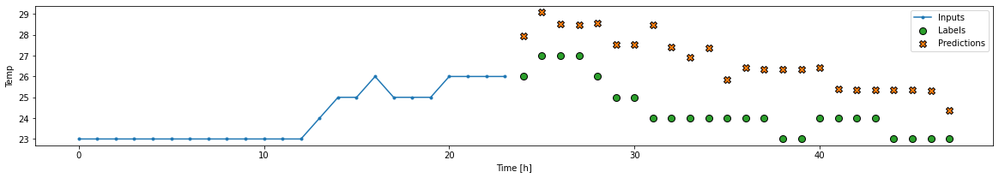

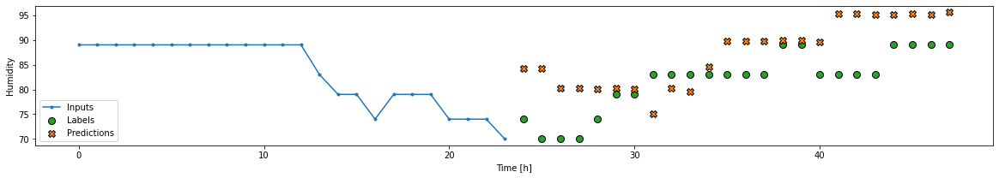

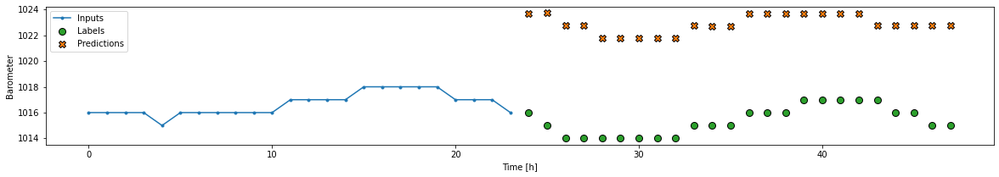

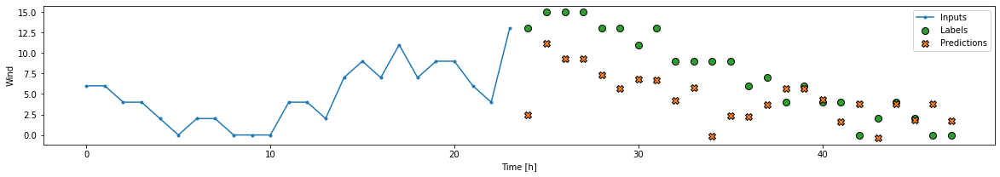

In [33]:
multi_window_list[0].plot(multi_conv_model,plot_col='Temp')
multi_window_list[0].plot(multi_conv_model,plot_col='Humidity')
multi_window_list[0].plot(multi_conv_model,plot_col='Barometer')
multi_window_list[0].plot(multi_conv_model,plot_col='Wind')

#### 2.Model Dense

In [34]:
history = compile_and_fit(multi_dense_model, multi_window_list[0])

Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 38.8289 - r_squared: 0.9998 - mean_absolute_error: 4.3998 - val_loss: 921.8132 - val_r_squared: 0.9949 - val_mean_absolute_error: 25.8134
Epoch 2/100
1/1 [==============================] - 0s 65ms/step - loss: 816.3499 - r_squared: 0.9955 - mean_absolute_error: 23.4588 - val_loss: 137.1008 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.9300
Epoch 3/100
1/1 [==============================] - 0s 71ms/step - loss: 67.6225 - r_squared: 0.9996 - mean_absolute_error: 7.2828 - val_loss: 203.4983 - val_r_squared: 0.9989 - val_mean_absolute_error: 11.1275
Epoch 4/100
1/1 [==============================] - 0s 81ms/step - loss: 183.9370 - r_squared: 0.9990 - mean_absolute_error: 11.0970 - val_loss: 450.3250 - val_r_squared: 0.9975 - val_mean_absolute_error: 17.0081
Epoch 5/100
1/1 [==============================] - 0s 66ms/step - loss: 460.0239 - r_squared: 0.9974 - mean_absolute_error: 17.6314 - val_loss: 330.9509 - val_

1/1 [==============================] - 0s 58ms/step - loss: 0.0762 - r_squared: 1.0000 - mean_absolute_error: 0.1841 - val_loss: 23.9511 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3350
Epoch 80/100
1/1 [==============================] - 0s 61ms/step - loss: 0.1173 - r_squared: 1.0000 - mean_absolute_error: 0.2740 - val_loss: 24.0027 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3451
Epoch 81/100
1/1 [==============================] - 0s 61ms/step - loss: 0.1311 - r_squared: 1.0000 - mean_absolute_error: 0.2862 - val_loss: 23.9592 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.3083
Epoch 82/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0841 - r_squared: 1.0000 - mean_absolute_error: 0.2414 - val_loss: 23.9093 - val_r_squared: 0.9999 - val_mean_absolute_error: 3.2401
Epoch 83/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0481 - r_squared: 1.0000 - mean_absolute_error: 0.1524 - val_loss: 23.9247 - val_r_squared: 0.9999 - val_m

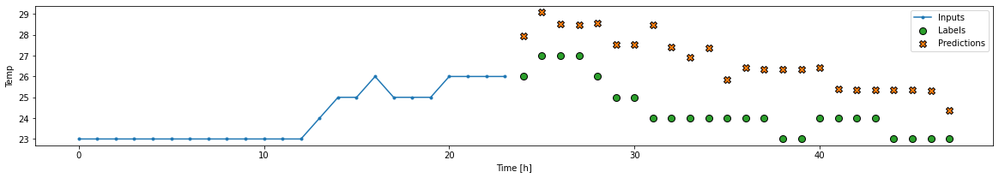

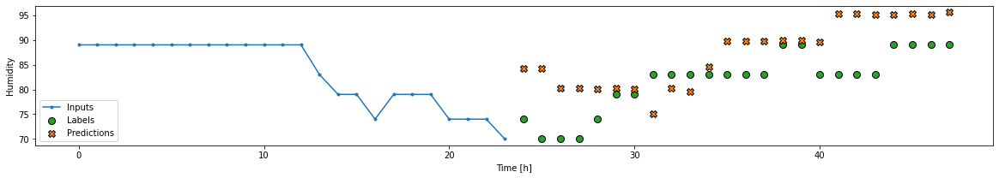

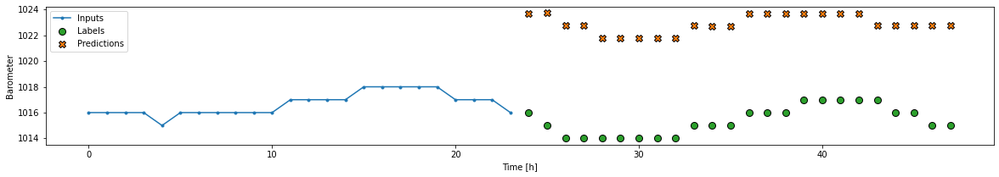

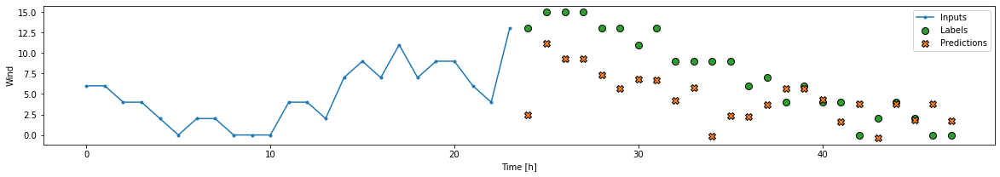

In [35]:
multi_window_list[0].plot(multi_conv_model,plot_col='Temp')
multi_window_list[0].plot(multi_conv_model,plot_col='Humidity')
multi_window_list[0].plot(multi_conv_model,plot_col='Barometer')
multi_window_list[0].plot(multi_conv_model,plot_col='Wind')

#### 3.Model CNN

In [36]:
history = compile_and_fit(multi_conv_model, multi_window_list[0])

Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 104.1929 - r_squared: 0.9994 - mean_absolute_error: 8.3025 - val_loss: 904.4337 - val_r_squared: 0.9949 - val_mean_absolute_error: 26.0189
Epoch 2/100
1/1 [==============================] - 0s 54ms/step - loss: 426.4854 - r_squared: 0.9976 - mean_absolute_error: 16.9755 - val_loss: 414.4647 - val_r_squared: 0.9977 - val_mean_absolute_error: 17.5734
Epoch 3/100
1/1 [==============================] - 0s 51ms/step - loss: 81.2896 - r_squared: 0.9995 - mean_absolute_error: 7.9427 - val_loss: 159.6849 - val_r_squared: 0.9991 - val_mean_absolute_error: 8.4428
Epoch 4/100
1/1 [==============================] - 0s 54ms/step - loss: 69.7396 - r_squared: 0.9996 - mean_absolute_error: 7.2887 - val_loss: 174.4012 - val_r_squared: 0.9990 - val_mean_absolute_error: 10.3043
Epoch 5/100
1/1 [==============================] - 0s 52ms/step - loss: 221.7287 - r_squared: 0.9988 - mean_absolute_error: 12.4496 - val_loss: 119.1192 - val_r

1/1 [==============================] - 0s 53ms/step - loss: 1.1608 - r_squared: 1.0000 - mean_absolute_error: 0.9462 - val_loss: 135.4758 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.5550
Epoch 41/100
1/1 [==============================] - 0s 65ms/step - loss: 1.3815 - r_squared: 1.0000 - mean_absolute_error: 1.0489 - val_loss: 126.3605 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.1539
Epoch 42/100
1/1 [==============================] - 0s 75ms/step - loss: 3.3217 - r_squared: 1.0000 - mean_absolute_error: 1.5261 - val_loss: 129.5139 - val_r_squared: 0.9993 - val_mean_absolute_error: 9.2153
Epoch 43/100
1/1 [==============================] - 0s 55ms/step - loss: 3.3384 - r_squared: 1.0000 - mean_absolute_error: 1.4780 - val_loss: 142.3664 - val_r_squared: 0.9992 - val_mean_absolute_error: 9.6627
Epoch 44/100
1/1 [==============================] - 0s 52ms/step - loss: 1.4922 - r_squared: 1.0000 - mean_absolute_error: 1.0418 - val_loss: 159.6264 - val_r_squared: 0.9991 - 

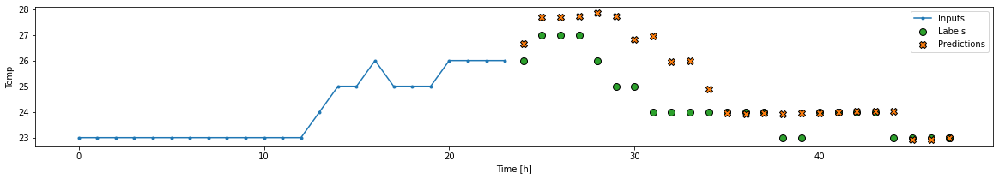

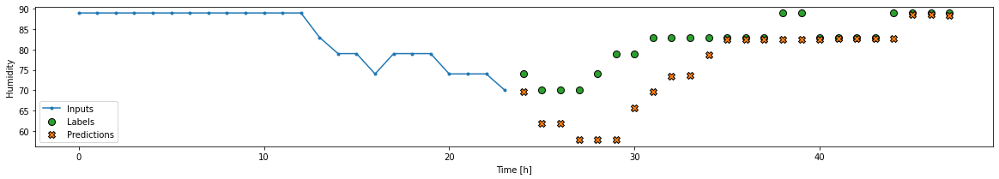

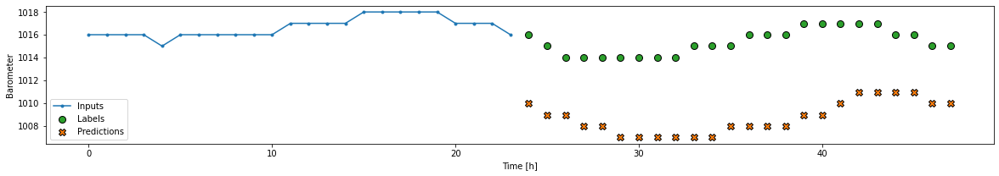

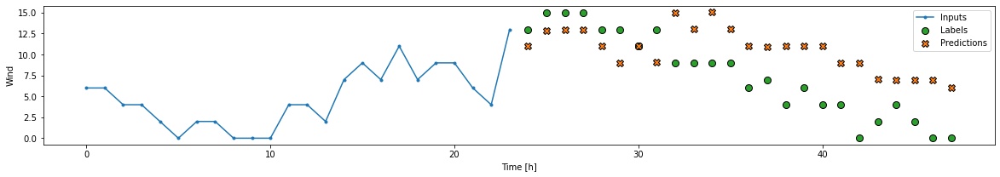

In [37]:
multi_window_list[0].plot(multi_conv_model,plot_col='Temp')
multi_window_list[0].plot(multi_conv_model,plot_col='Humidity')
multi_window_list[0].plot(multi_conv_model,plot_col='Barometer')
multi_window_list[0].plot(multi_conv_model,plot_col='Wind')